In [75]:
#Import/download prerequisites
import pandas as pd
import nltk
from nltk import WordNetLemmatizer
from sklearn.linear_model import LogisticRegression
import numpy as np
nltk.download('stopwords')
from nltk.corpus import stopwords
from bs4 import BeautifulSoup as bs
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
nltk.download('punkt')
nltk.download('wordnet')
from future.utils import iteritems
wordnet_lemmatizer = WordNetLemmatizer()
import matplotlib.pyplot as plt

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jgran\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jgran\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\jgran\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [41]:
df = pd.read_csv("Resources/weights_df")
list(df)
new_df = df.set_index('Unnamed: 0')
new_df.head()

,0
Unnamed: 0,
received,-0.172239
kingston,-0.013106
256mb,0.052863
card,0.011209
advertised,-0.121414


In [72]:
#Tokenization function
def format_review(review):
    
    #Set all words to lowercase
    words = review.lower()
    
    #"Tokenize" the words, splitting the string into separate words aka tokens
    tokens = nltk.tokenize.word_tokenize(words)
            
    tokens_lemmatized = []
    
    for t in tokens:
        tokens_lemmatized.append(wordnet_lemmatizer.lemmatize(t))
    
    #Reduce the tokens to numbers
    review_sum = 0
    for t in tokens_lemmatized:
        if t in new_df.index:
            number = new_df.loc[t].values[0]
            review_sum += number
    return review_sum
            

In [66]:
format_review("This product was terrible and I couldn't return it. Don't recommend.")

product
wa
terrible
could
n't
return
n't
recommend


-4.970006715807392

In [69]:
path = "Resources/all.review"
reviews = bs(open(path).read())
text = reviews.find_all('review_text')
rating = reviews.find_all('rating')

C:\Users\jgran\Anaconda3\envs\pythondata\lib\site-packages\bs4\__init__.py:181: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("lxml"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 193 of the file C:\Users\jgran\Anaconda3\envs\pythondata\lib\runpy.py. To get rid of this warning, change code that looks like this:

 BeautifulSoup(YOUR_MARKUP})

to this:

 BeautifulSoup(YOUR_MARKUP, "lxml")

  markup_type=markup_type))


<review_text>
I have bought and returned three of these units now. Each one has been defective, and finally I just gave up on returning the system. The DVD player constantly gives "Bad Disc" errors and skips if there is even the slightest smudge on a disc. The sound quality is very nice for the price, but since the player doesn't work, it's essentially useless. This is a complete rip-off at any price point
</review_text>

In [84]:
stripped_ratings = []
for r in rating:
    stripped = r.text
    stripped_ratings.append(stripped)

In [86]:
stripped_ratings

['\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n1.0\n',
 '\n2.0\n',
 '\n1.0\n',
 '\n

In [71]:
formatted_reviews = []
for review in text:
    formatted_reviews.append(format_review(review.text))

bought
returned
three
unit
one
ha
defective
finally
gave
returning
system
dvd
player
constantly
give
bad
disc
error
skip
even
slightest
smudge
disc
sound
quality
nice
price
since
player
doe
n't
work
essentially
useless
complete
rip-off
price
point
used
pack
dvd
backup
last
failed
thought
wa
software
got
new
software
guess
first
disc
new
package
bought
failed
burner
another
reviewer
suggested
implying
people
learn
read
brand
new
doe
n't
require
firmware
upgrade
mention
suck
high
failure
rate
consensus
seems
tdk
sony
best
buying
save
frustration
bought
disc
compusa
needed
got
one
ordered
online
well
wated
good
buck
disc
got
one
burned
good
much
bang
buck
burned
many
disc
never
memorex
usually
verbatim
ridata
mam
disgruntled
disc
making
coaster
maybe
burner
n't
like
whatever
case
n't
buy
ever
thought
memorex
made
good
product
dvd
burned
successfully
showed
movie
excellent
quality
problem
every
good
burn
get
one
bad
one
using
plextor
dvd
burner
love
going
try
luck
different
dvd
brand
failu

bought
stereo
relatively
small
size
stylish
appearance
aux
input
hook
mp3
player
first
unit
received
would
turn
contacted
philip
tech
support
solution
wa
send
brand
new
defective
stereo
back
expense
fortunately
amazon
ha
nice
return
policy
sent
back
instead
amazon
wa
also
nice
sending
replacement
right
away
without
waiting
received
defective
unit
replacement
stereo
arrived
short
order
wa
immediately
disappointed
sound
quality
n't
seem
good
year
old
cassette
player
boombox
wa
replacing
listening
stereo
day
comparing
sony
cmt-ne3
bookshelf
stereo
thought
reception
good
cmt-ne3
unit
thin
wire
type
antenna
wire
length
philip
stereo
however
would
hiss
crackle
moved
around
room
body
interfered
reception
happen
sony
stereo
sound
quality
good
cmt-ne3
playing
song
side-by-side
two
stereo
found
philip
stereo
flat
tinny
sound
compared
cmt-ne3
sony
system
much
fuller
richer
sound
quality
also
seemed
significant
distortion
high-frequencies
philip
stereo
making
sound
sound
like
sound
also
noticed
oc

16x
dvd
put
burner
read
something
wrong
dvd
burner
one
newest
16x
burner
looking
16x
buy
one
day
since
sandisk
512mb
transflash
card
wa
shipped
emartbuy
still
received
order
contacted
emartcrap
could
tell
wa
shipped
sure
flash
card
work
great
hope
receive
becomes
obsolete
avoid
emartbuy
cost
n't
settle
incompetency
better
paying
higher
price
better
service
...
correction
service
cosmetically
pleasing
good
thing
say
unit
included
software
doe
contain
virus
included
software
reminate
late
80
early
90
tablet
doe
work
win2000
winxp
second
edition
stop
responding
quite
frequetly
unplug
plug
unit
back
get
respond
unit
would
great
came
year
ago
get
pay
problem
burning
disc
went
back
month
later
disc
found
none
work
anymore
research
found
memorex
us
cheapest
dye
available
thus
dvd
absolutelly
life
disc
started
dying
month
addition
physically
hold
disc
hand
feel
warped
physically
ha
become
true
disc
150
recommend
product
stronly
enough
machine
doe
fine
quick
cleaning
cd's/dvd
n't
give
complete


bunch
charger
instead
good
old
time
one
wa
enough
amazed
review
highly
favor
product
terribly
uncomfortable
ear
n't
really
provide
great
listening
experience
frequency
response
seems
muted
use
largest
possible
surround
become
distractingly
uncomfortable
course
experience
mileage
may
vary
say
personally
found
apple
ipod
'phones
better
disappointed
product
wa
suppose
write
weekend
two
rear
speaker
stop
working
also
remote
control
replace
battery
still
doe
work
n't
rear
speaker
try
system
pleasy
thank
epiphane
flaviu
verbatim
ha
burned
well
100
recording
fail
operate
least
different
dvd
player
problem
burning
disc
went
back
month
later
disc
found
none
work
anymore
research
found
memorex
us
cheapest
dye
available
thus
dvd
absolutelly
life
disc
started
dying
month
addition
physically
hold
disc
hand
feel
warped
physically
ha
become
true
disc
150
recommend
product
stronly
enough
medium
work
brand
new
asus
burner
even
updating
firmware
capture
analog
video
produce
cd-rom
expected
ability
produ

cosmetically
pleasing
good
thing
say
unit
included
software
doe
contain
virus
included
software
reminate
late
80
early
90
tablet
doe
work
win2000
winxp
second
edition
stop
responding
quite
frequetly
unplug
plug
unit
back
get
respond
unit
would
great
came
year
ago
get
pay
recently
bought
installed
norton
caught
virus
install
cd
past
burn
dvd
burn
successfully
use
roxio
cd
creator
version
doe
great
job
cd
pretty
sure
dvd
medium
wasting
money
time
well
've
tried
lower
burn
speed
doe
matter
try
something
else
ordered
recommendation
another
amazon
customer
wasnt
impressed
though
would
save
money
buying
new
copy
favorite
cd
scrathced
cleaned
disc
ran
three
process
without
successful
result
didnt
seem
make
much
difference
disc
dont
think
good
repairer
disc
thats
mildly
scratched
suggestion
would
replace
damaged
disc
buying
another
copy
cd
dvd
amazon
many
cd
replaced
7-10
buck
wish
wouldve
kept
sure
got
lemon
would
never
purchase
player
worked
right
time
found
time
would
confuse
change
disc
bu

feel
flimsy
fooled
flashy
metallic-looking
picture
plastic
shell
device
quality
mcdonald
toy
one
would
think
300
company
would
least
commission
manufacturer
leave
plastic
whisker
hanging
rim
due
bad
cutting
button
hard
press
order
turn
device
press
firmly
risky
thing
considering
cracking
delicacy
shell
cable
port
docupen
also
extremely
flimsy
hold
cable
firmly
place
order
downloads
take
place
otherwise
connection
lost
pre-medical
student
stupidly
invested
lot
money
product
believing
could
second
page
100
page
per
disk
scan
science
textbook
library
including
colored
diagram
way
thought
would
make
back
investment
since
textbook
go
least
100
however
see
belief
wa
naive
say
least
docupen
extremely
difficult
use
word
come
distorted
like
jammed
fax
machine
although
free
paper
port
software
come
complimentary
docupen
rather
useful
annotating
pdf
docupen
doe
produce
text
legible
enough
annotate
furthermore
downloading
slow
least
second
per
page
fast
computer
since
n't
see
scan
turned
load
comp

shoulder
one
another
could
hear
least
tech
support
people
communicating
client
made
difficult
lady
helping
needed
ask
repeat
sheesh
must
read
phone
number
least
time
got
right
one
last
interesting
tidbit
packaging
mention
nero
recode
went
nero
site
check
nero
ha
list
supported
medium
player
listed
know
d-link
one
return
d-link
junk
purchase
one
nero
certified
product
instead
bow
head
shame
read
review
bought
product
anyway
wa
right
...
passed
wa
pain
configure
none
setting
would
stick
whenever
changed
default
password
would
never
let
log
back
camera
without
reset
kind
defeat
point
returning
item
get
something
decent
money
saved
worth
bad
customer
service
almost
month
still
received
product
ive
sent
email
called
twice
noone
really
helped
anything
neither
anyone
answer
phone
dont
even
know
rate
item
dont
pretty
sure
really
nice
ive
waiting
almost
month
getting
frustrating
help
'll
end
looking
something
better
sound
fidelity
pretty
bad
reason
thing
buck
absolute
junk
put
cassette
player
c

code
olathe
kansa
maybe
another
manufacturer
let
import
poi
way-points
people
file
n't
waste
money
directv
lnb
signal
wa
low
signal
wa
le
transponder
signal
caused
choppy
picture
picture
watching
bought
amplify
satellite
signal
actually
attenuated
signal
signal
strength
wa
n't
improved
non
receiver
well
n't
matter
put
relation
dish
receiver
headphone
sound
great
arguement
however
wa
removing
plastic
tip
need
changed
every
several
month
headphone
broke
company
ha
one-year
warranty
wa
out-of-luck
thought
sound
wa
great
price
would
expect
durable
...
wa
hardly
touching
broke
also
earpiece
bit
uncomfortable
time
received
radio
yesterday
returning
radio
today
plus
...
adequate
lcd
display
good
illumination
adapter
good
thumbwheel
tuning
khz
increment
adequate
speaker
fidelity
small
radio
however
volume
slew
button
set
numbered
volume
level
setting
5-6
big
noticeable
increase
volume
good
tuning
shortwave
band
every
approx
100khz
increment
appears
area
signal
meter
read
signal
received
quiet


home
...
spent
hour
trying
keep
battery
certain
position
clock
would
stay
connection
appear
sensitive
battery
doe
n't
stay
place
clock
light
pointless
supposed
help
see
time
dark
unless
clock
certain
angle
everything
appear
blurry
actually
screen
blurry
position
even
light
alarm
pretty
quiet
're
sound
sleeper
live
noisy
environment
clock
'll
hear
alarm
sleep
ear
final
note
product
clock
ha
almost
hour
without
problem
...
battery
cover
slightly
open
close
cover
way
clock
shuts
want
alarm
clock
last
awhile
suggest
buying
something
else
get
le
pay
model
wanted
convert
laserjet
plus
networked
printer
even
though
instruction
manual
wa
followed
printer
work
customer
support
claimed
24/7
one
ha
closed
help
desk
ticket
yet
product
cost
linksys
router
customer
naturally
expect
better
customer
service
better
response
time
1gb
titanium
sandisk
cruzer
work
fail
tried
several
time
contact
sandisk
including
selling
vendor
absolutely
response
wife
cruzer
failed
well
power
light
come
recognized
light


computer
know
n't
re-authorize
computer
use
manually
go
find
remove
computer
lot
hidden
file
conclusion
experience
software
would
kept
player
used
type
inexpensive
wireless
mic
others
tried
much
better
sensitivity
touch
mic
lip
herd
better
choice
even
price
range
purchased
8gb
creative
zen
plus
player
first
week
february
today
march
6th
returning
package
arrived
amazon
loaded
software
computer
hooked
player
usb
cord
let
charge
hour
like
instruction
state
proceeded
load
music
onto
player
music
wa
loaded
disconnected
player
usb
cable
started
listen
music
sound
quality
wa
good
player
easy
navigate
menu
etc
...
problem
wa
half
music
uploaded
wa
player
could
see
folder
menu
option
artist
genre
actual
file
wa
plugged
player
back
usb
cord
pulled
file
location
player
computer
file
wa
could
play
fine
window
medium
player
tried
access
player
wa
accessed
computer
fine
song
4,500
mp3
format
56kps
audio
book
192kps
song
ripped
cd
player
would
n't
read
half
song
wa
really
rhyme
reason
whish
song
wou

great
work
great
tiny
pain
rump
use
narrow
width
wise
length
wise
samsung
sph-a900
samsung
fully
opened
still
smaller
phone
want
small
sleek
mobile
phone
phone
impractical
using
long
period
home
're
1/3
larger
excellent
maybe
great
phone
woman
also
doe
plug
headset
returning
mine
amazon
leave
feedback
kind
amazon.com
time
wa
listening
car
audio
today
wa
compelled
leave
one
others
product
probably
worst
electrical
equipment
bought
mp3
player/audio
system
sound
reproducing/transmission
mp3
player
car
audio
inferior
quality
doe
balance
well
low/high
frequency
sound
resulting
dampened
sound
absolutely
clarity
mine
worked
first
several
hour
assume
think
damaged
speaker
sound
like
going
rip
apart
someone
else
left
review
explaing
trouble
ignored
wa
mistake
n't
buy
wait
ha
week
received
monthly
email
today
pushing
delivery
date
another
30
day
one
big
difference
item
listed
available
money
agreed
pay
back
november
amazon
way
making
take
walk
give
circuit
city
worked
terrible
product
get
print


sound
message
received
tried
record
greeting
number
way
sounded
awful
portable
tv
sound
great
except
made
mistake
design
n't
tell
antennea
tv
work
without
antennea
portable
dvd
player
great
tv
horrible
get
antennea
tv
worked
went
numerous
store
antenneas
found
big
bulky
plus
hooked
unhooked
wanted
put
unit
away
without
antennea
sticking
get
broken
n't
buy
tv
ended
purchasing
different
product
antennea
built
one
wa
total
waste
money
product
doe
work
view
review
every
card
manually
correct
extracted
information
case
much
different
entering
information
manually
character
recognition
software
ha
long
way
go
effective
doe
even
recognize
wireless
mobile
phone
number
one
would
think
would
get
right
version
year
good
thing
scan
card
throw
away
still
spend
amount
time
entering
information
hand
like
others
wa
pleased
initially
quick
installation
router
since
familiar
linksys
product
working
web
utility
configure
router
snap
wa
running
inside
minute
signal
strength
wa
awesome
imac
connected
wirel

case
tape
deck
whirred
bit
ejected
smartdeck
buy
c340
doe
n't
fit
amazon
n't
market
nightmare
get
returned
get
refund
also
true
cigarette
lighter
adapter
hope
clarity
accessory
go
model
otherwise
'll
lot
wasted
time
money
garmin
great
fact
accessory
compatible
within
product
family
huge
problem
disaster
supposed
work
conjunction
cordless
phone
extension
work
desk
phone
work
cordless
phone
wanted
desktop
phone
every
desk
cordless
convenient
extra
feature
every
office
stuck
using
clumsy
cordless
handset
informed
purchased
installed
phone
mention
hold
'music
manual
product
mess
stay
away
get
real
phone
system
last
panasonic
4-line
debacle
...
key
failes
month
handset
yikes
lot
choice
market
forced
buy
new
edition
panasonic
phone
bad
could
figured
figured
build
decent
handset
buy
well
handset
probably
took
foot
base
lost
signa1
called
panasonic
course
customer
service
probably
never
seen
phone
suggested
unplug
battery
...
heaven
sake
hang
call
back
next
person
educates
5.8
ghz
mean
clearer

design
issue
would
nice
able
access
music
id3
tag
i.e
artist
genre
song
title
take
long
time
start
generally
~20
second
minute
changed
music
nice
delete
music
player
without
connect
computer
instance
shuffle
come
across
something
never
want
hear
however
interface
wa
inconvenient
including
audio
playback
stopping
long
lag
time
rarely
used
feature
practice
earbuds
come
n't
stay
ear
well
bought
new
one
good
thing
loved
fact
radio
voice
recorder
reason
bought
easy
access
hard
drive
computer
without
software
needed
large
storage
capacity
proved
fully
necessary
change
playback
mode
single
button
press
shuffle
versus
ordered
song
versus
current
folder
basis
comparison
've
also
owned
creative
zen
jukebox
liked
lot
sold
wanted
radio
voice
recorder
iaudio
currently
used
fourth
generation
ipod
ha
working
well
far
except
occasional
quirk
trusty
archos
player
display
broke
figured
upgrade
get
60gb
iaudio
journalist
interview
wa
also
giddy
get
line-in
record
interview
straight
mp3
friend
mine
love
p

seems
like
great
idea
however
come
attatchments
i-pod
reason
bought
called
company
get
adapter
need
mfg
part
number
ha
hassle
pack
poorly
half
shattered
beyond
repair
upon
arrival
've
found
befsx41
v2.0
problematic
firmware
version
1.50.18
distributed
network
software
bittorrent
cause
router
reboot
every
minute
bringing
entire
net
newer
firmware
version
1.52.10
fix
problem
within
day
start
block
deny
connection
web
server
passthru
tcp
port
80
making
router
totally
unusable
tech
support
wa
friendly
helpful
solution
could
come
wa
rollback
firmware
1.50.18
website
upgrade
time
1.52.10
whenever
need
distributed
networking
upgrade/downgrade
firmware
sometimes
several
time
single
week
time
brings
net
've
also
found
setup
option
restrictive
compared
brand
assign
static
ip
local
computer
specifying
mac
address
instead
need
set
ip
computer
manually
make
thing
difficult
laptop
need
static
ip
also
appears
map
two
different
external
port
internal
port
number
even
though
map
two
different
computer


number
look
sharp
clear
customer
image
wickedpete
much
realistic
number
wash
interesting
customer
image
show
orange
green
backlights
reversed
manufacturer
image
unit
got
think
would
slight
improvement
one
got
orange
backlighting
alarm
time
twice
bright
green
backlighting
current
time
look
weird
also
radio
reception
quite
poor
line
cord
supposed
serve
antenna
doe
n't
work
well
matter
orient
cord
n't
tune
strong
station
mile
away
back
go
wa
disappointed
got
south
america
went
curl
hair
nothing
happened
take
look
product
specification
ha
limited
use
appliance
500
1600
watt
two
different
curling
iron
one
wa
rated
watt
125
watt
sure
appliance
converter
wa
designed
take
recommendation
buy
converter
tumi
instead
twice
price
one
piece
easy
travel
work
many
different
type
appliance
satisfied
cartrige
never
printed
color
red
even
cleaning
many
many
time
never
buy
another
cartrige
paying
twice
price
one
work
better
investment
radio
boom
box
worked
cd
player
work
return
repaired
replaced
back
yet


get
email
response
wa
told
would
watch
credit
card
need
know
sometimes
buy
brand
think
great
thing
wonderful
company
one
day
dealing
realize
wrong
going
back
sony
let
tell
amazon
customer
service
blow
away
every
company
've
dealt
sorry
preposition
bought
amazon
glad
purchased
cardscan
700
significant
unfortunate
missed
opportunity
important
function
done
impression
best
product
market
due
scanning
property
quite
good
serious
deficiency
though
rest
software
would
nice
fixed
case
render
device
somewhat
useless
since
output
transferred
useful
place
pro
doe
pretty
good
job
scanning
algorithm
well
developed
actually
quite
impressive
even
card
catch
rotate
go
producing
funny
smeared
image
content
scanned
correctly
superiority
recognition
software
strong
point
product
also
database
management
product
one
use
maintain
look
card
operationally
product
especially
nice-
sit
feeding
card
typing
carriage
return
one
glancing
screen
catch
error
card
image
retained
record
cardscan
database
important
co

adapter
install
took
tcpip
stack
even
wired
connection
took
full
day
figure
needed
remove
sign
linksys
odyssey
funk
software
registry
remove
reinstall
tcpip
stack
linksys
support
could
n't
even
get
promised
registry
cleaner
day
dozen
email
separate
phone
call
linksys
support
embarrassing
n't
caught
depend
purchased
card
year
old
toshiba
laptop
ha
wireless
card
thought
time
go
faster
connected
various
access
point
first
week
could
get
connect
internet
would
see
network
would
connect
installing
latest
driver
connected
internet
however
even
show
stronger
signal
laptop
card
slow.plus
see
network
could
see
laptop
card
tech
guy
kind
advice
help
disappointed
title
review
thing
worked
week
would
n't
power
anymore
chinese
junk
purchased
cable
pin
weak
clumsy
could
even
plug
one
pin
broke
threw
away
piece
junk
wa
wrongly
advised
tech
support
buy
instead
waiting
new
supply
power
supply
voodoo
sure
computer
supported
targus
tech
n't
give
info
voltage
amperage
wattage
thing
n't
safely
maake
work
un

paper
could
find
photo
paper
store
ended
buying
second
package
get
paper
next
time
make
book
using
ofoto
site
much
professional
looking
2-sided
cheap
bought
cable
connect
plasma
tv
computer
connected
cable
tv
could
get
display
computer
screen
spent
hour
plasma
manufacturer
telephone
troubleshooting
connection
end
dissapointment
found
cable
wa
defective
tried
different
cable
everything
worked
functionally
ifm
great
like
use
workout
gym
watch
transmitted
tv
however
construction
extremely
cheap
bought
two
fell
apart
one
fell
apart
second
time
used
construction
cheap
could
n't
put
back
together
control
n't
line
wish
wa
alternative
n't
find
one
like
able
switch
ipod
tune
carry
two
device
received
printer
trying
set
realized
computer
printer
cable
included
explanation
kind
need
bail
setup
solve
little
dilema
price
reflects
quality
poor
sound
quality
feature
easy
use
n't
waste
mone
first
got
camera
wa
satisfied
complicated
use
definitely
intuitive
doe
much
button
need
scroll
endless
screen
ti

linksys
ha
never
released
firmware
update
doe
n't
appear
combo
cable
gateway
wireless
router
seems
like
dream
come
true
instead
fail
heed
warning
purchase
item
'll
subjected
nightmare
end
seek
another
wireless
solution
cable
gateway
wcg200
performs
expected
setup
isp
cox
southern
california
wa
breeze
wa
running
time
wireless
connectivity
however
ha
absolute
nightmare
none
device
laptop
bridge
print
server
stay
connected
length
time
router
performing
well
lucky
stay
connected
hour
router
performing
poorly
barely
stay
connected
second
linksys
forum
crowded
user
reporting
problem
've
unable
find
official
acknowledgement
response
linksys
favor
avoid
wcg200
regret
purchasing
brought
home
took
box
rather
impressed
sleek
design
cisco
label
got
hooked
dream
surfing
internet
speed
light
turned
nightmare
constant
connection
drop
tech
support
read
board
linksys
site
'll
see
end
connection
failure
across
many
different
isp
area
since
item
ha
released
please
n't
waste
money
worthless
hunk
garbage
'

response
wa
frankly
terrible
keyboard
lagged
several
character
behind
typing
fitting
cable
wa
simply
possible
buy
n't
even
think
sure
product
fine
n't
order
amazon
ritz
camera
cancelled
order
without
warning
listed
bag
wa
available
freaking
idiot
bought
headphone
replacement
second
pair
blown
ipod
earbuds
hoping
get
stronger
bass
better
sound
isolation
got
unfortunately
sound
coming
headphone
extremely
muddy
overly
bass-heavy
furthermore
quite
painful
ear
first
several
time
wore
mini-jack
ha
poor
connection
often
leaving
without
sound
one
ear
favor
spend
money
get
quality
pair
headphone
particularly
're
looking
buy
in-ear
headphone
bought
terk
antenna
attempt
pick
radio
station
wa
struggling
new
bookshelf
stereo
system
perhpas
apartment
building
quality
stereo
antenna
n't
offer
much
success
picking
station
better
factory-provided
antenna
notice
improvement
static
lack
station
already
tuning
fairly
well
went
great
excellent
station
tuning
poorly
got
better
terk
antenna
overall
wa
probab

rear
unit
received
ha
slightly-flawed
location
nub
intended
insert
ground
hole
recepticle
outlet
nub
slightly
high
preventing
plugged
top
outlet
nub
'll
work
bottom
outlet
see
little
reason
plastic
protruding
nub
exist
first
place..
purchased
allsop
26625
dvd/vhs
organizer
floor
loaded
dvd
wa
going
move
load
next
batch
picked
floor
two
came
apart
dropping
dvd
floor
knowing
weak
tried
hold
next
one
together
pressed
little
hard
opposite
corner
two
corner
gave
way
hand
came
together
scattering
dvd
floor
looking
piece
came
apart
saw
hook
molded
plastic
supposed
snap
ridge
next
piece
hook
shallow
hold
strain
holding
dvd
facing
upward
box
emailed
manufacturer
bought
box
asked
since
would
time-consuming
send
back
costly
would
offer
kept
glued
corner
together
absolutely
response
ended
spending
two
evening
snapping
box
apart
glueing
112
attachment
point
reassembling
think
would
purchased
knew
poorly
manufactured
good
thought
allsop
customer
service
pny
memory
specific
product
check
re-check
spe

ipod
justice
look
cheap
applied
-after
day
product
already
looking
replace
guess
bad
review
owing
bad
item
description
bat
quality
turn
universal
ipaq
stylus
set
make
sure
ipaq
combatible
router
ha
operation
week
functioning
correctly
pleasure
use
unfortunately
requires
almost
daily
power
cycling
keep
running
idiot
light
show
normal
operation
wired
wireless
connectivity
power
cycled
device
worked
great
short
span
time
week
stopped
working
returned
amazon
received
new
replacement
worked
fine
stopped
working
great
idea
weak
quality
received
item
proved
defective
returned
original
item
amazon
ha
promising
would
ship
replacement
month
ha
failed
make
estimated
ship
date
right
looking
another
source
cancel
order
ad
description
clearly
state
includes
receiver
transmitter
received
receiver
false
advertising
patently
illegal
ought
ashamed
themrselves
purchased
one
shy
three
year
ago
feb
2003
taken
good
care
stay
pocket
briefcase
use
used
several
time
week
teach
time
silver
finish
wore
around
bu

unit
wa
ready
scream
time
wa
amazon
return
policy
timeframe
refused
give
refund
repeated
attempt
even
sent
letter
telling
please
send
refund
check
another
unit
post
experience
amazon
course
got
replacement
unit
reply
've
got
get
rid
thing
onebay
whatever
take
loss
move
would
never
buy
another
d-link
product
would
avoid
thing
like
anthrax
weaponized
anthrax
bought
iomega
na
unit
work
well
ha
multiple
drive
raid
though
cost
provides
decent
value
work
d-link
ha
lot
learn
customer
service
release
beta
untested
product
consumer
market
shame
say
support
mac
package
however
doe
n't
support
made
support
mac
file
allow
wider
use
character
naming
file
instance
drag
folder
icon
copy
start
copying
come
file
ha
named
ilegally
us
prohibited
character
say
copy
file
give
prompt
choice
click
clicking
job
terminates
partially
copied
folder
compatibility
delivering
backup
assurance
feel
swindled
product
ha
geeky
feel
also
lot
acronym
geek
speak
mine
probably
become
landfill
written
expensive
education
re

stopped
functioning
mysteriously
*would*
work
reverse
wish
read
people
review
bought
horrible
waste
money
purchased
shredder
month
ago
use
around
house
unsolicited
credit
card
offer
never
careful
protecting
identity
theft
first
worked
like
charm
suddenly
started
jam
reason
take
good
care
electronic
stuff
surprised
shredder
stodecided
stop
working
last
week
added
sheet
paper
shredder
broke
useless
placed
order
kingston
memory
stick
order
cancelled
without
explanation
lousy
customer
service
beware
kingston
rebate
course
hope
experience
would
differ
buy
kingston
product
mine
wa
terrible
bought
kingston
compactflash
card
offered
mail-in
rebate
promptly
day
received
item
delivery
went
photocopy
rebate
certificate
upc
code
sale
receipt
sent
merry
way
yes
wa
well
within
rebate
period
purchase
postmark
date
purchase
wa
valid
retailer
think
huge
online
e-tailer
rebate
required
sending
entire
original
upc
label
wa
like
entire
outside
package
card
size
business
card
flattened
problem
two
month
la

let
set
password
meaning
bandwidth-thieving
neighbor
tried
log
would
setting
password
would
effectively
locked
wireless
also
came
without
user
guide
though
listed
box
content
cd-rom
also
wa
supposed
user
manual
clicked
user
manual
tab
nothing
came
wa
said
done
manage
get
system
connected
window
2000
would
connect
even
cable
wa
working
fine
linksys
direct
cable
overall
painfully
long
installation
wa
window
2000-compatible
perhaps
firewall
problem
item
left
package
big
step
ease
installation
router
n't
bad
enough
signal
strength
wa
improvement
linksys
router
wa
replacing
belkin
sorry
product
wa
previous
standard
one
going
back
best
buy
wanted
earbuds
zen
player
fit
ear
would
n't
fall
earbuds
fit
ear
however
month
starting
use
one
channel
went
sound
coming
one
earbud
also
idea
called
high
quality
earbuds
unless
wa
sale
tactic
sound
quality
good
sound
original
zen
earbuds
back
using
original
bud
lighter
pocketbook
wa
dissatisfied
purchase
bought
samsung
model
september
superior
picture
exc

screen
flip
every
seven
minute
stop
remove
belt
clip
take
battery
back
reboot
...
happens
minute
later
product
becomes
real
distraction
instead
enhancement
outdoor
activity
...
wind
thinking
great
wa
radio
worked
spoke
three
garmin
rep
denied
knew
problem
one
told
wa
complicated
piece
equipment
occasional
crash
expected
every
seven
minute
come
window
wa
stable
finally
got
guy
phone
said
yeah
problem
530
avail
local
return
policy
send
n't
make
promise
explained
issue
electric
signal
lcd
said
trying
develop
firmware
solution
reading
review
guess
've
unsuccessfully
working
one
year
...
multiple
software
release
holding
breath
working
firmware
repair
've
certainly
bought
product
bug
got
better
firmware
release
linksys
router
instance
palm
treo
router
generally
stable
400
phone
frankly
reset
router
every
four
month
product
really
bad
wish
better
concept
great
would
strongly
urge
anyone
considering
purchase
keep
money
save
headache
gadget
inclined
person
wa
given
gift
wa
easy
install
use
say

like
everyone
else
us
instruction
lacking
speaker
work
n't
sound
good
bought
mouse
hoping
use
new
dv2000
laptop
internal
bluetooth
wa
excited
instant
view
feature
lazer
percision
however
got
mouse
connected
worked
instant
viewer
turn
instant
viewer
work
dongle
pluged
...
...
reason
bought
bluetooth
mouse
wa
order
avoid
dongle
breaking
side
laptop
top
extra
two
button
side
awkwerd
press
contort
finger
arthritus
inducing
cramp
press
nothing
like
old
microsoft
mouse
cozy
side
button
middel
mouse
button
also
annoyingly
resistant
press
order
activate
mouse
button
three
...
set
activate
amazing
instant
viewer
decent
useless
without
dongle
far
lazer
percision
noticable
kingston
lazer
mouse
seemed
preform
better
reason
gave
2/5
charger
nice
battery
good
ha
nice
brushed
aluminum
finish
feel
nice
cool
palm
make
decent
desktop
mouse
use
dongle
include
connectivity
good
percision
nice
something
recomend
laptop
user
price
overall
subpar
despite
claim
unit
take
aa
battery
unit
recieved
take
battery


minute
'll
get
customer
rep
read
useless
manual
came
drive
web
site
help
equally
useless
kit
neat
admit
come
material
needed
make
nice
little
coffee
table
book
however
kit
little
pricey
considering
page
page
page
double-sided
software
included
although
simple
easy-to-use
limiting
doe
n't
actually
feel
like
made
book
instead
though
're
preschool
bringing
picture
teacher
put
together
arrange
different
page
setup
different
theme
please
seldom
precise
one
really
want
doe
n't
help
half
theme
cutesy
scrap
book
element
look
absolutely
ridiculous
however
book
pretty
slick
make
many
many
comprimises
reason
gave
two
star
material
included
purchased
daughter
english
teacher
scrabble
lover
said
rather
book
look
word
feature
franklin
never
use
thought
took
away
mental
challenge
game
said
would
end
shelf
house
rather
paperback
scrabble
dictionary
returned
franklin
n't
even
like
idea
taking
school
kid
use
let
play
scrabble
class
purchased
rino
130
specifically
also
radio
noaa
feature
fortunately
read

buy
updated
7/3/2005
bought
new
computer
recently
burning
dvd
full
speed
supported
writer
coaster
what-so-ever
happy
product
like
many
people
written
review
researched
purchase
mp3
player
great
detail
member
family
ipod
direction
wa
heading
massive
amount
research
want
rip
thousand
song
already
cd
unit
want
ipod
let
download
song
know
purchased
player
thankfully
unit
wa
highest
rated
unit
far
wa
able
scour
internet
first
purchase
mp3
player
like
mine
buy
one
question
asked
worry
trying
buy
80
ear
bud
sound
ear
bud
come
player
unreal
crisp
clear
awsome
base
turned
player
volume
go
40.
hear
home
stereo
wife
listening
kid
running
around
house
playing
received
player
mail
today
5:30
got
home
work
6:35
transfered
114
artist
folder
4,000+
song
ripped
computer
last
week
minute
transfer
music
staging
folder
player
would
recomend
buying
cradle
help
standing
desk
stereo
plan
play
music
outdoor
speaker
pool
absolutley
buy
unit
messed
wit
couple
hour
high
performance
expectation
ha
met
bought
keyb

adapter
must
plug
hey
guy
try
without
outside
energy
source
hope
gon
na
fry
something
seems
work
fine
plugged
powered
usb
port
high
end
system
though
wattage
sprare
pci
slot
damn
7900
512
gtx
graphic
card
take
much
room
well
trade
offs
reality
extra
usb
slot
awfully
nice
extrememly
happy
one
price
delivers
well
voice
recorder
work
well
key
need
wa
record
lecture
listening
worked
well
've
gamer
almost
year
best
mouse
've
ever
owned
fast
accurate
well
formed
constructed
would
definitely
recommend
dpi
adjustment
nice
touch
prefer
corded
mouse
due
cordless
heavy
mouse
right
two
seperate
unit
one
hardwired
car
jvc
unit
hooked
directly
audio
aux
port
radio
rather
use
station
work
great
sound
quality
excellent
well
radio
old
play
8-tracks
notice
unit
tends
run
bit
warm
hot
agree
previous
review
something
jvc
need
look
perhaps
simply
matter
heat
sink-er
spec
yet
encountered
problem
jvc
unit
1.5
year
matter
commercial
free
sirius
subscription
past
year
ha
commercial
free
radio
though
news
stati

easily
yes
disk
changer
slow
maximum
volume
setting
doe
n't
seem
loud
decibal
setting
default
sound
quality
expect
theater
system
ha
flavor
hooking
xbox
directly
didnt
work
way
like
tried
rca
digital
sony
wega
xbox
patch
routed
dav-fx100
reciever
work
like
charm
even
5.1
sound
xbox
one
huge
complaint
shielding
mid
left
right
front
speaker
best
see
bit
haze
magnetic
field
front
speaker
even
elevate
center
channel
fear
would
permanently
damage
tube
tv
mention
problem
manual
front
page
middle
manual
beware
four
star
used
lexar
medium
multi
card
reader
p2120
fujitsu
laptop
via
usb
pc-card
adapter
truly
plug-and-play
without
need
driver
window
like
purchase
service
replacement
contract
electronics
need
set
back
relax
...
.your
covered
looking
inexpensive
ipod
would
recommend
appreciate
product
n't
enough
usb
port
case
plenty
port
needed
extension
cable
would
help
plugging
flash
drive
whithout
bending
plunging
cave
wire
keep
cpu
table
.the
complaint
wire
lenght
long
enough
overall
good
value

nevertheless
big
fan
memorex
're
steal
catch
sale
price
recommended
buy
flash
memory
consider
price
speed
manufacturer
vendor
got
particular
memory
stick
sonyericsson
w810i
phone
paid
extra
get
amazon
n't
always
best
price
way
confident
return
got
wrong
one
problem
card
work
fine
phone
since
usb
cable
hook
phone
n't
concerned
removing
card
use
card
reader
yet
experienced
problem
sandisk
memory
product
told
sandisk
stick
faster
sony
way
confirm
know
phone
mp3
player
camera
able
take
advantage
faster
speed
longest
process
transferring
music
phone
wa
n't
hurry
anyway
stick
come
adapter
use
older
memory
stick
format
use
128mb
stick
replaced
sony
camcorder
4mb
stick
typo
actually
megabyte
memory
stick
earphone
incredible
comprised
excellent
bass
treble
experience
everything
much
nicely
earphone
compared
ipod
headphone
excellent
unlike
raggety
thing
bought
ebay
amount
price
n't
regret
buying
sensational
earphone
two
cent
bought
sony
store
buck
two
year
ago
've
lasted
long
light
office
use
7/

ear
set
desk
...
indoors
le
would
upgrade
cable
tv
package
n't
offer
local
station
especially
free
simple
antenna
wa
told
wa
possible
quite
frankly
wa
skeptical
anymore
glad
got
sharp
ha
built-in
tuner
seriously
considered
buying
ready
tv
monitor
upgrade
cable
provider
boy
glad
n't
market
nice
tv
easy
use
provides
great
picture
would
highly
recommend
set
great
product
wa
easy
mount
look
great
thing
could
make
better
let
tv
rest
closer
wall
seen
sit
wall
two
inch
lcd
mounted
seems
pretty
heavy
mount
always
try
keep
closer
wall
every
time
come
home
wife
ha
extended
way
swung
degree
ha
n't
caused
problem
sure
well
within
design
strength
highly
reccommended
high
quality
precision
made
piece
particular
construction
thing
buy
peerless
arm
met
expectation
wa
easy
attach
back
lcd
television
equally
easy
mount
wall
read
review
another
arm
buyer
complained
many
piece
assemble
everything
assembled
except
mounting
plate
attach
back
screen
hardware
included
along
clear
complete
instruction
surprise

wood
finish
good
think
could
radio
pleasure
use
sound
better
expected
price
keeper
want
dvd
making
last
close
forever
possible
lot
research
deciding
dvd
buy
verbatim
came
durability
chose
dvd-r
format
maximum
compatibility
various
device
've
error
burning
dvd
amazon
sale
price
wa
great
're
looking
short-term
backup
medium
sure
find
cheaper
different
class
dvd
new
lcd
television
hook-up
wa
snap
difference
new
hdmi
compatible
up-scale
dvd
installed
audio
visual
difference
dvd
television
programing
amazing
cost
half
price
retail
store
happy
highly
recommended
work
perfectly
built
well
picture
look
great
sound
also
great
wonderful
type
work
computer
alot
soft
comfortable
n't
problem
carpal
tunnel
since
n't
nasty
smell
reviewer
stated
great
buy
save
lot
pain
phone
clear
easy
use
...
couple
disapointe
performs
better
unit
offered
apple
store
cost
plus
ha
indicator
light
folding
plug
handy
travel
good
deal
old
palm
m100
longest
time
used
electronic
replacement
paper
organizer
ate
battery
wa
n

could
never
get
good
reception
standard
antenna
single
antenna
doe
job
better
ever
seen
keep
mind
full
surveillance
systen
alarm
syster
phone
system
home
stereo
dozen
computer
terk
fm-50
ha
exceeded
expectation
thanks
joel
dba
pawn-plus
radio
reception
apartment
terrible
purchased
indoor
antenna
even
different
terk
model
none
helped
much
move
antenna
around
different
area
different
station
digital
radio
received
one
digital
channel
unit
however
work
great
get
every
station
want
digital
work
great
thing
would
mention
antenna
casing
bulky
're
concerned
asthetics
'll
figure
conceal
also
n't
get
additional
benefit
amplifier
antenna
worked
well
n't
need
reading
several
review
portable
speaker
decided
purchase
sonic
impact
i-f2
ipod
ha
great
sound
quality
case
durable
pack
away
easily
take
anywhere
listen
music
charging
sound
system
quite
attractive
far
best
accessory
've
purchased
ipod
mention
ha
remote
control
contrary
popular
belief
even
good
experience
one
time
needed
technical
support
r

size
perfect
dash
installation
user
friendly
installation
tested
mile
wa
expected
overall
pleased
price
quality
product
ive
owned
couple
definitely
one
better
one
one
better
substancially
expensive
work
great
mounted
dash
front
firing
speaker
ton
feature
including
scanning
weather
actually
come
handy
feature
lack
wish
ability
hook
pa.
great
loud-enough
make
're
ear
ring
thats
good
sign
bass
deep
silver
volume
dot
one
speaker
touch
sensitive
like
ipod-now
thats
cool
great
great
desktop
speaker
hook
right
ipod
worth
money
well-made
hard
case
virtually
necessity
protect
tungsten
come
flimsy
cheap
flip
case
say
mouse
pad
ha
far
exceeded
anything
hoped
first
opened
box
wa
shipped
wa
put
wa
strong
chemical
smell
chalked
something
packaging
material
turn
wa
smell
wa
coming
wa
mouse
pad
worked
shoe
factory
year
ago
wa
able
identify
smell
industrial
glue
smell
hung
around
couple
day
week
received
purchase
put
nose
close
pad
still
carry
faint
smell
industrial
glue
would
caution
allergy
and/or
as

15.4
gateway
laptop
fit
perfectly
bag
bag
pefect
purchased
dell
inspiron
6400
although
fit
wa
pretty
snug
pleased
purchase
easy
carry
everything
else
stylish
professional
excellent
service
expected
see
another
model
handbag
looked
different
picture
used
machine
month
made
use
possible
feature
however
say
basic
copying
fax
scanning
excellent
scanning
character
recognition
excellent
would
prefer
option
ala
omnipage
duplex
printing
printing
side
good
except
menu
digging
ackward
build
quality
overall
performace
excellent
print
fast
jam
feel
sturdy
ease
use
good
straight
forward
feature
excellent
loaded
capability
machine
beautiful
machine
used
come
close
save
high
end
office
machine
costing
thousand
n't
get
happy
one
've
waiting
quality
mfc
since
came
finally
satisfied
highly
recommended
great
addition
ih5
radio
could
without
able
adjust
volume
across
apartment
great
feature
travel
overseas
lot
job
little
power
strip
compact
enables
keep
one
adapter
end
plug
funky
wall
plug
use
normal
plug

card
like
older
dual-processor
system
wa
bit
skittish
using
current
internal
card
processor
us
hyper-threading
window
treat
dual
processor
bought
aurelium
instead
love
thing
bit
audiophile
sound
card
perfect
klipsch
computer
speaker
make
perfect
combination
nice
little
radio
good
sound
price
like
easy-to-read
station
indicator
love
item
bought
case
son
left
vacation
hang
seat
held
lap
layed
couch
van
boy
arranged
everything
case
battery
even
fit
wa
glad
recommend
item
case
wa
well
made
sturdy
unfortunatly
wa
small
sony
dvd
portable
player
returning
amazon
wa
quick
easy
wish
would
fit
recently
bought
sub-woofer
spent
good
deal
time
searching
interconnect
interconnects
looked
ranged
ridiculously
over-priced
questionably
cheap
knew
wanted
thx
certified
length
would
allow
freedom
sub-woofer
placement
interconnect
provided
reasonable
price
must
say
installing
subwoofer
cable
wa
perfect
choice
might
say
cost
reflects
cable
ability
provide
good
sound
wrong
good
dollar
interconnects
buy
monste

first
gps
system
kind
wa
n't
sure
expect
small
mazda
miata
wanted
small-screen
gps
overwhelm
small
dashboard
disappoint
wa
afraid
screen
would
small
perfect
n't
think
bigger
screen
would
anything
take
space
live
new
york
city
putting
car
walked
gps
unit
hand
perhaps
tall
building
slow
walking
speed
took
30
minute
initially
receive
satellite
signal
wa
convinced
wa
defective
put
dash
car
began
driving
acquired
satellite
signal
within
minute
unit
come
128mb
micro
sdcard
onto
load
state
map
one
time
ordered
1gb
micro
sdcard
along
gps
approx
amazon
loaded
north
america
one
time
eliminates
need
re-load
map
traveling
anywhere
country
worth
extra
effort
unit
quickly
moved
one
car
another
especially
rental
car
anywhere
north
america
first
test
thing
wa
complicated
underpass
overpass
northern
manhattan
bronx
wa
flawless
impossible
get
lost
thing
occasionally
've
made
turn
early
late
within
second
re-calculate
best
route
combination
voice
prompt
highlighted
route
need
go
current
next
street
top
e

way
type
slow
processing
reason
time
say
time
ha
actual
problem
rest
time
wa
able
simply
guess
needed
next
n't
matter
found
perfect
way
fixing
slow
route
calcuations
vast
majority
time
ha
n't
issue
foot
one
feature
sold
wa
fact
long
lasting
battery
wa
waterproof
quality
needed
used
hiking
catch
turn
lock
road
otherwise
get
really
confusing
direction
also
difficult
program
destination
coordinate
opposed
address
done
put
address
change
everything
including
coordinate
confirmation
screen
hitting
route
boat
n't
tested
n't
boat
n't
purchased
water
based
map
overall
happy
looking
forward
map
update
wish
wa
little
faster
route
calculating
map
drawing
wa
easier
imput
exact
coordinate
point
still
better
buying/lugging
around
seperate
gps
system
received
package
within
three
day
via
super
saver
shipping
cost
nothing
printer
great
used
brother
1440
series
upgraded
impressed
printer
shoot
first
page
immediately
without
warm
light
weight
small
size
making
portable
love
bought
mp3
player
girlfriend


mids
high
seperation
good
tweek
mp3
sound
realy
dial
push
nice
tight
ear
get
best
sound
absolutely
wonderful
product
cd
player
cadillac
wa
skipping
track
wa
mess
one
use
cleaner
specially
car
player
wa
good
new
bought
cooler
dell
inspiron
tends
get
hot
work
hard
cut
time
internal
fan
kick
drastically
sturdy
yet
light
enough
bought
another
wide-screen
black
version
pavilion
ha
ram
doe
n't
work
hard
internal
fan
virtually
never
kick
case
fan
quiet
turn
on/off
make
sure
working
improvement
would
suggest
usb
port
star
perfection
daughter
happy
product
got
mp3
player
wanted
also
got
favorite
color
pink
thought
got
great
deal
ha
working
wonderfully
infact
son
jealous
younger
sister
ha
better
mp3
player
ha
samsung
bought
show
great
quality
pictue
love
great
tool
time
security
provacy
power
one
little
handy
device
apps
multiplying
quickly
next
want
full-blown
system
flash
drive
amazing
little
device
carry
every
word
excel
file
created
last
year
device
remarkable
kingston
really
better
profile


overall
construction
seems
better
n't
much
better
money
however
're
willing
spend
little
jlab
jbuds
way
go
gumys
jbuds
gumys
workout
pair
use
jbuds
everything
else
're
looking
spend
little
possible
yet
still
upgrade
ipod
bud
gumys
way
go
great
product
totally
eliminates
need
constantly
change
frequency
urban
area
great
gps
unit
doe
supposed
flawlessly
clear
easy
read
display
instruction
menu
interface
self-intuitive
degree
turn
start
using
downloads
activation
learning
required
satellite
acquisition
take
second
recalculation
miss
turn
instruction
equally
fast
accuracy
impressive
spot-on
instruction
updated
map
even
small
street
rural
area
recognized
labeled
looking
garmin
magellan
unit
thought
wa
best
unit
price
ha
largest
screen
feature
price
range
previous
reviewer
complained
misrepresentation
bluetooth
capability
completely
disagree
fact
bluetooth
feature
available
price
range
already
impressive
also
unless
buy
much
pricier
unit
none
come
dashboard
stand
manufacturer
seem
sell
optio

really
like
also
first
keyboard
used
allows
many
typing
angle
included
software
give
great
deal
control
customizing
extra
key
keyboard
even
n't
window
vista
program
gadget
key
suit
need
keyboard
ha
lag
whatsoever
big
fan
standard
3x2
key
setup
home
key
etc
small
change
using
setup
dell
inspiron
6000
laptop
software
replaced
large
volume
notification
onscreen
display
showing
volume
level
mute
etc
smaller
attractive
style
notification
gusta
curved
keyboard
also
comfortable
requires
time
effort
getting
used
n't
problem
keyboard
range
mouse
switching
wireless
intellimouse
explorer
3.0
also
made
microsoft
laser
6000
mouse
included
new
mouse
comfortable
huge
difference
noticeable
also
lighter
slide
around
little
effort
n't
like
lock
key
number
pad
set
default
display
two
option
click
'start
'log
window
would
liked
option
change
key
shut
hibernate
dialog
instead
n't
found
option
available
far
keyboard
little
bit
wider
others
n't
find
problem
different
additional
programmable
button
outweighs


trip
washing
machine
one
work
well
easy
navigate
good
sound
case
rather
cheap
one
wa
rigid
plastic
case
hard
use
make
difficult
change
battery
software
leaf
something
desired
use
window
explorer
add
song
rearrange
order
great
little
mp3
player
use
macbook
work
flawlessly
hookup
tv
via
svideo
osx
handle
supremely
well
remembering
video
setting
use
hooked
plug
video
switch
tv
setting
unplug
back
normal
use
dual
view
mode
desktop
stay
always
macbook
get
extra
desktop
space
plug
tv
quality
quite
suprising
s-video
good
100
must
anyone
ha
nice
tv
work
fine
get
really
annoying
're
using
widescreen
mac
widescreen
tv
zoom
function
plasma
lcd
tv
16:9
aspect
ratio
whereas
mac
16:10
aspect
ratio
either
cut
top
bottom
're
trying
display
massive
letter-boxing
three
month
still
n't
glitch
adapter
fault
hdmi
dvi
tv
projector
n't
bother
go
straight
dvi
mini-dvi
dvi
adapter
get
dvi
dvi
cord
dvi
hdmi
cord
tengo
una
semana
con
el
recomiendo
ampliamente
la
imagen
la
nitidez
este
monitor
son
sobresalientes


medium
size
file
fairly
real-world
usage
n't
let
dissuade
considering
lightning
higher
speed
capability
device
better
transfer
rate
le
time
take
transfer
smaller
file
prove
point
took
one
great
deal
card
speed
rating
top
36x
read
write
ran
two
test
433mb
784
medium
file
min
sec
483mb
large
file
min
sec
compared
lightning
great
deal
card
took
nearly
time
longer
write
medium
file
time
longer
write
large
file
better
deal
use
device
...
whether
shopping
card
stick
digital
camera
usb
flash
drive
performance
number
specified
beware
might
think
great
deal
may
get
device
poor
performance
regret
purchasing
know
several
drawer
bottom-line
advice
look
highest-rated
device
find
flash
device
last
looong
time
file
size
amount
data
grow
future-proof
purchase
shopping
high-rated
large
capacity
future
relationship
lexar
flash
memory
industry
solid
device
like
included
software
burningb
dvd
well
n't
problem
using
dvd/cd
burner
firewire
imac
running
mac
osx
tiger
fact
setting
drive
wa
easier
wa
recommend

environment
easy
install
security
equally
easy
set
keyboard
best
've
ever
used
backlight
excellent
key
unique
touch
soothes
finger
great
cool
design
recommend
keyboard
way
typing
right
way
say
got
code
chrismas
time
amazon
promotion
got
tv
200
perfect
master
bedroom
set
picture
great
spend
much
regular
amazon
price
expensive
brand
get
tv
problem
work
wonderfully
great
deal
free
shipping
even
time
amazon
great
purchase
amazon
499
tax
free
shipping
match
quality
price
hdmi
cable
using
comcast
digital
box
outstanding
sound
also
better
hdmi
componet
cable
jack
hard
connect
back
set
need
set
picture
manuel
mode
picture
red
preset
mode
look
like
much
color
looked
samsung
800
glad
saved
300
lcd
use
i-pod
mini
car
center
console
connects
auxillary
input
used
open
console
make
change
turn
air
click
allows
remote
leave
tray
outside
console
work
supposed
problem
solved
problem
satisfied
customer
ipod
hooked
stereo
motorcycle
ipod
stay
tucked
away
safe
place
remote
get
strapped
handlebar
needed
fu

definately
worth
unlike
previous
packpacks
strap
adjust
quickly
easily
adjust
every
time
put
pack
take
great
product
purchased
docking
station
potability
beach
pool
camping
going
nonstop
8.5
hour
set
battery
wa
still
going
strong
would
good
go
trip
know
keep
streetpilot
going
n't
bulky
made
quality
like
streetpilot
decent
mic
buck
work
adequately
ha
on/off
switch
xlr
connector
come
xlr-to-1/4
cord
're
going
plug
mic
mixer
sure
get
xlr-to-xlr
cord
volume
mic
connected
mono
1/4
jack
included
cable
wa
almost
inaudible
xlr-to-xlr
cord
wa
normal
volume
level
compared
equipment
la
instalación
del
producto
fue
bastante
simple
la
configuracion
operacion
tambien
los
son
solo
observado
problema
con
el
control
remoto
ocasiones
deja
funcionar
controla
el
volumen
cambium
los
caneles
cable
solo
despues
oprimir
el
boton
apagado
luego
vilver
activarlo
que
regresa
la
funcionalidad
los
botones
control
volumen
selector
canales
otra
observacion
el
funcionamiento
que
seleccionar
forma
progresiva
canales
es

face
make
feel
cooler
even
direct
right
front
nose
rotor
head
visible
fan
running
course
see
right
blade
fan
run
quietly
've
couple
time
fan
making
bit
noise
n't
running
quickly
normal
pop
rotor
head
adjust
blade
bit
flexible
vinyl
give
little
twist
crease
make
rigid
sometimes
get
bent
carrying
case
pop
rotor
head
back
good
new
like
product
lot
doubt
frequent
use
last
much
year
still
think
well
worth
regret
n't
order
two
three
future
back-ups
needed
light
work
well
doe
illuminate
entire
keyboard
dark
setting
doe
provide
enough
illumination
typical
user
hunt
peck
typist
may
frustrated
think
may
enough
light
kind
visibility
well
definitely
enough
light
read
book
hard
copy
document
travel
overseas
lot
job
little
power
strip
compact
enables
keep
one
adapter
end
plug
funky
wall
plug
use
normal
plug
operating
four
device
monster
product
terribly
overpriced
worth
money
wire
cable
etc
gizmo
rock
tape
exactly
searched
web
thanks
amaxon.com
listing
seler
sony
str-dg600
7.1
ha
worked
expected
hig

always
buy
memorex
dvd
storage
case
next
best
thing
think
one
come
orignal
store
bought
dvd
thanks
memorex
type
speaker
cable
use
connect
state
art
sound
system
two
fan
ordered
new
computer
build
functioning
properly
advertised
amazon
website
according
spec
site
double
ball-bearing
design
last
longer
normal
fan
warned
antec
double
ball-bearing
fan
le
expensive
one
contacted
amazon
hope
update
spec
reflect
accurately
radar/laser
detector
good
detects
police
radar
best
false
signal
doe
everything
promised
take
several
hour
going
instruction
figure
program
feature
instruction
hard
locate
booklet
took
mp3
player
store
check
earbuds
eveyone
tried
wa
terrible
ended
buying
online
read
review
especially
amazon
review
people
know
talking
bought
pair
altogether
friend
love
bud
music
listen
range
tupac
vivaldi
everything
mp3
player
ha
setting
keep
new
age
time
price
right
sound
best
lot
tv
little
money
great
picture
refresh
rate
fast
enough
prevent
blurring
tend
see
low
end
lcd
initial
setup
tric

several
month
becomes
clear
g4000
better
buy
superior
superior
separation
station
presets
warm
speaker
smaller
folk
continue
amaze
advancement
state
art
memory
amazon
purchase
delivery
dependable
like
money
bank
hope
one
come
try
improve
thing
must
admit
read
many
review
item
wa
little
apprehensive
however
...
found
recorder
outstanding
item
've
tried
far
initially
hooked
like
old
one
wa
left
hour
manually
setting
time
reading
instruction
made
thing
difficult
started
set
everything
automatic
including
time
left
next
evening
allowed
thing
magnificently
everything
worked
beautifully
great
job
love
one-touch
recording
found
best
read
direction
one
time
want
try
something
new
problem
far
n't
tried
everything
find
intuitive
bit
frustrating
use
joy
hit
tvguide
button
highlight
show
want
watch
hit
record
button
far
complaint
great
new
product
easy
use
turn
audio
ipod
portable
medium
player
even
use
record
favorite
tv
show
highly
recommend
product
price
steal
purchased
mine
shipping
let
tell
w

data-line
protection
10/100base-t
ethernet
protection
back-ups
model
ha
1-line
2-wire
phone/fax/modem
protection
back-ups
model
boost*
trim**
feature
automatic
voltage
regulation
avr
back-ups
ha
boost
input
voltage
increase
high
transfer
point
back-ups
model
go
battery
*avr
boost
ups
compensating
low
utility
voltage
ups
run
mode
indefinitely
without
negative
impact
ups
circuit
checked
qualified
electrician
utility
voltage
consistently
low
**avr
trim
ups
compensating
high
utility
voltage
ups
run
mode
indefinitely
without
negative
impact
ups
circuit
checked
qualified
electrician
utility
voltage
consistently
high
bx1500
doe
avr
trim
feature
line
voltage
higher
spec
switch
battery
power
till
line
voltage
drop
spec
range
please
note
called
backup
ups
smart
ups
line
backup
ups
doe
produce
pure
sine
wave
power
lost
take
milli-seconds
switch
battery
power
smart-ups
produce
sine
wave
output
wa
source
time
input
lost
output
interrupt
computer
backup-ups
good
enough
since
power
supply
inside
pc
a

would
definetly
suggest
always
extra
one
around
case
use
best
product
refill
manufacture
problem
print
cartridge
ruined
printer
ink
jet
cartridge
best
always
buy
great
case
problem
work
well
also
sexy
want
put
way
look
really
cool
trouble
open
sometimes
'll
make
click
sound
piece
touch
minor
doe
damage
great
item
however
intend
bang
laptop
around
lot
recommend
one
soft
outer
case
intended
protect
hard
drive
etc
protect
scratch
smudge
recommend
highly
ruining
another
pair
over-the-head
headphone
decided
check
actually
sale
've
tried
mine
audio
sharp
especially
base
though
seems
loud
old
pair
increase
volume
compensate
great
deal
feel
great
band
headphone
press
head
much
also
fold
quite
nicely
though
look
brittle
able
handle
much
stress
n't
tried
actual
noise-cancellation
feature
rest
headphone
quality
consistent
work
well
also
come
carrying
bag
probably
also
hold
mp3
player
wished
however
easily
fit
jacket
pocket
great
great
great
design
comfort
card
work
exactly
stated
startech
bought


home
though
driving
wrong
side
street
portion
route
wa
duplicate
foot
maybe
still
think
britain
star
usb
connector
attach
unit
either
way
instruction
anywhere
say
way
go
called
800
spoke
someone
new
delhi
heard
lot
told
pc
immediately
recognized
gps
file
system
removable
disk
drive
advertised
really
find
website
information
near-zero
something
elementary
covered
website
3rd
call
bought
mapsend
topo
software
interested
elevation
ha
detailed
street
map
're
routable
want
routable
street
unit
route
along
street
crow
flight
direct
path
following
car
either
get
map
product
choose
rather
frustrating
sale
information
provided
amazon
magellan
site
doe
make
critical
lack
clear
tell
n't
product
comparison
see
difference
mapsend
topo
box
say
clearly
navteq
road
street
data
like
found
expensive
car
navigation
system
non-routable
excuse
quite
like
found
expensive
car
system
concur
reviewer
find
software
selection
verbiage
amazon
magellan
obfuscating
informative
n't
someone
create
simple
comparison
c

battery
hand
wa
informed
teac
tech
support
unit
doe
contain
capcitor
retain
time
alarm
hour
n't
time
test
maximum
threshold
say
unplug
clock
minute
plugged
back
sure
enough
time
alarm
still
correct
overall
really
impressed
unit
thing
could
better
mp3
player
shuffle
option
guess
many
seen
mp3
clock
radio
without
shuffle
function
also
wish
lcd
backlight
could
adjusted
little
bit
pricey
200
heard
many
clock
radio
would
spend
350+++
get
anywhere
near
sound
quality
teac
got
wife
use
kitchen
love
unit
beautifully
designed
fun
use
ha
amazing
sound
something
small
gripe
tuner
strong
live
tough
area
reception
slight
static
favorite
station
antenna
attachment
come
unit
help
quite
bit
reception
still
totally
clear
said
glad
got
wife
happy
happy
excellent
power
conditioner
voltage
stabilizer
one.this
unit
protect
sensitive
high
end
audio
system
computer
video
moniters
...
.everyday
power
surge
power
sag
voltage
brown-outs.these
surge
pick
away
sensitive
equipment..taking
year
useful
life
...
highl

print
come
good
one
thing
watch
making
sure
ink
tape
cartridge
stay
tight
lose
start
making
bad
print
take
le
minute
pull
cartridge
tighten
start
printing
also
using
mac
osx
though
device
say
work
pc
mention
something
casio
utility
use
mac
casio
site
could
find
mentioned
utility
searching
cam
accross
...
allows
cw-100
work
fine
mac
though
never
seen
pc
software
come
printer
read
mac
version
doe
text
formating
option
enough
get
around
since
make
jpg
version
label
put
print
area
print
away
jpg
ever
image/text
want
resolution
great
print
300dpi
found
great
purchase
make
music
money
send
cd
done
print
ha
paid
allowing
make
professional
looking
cd
little
cost
great
diyer
're
anti-commercial
radio
type
tuner
probably
win
however
n't
like
paying
monthly
charge
satellite
radio
want
something
standard
am/fm
might
like
tuner
many
station
top
city
station
transmitting
signal
quality
amazing
quiet
passage
classical
music
noise
quiet
notice
hdt-1
quite
sensitive
pull
station
tuner
n't
even
talking


like
pulling
people
street
see
fought
impulse
n't
want
share
anyone
little
tweaking
menu
new
film
like
star
war
iii
sin
city
showed
incredible
detail
older
film
like
adventure
robin
hood
gorgeous
technicolor
glory
highly
recommend
hd72
great
single
vpu
video
card
cooling
system
work
great
moving
hot
air
outside
cpu
software
overclock
good
change
value
time
want
select
want
applied
game
work
game
've
tested
oblivion
1280x1024
hdr
enabled
every
option
maximum
work
great
f.e.a.r
1280x1024
aax8
ffa
price
good
high
end
video
card
unless
made
order
terk
technology
leapfrog
lf-30s
wireless
2.4
ghz
a/v
distribution
system
received
another
wireless
system
terk
point
system
working
properly
right
able
greek
tv
via
internet
desktop
via
terk
wireless
system
downstairs
living-room
tv
appliance
operational
time
saw
n't
good
resolution
n't
know
reason
distance
office
living-room
office
living-room
big
distance
anyway
track
equipment
everything
buy
one
receiver
thank
purchased
two
dozen
unit
best
unit

old
poineer
deck
taken
cd
truck
need
cd
player
take
advantage
ipod
interface
ipod
function
flawless
easy
use
plug
ipod
search
artist
album
song
title
playlist
get
little
tricky
driving
ecpecially
large
library
would
suggest
using
playlist
output
sound
quality
ipod
amazing
also
useful
bass
engine
useful
sub
function
allows
flawless
bass
output
easy
ajustment
deck
best
overall
ever
listened
've
printer
four
year
print
approximately
document
week
first
time
replace
cartridge
great
little
printer
cartridge
last
good
long
time
compared
ink
jet
printer
get
time
many
print
laserjet
price
cartridge
ink
jet
great
buy
firstoff
first
review
format
capacity
outright
wrong
let
explain
work
soundstage
program
player
us
lot
like
itunes
ha
proprietary
format
really
mp3
different
file
extension
title
import
mp3s
soundstage
library
make
duplicate
library
music
new
directory
using
'omg
file
suffix
yes
omg
think
funny
minidiscs
essentially
cd-rws
keep
mind
enjoyable
cheap
buy
rewritable
hold
80
minute
bas

plug
bought
home
depot
instead
bought
digital
extension
cable
come
different
size
etc
smaller
size
number
thicker
cable
better
avoid
loss
digital
signal
bought
size
risk
attaching
extension
cable
since
cut
original
cable
come
equipment
return
equipment
store
sell
ebay
good
price
wanted
since
considered
need
equipment
properly
set
decide
use
additional
extension
cut
orginal
wire
inch
speaker
attach
extention
cable
cut
end
run
attached
extension
cable
speaker
location
equipment
attach
end
extension
cable
end
original
cable
still
use
proprietary
speaker
plug
came
equipment
attach
back
method
make
cosmetically
suitable
one
cable
i.e
extension
run
entire
room
time
use
proprietary
plug
attached
orginal
cable
end
equipment
way
plug
fit
jacket
back
dvd
tape
exposed
electric
tape
normally
come
black
caution
need
buy
enough
length
extension
cable
though
come
length
large
room
bought
three
foot
cable
job
cost
cable
wa
wall
mounting
enclosed
wall
mounting
fixed
rotate
position
speaker
mounted
le
w

definitely
good
buy
memory
card
miss
anything
lot
space
fast
storage
shooting
sure
product
work
wonderfully
device
however
panasonic
mp3
player
product
wa
compatible
could
still
transfer
file
could
formatted
audio
support
five
megapixel
lexar
one
gigabyte
card
give
color
photograph
setting
ten
roll
film
write
time
quite
fast
really
performs
far
encountered
problem
card
stay
way
'll
get
another
one
snap
shot
burst
mode
want
take
picture
sporting
event
fast
card
like
way
go
almost
lag
large
capacity
lifetime
warranty
complaint
many
picture
store
commonly
asked
question
digital
camera
usually
question
difficult
get
straight
answer
well
considering
worked
memory
industry
year
help
question
since
changed
industry
lexar
medium
1gb
card
like
card
store
average
picture
used
megapixel
camera
image
used
megapixel
camera
512
picture
used
megapixel
camera
image
used
megapixel
camera
320
picture
used
megapixel
camera
number
based
going
shoot
image
highest
quality
setting
available
camera
understand

work
hour
row
've
spent
hour
product
several
machine
say
hardware
suck
n't
want
spend
ton
money
want
best
quality
possible
using
ad
tech
dvd
express
2.0
mainly
tool
put
show
recorded
directv
dvr
onto
dvd
quality
outstanding
quick
complaint
really
minor
thing
setting
wa
slightly
difficult
kept
getting
error
message
saying
wa
n't
receiving
signal
plug
needed
secure
message
said
...
make
sure
usb
cable
plugged
directly
mother
board
...
word
back
computer
usb
port
came
computer
instead
add
easy
enough
fix
frustrating
get
point
realize
wa
something
simple
recording
found
slightly
gray
line
top
video
ha
impact
sound
video
quality
otherwise
wish
wa
way
get
rid
make
100
pure
video
error
great
product
...
n't
look
else
look
bargain-basement
product
expect
first
expect
work
confirm
definitely
doe
work
plugged
usb
signal
correctly
driver
software
tolerant
install
time
never
resource
conflict
problem
system
recognizing
device
installation
minute
process
next
come
capture
initial
encoding
well
soft

something
consider
better
warranty
well
buck
extend
another
year
anyway
could
n't
happier
intercom
n't
recommend
given
unit
arrived
faulty
replaced
unit
slowly
failed
many
year
use
true
nature
wa
willing
spend
extra
money
brand
unfortunately
quality
unit
extremely
poor
four
unit
failed
little
one
year
light
use
failure
mode
ranged
transmit
two
unit
receive
one
unit
completely
dead
fourth
unit
...
new
battery
per
instruction
n't
waste
money
truely
wireless
remote
alert
sender
unit
run
aa
battery
n't
know
yet
long
last
mine
two
week
old
still
good
unit
movement
pass
live
country
know
someone
come
yard
would
n't
always
hear
car
drawback
pick
dog
walking
past
hour
day
night
like
unit
serf
purpose
people
may
work
advertised
nothing
get
past
without
range
said
1000
ft.
probably
correct
mine
300
ft.
fromt
reciever
unit
work
great
two
way
voice
speaker
icing
cake
love
able
yell
neighbor
dog
get
real
watch
surprise
get
voice
come
tree
le
problem
neighbor
dog
coming
yard
dazzle
perfect
used
tran

would
dust
somewhere
entire
waste
money
source
annoyance
one
real
downside
unit
backlight
really
bright
sleep
pointing
face
close
enough
reach
without
getting
setting
readable
're
still
add
control
brightness
conveniently
located
back
could
n't
reach
state
turn
back
added
feature
like
outdoor
electronics
cycling
computer
gps
unit
press
button
light
moment
go
back
preset
brightness
bottom
line
best
reliable
enjoyable
alarm
clock
've
ever
owned
durable
easy
clean
look
nice
feature
two
utterly
independent
alarm
setting
'll
need
one
addition
generous
preset
button
easy
control
really
worth
exactly
amazon
charging
suffered
clock
year
wa
gift
expensive
even
lowest
setting
blue
glow
bright
finace
say
look
like
alien
spaceship
landing
room
sound
so-so
ha
battery
backup
lose
power
second
reset
everthing
also
big
taking
1/2
nightstand
final
straw
wa
ha
trouble
tuning
even
strongest
radio
station
live
morning
finally
gave
accepted
reality
tossed
trash
n't
miss
many
disadvantage
battery
backup
eve

customer
support
weak
supposed
website
product
customer
support
replacement
part
altec
lansing
unrelated
product
second
volume
control
little
heavy
unless
somewhere
clip
might
problem
runner
purchased
headphone
needed
isolation
noise
trick
sound
quality
great
quality
headphone
first
rate
noise
isolation
good
work
plane
anywhere
noise
level
high
price
first
phone
great
want
n't
get
good
ear
seal
sound
treble
mids
natural
bass
tight
well
defined
know
bass
bass
player
year
like
live
sell
take
get
used
might
hurt
ear
deal
price
best
deal
sound
quality
sony
first
purchase
prior
using
etymotics
considered
absolute
buck
monitor
background
includes
interest
hi-fi
since
around
several
year
guitar
string
bass
piano
etc
...
...
...
...
new
champ
250
price
category
strongly
comparable
shure
negative
review
reflect
folk
little
idea
insertion
directed
front
upwards
natural
direction
ear
canal
also
n't
afraid
going
deep
hurt
demand
good
seal
good
presenting
detail
recording
driver
also
personal
choic

right
price
highly
recommend
cd/dvd
paper
sleeve
people
want
practical
alternative
jewel
case
purchased
pack
memorex
sleeve
memorex
version
similar
circuit
city
without
first
looking
price
wa
charged
7.99
plus
tax
purchased
sleeve
walmart
later
day
city
ha
great
price
many
thing
particularly
electronics
miscellaneous
item
waaaay
overpriced
true
many
item
office
max
aware
dvd
cd
sleeve
cheaper
memorex
sleeve
purchased
walmart
least
get
job
done
sleeve
fairly
light
paper
nearly
light
sleeve
dvd
stored
sleeve
flap
entire
cd
dvd
protected
simply
envelope
cd
dvd
n't
say
anything
else
except
noticed
opened
box
came
sleeve
wrapped
tightly
rubber
band
caused
somewhat
upon
removing
rubber
band
really
affect
aware
may
come
way
also
pack
white
window
front
useful
feature
let
see
without
opening
envelope
tab
back
help
keep
disc
falling
nice
touch
say
're
paper
sleeve
cd
type
person
always
buy
extra
warranty
whatever
purchase
however
started
reading
review
company
many
people
reported
wa
four
week


take
little
time
never
miss
picture
putting
anyway
basically
inexpensive
way
add
extra
insurance
getting
dirt
water
etc
front
element
walking
around
looking
shot
also
flexible
easy
stick
pouch
pocket
used
still
awaiting
resolution
problem
drive
writing
dvd
get
verification
error
drive
used
external
firewire
enclosure
drive
work
fine
internal
computer
attached
bus
issue
attached
computer
firewire
excellent
cd
burner
purchased
many
great
complaint
feel
product
best
quality
long
lasting
durable
build
computer
customer
always
purchase
burner
first
dvd
burner
first
time
used
one
amazon
merchant
concern
ordering
everything
went
smoothly
good
way
purchasing
bargain
happy
sony
dvd
burner
owned
burner
time
got
never
worked
right
must
made
coaster
decided
was'nt
medium
wa
crappy
brand
burner
wa
really
afraid
many
burner
market
claim
good
found
experience
always
true
brother
ha
older
model
sony
burner
although
slow
ha
made
handful
coaster
year
ha
owned
took
chance
purchased
sony
dru-810a
wa
best


le
half
cost
n't
really
feel
like
going
thru
warranty
claim
even
covered
still
annoys
every
time
look
xbox
'drawer
extra
stuff
wa
going
go
totally
wireless
unit
luckily
n't
run
buy
logitech
controller
instead
bought
extra
microsoft
controller
still
one
best
feeling
controller
pelican
hold
model
pl-2050
version
2.0
might
go
get
find
locally
gamer
know
good
controller
feel
horrible
controller
mean
work
well
maybe
like
week
two
time
love
...
month
break
turn
heap
crap
thats
dread
play
trigger
become
extremely
sensitive
past
point
enjoyment
swear
trigger
sensitive
gravity
playing
halo
nowhere
finger
n't
grenade
trigger
threw
grenade
spoil
good
game
halo
instant
occasionally
disconnect
receiver
make
useless
push
connect
button
receiver
take
dear
second
contoller
started
breaking
bought
normal
green
microsoft
xbox
controller
wa
breath
fresh
air
controller
...
n't
bother
picking
love
controller
small
hand
adult
pad
fit
well
like
shape
better
even
controller
shape
problem
delay
drift
n't
used


tool
action
tooldial
instant
access
mouse
location
rather
moving
menu
bar
time
great
time
saver
program
task
appear
tool
dial
clicked
moment
notice
changing
brush
size
simple
turning
tool
tuner
appropriate
brush
size
real
time
highly
recommend
speed
simplify
one
bought
first
came
mac
've
illustrator
artist
year
imac
home
pc
job
take
little
break
old
get
used
device
'll
never
go
back
love
smart
toy
got
hooked
recently
purchased
one
pc
work
anyone
think
mac
wrong
pc
version
good
become
part
left
hand
still
use
wacom
tablet
time
also
must
advanced
artist
using
computer
cross
platform
logitech
making
another
great
product
get
one
...
'll
guarantee
'll
get
hooked
logitech
big
plus
item
important
thing
really
need
processing
power
device
run
properly
first
review
really
logitech
doe
hide
fact
really
using
processor
say
right
box
using
feel
behind
bit
power
review
course
n't
perform
rigid
standard
today
graphic
professional
underpowered
box
hook
thing
updated
mac
'll
see
shine
ha
enjoy
tediou

used
option
bass
surround
sound
band
equalizer
radio
voice
recorder
surround
sound
enhance
-the
ability
play
video
hour
battery
hour
charge
time
-very
powerful
normally
listen
level
le
volume
level
equal
lesser
mp3
player
easy
program
use
transferring
type
file
iaudio
drag
drop
system
took
seven
minute
transfer
3.5
gig
music
need
included
box
earphone
usb
2.0
transfer
cable
another
cable
port
attachment
bottom
player
charger
software
storage
space
used
store
much
mp3s
negative
attribute
iaudio
however
-the
glaring
problem
wa
in-ear
headphone
fit
way
uncomfortable
also
length
cord
consider
average
size
ear
canal
imagine
major
problem
user
suggest
cowon
completely
brand
unknown
price
may
scare
away
even
feature
review
place
online
buy
mp3s
player
however
read
somewhere
would
soon
one
like
itunes
first
mp3
player
extremely
happy
purchase
even
price
would
rather
pay
quality
iaudio
around
outstanding
medium
player
believe
start
make
name
word
get
rate
everything
came
box
would
give
earphone

seems
like
people
sitting
item
buyer
either
love
hate
wa
leaving
trip
hoped
itrip
would
arrive
could
use
drive
luck
would
wa
day
left
went
vehicle
test
plugged
20gb
ipod
photo
right
bat
thought
trouble
would
n't
power
tried
plugging
unplugging
cleaning
contact
finally
last
resort
read
instruction
plugging
play
song
power
immediately
many
complain
right
box
set
frequency
lowest
available
band
instant
music
n't
live
extremely
area
n't
really
comment
station
bleeding
loud
passage
loud
quiet
passage
quiet
many
reviewer
complained
bad
sound
quality
must
remember
doe
n't
matter
great
quality
song
ipod
playing
radio
never
sound
better
radio
father
work
car
retired
ha
bare
bone
am/fm
radio
tone
control
bass
treble
rolled
one
handy
knob
cheap
1/2
inch
speaker
front
door
drive
like
listen
talk
radio
podcasts
occasionally
music
sound
quality
wa
exactly
expected
better
worse
also
tested
wife
focus
ha
nice
factory
speaker
cd
system
sound
ipod
wa
fine
bass
still
high
seemed
tiny
bit
still
bad
comple

green
flashing
light
death
...
content
file
space
...
ended
extensive
attempt
apparently
yet
another
one
bad
product
apple
like
keep
thank
goodness
apple
made
product
designed
well
enough
get
past
year
1-year
warrenty
die
would
hate
replace
horribly
designed
100
dollar
ipod
shuffle
suffered
blinking
light
took
apple
store
salesman
took
minute
figure
could
n't
anything
said
would
sign
appointment
genius
bar
appointment
genius
said
could
n't
fix
said
n't
know
anything
engineering
could
n't
say
whether
shuffle
wa
working
software
hardware
problem
apparently
apple
genius
doe
n't
involve
understanding
thing
work
though
doe
appear
require
offered
discount
purchase
new
shuffle
could
n't
answer
question
anyone
would
want
waste
money
poorly
designed
thing
perhaps
idiot
bar
got
first
ipod
shuffle
year
ago
lasted
til
following
may
started
act
weird
light
would
flash
would
crash
computer
would
n't
play
music
took
apple
store
said
bad
flash
memory
wa
replaced
warranty
new
unit
lasted
month
also
bit

product
huge
run
discman
week
roughly
listen
hr
everyday
digital
display
good
accurate
refresh
feature
make
different
similar
product
forget
memory
bug
battery
given
price
worth
trying
get
good
quality
charger
sony
made
pro
look
good
battery
indicator
charge
single
time
auto
power
cut
also
work
europe
sleek
light
refresh
button
work
really
good
get
ur
battery
back
con
fast
fast
also
depends
battery
using
started
take
time
still
good
second
wacom
tablet
third
tablet
general
wacom
12.
time
thought
wa
greatest
first
tablet
artist
...
well
n't
n't
buy
stay
away
horrid
thing
save
get
small
wacom
purchase
realized
feel
right
size
large
becomes
big
enough
use
dual
inch
monitor
aspect
ratio
doe
waste
lot
tablet
area
touch
stripe
useful
really
necessary
sitting
lap
pushed
back
keyboard
doe
really
offer
usability
perfect
wacom
ha
increased
speed
editing
picture
best
investment
made
lately
business
save
wrist
carpal
tunnel
problem
related
high
mouse
much
precise
work
photoshop
would
recommend
too

could
finalized
unexplained
reason
however
irrelevant
week
ago
unit
stop
working
doe
turn
waist
warranty
purchased
unit
month
ago
warranty
ran
unit
first
quit
working
medium
issue
dvd
make
dvd
unusable
unfortunately
record
show
lost
started
making
noise
like
something
wrong
never
language
channel
panasonic
never
anything
reading
others
issue
would
recommend
buy
another
manufacturer
bought
product
reading
several
review
amazon
setup
configure
cable
system
wa
little
tricky
got
passed
worked
like
charm
lost
one
recording
one
dvd
strange
happened
since
dvd
wa
n't
player
time
wa
almost
year
ago
ha
n't
happened
since
recorder
intuitive
simple
operate
conversion
video
dvd
flawless
process
easy
understand
well
especially
like
adjust
recording
time
mine
currently
set
four
hour
totally
needed
product
wa
easy
operate
without
assistance
definitely
fill
bill
're
looking
great
product
reasonable
price
buy
one
n't
disappointed
've
converted
almost
video
recorded
several
tv
show
recorder
great
buy
ori

slick
design
great
video
output
watched
latest
star
war
episode
iii
picture
strongly
recommend
recieved
day
paid
slim
take
little
time
load
produce
really
nice
picture
hooked
yamaha
reciever
samsung
lcd
hdtv
via
hdmi
look
quality
dvd
player
nice
finish
really
nice
picture
watched
kid
everyone
wa
really
impressed
would
definitely
recommend
also
played
dvd-r
player
problem
ordered
yet
1080p
sony
bravia
tv
dish
network
package
watching
moment
sharp
aquos
tv
took
sony
dvd
player
box
connected
hdmi
connection
player
tv
turned
player
put
digitally
mastered
retail
dvd
n't
even
open
operating
instruction
booklet
picture
incredible
make
hard
watch
regular
tv
non-hd
tv
dish
network
receiver
played
musical
made
memory
tv
burned
onto
dvd+r
megapixel
picture
beautiful
hdmi
connection
gave
full
quality
sound
even
without
surround
sound
setup
tried
movie
made
old
version
roxio
player
actually
improved
look
little
movie
taken
old
sony
camera
grainy
really
dvd
quality
100
improved
played
dvd
player
ins

differ
however
primary
question
ease
quality
scanning
record
bought
time
intent
keeping
better
two
go
ahead
buy
c-pen
one
horrible
experience
pen
scanner
siemens
pocket
reader
wa
truly
useless
scanned
poorly
put
aside
time
though
return
siemens
wa
longer
making
could
n't
get
customer
service
u.s.
elite
bad
n't
think
life
accuracy
guarantee
perhaps
meet
90
threshold
measured
interface
also
reasonable
satisfactory
however
c-pen
even
precise
truly
approaching
moreover
discount
error
spacing
accuracy
percentage
precision
even
higher
whereas
likely
make
content
error
letter
etc.
error
likely
space
one
rare
missed
space
doe
n't
make
puzzle
text
come
back
two
month
later
c-pen
also
lighter
rechargeable
expensive
long
run
'll
save
battery
comparable
dictionary
though
ha
built
free
c-pen
allows
one
free
dictionary
including
one
bit
slower
significantly
likely
warn
scan
fast
've
never
c-pen
precision
speed
better
c-pen
comparable
pc
pda
compatibility
capacity
basic
clear
cd
and/or
dvd
slim
jewel

standard
white
plastic
nib
say
amazing
website
felt
nib
definitely
different
kind
make
think
pen
ha
friction
surface
squeak
tablet
like
marker
good
hand
n't
want
slower
precise
bit
grabby
press
hard
draw
line
sharpie
marker
copier
paper
little
extra
pressure
feel
previous
trick
intuos
wa
tape
paper
top
tablet
add
friction
mouse
mouse
think
easier
use
regular
mouse
side
although
extra
surface
area
make
mouse
much
practical
pad
mouse
act
strange
n't
put
tablet
mouse
mode
software
automatically
sometimes
doe
n't
catch
mouse
specifically
set
mouse
mode
driver
setting
stay
mouse
mode
time
pad
moved
relative
wherever
screen
pointer
like
regular
mouse
otherwise
pen
mode
mouse
directly
track
tablet
precisely
place
screen
pointer
jump
spot
like
pen
want
put
pen
mouse
mode
weird
macro
use
wacom
mouse
mostly
run
macro
microsoft
logitech
n't
seem
want
let
run
programmable
mouse
day
think
mouse
program
string
keystroke
menu
command
link
macro
specific
application
express
key
thing
side
program
left

buying
notebook
computer
immediately
purchased
mouse
touch
pad
laptop
sufficient
basic
navigation
heavy
use
especially
web
browsing
external
mouse
must
mouse
ha
usb
adapter
clip
bottom
mouse
convenient
storage
use
mouse
work
fine
even
several
foot
away
laptop
curved
button
fit
finger
make
using
mouse
comfortable
use
long
period
time
highly
recommend
devise
greater
laptop
productivity
enjoyment
great
mouse
perfect
size
nice
feature
simply
plug
start
working
seems
well
made
install
battery
push
silver
logo
button
back
end
mouse
really
hard
casing
top
pop
however
reason
least
plugged
screensaver
come
left
need
unplug
gon
na
gone
awhile
love
winter
blue
color
glad
chose
couple
month
work
hope
last
long
reviewer
said
lasted
use
mouse
every
day
month
've
never
reset
find
accurate
battery
life
seems
great
well
n't
changed
mine
yet
travel
really
well
usb
receiver
mounting
bottom
mouse
highly
recommended
bought
item
like
month
ago
broken
sooo
frustrated
recommend
buying
item
mouse
broke
older
r

work
perfectly
point
thing
use
remote
remotely
turn
satellite
receiver
certain
time
day
record
replay
tv
turn
tv
remote
doe
job
well
eight
remote
control
gear
living
room
thing
took
place
longer
lose
couch
forget
put
last
...
longer
take
five
minute
set
watch
movie
listen
music
macro
allow
one
button
press
turn
required
equipment
set
correct
mode
backlight
pleasant
like
audio
feedback
button
press
size
thing
feel
good
hand
prevents
said
thing
wa
pain
get
working
properly
right
box
may
le
mainstream
a/v
equipment
previous
review
pc
program
interface
endless
mouse
clicking
even
wizard
ha
multiple
mouse
click
one
simple
button
get
tedious
remote
button
like
reciever
recommendation
skip
initial
wizard
fast
make
new
profile
start
advanced
mode
even
go
wizard
time
probably
spent
advanced
mode
anyway
tweak
alot
button
get
working
may
save
much
time
headache
also
program
macro
star
remote
software
installation
straightforward
interface
aside
point
mentioned
relatively
simple
drag
drop
componen

wa
able
run
crt
tv
lcd
monitor
good
enough
power
computer
would
last
longer
tv
wa
sure
shot
several
hundred
picture
wedding
battery
grip
battery
single
problem
power
n't
purchase
're
expecting
get
1500
mah
battery
sent
mah
battery
instead
full
charge
doe
last
could
take
pic
camera
canon
original
battery
work
well
250
pic
charge
initially
thought
problem
wa
wa
new
battery
several
cycle
doe
work
'll
try
get
refund
check
customer
service
've
pair
year
sound
great
bass
probably
suitable
true
audiophiles
however
right
find
treble
appropriate
pair
grado
headphone
pair
sony
headphone
100
conventional
full-sized
set
headphone
yet
actually
prefer
sound
sony
earbuds
problem
cord
far
short
without
extension
far
long
extension
free
extremely
long
extension
cord
come
phone
thinking
also
fact
right
ear
cord
much
longer
left
ridiculous
n't
focus
group
review
thing
've
using
earbuds
several
month
're
far
better
one
come
ipod
're
comfortable
much
bass
although
everyone
else
pointed
push
way
ear
get
bas

nasty
problem
degree
security
ups
provide
doe
n't
function
going
provide
100
surge
protection
pc
on-line
networking
ups
pc
another
pc
without
ups
also
increase
risk
surge
protection
problem
recommend
network
ups
pc
pc
unless
surge
protection
warranty
issue
one
last
thing
ups
input
region
ups
surge
protection
input
region
surge
protected
also
model
battery
need
replaced
year
end
using
lot
everything
need
know
ups
choose
one
basically
downloading
technical
spec
ups
making
sure
provides
need
two
top
brand
apc
belkin
outlet
top
case
easy
plug
change
plug
narrow
case
width
allows
backup
unit
fit
space
available
roll
around
computer
switch
recessed
front
control
bumping
switch
accidentally
similar
problem
tv
turning
purchase
year
ago
almost
year
worked
great
tried
solution
given
amazon
wa
helpful
contact
info
took
week
trying
get
service
samsung
could
fix
problem
wa
resolved
offering
send
new
replacement
year
model
completely
satisfied
service
great
buy
problem
n't
stay
one
seem
tell
keep
ge

tried
stopped
using
one
player
n't
recognize
format
used
three
brand
16x
dvd-rs
none
problematic
new
tivo
dvd
burner
first
brand
ha
n't
worked
disc
waste
time
shopping
waste
time
dealing
failed
burn
waste
money
even
going
attempt
sell
unopened
package
amazon
marketplace
since
would
n't
fair
buyer
information
problem
sony
fuji
verbatim
've
drive
year
've
burned
500
dvd
drive
still
going
strong
sign
giving
've
total
coaster
've
always
fault
blank
dvd
drive
never
compatibility
problem
dvd
cd
've
even
used
overseas
memorex
tdk
fujifilm
sony
name
've
burned
're
looking
dependable
good
performance
cheap
drive
look
burner
work
well
except
burning
dual
layer
disc
colleague
also
problem
dual
layer
disc
using
burner
likely
problem
nero
drive
ha
said
sony
1-8x
dvd+r
burn
16x
tdk
burn
wherever
buy
buy
oem
save
money
better
version
nero
burning
rom
bundled
retail
software
junk
've
mine
month
burned
every
format
dvd
cd
coaster
quite
run
ha
busy
light
busy
firmware
update
medium
readily
available
pre

store
seen
quite
dealer
selling
refurbished
apc
product
may
reflection
apc
popularity
rather
poor
reliability
brand
experience
past
four
year
ha
mixed
inexpensive
unit
decide
precious
data
becomes
really
fear
loss
data
blackout
answer
clear
chose
switch
high
quality
surge
suppressor
never
work
potential
storm
many
user
flexibility
ups
essential
insurance
unit
puchased
identical
one
unit
still
operational
four
year
accept
need
replace
battery
every
one
two
year
three
battery
failed
alarm
beeped
bought
new
battery
price
vary
depending
vendor
battery
life
depends
many
factor
n't
begrudge
apc
wear
tear
battery
unit
simply
stop
working
unacceptable
bought
apc
branded
battery
n't
explain
recurrent
failure
frustated
apc
product
may
problem
model
beware
hidden
cost
battery
replacement
purchasing
ups
mine
since
december
1999
noticed
battery
failed
year
like
poster
wrote
apc
n't
list
replacement
first
finally
got
around
replacing
battery
type
wondering
solid
unit
telephone
usb
controller
plus
un

great
price
portable
cd
holder
perfect
work
regularly
ha
perfect
gym
cd
player
fit
fine
slot
extra
cd
like
feature
headphone
attaching
outside
pouch
would
recommend
anyone
currently
running
online
business
piece
equipment
provides
laptop
great
bought
thinking
would
help
entering
code
inspiron
program
doe
n't
work
alt
key
...
n't
know
...
everything
working
good
like
someone
tell
ther
something
hate
number
pad
laptop
product
situation
good
stuff
objective
wa
improve
speed
write
figure
math
...
100
...
maybe
keypad
solution
stuff
use
anything
...
wa
idea
get
price
...
service
amazon
good
usual
considering
always
purchase
something
amazon
always
come
n't
send
product
wa
selling
keypad
usb
also
wa
n't
new
also
wa
n't
targus
want
money
back
real
product
great
disappointment
plugged
equipment
tried
typing
application
excel
word
freehand
among
others
displayed
number
extra
space
character
specify
product
description
mac
compatible
aware
pc
user
faced
problem
well
certainly
wish
smaller
guess


ha
always
reliable
memory
chip
company
go
product
one
wa
purchased
pocket
pc
storing
file
picture
important
recording
clearly
fast
memory
market
ha
made
life
easier
dam
got
really
good
price
great
buy
lot
space
use
card
digital
camera
take
lot
picture
without
download
computer
go
la
large
weekend
trip
take
picture
download
back
home
great
card
good
price
like
much
use
outdoor
trail
camera
wild
game
hold
several
picture
ha
camera
kind
weather
would
buy
kingston
would
work
nikon
coolpix
camera
fuji
sandisk
product
initial
flash
card
came
camera
wa
far
short
save
picture
went
surfing
another
flash
card
depth
amazon
really
came
price
wa
excellent
afraid
n't
know
lot
technology
went
getting
good
quality
photo
think
would
liked
speed
taking
shot
really
n't
know
different
flash
card
would
made
difference
camera
slow
still
faster
old
one
generally
happy
hope
bought
memory
card
camera
sd500
first
wa
dispointed
see
1gb
laptop
googled
around
realized
need
update
laptop
reader
driver
recognized
ca

bass
think
get
decent
frequency
range
bad
enough
take
away
overall
value
gem
overall
n't
understand
stereo
wa
cheap
way
better
pioneer
model
bought
number
year
back
little
love
mp3
feature
able
pop
album
single
disc
quickly
switch
model
gem
would
strongly
recommend
anyone
want
car
player
want
spend
le
100
buy
agree
poster
praise
sound
n't
stand
bright
blue
light
performance
great
made
stock
speaker
ten
year
old
sound
absolutely
amazing
much
better
much
expensive
pioneer
installed
another
vehicle
couple
year
ago
control
dual
straightforward
easy
use
pioneer
get
manual
whenever
wanted
something
simple
setting
clock
way
dim
damn
blue
light
though
bright
n't
see
control
illumination
night
tried
trick
taking
button
could
n't
get
guess
stuck
installation
wa
easy
correct
knowing
speaker
took
hour
btw
never
install
car
stereo
ha
feature
think
mp3
player
many
small
detail
like
able
save
preset
volume
seperate
mode
cd
mode
really
impressed
build
200
watt
amp
creates
solid
deep
sound
factory
spea

fine
complaint
tough
plastic
protects
screen
pod
falling
inside
ipod
creates
friction
plastic
get
slightly
protect
pod
though
case
made
nice
material
unfortunately
ipod
fit
rather
loosely
case
also
one
velcro
flap
top
case
cover
hold
button
ipod
case
take
away
ipod
good
look
slightly
usage
button
doe
n't
wanted
stay
way
simply
protect
mp3
player
however
case
would
great
use
jogging
come
belt
clip
hold
ipod
firmly
trying
find
way
easily
carry
lot
camera
equipment
quite
time
tried
backpack
shoulder
bag
bag
none
really
worked
well
saw
street
field
system
completely
customizable
pouch
belt
accessory
work
great
get
pouch
need
space
organize
however
want
according
often
used
put
frequently
used
item
easier
access
place
variety
alone
system
worth
investment
quality
ease
use
also
high
big
plus
get
case
lens
camera
body
accessory
even
case
cell
phone
water
bottle
one
word
caution
sure
measure
lens
lens
hood
use
make
sure
entire
thing
fit
pouch
sometimes
lens
fit
lens
lens
hood
often
carry
5-6
l

alot
song
beautiful
electronic
item
bright
colour
easy
plug
play
mp3
player
far
one
best
battery
life
excellent
ha
plenty
space
easy
use
buy
ipod
due
time
right
sandisk
sansa
perfect
one
start
n't
want
spend
lot
money
item
never
use
want
listen
music
without
carrying
player
fancy
stuff
example
video
viewing
combination
cell
phone
mp3
easy
program
music
make
sure
window
desktop
computer
laptop
player
also
recorder
ha
radio
item
come
instruction
booklet
mini
cd
set-up
computer
system
wa
able
program
music
without
cd
plastic
cover
strip
clip-on
earphone
connection
cord
usb
simple
basic
one
sandisk
sansa
doe
n't
look
expensive
trying
steal
like
ipod
got
mouse
today
wa
performance
initial
problem
installing
mouse
unplugged
plugged
problem
went
away
agree
site
best
mouse
price
problem
whatsoever
except
look
thought
wa
result
damage
shipping
wa
designed
like
complaint
read
review
mouse
prior
buying
gotten
good
review
ive
ben
playing
month
find
meet
need
highly
recommend
mouse
perfect
game
use

boom
box
house
notice
unit
getting
little
warm
nowhere
near
hot
purchased
receiver
december
2005.
worked
like
champ
february
2006
began
issue
satellite
signal
unit
work
five
minute
cold
start
audio
cut
display
still
show
program
info
experienced
pc
user
turned
unit
back
repeatedly
message
signal
display
permanently
even
though
antenna
aiming
screen
show
full
sat
signal
bar
best
guess
rom
ram
chip
unit
run
hot
jvc
ha
le
helpful
suck
landfill
100
piece
hardware
one
touch
last
purchase
jvc
glad
n't
purchase
sirius
lifetime
license
unit
performs
well
car
home
performs
best
home
plug
right
stereo
vs.
using
unused
frequency
might
work
rural
area
urban
area
long
frequency
unused
experience
living
chicago
far
get
static
fumble
change
frequency
another
unused
station
plus
thing
hanging
dash
noticable
one
remove
hide
take
want
sirius
car
invest
head
unit
done
unit
work
great
home
get
extra
kit
take
office
hook
ha
remote
've
problem
whatsoever
home
like
said
car
ended
getting
separate
head
unit
w

manage
save
open
program
running
safely
shuts
computer
battery
get
within
minute
running
power
away
money
well
spent
n't
need
spend
fortune
larger
unit
unless
want
longer
battery
fantastic
take
video
picture
want
best
quality
using
128mb
card
2.1
megapixel
camera
got
photo
ha
great
vacation
etc
purchase
new
megapixel
camera
found
photo
storage
dropped
photo
wa
definitely
enough
2gb
card
take
minimum
photo
without
changing
card
existing
card
total
850
photo
number
go
use
macro
setting
drop
image
size
medium
setting
problem
compact
flash
card
sandisk
worked
consistently
without
issue
many
picture
store
commonly
asked
question
digital
camera
usually
question
difficult
get
straight
answer
well
considering
worked
memory
industry
year
help
question
since
changed
industry
sandisk
2gb
compactflash
card
type
like
card
store
average
picture
used
megapixel
camera
image
used
megapixel
camera
picture
used
megapixel
camera
image
used
megapixel
camera
640
picture
used
megapixel
camera
number
based
go

rebate
required
sending
entire
original
upc
label
wa
like
entire
outside
package
card
size
business
card
flattened
problem
two
month
later
get
letter
saying
rebate
request
wa
denied
failed
furnish
appropriate
original
upc
code
required
rebate
offer
well
n't
re-send
original
wa
already
possession
called
insisted
repeating
letter
said
re-sent
photocopy
said
photocopy
invalid
proof
purchase
another
week
pursuing
figured
scam
simply
would
n't
honor
rebate
without
original
upc
possession
could
n't
really
submit
requirement
're
looking
ram
upgrade
suggest
look
quality
company
like
ocz
best
patriot
geil
corsair
're
looking
value
flash
memory
card
might
suggest
sandisk
one
kingston
doe
make
best
product
value-driven
product
two
competitor
kingston
good
better
value-to-performance
ratio
price
three
kingston
stand
behind
customer
experienced
urge
please
cautious
kingston
rebate
scam
previously
owned
1gb
lexar
card
thought
wa
fastest
could
get
wa
completely
wrong
card
one
fast
sucker
hold
amount


several
computer
different
cd
burner
drive
even
different
software
finally
realized
great
thing
cheer
people
great
fun
grab
spindle
go
outside
start
thing
neighbor
annoying
dog
need
sue
memorex
selling
junk
disc
form
abuse
good
item
amount
money
cost
would
recommend
item
anyone
looking
decent
amount
space
best
value
memory
stick
sandisk
quality
good
price
buy
sandisk
product
first
time
get
digital
age
purchase
wa
advised
sure
memory
stick
wa
fast
blazing
burst
shot
movie
etc
product
ha
worked
well
sony
digital
camera
nothing
ha
gone
wrong
used
month
good
sony
memory
stick
work
psp
well
buy
flash
memory
consider
price
speed
manufacturer
vendor
got
particular
memory
stick
sonyericsson
w810i
phone
paid
extra
get
amazon
n't
always
best
price
way
confident
return
got
wrong
one
problem
card
work
fine
phone
since
usb
cable
hook
phone
n't
concerned
removing
card
use
card
reader
yet
experienced
problem
sandisk
memory
product
told
sandisk
stick
faster
sony
way
confirm
know
phone
mp3
player
camer

card
little
le
two
month
problem
using
camera
would
recommend
card
friend
1gb
hold
soooo
many
picture
video
compact
picture
downloaded
quickly
buy
'll
love
wa
least
expensive
memory
card
ever
seen
work
well
product
wa
wa
looking
right
price
could
happier
purchase
look
vendor
future
card
seems
give
excellent
photo
fuji
card
love
huge
number
photo
take
handy
traveling
outside
access
back
found
service
fast
product
great
wa
good
price
thanks
use
service
card
largest
size
allow
clean
video
finepix
camera
2004
earlier
lag
time
minimal
card
video
excellent
fuji
website
note
owner
finepix
camera
made
2004
check
notice
operating
compatibility
older
finepix
camera
type
great
card
crisp
clear
shot
fuji
continues
provide
best
pic
card
love
printer
simple
use
great
price
cartridge
doe
n't
last
month
lot
printing
inexpensive
replace
easy
find
've
printer
month
good
amount
printing
still
nearly
half
left
've
printed
paper
image
came
great..
never
tried
photo
yet
would
n't
surprised
come
decent
menti

seems
standard
card
product
requires
kind
card
definitely
undoubtely
accept
substitution
sandisk
extremely
reliable
personal
experience
product
proof
repeatledly
come
retail
packaging
little
clear
plastic
case
hold
card
regular
adapter
got
phone
far
problem
doe
supposed
kind
slow
bought
phone
sure
phone
card
pulling
image
card
extremely
slow
problem
playing
mp3s
n't
realize
exactly
small
chip
would
ha
worked
well
problem
far
month
would
recommend
others
seems
micro
age
really
chip
big
storage
bought
chip
phone
thing
cheap
way
store
picture
note
music
mp3
etc
great
price
transaction
wa
easy
response
wa
immediate
received
product
well
within
time
wa
expected
happy
memory
card
since
received
bought
card
emartbuy
since
cheapest
got
card
like
day
later
great
card
seems
good
sandisk
doe
n't
make
garbage
unlike
brand
good
card
get
bought
card
replace
128mb
card
came
garmin
gps
work
great
wa
able
use
included
adapter
128mb
card
use
memory
card
samsung
d807
phone
work
perfecty
start
bad
news
mo

burn
wa
problem
past
burn
dvd
burn
successfully
use
roxio
cd
creator
version
doe
great
job
cd
pretty
sure
dvd
medium
wasting
money
time
well
've
tried
lower
burn
speed
doe
matter
try
something
else
...
especially
dvd
working
perfectly
n't
wasted
one
disk
similar
problem
purchased
incorrect
medium
would
try
try
burn
dvd
got
error
every
time
ton
realized
needed
type
hardware
n't
one
problem
since
changed
check
prior
purchasing
make
sure
compatible
save
lot
time
trouble
purchased
item
wa
excited
get
burning
first
're
coaster
pas
memorex
go
expensive
medium
like
verbatim
bad
bad
bad
sure
exactly
wrong
disc
whether
flimsy
material
center
reliable
purchased
spindle
first
used
one
worked
properly
expensive
waste
suggest
going
better
quality
disc
save
headache
later
would
avoid
disc
using
disc
time
backup
recently
've
problem
decided
look
noticed
another
review
said
disc
made
multiple
company
memorex
brand
others
like
tdk
etc..
used
dvd
info
noticed
recent
purchase
made
cmc
problem
disc
includ

input
drew
constantly
agree
would
need
200
230
watt
exceeds
continuous
rating
inverter
however
even
power
demand
inverter
run
1-2
manages
sec
addition
doubt
laptop
power
supply
actually
draw
full
2.0
amp
continuously
talked
linksys
support
suggested
returning
unit
replacement
refund
work
maybe
would
work
laptop
need
100
watt
would
n't
recommend
bought
father
doe
n't
hear
well
let
say
favorite
son
headphone
latest
technology
work
need
sight
transmitter
work
con
've
found
really
comfortable
wear
even
hour
best
thing
battery
life
supplied
rechargeable
battery
supposed
last
hour
single
charge
longest
've
used
hour
straight
another
hour
next
day
recharging
fail
recharging
matter
leaving
overnight
ready
next
day
go
regular
battery
optional
supposed
last
hour
need
replaced
great
option
allowing
use
regular
battery
rechargeable
one
finally
wear
get
another
set
bought
use
computer
replace
regular
headphone
installation
wa
simple
plugging
connector
transmitter
power
supply
worked
've
also
hooked

great
dvd
would
lag
every
10-15
second
movie
drove
nut
return
philip
hts3400
dvd
ha
feature
need
mp3
player
really
bad
audio
pop
moving
next
song
look
like
philip
people
electronics
really
n't
want
talk
william
french
isaicu
talke
problem
purchased
amazing
home
theater
system
club
also
purchased
plasma
tv
together
two
make
beautiful
music
first
heard
amazing
home
theater
could
n't
believe
good
sounded
reminded
expensive
bose
system
fraction
price
friend
always
ask
much
paid
thinking
spent
fortune
paid
sale
even
use
regular
home
stereo
got
tell
cd
never
sounded
better
subwoofer
produce
amazing
deep
bass
high
world
get
n't
regret
p.s
've
mine
week
problem
came
choice
sound
system
seperate
dvd
player
200
system
reason
purchased
wa
would
save
space
well
may
save
space
functionality
wa
reduced
nearly
zero
con
popped
playing
mp3
cd
also
cracking
sound
actually
played
audio
especially
rear
speaker
unit
wa
turned
volume
rear
speaker
n't
play
many
dvd
right
would
stop
could
n't
read
read
pictur

stopped
working
year
use
expected
improvement
sony
player
sorely
disappointed
good
lasted
po
broke
yesterday
reason
n't
read
anything
put
customer
service
wa
help
buy
new
dvd
player
...
n't
bought
one
...
bought
dvd
player
gem
money
busy
schedule
n't
verify
going
say
belive
playing
unit
downloaded
clip
thru
bittorrent
usually
play
pc
connected
monitor
copied
avi
mpeg
clip
dvd
popped
player
watched
outstanding
clear
quality
hdtv
monitor
n't
know
scanning
going
dvd
player
hdtv
eye
seeing
1080
resolution
image
sharp
see
bump
olympic
n't
know
reliability
junk
batch
china
made
electronics
player
wa
sold
...
would
still
buy
one
seeing
quality
content
monitor
say
unless
're
spending
last
...
buy
unit
take
chance
claimed
quality
issue
sold
bill
recently
purchased
model
source
outside
amazon
easily
unlocked
play
region
dvd
picture
quality
excellent
however
unit
would
work
using
video
connector
separate
connection
spinning
dvd
wa
ridiculously
loud
dvd
player
doe
play
type
dvd
matter
burn
like
re

away
includes
since
long
power
line
heavily
bonus
include
rating
gold
contact
grounded
plug
little
sticker
mark
cable
monster
phone
line
cable
also
like
attractive
look
white
stand
since
model
black
appears
little
desk
're
backed
baby
fail
doe
covered
monster
insurance
worth
buck
alone
purchased
unit
due
frequent
blackout
area
power
supply
going
bad
run
cable
modem
router
pc
lcd
monitor
minute
enough
time
save
work
shut
equally
important
know
electronics
receiving
clean
power
feel
investment
minor
compared
loss
valuable
data
failure
equipment
due
power
power
supply
always
amazon
business
day
first
want
power
ups
good
reason
never
want
machine
go
incorrectly
blackout
want
work
clean
power
want
monitor
pc
power
want
prevent
pc
damaged
due
power
problem
like
lighting
want
surge
protection
first
rule
ups
never
trust
insurance
claim
get
pc
elsewhere
company
tendency
support
insurance
claim
pc
running
high
specification
six
usb
device
lcd
monitor
printer
ethernet
equipment
everything
time
ne

thing
causing
clip
bend
away
module
removeable
wa
able
bend
back
pair
equal
quality
w/o
module
even
price
go
route
said
way
regretting
purchase
recommend
anyone
asking
60gb
video
ipod
first
purchase
prior
using
etymotics
considered
absolute
buck
monitor
background
includes
interest
hi-fi
since
around
several
year
guitar
string
bass
piano
etc
...
...
...
...
new
champ
250
price
category
strongly
comparable
shure
negative
review
reflect
folk
little
idea
insertion
directed
front
upwards
natural
direction
ear
canal
also
n't
afraid
going
deep
hurt
demand
good
seal
good
presenting
detail
recording
driver
also
personal
choice
tip
shure
fit
perfectly
need
comply
work
well
questionable
choice
made
altec
lansing
wa
put
in-line
module
giving
choice
using
player
switching
module
position
sound
best
imo
module
also
ha
volume
control
downside
module
add
bit
weight
line
n't
like
module
usage
see
others
could
design
attractive
sometimes
think
getting
second
pair
simply
soo
cheap
comfortable
choice
por

upgrade
montego
ddl
fixed
problem
used
optical
output
montego
ddl
sound
good
enough
montego
ddl
ha
microphone
problem
low
volume
n't
live
tried
x-fi
intention
get
microphone
problem
fixed
instead
getting
better
audio
quality
put
n't
believe
quality
delivers
audiophile
difference
obvious
everyone
tell
people
complain
optical
output
ddl
whole
x-fi
line
really
n't
need
man
quality
stereo
cable
x-fi
way
better
optical
output
montego
audio
product
need
listening
compare
instead
looking
spec
compare
good
people
still
bought
platinum
version
future
proof
anyway
value
quality
oriented
mind
still
creative
time
creative
beat
turtle
beach
time
beat
really
hard
course
microphone
fixed
say
good
sleeve
nice
protect
cd's/dvd
thought
would
great
buy
shipping
cost
make
expensive
best
buy
screw
memorex
make
excellent
paper
sleeve
protect
cd
dvd
lying
around
gathering
dust
paper
sleeve
also
particularly
good
mailing
cd
dvd
disc
protect
disc
cost
postage
cost
le
mail
cd
dvd
medium
paper
sleeve
doe
mail
cd

volume
setting
limit
output
volume
normally
used
happy
listening
good
buy
good
product
good
amazon
tv
card
used
replace
card
could
game
tv
world
cup
june
tv
quality
best
ever
seen
tv
card
date
give
ati
based
card
really
good
stuff
unfortunately
software
package
ha
let
card
came
bundled
day
day
usage
computer
like
radio
function
old
card
3rd
party
radio
software
wa
issue
...
new
card
often
n't
even
load
webpage
without
music
sticking
computer
1gb
ram
hard
drive
definitely
blame
software
sticking
becomes
much
radio
stop
altogether
forced
close
power
cinema
listen
radio
tv
least
stable
stuff
n't
window
also
second
lag
tv
computer
watching
tv
station
never
old
card
used
card
issue
pity
n't
medium
center
edition
pro
compare
medium
center
software
somehow
think
medium
center
perform
better
work
better
software
currently
ha
sound
support
card
work
intuitive
software
written
user
advanced
option
recording
know
exactly
quality
're
using
outside
good
better
best
n't
even
change
default
recording

free
lunch
get
pay
...
verdict
product
well
poor
rating
given
purchased
product
ha
discouraged
buying
need
disc
binder
case
logic
brand
original
pricey
low
cost
alternative
needed
expense
quality
tco
total
cost
ownership
flap
poor
customer
service
rebate
poor
quality
zipper
sleeve
binding
enough
give
pause
...
someone
xtreme
management
paying
attention
...
.fix
content
lose
business
price
n't
everything
everyone
markt
product..
product
wa
perfect
sturdy
case
hold
large
collection
cd
dvd
case
flimsy
wore
fast
one
ha
hard
outside
shell
inside
hold
dvd
nicely
complaint
price
paid
say
wa
great
deal
rebate
issue
item
others
buying
cd
case
rebate
please
n't
finally
receive
rebate
month
later
second
mailing
email
check
crossing
finger
actually
go
product
seems
okay
see
use
lot
zipper
might
break
rarely
get
cd
n't
issue
yet
however
plan
ever
buy
company
rebate
run
around
dishonest
company
ask
good
luck
everyone
else
waiting
rebate
also
bought
item
sent
required
document
including
original
upc


flash
super
easy
use
small
anywhere
use
presentation
load
computer
working
would
recommend
great
price
size
value
work
sweet
save
dragging
around
laptop
nice
simple
design
easy
use
worked
great
far
work
great
really
like
one
small
problem
though
lid
really
hard
take
've
month
gotten
lot
use
ha
little
much
ha
got
way
make
lid
stay
n't
quite
hard
remove
person
want
use
appreciate
provided
forum
voice
opinion
paid
somewhere
30
couple
month
ago
pro
kit
made
high
price
tag
would
good
craftsmanship
contrast
cheaper
cleaner
've
owned
package
description
made
seem
promising
enough
've
mostly
good
experience
memorex
past
put
test
immediately
taking
product
home
reading
instruction
guide
carefully
use
positive
product
wa
used
properly
unfortunately
pro
could
n't
deliver
good
fact
could
nothing
restore
disc
inserted
scratch
wa
supposed
repair
frustrating
two
disc
served
damage
print
therefore
hope
fellow
cd
collector
message
steer
clear
particular
memorex
product
two
unworking
disk
one
ps2
game
p

line
wa
pleasantly
surprised
proven
wrong
installing
driver
wa
piece
cake
began
drawing
away
minute
responsive
work
drawing
program
pro
painter
photoshop
mouse
pretty
useless
however
would
preferred
included
extra
pen
tip
instead
seem
wear
though
press
pretty
hard
amazing
product
graphic
pro
always
read
owned
several
previous
model
wacom
tablet
life
could
n't
get
working
mac
installer
crashed
otherwise
rock
solid
tiger
installation
downloading
latest
driver
wacom
web
site
wa
marginally
useful
cursor
like
crazy
matter
adjusted
control
panel
even
moderately
fast
motion
caused
one
side
screen
wacom
sparse
faq
suggested
interference
monitor
might
could
moving
tablet
away
n't
work
besides
plan
use
tablet
across
room
phone
support
wa
better
wacom
gave
staff
july
3rd
bad
would
chance
talk
keeping
look
like
trusty
intuos2
tablet
enjoying
year
service
level
wacom
tech
support
ha
fallen
card
ultimate
120x
ha
tested
write
speed
120
time
150kb/sec
exceeds
mb
per
second
frequently
card
manufacturer

instead
ipod
type
motion
fine
ipod
device
took
many
rapid
circle
top
tooldial
effect
much
change
brush
size
etc
seemed
much
le
sensitive
intuitive
rub
strip
music
pressure
pad
trigger
point
require
surprisingly
heavy
pressure
operate
least
time
pressure
mouse
click
kind
treatment
hour
day
would
send
wrist
glue
factory
within
week
...
may
device
isnt
back
go
...
purchased
use
photoshop
exceeded
expectation
continues
amaze
daily
use
everything
browser
itunes
game
truly
flexible
fun
product
easy
use
many
application
far
innovative
product
ever
used
...
tooldial
software
come
awsome
bought
product
week
ago
little
expectation
actually
doubt
anything
keyboard
junkie
product
description
wa
bit
confusing
seems
like
doe
lot
surprise
adjusting
brush
size
using
ipod
like
scroll
disc
device
worth
price
menu
thing
cool
n't
use
much
putting
tool
putting
file
folder
menu
keep
thing
one
place
guess
product
also
let
zoom
around
n't
seem
use
much
still
like
using
mouse
zoom
around
hey
wa
skeptical
produ

show
icon
instead
number
better
yet
open
icon
icon
put
number
channel
number
right
icon
look
good
work
great
love
database
code
different
device
added
user
remote
understand
company
could
ever
hope
code
device
ever
made
think
company
could
would
insane
logitech
realized
power
number
let
end
user
help
improve
thing
also
allows
leave
component
permanently
example
tivo
box
n't
want
turn
turned
default
harmony
880
turn
save
power
prefer
making
change
wa
pretty
simple
go
preference
tivo
harmony
software
tell
always
leave
device
hit
button
harmony
remote
everything
else
turn
harmony
880
leave
tivo
complaint
item
button
left
right
screen
little
tough
push
personally
think
little
easier
activate
also
would
liked
pause
button
little
centered
separated
button
way
would
easier
pause
tv
tape
last
least
medium
device
button
separated
left
right
arrow
button
little
tough
hit
without
thinking
given
made
improvement
said
would
require
adding
little
width
remote
trade
would
better
suggest
remote
anyone

rub
scratch
key
installation
wa
somewhat
time
consuming
keyboard
ha
driver
part
rather
one
driver
entire
thing
light
look
great
screen
easily
readable
third
party
lcd
apps
highly
customizable
use
chat
access
buddy
list
screen
keystroke
go
directly
screen
hit
button
reply
send
hitting
enter
view
winamp
song
title
view
playlist
change
various
volume
control
use
standard
playback
function
view
network
activity
macro
easy
program
key
feel
awesome
compared
old
keyboard
nice
solid
click
pressure
necessary
keystroke
length
small
included
lcd
apps
terrible
useless
long
setup
g-keys
'll
ever
use
minimal
game
support
lcd
apps
take
valuable
ram
although
much
keyboard
take
ram
must
run
maintain
full
functionality
light
light
brightness
level
pointless
option
n't
see
dim
visible
still
dim
usb
port
usb
1.1
gaming
mode
switch
...
never
hit
window
key
gaming
even
though
usually
use
alt
frequently
think
really
fumbling
key
need
feature
wrist
rest
flimsy
default
lcd
setting
cycle
apps
hate
n't
shut
prop

station
bleeding
loud
passage
loud
quiet
passage
quiet
many
reviewer
complained
bad
sound
quality
must
remember
doe
n't
matter
great
quality
song
ipod
playing
radio
never
sound
better
radio
father
work
car
retired
ha
bare
bone
am/fm
radio
tone
control
bass
treble
rolled
one
handy
knob
cheap
1/2
inch
speaker
front
door
drive
like
listen
talk
radio
podcasts
occasionally
music
sound
quality
wa
exactly
expected
better
worse
also
tested
wife
focus
ha
nice
factory
speaker
cd
system
sound
ipod
wa
fine
bass
still
high
seemed
tiny
bit
still
bad
completely
satisfied
product
one
strange
thing
noticed
may
explain
people
complain
bad
sound
quality
tap
itrip
sound
come
speaker
much
like
tapping
microphone
lay
hard
surface
vehicle
could
probably
hear
speaker
rough
road
unless
wa
defective
batch
sent
n't
know
complaint
come
got
mine
private
seller
amazon
consider
great
purchase
especially
amount
money
n't
hesitate
buy
one
work
advertised
sound
quality
keep
thing
mind
n't
disappointed
wa
wa
expecting
.

lexar
technical
support
tested
yet
completely
satisfied
lexar
medium
multi
card
reader
simple
easy
use
easy
hookup
window
display
drive
lexar
easy
drag
drop
file
drive
highly
recommended
well
ended
buying
mine
radio
shack
love
mine
...
sound
really
great
price
wa
awesome
use
mine
dvd
tv
regular
sound
tv
watch
also
tuner
listen
cd
surround
sound
buyer
talked
whine
speaker
...
n't
know
help
extra
wire
bundled
speaker
put
wire
anywhere
near
speaker
head
unit
thought
bundle
wire
near
speaker
might
cause
interference
whine
make
sure
extra
wire
near
equipment
mine
doe
make
noise
standby
skip
either
happy
mine
owned
system
since
march
...
sound
wonderful
...
definetly
great
value
money
...
bass
could
little
stronger
rear
speaker
n't
used
much
thought
would
best
sound
find
kind
money
...
music
sound
great
dvd
fine
part
serious
problem
progressive
scan
doe
act
time
time
power
problem
...
also
play
cd
burn
computer
dollar
sony
...
unless
sound
system
work
fine
...
sound
even
considering
one
...


problem
overall
music
sound
crisp
love
hearing
every
little
noise
music
still
face
seller
honest
review
go
correct
page
bose
321
3rd
module
two
satellite
speaker
correct
retail
rate
draw
true
price
700
speaker
satellite
system
would
losing
bit
selling
hope
helped
look
forward
competing
future
buyer
buy
many
report
loss
mistake
seller
part
agreement
amazon
customer
service
ad
honest
selling
speaker
system
satellite
acoustimass
steal
literally
get
lol
disclaimer
review
posted
make
aware
price
item
description
speaker
advertisement
mentioned
product
n't
bose
listed
seller
doh
ha
ever
attempted
unless
wa
true
n't
bose
leader
speaker
technology
reason
item
discontinued
lock
playing
certain
dvd
sometimes
play
movie
n't
get
past
menu
guide
first
chapter
else
sit
menu
screen
dvd
play
fine
happen
shut
system
without
removing
dvd
next
time
turn
say
bad
disc
lock
n't
play
n't
eject
nothing
unplug
essentially
reboot
system
maybe
got
lemon
n't
know
worth
writing
review
given
fairly
expensive
price


bottom
line
money
wasted
regular
costumer
sandisk
must
say
dissapointed
must
thing
wont
get
refund
30
day
expired
besides
come
cheap
cover
instead
regular
one
512
micro
flash
drive
try
product
buy
product
incredibly
slow
far
slowest
usb
drive
dozen
've
used
handle
small
number
large
file
rather
well
immediately
choke
whenever
faced
large
quantity
small
file
attempted
copy
~50mb
1500
file
800
directory
disk
took
almost
30
minute
complete
copy
roughly
27k/second
deleting
file
wa
painful
well
taking
least
minute
delete
everything
kick
popped
old
128
mb
kingston
drive
wa
able
copy
set
file
30
second
delete
took
second
bottom
line
n't
fooled
drive
small
physical
size
large
capacity
price
point
simply
doe
n't
perform
opinion
probably
differ
reviewer
strap
work
well
extended
battery
pack
installed
camera
expected
quality
would
handy
like
keep
camera
hand
ready
action
shot
personally
went
back
neck
strap
using
hand
strap
camera
tied
hand
hand
unusable
much
anything
else
without
putting
camera


overpriced
got
player
wal-mart
tax
like
long
battery
live
n't
change
battery
day
usage
bug
hate
transfer
audio
track
pc
player
changed
title
artist
name
track
transfer
different
track
since
n't
make
change
sound
track
player
set
playlist
player
transfer
audio
book
player
playing
order
chapter
book
bug
double
check
title
name
every
time
transfer
write
track
name
ha
changed
later
manually
play
track
order
book
assume
people
use
player
individual
doe
n't
care
people
use
playing
book
hate
player
've
sandisk
month
love
use
working
wanted
inexpensive
alternative
ipod
ipod
opinion
rated
expensive
especially
like
would
use
le
hour
day
know
several
people
many
problem
ipod
trouble
sandisk
come
armband
plastic
protective
case
prevent
screen
getting
scratched
great
little
player
n't
afford
hype
ipod
product
wa
corporate
gift
love
gift
selected
product
based
recommendation
review
product
easy
use
hold
nearly
200
song
great
use
car
searched
searched
right
mp3
player
use
work
...
although
one
bad
re

easy
use
love
product
worked
perfectly
transferring
computer
using
included
software
put
several
home
movie
one
dvd
also
worked
perfectly
transfer
directly
tape
dvd
without
transferring
computer
simple
set
instruction
quality
transferred
video
wa
excellent
also
clip
part
video
seamlessly
transfer
computer
first
simply
included
software
add
anything
music
frame
voice
etc
problem
box
getting
hot
malfunctioning
hour
continuous
use
use
older
1500
recording
loss
frame
broke
wife
new
laptop
problem
video
old
high
video
cam
came
perfect
sound
wa
perfect
point
must
power
care
manufacture
put
box
would
given
star
computer
requirement
matched
use
get
result
wa
excited
unit
ordered
pixelation
wa
bad
due
variable
bit
rate
encoding
divx
recording
feature
n't
actually
work
time
blank
screen
green
screen
wa
result
unfortunately
given
problem
returned
unit
think
going
look
older
ad
unit
without
feature
ensure
quality
divx
transfer
software
seems
fewer
variable
involved
may
make
higher
quality
image
ba

professional
choice
n't
need
much
pressure
sensitivity
make
work
go
graphire
pro
want
something
work
accuracy
like
architecture
technical
design
get
one
top
one
application
work
perfect
like
software
use
max
one
wacom
please
many
application
editing
like
premiere
change
way
work
better
productivity
pen
tilt
great
painter
software
maybe
would
take
day
finish
second
literally
wrist
tilting
pen
create
amazing
effect
one
second
also
reduce
stress
hand
arm
caused
mouse
improve
life
quality
like
mouse
doe
get
many
computer
besides
ha
programmable
button
smart
scroll
may
use
mouse
game
another
important
point
usb
cable
huge
enough
work
away
monitor
screen
tablet
lap
wish
finish
love
wacom
buy
love
give
accessory
get
happier
travel
bag
replacement
tip
nib
kit
sure
need
...
buy
pen
like
art
pen
make
artwork
hope
help
choice
best
regard
artist
say
year
year
thought
getting
intuos
tablet
finally
purchased
intuos
huge
huge
like
thick
heavy
far
n't
put
really
n't
enough
space
desk
would
want
doe
n'

get
premium
quality
must
come
input
dvd
cable
box
xbox
like
real
pain
switch
cable
back
especially
ceiling
mount
got
step
make
easier
dvi
switcher
dvi
cable
expensive
almost
400
prepared
spend
least
get
infocus
purchase
dvi
cable
cable
box
possibly
hdmi
cable
buy
progressive
scan
dvd
player
well
adapter
connect
dvi
cable
computer
port
...
definitely
worth
prepared
opinion
progressive
dvd
player
optional
save
approx
150
cable
way
turn
unit
remote
yes
still
little
noisy
mode
movie
start
n't
hear
anymore
set-up
turn
entire
unit
wall
switch
since
ceiling
mounted
love
case
color
nice
feature
helpful
keep
dvd
cd
clean
great
mailing
also
one
mine
ha
ever
broken
need
open
correctly
destroy
n't
imagine
way
one
would
break
unless
stepped
bent
one
severely
beat
one
death
made
type
plastic
commercial
cd
packaged
always
prefer
buy
exact
type
brand
case
love
case
problem
yet
snap
closed
stay
closed
fairly
sturdy
granted
go
throwing
around
anything
thing
keeping
dust
case
good
enough
job
've
used
sim

wish
neck
strap
use
read
card
mobile
phone
card
adapter
work
expected
seems
higher
throughput
flash
card
desktop
12-in-1
card
reader
bought
someone
else
recommendation
begin
satisfied
shipping
handling
small
item
wa
ridiculous
would
better
buying
retail
store
bought
memory
card
canon
200
...
using
approximately
month
problem
whatsoever
took
video
card
flat
broke
first
screen
said
image
available
memory
card
error
tried
everything
fix
nothing
worked
lost
pictured
stored
found
wa
cheaper
easier
buy
new
memory
card
instead
paying
get
fixed
...
one
really
happy
advice
expensive
card
reliable
brand
'll
worth
good
product
get
along
product
amazon
500
free
special
promotion
get
free
500
amazon
gift
card
web
site
came
purchase
kodak
dig
camera
say
hold
bunch
picture
rated
nothing
compare
needed
extra
card
right
away
happy
paid
fastest
overnight
delivery
option
card
came
time
used
card
extensively
trip
pleased
card
...
wa
pleased
website
promised
could
upgrade
size
kept
refusing
...
would
hesit

wa
disaster
machine
added
visible
scratch
made
playback
worse
better
suggestion
valuable
cd
dvd
send
professional
repair
service
us
professional
equipment
n't
mess
around
cheap
junk
first
n't
give
anything
expect
remote
able
duplicate
remote
based
code
manufacturer
equipment
n't
happen
work
n't
recognize
mine
correctly
however
ha
ability
computer
hookup
learn
function
remote
take
practice
work
wife
love
n't
let
put
multiple
remote
back
coffee
table
computer
thing
amazing
two
downside
heavy
're
likely
hold
one
hand
lying
couch
flipping
around
pretty
much
ha
sit
table
key
appear
screen
key
name
doe
n't
match
one
remote
'll
remember
key
make
review
simple
matter
feature
find
attractive
remote
size
make
thing
clunky
unuseable
unless
large
hand
trouble
accessing
button
without
handing
make
sure
go
retail
store
hold
first
buy
term
feature
remote
ha
simplest
learning
feature
want
custom
interface
piece
hardware
doe
n't
code
...
good
luck
remote
hard
use
setup
xpress
function
n't
work
properly

developed
printer
wonderful
picture
quality
superb
clear
camera
combination
nice
printer
speed
wa
quick
could
n't
believe
easy
wa
connect
printer
tv
view
picture
stored
camera
edit
picture
using
remote
control
would
recommend
printer
easy
setup
quick
printing
speed
excellent
quality
picture
small
comfortable
use
n't
really
big
hand
n't
know
man
would
feel
hate
touch
mouse
notebook
computer
great
help
thing
much
faster
mouse
great
laptop
use
go
come
everyday
train
bus
way
work
still
work
problem
couple
drop
banging
thing
complaint
page
way
mouse
small
hand
basically
use
finger
work
great
used
mouse
month
laptop
general
use
fine
short
period
time
hour
however
currently
shopping
replacement
mouse
ha
one
problem
intermittently
mouse
go
move
left
mode
...
continue
move
reach
edge
screen
sometimes
move
inconsistent
often
least
time
30
minute
period
give
mouse
stop
frustrating
trying
click
multi-level
menu
instance
another
example
working
image
editing
project
need
insert
line
one
time
mouse


setting
whenever
slightest
power
interruption
unit
ha
served
well
've
several
belkin
ups
quit
year
work
understand
may
long
enough
several
apc
still
working
one
ups
think
ha
service
year
bought
belkin
battery
backup
power
failure
disaster
wa
word
feature
worked
fine
power
failure
since
n't
really
tested
well
doe
supposed
comment
usability
wife
find
necessity
press
hold
power
switch
several
second
would
like
backup
outlet
controlled
switch
could
shut
everything
power
one
step
shipping
took
awhile
considering
weight
item
still
think
wa
excellent
quick
shipping
service
price
wa
excellent
especially
since
knew
model
needed
beforehand
priced
web
site
need
buy
something
generally
amazon
first
...
seldom
need
go
power
ups
everything
need
know
first
want
power
ups
good
reason
never
want
machine
go
incorrectly
blackout
want
work
clean
power
want
monitor
pc
power
want
prevent
pc
damaged
due
power
problem
like
lighting
want
surge
protection
first
rule
ups
never
trust
insurance
claim
get
pc
elsewh

instead
happy
paying
shipping
cost
nothing
easy
install
hardware
used
copy
music
cd-r
movie
dvd-r
far
coaster
ha
done
expected
problem
complaint
doe
n't
light
like
model
highly
reccomend
anyone
looking
upgrade
computer
bought
burner
around
needed
add
system
didnot
dvd
burner
part
also
needed
backup
information
easy
install
going
two
drive
running
need
set
one
drive
master
drive
white
cable
present
system
usually
ha
label
usually
top
end
white
cable
master
middle
point
also
connect
another
power
point
end
previous
drive
ready
roll
computer
either
drive
need
change
setting
back
drive
side
cable
slot
another
small
slot
whith
three
pair
pin
one
end
covered
black
clip
like
need
change
end
restart
please
forget
turn
power
burner
amazing
piece
burn
dvd
really
come
nero
software
easy
use
didnot
need
upgrade
software
older
version
work
fine
reason
given
star
make
funny
noise
read
dvd
funny
looking
silent
burn
also
read
dvd
scratch
drive
wont
good
buy
price
second
drive
hey
nec
dont
worry
update

save
precious
information
recieved
256mb
memory
card
newegg
hour
ago
came
factory
packaging
know
brand
new
upon
putting
card
reader
said
card
read
error
put
serveral
computer
camera
attempt
format
card
shot
got
first
pny
256
gave
one
away
previously
thinking
wa
computer
wa
tried
call
tech
support
first
gave
option
buy
product
called
wa
closed
offered
info
memory
went
online
looked
support
would
n't
know
n't
faq
tried
write
email
mail
server
crashed
minute
typing
tech
support
wa
read
many
others
recieved
card
n't
work
got
failed
cycle
short
n't
pny
spend
extra
money
get
something
work
doe
n't
work
n't
think
tech
support
help
want
roll
dice
take
chance
something
probably
wont
work
pny
n't
believe
call
tech
support
try
ask
fine
memory
go
website
see
say
fine
product
spend
minute
look
buying
purchased
game
pad
due
good
review
found
online
free
shipping
try
true
built
well
pretty
comfortable
hand
programming
software
alright
well
nice
software
example
didnt
like
wa
much
toggle
lock
shift
bu

may
discourage
people
since
play
mp3
cd
get
serious
playtime
rarely
complicated
n't
stop
change
cd
saved
best
thing
last
ha
cassette
player
insert
happy
unit
versatility
size
sound
quality
wa
perfect
solution
need
're
looking
bell
whistle
look
elsewhere
're
looking
disc
changer
one
need
nice
little
stereo
play
one
cd
time
space
saving
full
clean
tone
awesome
look
really
sharp
ha
crisp
sound
perfect
small
bedroom
office
happy
purchase
ha
tape
deck
well
radio
setting
simple
presets
bass
treble
also
switch
kind
like
setting
leave
simple
well
made
like
frill
great
price
portable
cd
holder
perfect
work
regularly
ha
perfect
gym
cd
player
fit
fine
slot
extra
cd
like
feature
headphone
attaching
outside
pouch
would
recommend
anyone
currently
running
online
business
piece
equipment
provides
laptop
great
bought
thinking
would
help
entering
code
inspiron
program
doe
n't
work
alt
key
...
n't
know
...
everything
working
good
like
someone
tell
ther
something
hate
number
pad
laptop
product
situation
g

device
update
using
tomtom
go
300
month
seen
problem
care
recommended
everyone
family
buy
tomtom
product
map
area
king
two
year
date
got
dad
lost
going
hotel
mile
away
area
fall
map
annoying
new
feature
tomtom
route
function
headed
fork
road
middle
nowhere
tomtom
want
take
long
way
destination
switching
state
route
meaning
route
route
another
state
route
fork
thing
tell
take
state
route
damn
device
tell
turn
around
pas
fork
keep
telling
turn
around
choose
routing
software
figure
new
route
completely
passing
road
need
take
road
tomtom
map
n't
take
get
give
bug
report
submitted
tomtom
tomtom
go
300
mapping
engine
broken
handle
road
broken
several
section
city
gave
several
distinct
street
name
destination
map
destination
internet
site
scroll
around
would
see
...
point
map
real
location
physical
road
different
road
name
city
300
map
actually
ha
location
unable
map
anything
first
trying
find
cross
street
two
street
park
doe
work
even
though
tomtom
map
clearly
show
tomtom
see
area
ha
several

considered
couple
option
one
wa
dark
window
tint
've
decided
alter
removable
provided
unit
fashion
cover
'll
slice
cover
half
hinge
giving
two
cover
velcro
'll
cover
work
night
set
unit
like
place
cover
using
velcro
secure
breeze
owned
350
cd
player
dual
doe
n't
sound
quite
good
feature
set
price
ipod
connector
make
slight
difference
sound
quality
skip
protection
dual
seems
better
great
buy
happy
dual
reading
review
product
decided
go
dual
got
amazon
free
shipping
've
using
month
disappointed
anything
wa
already
expecting
ridiculously
bright
light
review
stereo
ha
far
one
purchase
keep
surprising
versatility
feature
've
found
quick
perusal
instruction
wa
enough
able
use
almost
important
function
cd
playback
radio
station
presets
radio
scan
customization
switching
album
single
mp3
disc
mute
external
audio
source
jack
i.e
ipod
even
walkman
etc
sound
tends
little
high
crisp
end
turn
bass
think
get
decent
frequency
range
bad
enough
take
away
overall
value
gem
overall
n't
understand
stereo


tape
dvd
worked
perfectly
windvd
software
included
easy
use
work
great
computer
window
remember
look
recent
review
product
many
latest
driver
may
available
earliest
reviewer
great
product
really
love
speaker
fidelity
bass
terrific
per
come
closer
say
regular
system
ha
speaker
subwoofer
system
give
much
effect
music
n't
coming
single
point
like
concert
setting
hearing
sound
box
quibble
volume
control
nearly
impossible
find
make
inconspicuous
've
found
subwoofer
tiny
term
fitting
desk
diameter
n't
imagine
foot
might
pas
item
think
handle
however
're
going
love
speaker
amazon
listing
also
suggests
buying
along
airport
express
're
thinking
connecting
usb
port
express
apple
say
n't
work
apple
airport
express
faq
speaker
stylish
sound
great
nice
compliment
first
mac
computer
got
use
home
stereo
small
room
wa
n't
expecting
superb
sound
quality
really
suprised
full
detailed
sound
produce
overall
product
great
value
money
space
take
gripe
button
way
power
unplug
sure
much
power
use
idle
able
po

setting
due
isp
cable
dsl
called
tech
support
walked
set
even
help
setting
laptop
two
month
since
installation
without
problem
whatsoever
currently
linksys
4-port
home
network
working
great
year
've
run
port
research
port
product
linksys
review
mixed
review
mixed
similar
competing
product
also
took
route
getting
expand
existing
home
network
plugged
network
worked
box
configuration
needed
also
tiny
highly
recommend
product
linksys
tech
support
assured
limitation
gizmo
ability
route
ethernet
signal
sure
enough
plugged
functioning
exactly
hoped
internet
come
cable
modem
ran
ethernet
cable
airport
act
wireless
router
also
ha
port
ethernet
connected
switch
switch
running
printer
pro
desk
top
also
wireless
computer
network
running
os-x
access
internet
print
computer
whole
lot
could
n't
ask
nothing
report
device
ha
performed
flawlessly
year
owned
subjected
thing
almost
every
scenario
except
mac
read
...
used
office
major
research
university
connected
among
thing
circa
1999
window
desktop
dell

network
computer
sharing
folder
want
sure
neighbor
n't
go
stuff
worse
lift
signal
ultimately
personal
information
've
problem
current
set-up
highly
recommend
card
bring
decided
dust
5-year
old
laptop
day
install
ubuntu
selected
card
atheros
chipset
n't
believe
easy
wa
get
working
plugged
installed
ubuntu
new
recognized
card
minute
wa
internet
thanks
neighbor
open
wifi
hour
reading
message
wpa
running
new
linux
laptop
wa
network
piece
cake
great
card
great
chipset
d-link
wireless
802.11g
wireless
adapter
amazing
first
amazing
thing
seems
lose
connection
time
seems
problem
d-link
ha
want
work
turn
running
reliably
amazingly
fast
run
cable
modem
get
1.1
megabyte
per
second
wired
connection
normally
yet
exceeded
point
work
like
wired
connection
without
hassle
wire
added
hassle
needing
set
exactly
right
seem
problem
n't
use
security
security
prepared
visit
least
one
forum
tip
set-up
recommend
...
many
people
experienced
adapter
router
used
impressed
especially
like
long
playing
life
single


also
ha
stereo
receiver
cool
well
total
compact
easy
use
perfect
gym
running
fanatic
great
mp3
player
earbud
set
come
lousy
notice
happy
...
.five
star
rating
people
bought
mp3
mine
month
mp3
since
christmas
2005.
bought
white
512
son
time
whith
week
son
wa
longer
working
back
pack
got
crunched
enough
never
work
wa
happy
also
month
mine
started
issue
tiny
menu
button
rediculous
main
toggle
wa
complete
failure
sony
accually
removed
cover
toggle
moved
joy
stick
change
song
volume
stupid
mad
mp3
player
going
buy
creative
done
lot
research
time
buy
another
sony
hold
button
part
sliding
door
never
work
find
player
dead
gym
bag
time
apparently
door
slide
bit
player
turn
hour
dead
player
maybe
sony
given
on/off
button
would
happen
dont
folk
look
option
even
mom
ipod
nano
better
designed
joke
mp3
player
purchased
item
initially
price
compared
ipod
love
husband
ha
video
ipod
battery
need
charged
every
day
never
charge
mp3
player
yet
go
ordered
mini
sony
speaker
listen
work
desk
anywhere
downsid

floppy
disk
away
forever
north
could
make
way
sandisk
make
flash
drive
deep
like
reviewer
accidentally
put
cruzer
washer
...
dryer
pulled
clothes
finished
drying
wa
sure
secondly
fried
got
work
plugged
computer
started
right
problem
whatsoever
n't
know
whether
would
survive
one
time
performed
thanks
cruzer
else
say
impressed
thank
everyone
placing
review
helped
decide
item
data
storage
wa
hard
believe
something
could
quick
easy
use
convinced
portable
come
three
different
colored
cap
lanyard
easy
use
plug
usb
port
save
data
shipped
quicker
expected
cheaper
local
store
shipping
tax
complaint
problem
drive
like
small
size
well
designed
give
usb
port
two
opposite
side
becase
plug
device
side
webcam
cell
left
mouse
number
pad
right
cord
plug
hub
computer
yet
flexible
adjust
hub
kind
angle
would
stay
angle
twist
around
wire
also
work
great
want
charge
usb
device
go
come
plug
adapter
n't
need
bring
computer
along
charge
device
review
pertains
specifically
targus
pauh217u
port
ultra
mini
usb
2

wa
great
clear
jewel
case
make
easy
see
slim
design
save
space
use
cd
dvd
n't
problem
good
value
good
dvd
cd
storage
inexpensive
good
quality
people
complain
fat
finger
thats
break
case
knew
inexpensive
cd
case
n't
even
open
one
without
breaking
two
cheaper
thick
cd
case
le
prone
slim
case
memorex
protect
cd
buyer
get
use
cd
dvd
burning
affordable
choice
quality
company
purpose
may
want
consider
larger
case
depending
taste
otherwise
probably
satisfy
need
pack
offer
cheap
pack
slim
jewel
case
buying
package
spindle
dvd
cd
much
cheaper
cd
dvd
ready
case
look
cool
break
easily
cam
la
vega
sandisk
ha
disk
error
doe
n't
allow
photo
using
40mb
tried
format
disk
using
camera
window
doe
n't
allow
formatted
bad
investment
would
recommend
product
unless
way
get
refund
exchange
fantastic
take
video
picture
want
best
quality
using
128mb
card
2.1
megapixel
camera
got
photo
ha
great
vacation
etc
purchase
new
megapixel
camera
found
photo
storage
dropped
photo
wa
definitely
enough
2gb
card
take
minimu

appropriate
original
upc
code
required
rebate
offer
well
n't
re-send
original
wa
already
possession
called
insisted
repeating
letter
said
re-sent
photocopy
said
photocopy
invalid
proof
purchase
another
week
pursuing
figured
scam
simply
would
n't
honor
rebate
without
original
upc
possession
could
n't
really
submit
requirement
're
looking
ram
upgrade
suggest
look
quality
company
like
ocz
best
patriot
geil
corsair
're
looking
value
flash
memory
card
might
suggest
sandisk
one
kingston
doe
make
best
product
value-driven
product
two
competitor
kingston
good
better
value-to-performance
ratio
price
three
kingston
stand
behind
customer
experienced
urge
please
cautious
kingston
rebate
scam
previously
owned
1gb
lexar
card
thought
wa
fastest
could
get
wa
completely
wrong
card
one
fast
sucker
hold
amount
image
mode
able
store
1000
image
mode
converting
thanks
large
capacity
card
able
hold
image
thinking
buying
card
n't
hesitate
one
awsome
piece
equipment
one
heck
investment
review
mirror
product
mi

make
custom
label
content
filed
album
easy
reload
retrieve
data
manner
problem
writing
reading
cd
new
one
...
recently
bought
two
spindle
disc
computer
imac
intel
chip-hardly
outdated
simply
doesnt
recognize
them-like
never
put
disc
kicker
spring
also
ordered
two
spindle
disc
exactly
far
tell
burned
one
hundred
disc
single
faulty
one
freind
overseas
idea
deal
feeling
issue
quality
disc
anyone
got
idea
product
ha
flaw
day
quality
great
cd
always
great
price
good
buy
complaint
person
ha
used
lot
cd
dvd
product
would
highly
recommend
product
yet
problem
kind
using
product
storage
need
megabyte
would
buy
product
note
product
need
several
megabyte
room
formatting
doe
hold
exactly
700
data
price
listed
ad
great
deal
well..
fuji
best
cdrs
market
bad
disk
batch
price
seal
deal
le
dollar
per
best
price
find
n't
fly
well
break
relatively
easily
best
value
find
100
one
place
lot
people
disappointed
expect
able
use
disc
cd
medium
problem
n't
work
well
either
tested
using
nero
burning
rom
tried
man

working
like
hinge
somewhat
annoying
reattach
hinge
everytime
get
star
still
good
buy
especially
price
simple
cheap
investment
reader
actually
doe
i.e
transfer
info
compact
flash
computer
previous
kodak
1.0
reader
issue
week
stopped
working
month
one
much
faster
still
working
reader
fast
compared
pcmcia
compact
flash
reader
one
fast
small
compact
thing
n't
like
required
usb
cable
though
included
instead
built
usb
plug
one
thing
bring
laptop
high
speed
reader
work
flawlessly
high
speed
need
card
computer
read
review
machine
clear
lexar
ha
serious
problem
people
worked
others
wa
miserable
failure
latter
group
sigh
mine
wa
dead
arrival
tried
device
*both*
machine
case
wa
lexar
tech
support
subsequently
proved
term
would
return
email
request
help
got
item
worked
hour
stopped
working
tried
reader
different
computer
nothing
...
contacted
lexar
customer
support
could
n't
help
save
money
buy
something
else
compared
card
reader
experienced
one
quick
easy
much
preferred
method
transferring
digit

highest
quality
setting
available
camera
understand
estimate
may
much
percent
due
numerous
factor
including
complexity
scene
shot
compression
algorithm
used
specific
camera
one
last
thing
consider
buying
card
necessarily
choose
least
expensive
card
available
card
investment
need
consider
quality
reliability
speed
card
capacity
worse
case
scenario
would
taking
card
card
vacation
overseas
reason
get
corrupted
purchasing
high
capacity
card
change
game
little
hit
buy
button
truly
hope
review
wa
helpful
determining
whether
card
right
capacity
specific
need
bought
20gb
ipod
part
wa
included
fortunately
sold
ipod
forgot
include
getting
video
today
learn
item
included
way
go
apple
...
believe
called
customer
least
alternative
way
charge
...
useful
item
agree
much
hate
paying
also
hate
burning
high
dollar
piece
electronics
company
putting
together
remote
something
many
friend
lose
cell
particular
charger
found
online
flea
market
functionally
work
fine
compact
design
plug
fold
smooth
case
easy
p

sandisk
512mb
transflash
card
wa
shipped
emartbuy
still
received
order
contacted
emartcrap
could
tell
wa
shipped
sure
flash
card
work
great
hope
receive
becomes
obsolete
avoid
emartbuy
cost
n't
settle
incompetency
better
paying
higher
price
better
service
...
correction
service
bought
card
replace
128mb
card
came
garmin
gps
work
great
wa
able
use
included
adapter
128mb
card
start
bad
news
motorola
dvr
converter
box
comcast
cable
service
comcast
remote
ad
box
fit
attempting
use
menu
button
cable
remote
cause
ad
box
switch
input
using
cable
dvr
fast-forward
button
cycle
ad
screen
format
button
push
etc
contacted
ad
tech
service
responded
fix
wa
physically
separate
two
box
remote
could
aimed
one
time
obviously
acceptable
bad
box
doe
much
better
job
philip
upscaling
tivo
analog
cable
dvd
look
better
improvement
worth
hassle
another
remote
handle
definitely
worth
motorola
cable
box
conflict
star
video
quality
star
user
interface
great
star
failure
conflict
failure
solve
conflict
least
expen

product
two
competitor
kingston
good
better
value-to-performance
ratio
price
three
kingston
stand
behind
customer
experienced
urge
please
cautious
kingston
rebate
scam
lot
room..
n't
worry
running
even
format
ton
format
plus
wa
affordable
complaint
shoot
canon
digital
rebel
happy
purchase
cost
low
company
longer
exists
tech
support
company
website
prepared
win
2000
must
download
driver
http
ha
least
driver
take
get
used
press
little
harder
first
expect
get
anything
draw
like
charm
best
value
mone
bought
recently
knowing
much
wa
market
term
tablet
advice
're
going
buy
product
pro
shame
wacom
doe
n't
make
tablet
since
found
perfect
small
room
draw
properly
big
enough
hurt
arm
long
movement
day
work
bought
dollar
local
get
one
much
cheaper
online
compared
wacom
graphire
upwards
around
dollar
compatible
almost
every
graphic
software
work
remarkably
well
unless
're
professional
graphic
designer
n't
need
costly
wacom
tablet
've
got
con
first
wa
hair
two
day
trying
figure
make
work
window
sim

card
use
lot
sandisk
product
without
problem
recently
ordered
week
long
trip
wa
planning
olympic
national
park
wow
great
find
n't
worry
many
picture
memory
card
would
hold
could
snap
away
think
also
increased
shutter
speed
would
definitely
recommend
anyone
actually
researched
wa
best
disc
changer
ha
needed
feature
continues
get
high
mark
various
consumer
group
sometimes
trouble
automatic
play
next
think
due
setting
incorrect
second
one
purchased
first
one
power
switch
bad
think
wa
le
money
purchase
new
fix
probably
fix
first
cheap
give
friend
second
one
doe
thing
know
fix
overall
great
received
unit
via
home
insurance
rca
changer
wa
stolen
unit
built
n't
issue
playback
performance
picture
quality
think
get
unit
'll
pretty
happy
stink
documentation
remote
setup
manual
typical
guide
people
come
expect
inexpensive
electronics
fortunately
've
experience
setting
dvd
player
much
different
unless
want
progressive
scan
want
use
progressive
scan
mode
connect
component
cable
s-video
composite
ca

audio
book
player
address
book
plus
download
program
place
window
market
place
net
ha
handwriting
touch
screen
keyboard
always
found
handy
always
right
people
franklin
really
got
whole
thing
touch
screen
mean
play
game
restricted
area
problem
last
pda
also
mean
download
game
mmc
gigabyte
plus
8mb
ram
also
allows
back
data
handy
feature
battery
software
easy
use
simple
drag
system
breeze
people
say
downloading
operating
system
site
pain
n't
mention
cd
already
come
convienient
side
scroll
wheel
push
ability
use
instead
scroll
bar
push
wheel
enter
cool
con
battery
go
fast
advise
spare
set
back
data
mmc
n't
use
backlight
burn
handy
thing
ha
battery
indicator
know
time
change
limited
file
type
allows
mostly
version
file
audio
book
however
doe
accept
.txt
notepad
music
plus
bunch
ha
speaker
plan
something
bring
headphone
speaker
nice
yet
quiet
date
book
alarm
quick
cool
alarm
alarm
choose
however
alarm
doe
one
cycle
stop
us
internal
speaker
barely
pocket
otherwise
pretty
good
got
n't
pay
pen

little
expensive
piece
plastic
strong
sturdy
big
enough
even
massive
heavy
textbook
like
calculus
one
although
would
recommend
putting
dictionary
reference
like
thick
even
though
still
may
hold
got
little
clamp
bottom
prevent
page
flipping
place
although
tend
fall
move
big
deal
put
back
book
holder
kind
big
would
put
small
desk
middle
classroom
big
able
put
almost
anywhere
studying
time
ten
minute
since
've
box
two
piece
fallen
importantly
n't
handle
large
manual
advertised
reason
purchased
particular
book
holder
1000
page
manual
fit
happen
want
read
middle
chapter
based
estimate
totally
worthless
product
anyone
needing
go
manual
training
book
five
six
hundred
page
n't
anticipate
needing
book
big
glue
rubber
foot
keep
eye
page
retainer
part
fell
ok.
read
amazon
return
policy
see
get
rid
useless
hunk
plastic
n't
notice
change
operation
cd
writer
cleaning
cleaner
wa
supposed
play
music
cleaned
30
minute
n't
product
really
doe
make
difference
older
cd
player
wa
lot
skipping
sometimes
woul

considering
ordering
2nd
one
stuff
using
d-link
hub
six
month
power
light
started
flickering
three
month
doe
n't
light
hub
work
great
wonder
long
last
older
pc
made
easy
access
usb
port
without
around
back
computer
doe
require
power
full
functionality
doe
need
reasonable
price
bought
powered
hub
desktop
device
recognized
usb
2.0
finally
tracked
problem
power
issue
d-link
wa
immediately
recognized
window
two
device
previously
registered
individually
usb
connected
directly
usb
port
immediately
shown
usb
simultaneously
connected
hub
price
wa
right
performance
recommend
using
belkin
4-port
hub
computer
wa
constantly
reporting
low
usb
power
unplug
something
get
something
else
working
since
replaced
d-link
low
usb
message
matter
fact
previously
replaced
linksys
router
reset
time
time
d-link
've
never
reset
d-link
obviously
d-link
make
good
product
highly
recommend
d-link
product
doe
say
wa
easy
install
use
usb
hub
every
day
work
fine
every
device
plug
've
hub
two
month
problem
installation
w

saved
hundred
dollar
aa
battery
purchase
would
buy
battery
draw
loose
one
heard
good
thing
lenmar
nimh
battery
two
year
ago
bought
another
brand
time
around
good
price
amazon
gave
lenmar
battery
try
ordered
two
battery
would
accept
charge
tried
energizer
charger
charger
lightning
pack
charger
high-end
charger
including
battery
voltage
etc.
displayed
battery
none
would
charge
battery
even
mode
available
returned
battery
amazon
owned
backpack
almost
two
year
put
thousand
mile
nyc
home
town
traveling
business
across
place
everything
everything
place
first
thing
ha
major
compartment
4th
'open
compartment
padded
laptop
compartment
large
enough
mac
enough
room
left
book
magazine
second
compartment
ha
internal
file
folder
compression
panel
keep
paperwork
flat
orderly
compressed
body
ever
paper
clip
come
page
document
backpack
know
great
feature
final
main
compartment
contains
integrated
open-top
mesh
bag
power
brick
miscellaneous
computer
gear
ha
designed
keep
weight
compressed
close
body
com

tv
monday
got
tv
following
saturday
actually
wa
wait
eagle
deliver
tv
house
eagle
contacted
arrange
delivery
offered
come
pick
since
're
wa
road
overall
pleased
tv
entire
transaction
excellant
price
better
local
store
shipping
wa
free
wa
great
two
delivered
carried
unpacked
took
packaging
tv
self
delivers
awsome
picture
better
expected
first
short
background
tv
previous
panasonic
plasma
wa
panasonic
rear
projection
lcd
three
year
old
source
material
regularly
view
dish
satellite
tv
using
s-video
360
using
component
video
much
decided
go
plasma
lcd
due
cost
better
although
cheaper
due
poor
viewing
angle
issue
similar
ended
choosing
panasonic
pioneer
model
due
significantly
cheaper
price
wa
missing
minor
enhancement
comparable
pioneer
model
awesome
n't
regret
purchase
would
say
ha
best
bang
buck
far
plasma
arena
said
advice
potential
buyer
tv
sensitive
first
100
hour
use
still
require
care
taken
following
400
hour
use
reduce
likelihood
image
highly
recommended
play
video
game
static
stat

via
network
cable
usb
truly
plug
play
pc
need
wireless
bit
fiddling
documentation
spread
paper
manual
none
good
note
three
way
set
wireless
function
via
linksys
mode
using
flashdrive
setting
printer
via
temporary
use
ethernet
cable
tried
three
method
would
stick
ethernet
mode
set
printer
floor
near
router
install
cable
follow
instruction
communicate
printer
via
ip
get
working
via
cable
disconnect
test
wireless
function
case
attempt
connect
wirelessly
first
time
disable
print
restart
subsequent
printing
attempt
went
fine
mileage
may
vary
usage
found
printer
software
much
improved
though
doe
seek
install
ream
useless
photo
management
crud
want
driver
particular
ability
control
amount
ink
used
setting
i.e
mode
le
ink
depending
good
color
paper
control
color
quality
pretty
good
outstanding
want
print
photo
stick
dedicated
photo
printer
text
well
formed
even
using
minimal
ink
speed
good
except
using
duplexer
marvel
see
action
slows
output
significantly
two
page
text
printed
one
side
take
le

great
older
model
code
newer
component
thought
using
learning
mode
wa
scary
first
wa
trivial
wa
able
label
lcd
screen
name
program
key
way
worked
best
component
known
device
remote
thr
device
luck
able
put
receiver
inside
cabinet
bounce
inside
component
without
need
individual
provided
easily
programmed
easy
use
control
stereo
lower
level
form
deck
upper
level
wa
looking
television
receiving
eye
component
behind
cabinetry
needed
system
wa
little
product
first
read
negative
comment
purchaser
product
description
indicated
offered
everything
needed
took
chance
ordered
wednesday
morning
paid
one
day
shipping
received
early
within
hour
whole
system
set
functioning
worth
three
time
paid
difficulty
minor
came
programming
remote
page
item
instruction
left
word
twice
must
press
device
button
twice
entering
device
brand
code
table
trial
error
discover
button
control
special
feature
component
wish
needed
another
one
bargain
easy
setup
buy
one
sure
since
experience
ha
awesome
commute
solio
ha
save

great
take
box
boom
stand
busted
hold
tv
spot
pixel
tv
look
sweet
great
hassle
deal
suck
called
amazon
waiting
someone
call
back
get
replacement
wish
luck
...
've
looking
hdtv
year
looked
dlp
plasma
first
however
must
say
love
lcd
best
picture
great
hdtv
good
non
channel
price
n't
think
disappointed
negative
fast
scrolling
letter
across
screen
espn
news
flash
little
think
hard
time
buying
better
tv
amazon
also
great
price
monster
cable
surge
protector
plan
put
year
tv
wa
first
hdtv
bought
happy
purchase
use
tv
play
xbox360
watch
hd-dvd
add-on
amazing
watch
new
high-definition
dvd
tv
also
comcast
although
signal
n't
good
hd-dvd
still
look
great
standard
definition
cable
doe
n't
look
great
thats
expect
get
tv
higher
resolution
digital
cable
regular
dvd
still
look
good
though
n't
worry
playing
360
tv
flawless
use
game
mode
playing
oblivion
gear
war
even
halo
tv
doe
everything
expected
eventually
going
hook
gaming
pc
vga
connector
right
trouble
finding
long
enough
vga
cord
right
price
gave

bigger
also
fit
well
narrow
space
think
best
thing
look
great
living
room
filled
need
another
one
would
definately
one
bought
one
two
year
loved
ran
space
priced
new
one
ended
buying
one
ebay
arrived
without
necessary
part
called
purchase
replacement
part
sent
free
charge
product
customer
service
great
definitely
buying
product
really
like
product
one
problem
ship
anything
heavy
address
like
stuck
germany
n't
even
try
order
state
jealous
would
really
like
trying
convince
someone
buy
send
enjoy
say
single
one
box
need
buy
pair
speaker
add
adapter
great
anyone
would
like
use
ipod
shuffle
regular
ipod
speaker
shuffle
sit
higher
regular
ipod
work
shuffle
work
item
need
ipod
battery
power
operate
also
use
way
extend
connection
ipod
photo
360
latest
model
ha
excellent
sound
elegant
look
however
control
longer
unit
remote
aside
problem
store
remote
secure
spot
doe
n't
fall
behind
table
floor
use
radio
alarm
frequently
problem
fumbling
button
button
either
n't
find
remote
brush
table
bed
cours

see
real
advantage
armband
many
others
price
range
doe
come
functional
case
however
said
others
use
supplied
case
nano
ha
cover
belt
clip
come
work
great
armband
plus
nice
hard
screen
protector
case
doe
case
also
suppose
fit
belt
quick
easy
transition
maybe
like
clip
seems
nearly
every
time
take
armband
readjust
putting
back
adjustable
strap
feature
cool
secure
opinion
n't
noticeable
wearing
though
certainly
n't
regret
paying
probably
would
go
simple
cheaper
purchase
already
case
like
particularly
good
belt
clip
look
elsewhere
probably
find
armband
adequate
local
le
shipping
cost
online
option
spent
lot
time
researching
armband
nano
ordered
product
totally
satisfied
armband
made
nice
soft
comfortable
wear
long
period
time
armband
slide
case
come
nano
totally
secure
would
recommend
product
especially
price
getting
nano
hard
time
finding
protective
case
use
running
would
also
allow
easy
removal
transfer
nano
arm
car
mount
armband
case
doe
job
well
priced
better
product
choice
sold
apple


new
pda
since
thought
one
wa
date
reading
review
came
across
many
new
state
art
pda
broke
month
baby
ha
great
three
long
year
looking
reliable
buy
go
definately
flashy
basic
use
appointment
date
great
student
want
use
pda
good
luck
pda
search
zire
recently
suffered
screen
malfunction
started
shopping
newer
model
thought
find
updated
palm
bell
whistle
surprise
none
new
model
video
camera
zire
ha
suppose
palm
way
pushing
towards
buying
treo
n't
like
combo
went
another
zire
admit
paid
one
silver
soooooo
pretty
much
nicer
standard
blue
'll
count
cost
girl
've
zire
around
year
half
love
doe
anything
need
pda
looked
others
found
lack
feature
zire
ha
like
built
speaker
camera
voice
recorder
good
document
go
love
read
long
doc
plane
nothing
else
listening
music
mp3
player
voice
recorder
missing
many
pda
handy
driving
need
take
note
built
speaker
great
beat
plug
earphone
hear
voice
check
audio
mp3
player
use
music
audio
book
video
medium
player
work
video
production
demo
reel
palm
cool
camera
g

figured
answer
wa
wa
getting
went
away
long
time
reported
would
call
back
took
minute
finally
reported
probably
key
wa
fine
registration
wa
offline
way
register
part
security
encryption
place
laptop
boot
run
fine
two
day
decide
whether
risk
taking
laptop
losing
physical
key
mean
would
wipe
hard
drive
risk
uninstalling
encryption
laptop
stolen
case
still
lose
data
sensitive
data
exposed
laptop
risk
hotel
room
key
risk
person
swimming
kensington
claim
thing
waterproof
maybe
'll
buy
one
little
waterproof
keep
around
neck
decided
buy
long
cable
move
tv
across
room
instead
installing
another
outlet
work
great
getting
first
hdtv
wa
dismayed
signal
wa
low
maintain
constant
picture
even
non-hd
channel
multiple
device
requiring
cable
signal
needed
amplify
well
split
incoming
signal
trick
high
quality
item
built
everyone
buy
thing
amp
appears
good
job
improving
signal
strength
feel
like
well
built
professional
amplifier
unlike
junk
find
radio
shack
walmart
etc
like
power
wiring
network
location


open
bought
different
product
said
case
stored
disk
store
crammed
full
disk
insert
one
never
popped
open
lot
dvd
buy
big
expensive
furniture
buy
one
hint
going
store
series
like
'll
want
put
insert
tell
episode
disk
take
insert
original
case
copy
keep
old
case
box
garage
case
decide
give
away
day
buy
one
try
'll
probably
like
come
back
wife
came
idea
placing
dvd
binder
...
rejected
idea
first
saw
point
family
room
started
look
like
video
store
shelf
space
doe
n't
look
binder
actually
match
color
scheme
house
know
review
mention
binder
doe
n't
stay
closed
fill
page
two
dvd
disc
meaning
every
dvd
reviewer
ha
set
fill
binder
capacity
see
happening
average
stack
dvd
product
best
thing
binder
highly
anyone
ask
borrow
dvd
especially
friend
without
cover
n't
five
star
product
...
way
bought
intent
dvd
collection
look
great
shelf
load
dvd
case
hard
time
shut
ended
put
elastic
around
top
bottom
order
stay
closed
kinda
whole
purpose
buying
first
place
would
stick
case
zip
around
n't
problem
prod

card
held
le
50.
addition
usb
olympus
reader/writer
one
doe
n't
change
battery
often
good
product
surprise
get
photo
price
lower
amazon
best
price
far
could
find
card
could
n't
using
camera
must
use
olympus
card
camera
order
use
certain
premium
function
nice
card
...
nice
price
thanks
amazon
service
wa
great
card
wa
shipped
quickly
card
working
great
camera
card
capable
holding
1000
picture
camera
going
around
picture
standard
mb
card
pretty
satisfying
work
great
camera
recommend
anyone
want
take
lot
picture
without
download
messed
ordering
customer
really
came
feeling
well
run
site
picture
card
great
also
've
never
problem
good
product
trusted
name
time
come
add
picture
card
inventory
'll
gladly
come
back
believe
superior
product
worked
bought
label
maker
christmas
present
label
available
white
n't
get
label
go
great
gift
last
long
refill
quiet
soundcard
n't
hear
extra
unwanted
noise
music
crisp
clear
doe
everything
bought
bought
sound
device
due
poor
sound
quality
laptop
audio
device

cable
honest
probably
make
difference
signal
cable
look
current
splitter
-if
sell
two
buck
radio
shack
bet
're
getting
best
signal
overall
worth
want
wa
surprised
see
item
rated
low
site
wonderful
product
always
found
word
wa
looking
maybe
newer
version
besides
dictionary
ha
date
time
word
game
phonebook
love
heavy
dictionary
thought
wa
something
would
use
enjoy
us
n't
bothered
word
tried
looked
may
use
anyone
higher
reading
level
would
get
nothing
would
rather
use
paperclip
wa
disappointing
product
think
great
idea
bought
give
christmas
present
returning
useless
dictionary
way
limited
first
day
use
looked
seven
word
three
dictionary
three
readily
available
regular
dictionary
resource
spent
game
address
book
etc
would
better
spent
improving
dictionary
macbook
month
old
well
traveled
six
year
old
misuse
've
never
problem
thought
might
get
extra
one
office
never
pay
dollar
n't
value
cost
ratio
certainly
knock
star
really
enjoy
idea
item
definitely
save
people
headache
however
two
home
go

problem
hear
road
condition
also
wanted
weather
radio
unit
feature
desired
wa
quickly
delivered
worked
fine
out-of-the-box
used
included
12v
adapter
kept
powered
whole
trip
used
roof
mounted
cobra
antenna
a1500
coupled
radio
via
adapter
n't
know
language
hear
also
got
combination
plug
handheld
setup
worked
great
trip
range
wa
n't
wonderful
probably
mile
equipment
set
swr
antenna
wa
n't
surprised
internal
swr
meter
would
earned
star
would
get
yes
setup
worked
fine
could
hear
fine
within
range
could
hear
wa
nice
listening
weather
radio
also
got
radio
emergency
item
station
pickup
sound
clear
included
antenna
glad
device
us
aa
readily
available
many
recharging
option
aa
also
work
12v
tested
reception
seemed
work
fine
well
doe
scan
another
reviewer
said
ham
radio
technician
antenna
key
radio
're
worried
reception
transmitting
get
something
like
roof
mounted
magnetic
antenna
car
n't
mount
need
're
use
spool
wire
previous
worked
fairly
well
tune
antenna
first
cutting
small
amount
worked
like

better
dvd
floor
really
pleased
read
one
review
using
glue
put
mine
together
put
glue
slot
back
believe
think
wonderful
went
together
minute
let
sit
another
glue
dry
took
longer
sort
dvd
put
case
together
small
enough
fit
big
hold
lot
one
little
note
though
n't
get
row
dvd
one
look
like
picture
n't
fit
got
row
dvd
per
row
could
probably
one
per
row
30
'll
buy
another
one
wa
little
worried
negative
review
issue
sure
may
depending
surface
place
doe
n't
price
wa
right
maybe
n't
everyone
else
dvd
stored
shelf
would
get
whole
thing
like
crazy
wood
okay
material
hold
wood
together
terrible
n't
buy
even
low
price
item
improves
reception
gps
unit
minimum
satelites
taking
trip
...
using
product
time
vehicle
ha
block
reception
placing
antenna
ha
powerful
magnetic
base
roof
long
cable
vehicle
wa
able
use
tom
tom
problem
believe
reception
improved
since
problem
city
like
used
price
great
unit
great
mouse
price
comfortable
thing
odd
two
button
behind
scroll
wheel
n't
use
since
awkward
press
...
exc

easily
bumped
ha
display
screen
use
ha
surprisingly
useful
remote
control
ear
bud
look
like
act
worth
bother
also
doe
n't
play
look
underneath
slider
switch
came
position
second
sony
model
first
one
worked
well
quite
month
usual
dropping
device
time
began
malfunction
using
time
even
better
sound
quality
enjoyment
nice
price
great
product
searched
several
month
trying
decide
portable
cd
player
purchase
reading
review
finding
sony
favorable
purchased
mine
true
others
said
player
provides
excellent
sound
quality
carried
around
incident
skipping
device
remote
easy
use
first
value
remote
music
even
without
looking
quite
nice
feature
another
selling
point
wa
length
battery
life
using
one
aa
battery
found
last
long
time
reviewer
previously
stated
n't
tried
software
true
description
feature
promise
provide
many
hour
listening
pleasure
cd
player
really
delivers
several
disappointment
product
first
shipped
without
transformer
assuming
one
would
use
battery
control
cumbersome
sound
hour
battery
l

fixed
problem
installation
snap
wa
plug
wait
second
later
great
sound
ear
headphone
comfortable
portable
sound
quality
flawless
hiss
pop
static
quirk
came
activated
pvr
card
ha
line-out
cable
motherboard
line-in
sound
came
speaker
sound
started
coming
speaker
figured
reactivate
headphone
window
volume
control
n't
enough
go
sound
option
control
panel
found
headphone
worked
product
real
flaw
delivering
everything
promised
wired
house
color
coded
feature
really
great
number
light
let
know
're
connected
gige
wa
plug
play
amazon
really
good
price
lot
internet
shopping
thing
first
piece
networking
equipment
ever
owned
looked
good
enough
shelf
plain
sight
vertical
stand
convenient
saving
space
mirror
finish
go
way
around
front
side
easy
plug
play
installation
easy
follow
instruction
included
case
gigabit
speed
great
compatible
device
great
little
router
awesome
price
seems
issue
initially
connect
1000
drop
100
reason
plugging
nic
question
port
switch
allow
nic
connect
1000
plugging
back
old
p

cell
phone
problem
headphone
durability
n't
would
hoped
third
set
three
year
would
never
buy
anything
else
never
come
close
finding
anything
else
gaming
experience
like
headphone
still
doubt
highly
recommend
owned
many
different
headset
everything
avoid
realizing
truly
bargain
price
heard
sound
quality
possibly
say
pay
whole
lot
get
quality
force
feedback
really
nice
touch
usually
seriously
negative
approach
electronics
twist
arm
practically
try
excellent
7.1
sound
card
300
real
watt
solid
5.1
speaker
could
imagine
let
almost
normal
headset
well
time
wa
basic
sound
quality
movie
wa
watching
crash
huge
made
sit
back
say
wow
want
better
sound
quality
well
maybe
'll
better
price
cost
start
120
buck
minimum
like
said
price
concerned
n't
much
think
good
company
improving
existing
technology
gaming
item
selling
le
counterpart
putting
good
stuff
within
reach
mortal
n't
burn
thinking
much
're
worth
headset
price
range
built
last
n't
get
wrong
sound
quality
good
durability
better
opinion
thing


unit
netgear
get
thing
right
ability
buy
enclosure
add
hard
disk
great
anyone
ha
worked
computer
time
perfectly
hard
drive
sitting
around
unit
give
ability
put
least
drive
use
installation
use
device
work
doe
n't
always
easy
definitely
new
computer
user
want
something
work
netgear
missed
device
however
ability
advanced
user
people
multiple
computer
different
operating
system
take
device
offer
web
based
interface
file
sharing
protocol
outside
proprietary
software
window
2000/xp
serious
flaw
otherwise
great
idea
hard
drive
also
loose
inside
device
install
nothing
hold
place
keep
stable
block
foam
could
see
leading
electrical
circuit
board
drive
case
even
serious
disk
damage
event
unit
would
fall
case
also
quite
sharp
watch
cut
slice
installing
drive
taking
apart
see
inside
thing
limitation
considered
returned
mine
five
minute
using
limited
power
user
pay
full
retail
price
100
also
quite
pricey
limited
piece
hardware
netgear
come
powerful
version
offered
true
network
attached
storage
func

lcd
could
n't
happier
buy
bought
tv
earlier
couple
reason
brand
reliability
widescreen
format
compatible
wrong
description
ha
one
hdmi
input
nice
tv
reasonable
price
doe
one
hdmi
input
get
feeling
would
well
served
proper
tuning
pro
reference
material
color
contrast
brightness
etc
case
tv
though
money
well
spent
really
like
tv
almost
gave
star
great
solution
getting
dvd
input
without
expense
going
lcd
tv
ha
great
picture
good
sound
sound
freak
take
grain
salt
lot
feature
play
setting
awhile
got
crisp
picture
wanted
two
control
cause
distortion
input
setting
set
film
wa
surprised
default
factory
setting
appropriate
input
reason
n't
give
star
natural
picture
size
tv
4:3
ratio
picture
centered
gray
panel
visible
side
gray
bother
sure
'll
get
used
time
find
distracting
tried
another
tv
used
black
mat
image
actually
forgot
wa
within
minute
watching
yet
get
used
gray
note
n't
purchase
set
amazon
might
considered
except
gone
problem
another
set
another
company
return
repeatedly
wa
n't
willing

surprised
thickness
wire
thick
enough
cat
n't
able
chew
done
cheaper
cable
plugged
ipod
receiver
problem
sound
wa
good
turn
volume
bit
louder
cd
player
think
issue
ipod
rather
wire
n't
need
long
cable
allow
ipod
safely
away
n't
get
damaged
n't
usually
buy
monster
cable
hype
priced
cable
seen
best
buy
give
product
cable
nice
fat
work
fine
value
beat
great
purchase
cable
well
built
problem
purchased
connect
computer
sound
n't
fit
due
large
wide
connector
n't
much
space
connection
avoid
cable
otherwise
good
run
pc
doe
great
job
without
losing
sound
along
way
bought
cable
connect
ipod
stereo
receiver
cable
bit
heavy
i.e.
tends
weigh
ipod
unit
pull
high
quality
price
right
excellent
choice
type
application
already
obvious
monster
cable
home
entertainment
world
rapid
development
new
audio
technology
monster
cable
doe
best
first
provide
cable
without
charging
premium
case
're
getting
buck
converter
eight
foot
sony
make
great
cable
le
four
dollar
length
really
need
couple
together
still
le
hal

floor
fully
test
system
felt
need
adjust
factory
setting
n't
see
could
possibly
improve
anything
check
tech
support
called
toll
free
ask
question
got
nice
lady
immediately
level
one
support
wa
quite
helpful
wa
n't
sure
something
asked
put
right
thru
level
support
person
wa
equally
helpful
probably
love
system
n't
think
could
purchase
better
system
price
love
samsung
home
theater
system
aesthetically
pleasing
easy
setup
excellent
sound
fact
play
almost
medium
format
ha
disk
changer
usb
port
huge
bonus
tall
boy
speaker
mean
mount
anything
wall
n't
want
first
home
theater
system
could
n't
asked
con
advanced
sound
setup
challenging
basic
setup
work
fine
though
n't
really
like
instruction
booklet
wa
organized
purchased
samsung
plasma
tv
eventually
chose
theater
system
wa
replacing
paradigm
speaker
system
n't
want
spend
lot
money
wa
always
leary
htib
system
good
review
tried
samsung
set
system
instruction
said
except
used
speaker
wire
instead
thin
wire
included
box
included
wire
thin
could
n

local
hdtv
reception
luxury
plan
install
dipole
antenna
near
radio
must
antenna
aimed
exactly
perfect
reception
favorite
station
wire
antenna
included
unit
joke
live
urban
area
atlanta
still
receive
station
powerful
antenna
side
note
read
station
start
transmitting
power
recent
fcc
remains
seen
overall
satisfied
purchase
mine
work
great
home
theater
system
receiver
live
urban
area
signal
plan
use
home
theater
component
suggest
buy
could
expensive
clock
radio
take
advantage
sound
reasonably
impressed
reception
ability
radio
especially
reading
review
live
get
station
one
even
radio
easy
operate
fact
yet
manual
come
standard
dipole
antenna
loop
antenna
using
antenna
n't
used
clock
radio
long
yet
n't
comment
long
term
accuracy
clock
section
seems
good
far
two
feature
would
would
liked
find
radio
equalizer
radio
sound
scan
load
preset
feature
two
minor
imho
addition
think
radio
performs
well
priced
recently
purchased
box
wa
fairly
complex
set-up
antenna
totally
inadequate
mile
across
water


rendering
great
memory
price
one
memory
point
cover
box
since
cheap
one
safe
cover
easy
break
shipment
may
memory
chip
ha
using
month
everything
worked
fine
best
fast
memory
buy
date
course
everything
expect
good
ram
fast
fairly
well
priced
quality
vary
good
stuff
plan
using
video
game
stuff
right
asus
p5w
deluxe
board
rpm
drive
intel
video
card
system
look
fairly
great
far
've
good
experience
operation
unit
warning
ha
fairly
loud
fan
good
keep
thing
nice
cool
bad
're
planning
putting
desk
quiet
location
like
home
office
've
got
three
computer
various
device
around
switch
loudest
thing
office
good
performance
switch
jumbo
frame
support
low
hassle
install
moved
gigabit
switch
died
computer
drop
house
gigabit
standard
mac
music
server
made
good
choice
yet
performance
test
review
star
port
gig
switch
handle
large
file
meg
buffer
low
price
rack
mountable
reliable
manufacturer
great
read
review
different
wireless
keyboard
set
one
seemed
positive
one
bought
used
ha
worked
perfectly
especiall

supposedly
product
logitech
achieved
roughly
half
volume
level
sounded
like
distorted
radio
highly
recommend
looking
small
footprint
diameter
take
space
base
unit
weighs
one
pound
impressive
sound
size
consideration
also
aesthetically
pleasing
jbl
even
went
far
provide
peel
black
sticker
cover
mask
ipod
white
dock
insert
first
thought
wa
going
look
chintzy
blend
base
unit
color
perfectly
trace
white
insert
super
tiny
remote
work
across
room
around
sweet
deal
took
time
line
read
reviewer
wrote
particular
radio
brand
chose
another
product
even
though
seemed
radio
one
complaint
wa
blue
light
radio
people
complained
setting
clock
time
blue
light
ha
problem
b/c
placed
bathroom
could
listened
getting
ready
work
etc
difficult
time
reception
house
due
signal
tower
another
near
product
like
cell
phone
television
cable
company
always
work
well
wa
concerned
may
issue
radio
work
great
agree
reviewer
sound
wonderful
hold
expensive
radio
would
definately
recommend
product
others
looking
great
sound


everything
crystal
clear
sound
beautiful
overall
great
cable
wa
lowest
price
cable
could
find
internet
hdmi
cable
good
150
monster
cable
tried
could
see
noticeable
difference
also
found
cable
circuit
city
oct
28th
2006
price
amazon
steal
strongly
recommend
losing
standard
rca
cable
even
component
upgrade
hdmi
capacity
slot
work
perfectly
new
sony
dream
system
amazon
price
wa
well
anything
could
find
hdmi
cable
pocket
pc
quite
time
love
convenience
offer
plus
great
color
screen
fast
easy
use
cradle
adaptor
nice
able
sync
file
pc
pocket
pc
includes
word
note
calculator
recorder
window
medium
player
etc
...
helpful
expandable
con
although
expandable
n't
use
memory
card
anything
save
material
unable
listen
256
mb
song
...
copy
paste
song
card
pc
every
time
get
sick
listening
song
low
battery
life
...
great
...
user-friendly
...
helpful
busy
student
college
student
...
use
type
note
class
carry
laptop
get
mp3
player
...
besides
issue
music
quality
great
...
easy
transfer
pc
pocket
pc
...
ke

first
let
say
overall
extremely
pleased
headphone
great
deal
price
quality
sound
via
speaker
boom
mic
excellent
entire
set
comfortable
wont
even
notice
're
wearing
minute
line
control
helpful
touch
product
've
come
expect
plantronics
quality
headset
xbox
pc
version
great
gripe
mic
work
one
way
left
ear
thats
anything
major
've
using
variation
headset
year
gaming
great
great
sound
mike
work
well
per
people
tall
via
ip
volume
control
mute
handy
always
problem
pulling
cable
headset
damaging
mike
function
somehow
make
sure
tie
cable
around
headset
holder
prevent
year
price
base
model
various
form
overall
quality
feel
ha
also
dropped
still
work
well
n't
beat
price
hope
help
bought
dvd
player
capability
much
bigger
problem
n't
watch
dvd
player
seems
extremely
sensitive
slightest
scratch
smudge
really
doe
like
disc
've
burned
every
time
use
chance
n't
load
disc
wait
minute
find
doe
load
likely
stop
several
time
probably
never
start
frustrating
n't
know
wrong
thing
've
tried
dozen
disc
result


method
make
battery
last
year
great
memory
paging
function
love
blue
light
dropped
hard
wood
floor
many
time
unlike
phone
tv
remote
battery
battery
cover
n't
go
flying
small
crucial
detail
phone
good
cordless
phone
buy
another
would
prior
zen
plus
creative
came
armband
belt
clip
box
wa
comfortable
easy
use
wa
stolen
replacement
thought
would
upgrade
zen
unfortunately
armband
zen
plus
purchased
separately
chose
go
creative
branded
band
based
previous
experience
surprise
creative
armband
small
much
weight
biceps
however
available
strap
length
le
get
comfortable
fit
fit
tightly
tends
pop
open
try
secure
due
lack
looked
online
found
average
male
armband
strap
previous
reviewer
stated
included
silicon
skin
nice
seems
unit
wa
designed
woman
child
smaller
average
guy
unless
smaller
would
look
elsewhere
armband
use
work
happy
armband
belt
clip
skin
player
skin
easy
put
get
well
made
obviously
perfect
fit
test
imagine
skin
would
decent
job
protecting
unit
one
drop
also
protects
unit
scratch
how

reset
still
function
mine
longer
turn
despite
action
palm
spend
extra
100
get
something
little
date
bought
palm
zire
year
ago
love
read
lot
reader
needed
replacing
ha
terrific
've
added
mb
card
book
plus
address
book
two
great
game
word
pop
glitch
've
adobe
reader
mac
book
problem
anything
became
unreadable
wa
palm
switched
palm
reader
using
studio
turn
book
palm
readable
format
worked
great
've
thought
upgrading
cause
new
feature
decided
still
work
well
love
love
pda
've
using
year
half
fantastic
appointment
even
work
well
personal
thing
keep
separate
fact
connects
easily
pc
make
much
easier
use
back
data
ha
good
list
function
plus
fun
element
dozen
family
photo
stored
mine
example
recently
received
use
zire
wonderful
're
organized
trying
get
organized
great
accessory
using
recharging
battery
pretty
regularly
needed
basic
palm
around
100
main
requirement
wa
keep
appointment
something
handy
write
sometimes
since
write
zire
affordable
doe
thing
well
apart
following
easily
installed
new


use
bass
well
great
sound
like
etc
using
device
avoid
expense
complexity
utilizing
hundred
thousand
dollar
worth
effect
pedal
and/or
expense
purchasing
several
different
type
guitar
body
guitar
vs.
solid
body
guitar
obtain
different
sound
also
tweak
customize
presets
give
name
choosing
start
scratch
create
unique
sound
save
get
back
quickly
easily
let
tell
customization
feature
actually
sophisticated
've
created
setting
incorporate
echo
delay
distortion
add
distortion
certain
frequency
sound
keep
frequency
cleaner
sound
get
guitar
unique
amazing
plus
've
run
electric
violin
guitar
port
worked
great
creating
truly
audio
experience
much
time
plug
headphone
unit
play
heart
content
without
disturbing
family
recording
software
purchase
later
buying
work
quite
well
allows
create
complete
recording
guitar
bass
vocal
drum
using
included
software
number
allows
alter
volume
level
track
independent
track
mix
final
musical
exact
manner
desire
vocal
recorded
simply
plugging
microphone
e-mail
mp3
re

listen
overall
avoid
like
plague
yesterday
bought
item
based
star
review
elsewhere
unfortunately
product
wa
disappointment
doe
n't
deliver
much
bass
treble
like
reviewer
said
nice
look
ear
get
sore
used
short
period
time
luckily
wa
able
take
back
get
refund
go
pink
ipod
nano
recently
bought
pair
sony
pink
earbuds
confortable
deliver
nice
sound
cheap
price
time
going
back
philip
behind
neck
headphone
jvc
better
wa
looking
buy
new
set
headphone
def
wa
considering
however
review
mixed
...
well
writing
review
must
bought
headphone
month
love
fit
comfortably
ear
sound
much
better
one
come
ipod
also
match
pink
cover
ipod
looking
spend
like
dollar
headphone
dont
know
would
spend
much
headphone
first
place
headphone
would
perfect
've
using
jvc
earbuds
several
month
find
comfortable
hour
end
sound
quite
clear
sharp
voice
plenty
bass
music
plug
tv
listen
news
computer
also
use
computer
speaker
everyone
us
ipod
ear
different
may
comfortable
everyone
wonder
reviewer
sore
ear
know
earbuds
marked
ri

tech
gear
family
switched
pc
mac
month
ago
've
never
looked
back
whole
family
love
new
little
device
way
make
itunes
content
come
alive
apple
tv
performs
exactly
promised
allowing
user
play
itunes
medium
tv
people
use
watching
downloaded
itunes
television
program
film
case
've
living
overseas
past
nine
year
've
become
dependent
itunes
keep
program
lost
hero
name
wa
content
watch
show
macbook
wa
watch
normal
tv
wa
especially
difficult
wife
together
sofa
watch
favorite
show
're
probably
among
actually
bought
new
tv
apple
tv
old
one
wa
compatible
need
current
tv
perhaps
consideration
decide
whether
purchase
apple
tv
picture
apple
tv
outstanding
lcd
television
still
crisp
clean
almost
apple
product
apple
tv
extremely
simple
set
use
know
sync
ipod
itunes
problem
using
apple
tv
initial
setup
involves
simple
step
issue
apple
ought
included
larger
hard
drive
small
issue
extremely
pleased
apple
tv
highly
recommend
people
watch
lot
thing
itunes
computer
would
like
see
television
bought
replace
x

brick
bulk
would
recommend
speaker
people
n't
interested
low-end
speaker
system
understand
bass
limitation
device
speaker
deliver
complaint
sound
especially
considering
size
clear
high
decent
bass
however
speaker
include
protect
driver
seem
specially
considering
people
place
speaker
desk
dedicated
stand
surprised
review
see
bought
pair
speaker
one
reason
one
've
begun
setting
small
home
recording
studio
need
pair
monitor
mixing
n't
need
room
filling
audio
monitor
meant
set
close
going
mixing
process
accurately
gauge
sound
working
nice
bassy
high-pitched
anything
regard
part
sound
spectrum
're
supposed
add
anything
sound
flat
response
feature
bug
case
need
reference
build
mix
anyone
buy
purpose
sit
close
listen
audio
working
recording
mixing
etc
favor
get
nice
set
logitech
computer
speaker
instead
mine
sounded
pretty
distorted
noticed
one
tweeter
sure
happened
tweeter
held
four
screw
asked
send
new
one
would
put
one
set
customer
service
folk
wanted
send
entire
speaker
later
found
tweete

d-link
camera
work
reasonably
well
reason
use
perhaps
upgrading
flash
although
lite
software
present
high
quality
full
screen
full
motion
video
motion
recording
d-link
done
application
connected
window
pc
camera
cost
dollar
hawking
actually
security
linksys
winner
need
sound
want
get
extra
performance
802.11g
device
802.11b
device
might
well
want
introduce
first
one
need
motion
camera
linksys
device
also
win
linksys
camera
wireless
router
would
need
computer
dsl
connection
say
would
allow
central
site
image
motion
wa
detected
need
sound
say
security
setup
d-link
camera
would
allow
put
camera
single
screen
wiring
cost
could
motion
recording
would
expensive
probably
much
cheaper
solution
considering
could
avoid
wiring
would
winner
great
product
easy
use
good
quality
work
great
phone
knew
wa
smaller
standard
card
wa
see
tiny
actually
wa
first
opened
package
using
phone
store
photo
music
work
great
come
adapter
card
use
standard
slot
useful
transferring
data
onto
card
since
pc
support
micr

party
ink
well
difference
amazing
printed
died
fixed
repair
center
showed
brand
looked
like
canon
ink
looked
like
wa
use
canon
ink
standard
ink
vivid
canon
black
looked
like
gray
use
canon
ink
canon
printer
'll
problem
excellent
picture
've
canon
printer
using
cartridge
year
n't
settle
knock-offs
yeah
're
often
much
cheaper
one
area
get
pay
brand
fade
doe
perform
well
inkjet
system
ha
confirmed
independent
lab
test
leading
pc
magazine
install
remove
countless
cartridge
never
spilled
drop
pop-in
pop-out
design
could
n't
easier
product
easy
use
thing
n't
like
somewhat
taking
old
cartridge
unless
really
careful
ink
removing
old
cartridge
get
desk
think
good
value
quality
product
excellent
canon
printer
buy
canon
ink
cartridge
warning
generic
ink
cartridge
may
look
oem
counterpart
case
little
ink
come
ha
kind
defect
ink
spread
document
photo
smeared
ink
even
find
great
deal
better
stick
official
canon
product
n't
beat
first
time
owning
computer
wa
responsible
everything
find
cartridge
easy

extremely
happy
case
ipod
fit
case
stay
securely
also
ha
strap
around
front
stop
moving
around
ha
plastic
protects
screen
ipod
prevents
scratch
huge
plus
come
case
get
hold
connection
area
without
taking
case
charge
use
itrip
without
ever
taking
make
lot
better
case
've
tried
n't
hassle
getting
love
extremely
happy
well
worth
low
cost
love
look
case
look
picture
n't
bad
thing
two
trust
cute
accessory
last
thing
mind
day
looking
case
rarely
used
pink
ipod
one
agree
lack
earbud
storage
stink
pretty
much
status
case
looked
seem
made
protection
belt
attachment
listening
music
vs.
basic
storage
ipod
use
bummer
...
still
love
case
case
almost
perfect
way
store
headphone
would
exactly
right
bought
girlfriend
ipod
mini
love
protects
ipod
well
still
put
attachment
like
itrip
top
also
plug
power
bottom
also
ipod
pretty
casually
case
soooo
cute
pink
ipod
min
great
case
ipod
mini
cute
also
really
cheap
doe
work
perfectly
protects
whole
ipod
screen
wheel
included
ipod
fit
perfectly
well
inside
case

cbs
analog
move
program
weather
channel
get
different
program
one
others
clear
forgive
already
know
told
tv
feature
blew
contrast
ratio
one
highest
lesson
read
manual
let
tv
select
program
auto
mode
best
thing
either
digital
station
great
n't
pick
live
nearly
mile
broadcast
antenna
tv
work
great
air
antenna
signal
price
wa
reasonable
picture
amazing
n't
imagine
seeing
satellite
cable
playing
favorite
multi
tv
channel
stuff
highly
reccomend
great
tv
price
could
n't
happier
quality
service
wa
good
thank
picture
phenomenal
tv
fit
easily
small
space
ha
good
size
picture
even
sitting
foot
away
one
drawback
ha
issue
might
people
use
digital
equipment
video
recorder
jack
back
tv
otherwise
great
product
great
tv
picture
amazing
clear
bell
great
television
recieved
visible
damage
even
turned
tv
problem
game
mode
dark
sometimes
become
dark
definitely
handle
1080i
great
almost
look
better
720p
game
n't
tried
regular
television
though
satelite
hookup
room
change
wide
screen
view
based
input
hide
i

battery
life
hard
accidentally
turn
hold
power
button
second
power
con
bit
slow
delay
tell
move
next
song
actually
go
next
song
sometimes
think
n't
register
also
take
30
second
start
player
memory
card
inserted
anything
memory
ha
changed
since
last
time
take
even
longer
memory
card
inserted
take
around
second
start
playlist
store
30
favorite
choose
play
use
genre
tag
fake
i.e
set
song
want
playlist
genre
however
would
allow
song
placed
one
playlist
besides
n't
like
use
genre
tag
since
song
really
one
genre
radio
huge
deal
radio
unable
get
player
continue
left
wa
turned
sandisk
tech
support
say
pause
player
turning
doe
work
still
working
tech
support
could
deal
breaker
listen
long
track
full
album
stored
one
file
long
chapter
album
stored
separate
track
pause
track
album
problem
pause
track
anyway
album
pink
dark
side
e.g
album
designed
pause
extremely
pleased
mp3
player
hold
ton
song
easy
use
headphone
best
used
come
free
player
sandisk
great
job
bought
daughter
excellent
sound
quality

go
ipod
sister
brought
creative
zen
know
work
gave
loved
went
amazon
purchase
one
husband
son
ha
apple
ipod
zen
sound
awsome
base
ipod
ha
good
product
definitely
recommend
ha
cleaned
big
mess
behind
computer
desk
wa
easy
use
work
advertised
buy
happy
quality
plug
attached
cheap
gauge
speaker
wire
around
rear
plug
hold
wire
firmly
make
solid
connection
plenty
room
much
larger
wire
originally
went
cheap
using
connector
wa
aggravation
wa
worth
fortunately
plug
great
alternative
plus
really
expensive
need
end
connect
receiver
bare
one
end
wire
unscrew
wire
end
male
screw
back
together
also
connect
side
want
work
great
since
plug
danger
pulling
wire
plug
like
connector
built
connector
loosen
screw
back
place
wire
exposed
gap
end
tighten
get
really
secure
connection
fast
going
buy
thought
shipping
cost
part
express
wa
bit
pricey
good
came
swiftly
plus
free
...
wow
purchased
plug
part
express
would
highly
recommend
product
...
good
customer
service
fast
delivery
pleased
used
wire
worked
great

problem
camera
month
timer
router
reboot
place
yes
perfectly
reliable
little
would
given
star
could
push
image
ftp
server
faster
rate
hour
also
wish
wa
able
stream
video
could
page
using
medium
player
well
installed
camera
worked
fine
took
downstairs
wireless
slow
take
nap
trying
use
see
video
work
overseas
another
wireless
computer
forget
doe
work
even
enabled
port
camera
opened
port
wireless
worked
long
wa
sitting
next
wireless
router
take
far
wireless
router
doe
work
returned
using
logitech
wired
money
camera
setup
nightmare
need
better
instruction
...
trouble
multiple
us
memorex
work
great
even
year
old
unit
using
monitor
month
without
problem
built-in
speaker
tinny
functional
monitor
stand
ha
limited
angle
adjustment
height
adjustment
installation
set
wa
brainer
using
monitor
set
display
resolution
nice
aspect
monitor
money
sony
lcd
monitor
died
replace
looked
great
store
wa
loud
hear
built-in
speaker
terrible
tinny
nearly
loud
enough
whole
unit
nasty
buzzing
noise
driving
crazy
s

n't
changed
red
...
...
...
kidding
...
...
...
...
...
...
...
okay
back
line
absolute
p.o.
would
take
back
except
got
package
deal
router
bought
long
time
ago
never
used
till
doe
work
quick
key
word
favor
buy
something
else
n't
test
crap
market
work
sometimes
time
n't
pick
enough
signal
work
perhaps
...
netgear
adapter
crapped
five
time
first
two
week
reading
negative
review
decided
take
back
still
could
netgear
support
wa
spotty
rep
really
tried
one
simply
give
walk
away
fromt
call
perfect
exactly
wanted
came
brand
new
original
packaging
problem
work
every
nice
expensive
netgear
wireless
access
point
using
adapter
talk
sort
encryption
enabled
drop
connection
every
second
updated
firmware
downloaded
newer
driver
improved
dropping
every
two
minute
signal
strength
greater
80
wireless
device
much
away
work
fine
would
think
would
work
bought
unit
used
ebay
year
ago
n't
know
old
really
working
great
drop
work
little
hot
though
tip
window
install
provided
software
disable
let
window
handle

'll
antenna
lead
cable
got
gold
twelve
foot
cable
local
dollar
store
make
sure
good
shielded
lead
cable
simply
connect
cable
reciever
without
antenna
lead
cable
okay
n't
reception
signal
proper
shielded
cable
signal
n't
shielding
around
actual
antenna
lead
connect
new
antenna
reciever
jump
life
signal
dramatically
signal
strength
quality
purchased
two
serf
different
receiver
bought
amazon
received
promptly
home
remote
area
national
public
radio
broadcast
always
hard
pick
much
le
stereo
improvement
reception
wa
sufficient
two
station
received
stereo
slight
hiss
easy
live
mounted
ten
foot
high
side
separate
building
received
time
best
antenna
ever
used
hi-fi
use
model
received
need
buy
order
accomodate
supply
used
little
dipole
antenna
come
stereo
tuner
barely
adequate
reception
big
outdoor
antenna
pain
put
aim
best
reception
terk
ha
tried
step
amplified
antenna
folded
dipole
fully
enclosed
also
mounted
indoors
length
nearly
foot
doe
n't
exactly
blend
drape
're
interested
performance
wou

binder
wa
started
least
binder
found
sleeve
instead
storing
100
disc
sleeve
left
80
max
least
wa
accurately
advertised
binder
would
n't
better
held
100
bad
thing
sleeve
different
sleeve
1/4
1/2
shorter
given
side
type
sleeve
binder
may
easily
miss
disc
stored
shorter
sleeve
flip
bought
binder
anyways
wa
n't
started
using
binder
home
found
really
bad
thing
new
sleeve
totally
opening
insert
disc
minimally
cut
way
take
disc
sleeve
grab
disc
finger
causing
fingerprint
possibly
even
scratch
surface
make
matter
worse
sleeve
notch
guessing
designed
hold
disc
place
disc
doe
n't
fly
flip
binder
notch
hold
disc
tightly
make
grab
disc
even
harder
remove
sleeve
old
sleeve
though
perfect
designed
much
better
cutout
large
enough
stick
disc
hole
slip
disc
edge
option
hope
current
case
logic
designer
replaced
creative
one
soon
dvd
collection
got
bigger
new
star
war
release
agree
previous
reviewer
belt
clip
work
fine
overall
however
product
way
b/c
remove
every
time
want
turn
shuffle
would
one
thing
ev

part
disc
running
machine
twice
direction
suggest
neither
disc
would
load
dvd
player
returning
product
immediately
advise
anyone
avoid
kid
scratched
numerous
computer
music
cd
definitely
rely
skipdr
make
readable
kid
age
know
use
fix
large
percentage
problem
except
scratch
break
take
repair
unit
pay
...
've
repaired
least
disc
original
wheel
today
ordering
replacement
wheel
bought
son
ha
scratch
game
followed
direction
game
doctor
put
perfectly
circular
scratch
way
around
ruining
kid
kid
n't
give
tried
another
disc
completely
ruining
kind
scratch
get
fluid
primarily
try
first
behind
soft
cloth
better
chance
saving
game
customer
service
would
warn
anyone
buy
product
perhaps
got
bum
machine
digital
innovation
nothing
rectify
situation
leave
star
system
would
n't
let
leave
zero
skipdr
work
great
cd
dvd
far
gone
disc
wa
one
disk
looked
like
web
could
fix
kid
game
disc
scratched
playable
doe
n't
make
disc
worse
doe
n't
fix
every
possible
scratch
people
think
'll
fix
severely
damaged
disc
in

best
good
handle
shoulder
fit
comfortably
good
buy
carry
bag
ha
everything
needed
computer
carry
bag
great
price
free
shipping
big
plus
use
case
storage
home
short
local
trip
love
adjustable
velcro
strap
inside
safely
securely
fit
large
notebook
plus
enough
room
plug
front
pocket
helpful
great
holding
wireless
mouse
would
feel
totally
secure
taking
laptop
case
longer
trip
wanting
combine
laptop
case
briefcase
n't
bag
adequate
storage
personal
user
digital
like
n't
enough
room
ton
paper
case
functional
use
well
padded
inevitable
occasion
dropped
attractively
priced
recently
purchased
laptop
case
fit
inch
like
glove
ha
pocket
outside
store
cat
cable
go
somewhere
still
dark
age
would
nice
small
seperate
phone
pocket
complaining
recommend
bag
everyone
friend
relative
ever
get
huge
machine
like
got
ordered
carrying
case
laptop
storage
capacity
quality
plenty
laptop
room
couple
inch
width
spare
adjustable
padded
strap
inside
keep
sliding
side
side
excess
area
also
velcro
strap
hold
laptop
fi

sound
system
love
picture
marvelous
two
thing
prevent
giving
star
jack
surround
sound
easily
hook
thing
easier
navigating
video
maybe
thing
exist
read
manual
depth
find
obvious
still
recommend
set
satisfied
sony
tv
set-up
wa
problem
picture
quality
excellent
remote
control
pretty
basic
complaint
switch
tv
video
video
input
go
get
back
tv
mode
bought
tv
last
week
bedroom
love
picture
great
lot
imput
easy
use
set
strongly
recommend
tv
video
game
live
tv
thing
n't
like
one
hdmi
input
tv
ha
great
quality
recommend
buying
sony
although
needed
spend
buck
tv
wa
rated
highly
consumer
report
satisfied
purchase
picture
great
well
standard
signal
lot
research
on-line
local
store
looked
sharp
aquos
philip
samsung
due
space
constraint
sony
bravia
come
went
smaller
bravia
clarity
color
would
rather
smaller
sony
quality
product
larger
brand
great
resolution
easy
use
box
two
month
happy
product
complaint
put
mute
doe
one
top
choice
new
hdtv
ha
lcd
screen
us
le
energy
picture
quality
broadcast
exquisit

canon
elph
man
combined
together
super
fast
seems
perfect
glad
got
got
megapixel
canon
difference
regular
card
wa
much
hoped
mb/sec
min
speed
amazing
card
speed
allows
iii
processor
snap
continuous
shot
finest
setting
flash
memory
full
absolutely
lag
...
approx
3-4
regular
card
stopped
write
shot
play
back
time
almost
instant
shutter
lag
ha
disappeared
've
considering
better
camera
review
say
despite
limitation
etc
suspect
review
would
much
better
used
card
fast
sandisk
extreme
iii
bonus
get
disk
box
retrieve
erased
data
medium
worth
extra
money
panasonic
wa
using
generic
viking
card
bought
bought
sandisk
extreme
iii
hoping
speed
picture
taking
wa
really
file
write
disk
twice
fast
around
sec
whereas
took
second
card
fast
worked
great
canon
keep
shooting
frame
frame
mode
hold
ton
picture
glad
bought
amazon
bought
1gb
regular
speed
card
use
camera
canon
video
regular
card
wa
little
choppy
deleting
image
camera
took
second
sometimes
memory
card
lightning
fast
best
fast
help
battery
life
b

life
keep
charged
use
interaction
unit
training
center
software
easy
initial
set
profile
match
wa
tricky
instruction
easy
figure
overall
ultimate
cycle
computer
great
tool
training
used
road
ha
worked
great
every
time
trouble
heart
rate
strap
like
others
noted
strap
comfortable
still
work
well
wish
edge
would
show
gps
coordinate
would
big
plus
great
computer
ha
lot
data
offer
bought
device
wanted
see
ride
google
earth
said
device
doe
disappoint
sport
track
software
forget
training
center
workout
appears
screen
soon
finish
uploading
wondering
last
month
gps
track
easy
concerned
battery
life
travel
battery
charger
use
cell
phone
work
great
recharging
garmin
edge
305
husband
simply
throw
pouch
mile
ride
i.e
150
give
305
star
though
like
hr
monitor
well
hr
monitor
bundle
exception
believe
good
cycle
computer
tech
people
like
keep
detailed
training
addition
normal
speed
distance
time
data
standard
cycle
computer
get
point
time
data
throughout
ride
included
training
center
software
allows
re

bad
traffic
indiana
scanner
found
boat
bridge
front
blocking
direction
around
took
different
route
thing
like
happened
time
since
scanner
ha
ton
storage
want
program
also
ha
presets
need
n't
time
mess
scanner
month
even
got
ham
license
could
talk
back
people
wa
listening
home
liked
much
got
another
one
shack
keep
car
time
scanner
ha
problem
keeping
track
radio
traffic
live
san
francisco
near
bay
right
bridge
little
scanner
get
bridge
bridge
electrician
bridge
shuttle
bus
yellow
pilot
laundry
delivery
truck
totally
much
information
search
mode
get
signal
far
north
san
county
far
far
south
supplied
antenna
mobile
application
supplied
little
wire
get
magnetic
roof
mount
bear
work
road
pick
mobile
left
right
programing
easy
spending
hour
search
mode
entering
station
get
trunk
tracking
feature
rock
time
able
tell
dont
want
delete
easily
well
designed
easy
use
product
crystal
clear
reception
intelligent
layout
amazing
worth
feel
like
scanning
year
4th
day
star
delivering
good
happy
logged
tw

improvement
pretty
impressed
feature
came
phone
favorite
feature
speaker
phone
ability
customize
handset
phone
directory
ability
transfer
phone
number
phone
quality
call
range
base
upstairs
center
house
walk
around
yard
get
good
reception
durability
owned
pair
headset
year
survived
cross
country
move
keep
pretty
long
list
number
called
called
nice
n't
happen
scrap
piece
paper
around
doe
n't
interfere
wifi
802.11g
network
phone
number
intuitive
agree
everyone
say
battery
suck
start
die
get
le
speaking
time
recharge
battery
warning
hit
sudden
doe
n't
work
every
1-2
year
n't
remember
sure
put
new
battery
're
back
normal
overall
happy
phone
buy
third
handset
panasonic
5.8
telephone
system
best
've
ever
meet
need
bought
base
two
handset
ago
one
handset
completely
stopped
working
1.5
year
replaced
rechargable
battery
every
handset
one
handset
started
power
quickly
charge
hr
lasted
minute
stopped
working
class
action
series
law
firm
every
consumer
regardless
state
problem
model
fill
website
a

anything
've
ever
seen
n't
compare
quality
cable
n't
know
sound
quality
doe
sound
good
're
like
probably
want
spend
time
tv
behind
'll
never
forget
day
gave
order
throw
away
every
single
radio
shack
cable
house
accept
monster
cable
ha
best
cable
money
buy
price
might
cable
worth
every
penny
cable
ensure
perfect
sound
source
target
keep
interference
must
buy
dvd
player
since
battery
n't
seem
ever
last
long
one
might
like
charging
matter
long
may
good
multiple
option
recharging
go
car
charger
exactly
thing
purchased
paper
card
designed
parent
wedding
wedding
photo
front
additional
image
inside
bleeding
ink
paper
weight
paper
perfect
card
turned
beautiful
currently
working
architecture
send
potential
employer
paper
one
use
amazing
much
clearer
print
turn
regular
card
stock
color
also
turn
accurate
paper
stiff
either
...
yet
thick
enough
score
without
allowing
blade
paper
issue
unless
hold
light
used
epson
double-sided
matte
photo
paper
8.5x11
least
3-4
year
satisfied
quality
use
history
p

easily
transportation
storage
use
suggestion
improvement
include
one
extra
storage
pocket
headphone
glad
returned
case
local
discount
store
n't
offer
flexibility
configuring
player
comfortable
viewing
point
purchase
n't
regret
wish
targus
made
bag
inch
wider
toshiba
2600
barely
squeeze
bag
however
doe
fit
wa
able
mount
two
seat
2004
toyota
sienna
problem
also
ample
room
cord
dvd
like
bag
double
storage
case
way
mount
car
viewing
nice
product
hdmi
cable
bit
longer
standard
foot
hdmi
cable
sold
somebody
club
great
slightly
longer
run
needed
entertainment
cabinet
cable
perfect
needed
connecting
component
cabinet
wall
mounted
lcd
tv
although
n't
give
noticably
better
picture
rgb
cable
much
compact
easier
wall
wall
plate
hard
beat
single
cable
plug
solution
working
wall
component
one
place
already
cable
probably
worth
getting
hdmi
sony
1080i
bravia
picture
fine
rgb
hdmi
hdmi
cable
prompt
delivery
supplier
hdmi
cable
make
great
addition
new
plasma
tv
delivery
wa
fast
continue
shop
amazon
pur

...
good
karma
business
handspring
visor
deluxe
creme
la
creme
anymore
day
wa
great
product
n't
need
bell
whistle
color
display
...
go
totally
flawless
people
often
complain
stylus
pda
complaint
relatively
comfortable
stainless
tipped
plastic
end
doe
n't
break
stay
securely
place
store
device
literally
lost
original
stylus
day
ago
display
easy
read
new
super
crisp
glossy
screen
need
basic
device
bell
whistle
thrown
fun
heck
good
deal
new
one
n't
...
go
price
saw
listed
amazon
total
steal
great
product
yeah
apparently
wa
really
good
pda
buy
bought
three
year
ago
still
work
ive
searching
new
pda
since
thought
one
wa
date
reading
review
came
across
many
new
state
art
pda
broke
month
baby
ha
great
three
long
year
looking
reliable
buy
go
definately
flashy
basic
use
appointment
date
great
student
want
use
pda
good
luck
pda
search
pc
system
requirement
address
compatibility
mac
osx
connected
player
imac
ignored
loading
supplied
cd
dragged
music
itunes
without
problem
player
work
well
though
t

big
mistake
turkey
even
vonage
customer
service
best
nothing
ever
happened
returned
vonage
register
phone
old
device
got
friend
set
phone
line
work
happy
ever
since
supposed
easy
set
use
company
ensure
case
send
product
marketed
easy
actually
requires
card
techie
club
figure
've
heard
horror
story
vonage
good
service
someone
like
travel
regularly
signed
vonage
stationed
problem
even
purchased
virtual
number
use
location
access
without
family
call
matter
world
local
call
tried
skype
wa
disappointed
vonage
worth
keep
touch
family
able
regular
phone
like
v-tech
great
n't
headset
earpiece
make
road
like
home
really
great
phone
range
good
sound
quality
excellent
also
really
like
vonage
system
ha
worked
well
work
great
broadband
doe
n't
slow
even
're
downloading
lot
file
playing
online
game
gripe
vonage
rebate
terrible
put
simply
vonage
doe
n't
pay
've
got
signed
going
little
money
switch
n't
...
'll
100
buyer
beware
suppose
vonage
forum
one
indicated
n't
received
rebate
...
careful
spite
re

coming
away
main
part
middle
string
broke
first
act
includes
extra
string
two
string
middle
disappointed
sending
back
glad
looked
christmas
morning
using
awesome
case
80
ipod
since
december
review
wrong
fitting
belkin
provides
back
plate
30
80
version
80
thicker
case
provides
complete
protection
unit
covering
everything
base
docking
slot
lock
button
audio
port
problem
fit
nicely
thing
like
car
dock
transmitter
thing
plug
base
n't
fit
use
ipod
solely
item
consider
getting
different
case
otherwise
outstanding
product
say
box
fit
gig
5th
gen
ipod
fit
gig
showed
wife
loved
kept
beautiful
case
30
gig
ipod
80gb
ipod
thick
...
snap
front
back
case
great
look
great
functional
doe
n't
add
bulk
player
screen
scratched
little
already
bag
ok.
least
ipod
screen
n't
getting
scratched
really
like
click
wheel
protected
thing
nice
would
gave
star
received
scratch
wa
lazy
return
honestly
worth
money
case
ha
still
look
nice
ipod
still
look
ne
great
looking
case
good
price
doe
n't
add
much
bulk
ipod
30
gr

power
appropriate
voltage
also
due
design
little
problem
...
remote
doesnt
volume
many
dvd
player
dont
already
gotten
portable
dvd
player
saw
one
took
back
cheaper
price
got
one
screen
larger
battery
life
longer
husband
son
love
n't
experienced
problem
great
buy
amazon
hooked
selling
le
thanks
customer
dvd
work
great
everything
complaint
screen
doe
n't
dim
closed
hooking
bigger
tv
dvd
player
great
video
game
battery
last
surprisingly
well
took
package
plugged
got
nothing
power
light
would
come
connection
going
unit
seemed
flimsy
wire
around
got
static
screen
finally
got
power
stay
tried
playing
dvd
played
minute
froze
repeated
time
put
back
package
mailed
back
amazon
definitely
one
best
purchase
ive
ever
made
amazon
sony
hold
pix
1/2
hour
video
buck
time
purchased
cant
beat
thanks
amazon
price
thank
sandisk
great
product
've
using
several
month
problem
using
sony
clie
store
audio
video
audio
video
playback
smooth
got
day
thanks
amazon
work
flawlessly
high-speed
sony
version
1/4
price
u

yet
offer
intel
stability
compatibility
high
performance
recent
cpu
experience
rated
video
editing
3000
system
us
fast
otherwise
intel
system
slower
amd
stable
reliable
intel
system
reasonably
fast
yet
stable
intel
system
performance
gain
intel
system
10.
fastest
system
date
stable
system
spec
2gb
ati
hitachi
dual
plextor
dvd
burner
antec
solo
case
went
customized
new
gateway
pc
know
thought
cache
would
help
...
doe
...
good
cool
processor
...
quiet
pc
good
gaming
cpu
...
amd
ha
right
basic
user
e-mail
internet
get
good
go
see
benchmark
test
economical
choice
run
cpu
...
fast
...
read
review
everywhere
cpu
reason
buy
one
money
waste
6800
waste
one
overclock
speed
easily
con
cpu
ha
quad
month
doe
amazing
thing
really
fast
video
editing
game
could
take
advantage
captured
video
camcorder
played
call
duty
downloaded
time
cpu
game
wa
getting
200
frame
per
second
wa
like
nothing
wa
even
going
back
ground
tested
cpu
amazed
also
opened
time
fast
could
started
see
memory
looked
start
failing
cp

simply
stopped
working
correctly
could
n't
n't
read
card
called
tech
support
learn
known
problem
fix
available
likely
due
manufacturing
product
returning
one
got
strongly
recommend
getting
one
quality
issue
resolved
n't
used
type
product
nothing
compare
happy
time
saved
scanning
card
impressed
recognition
address
title
etc
still
take
time
review
card
move
around
couple
field
fix
occasional
typo
send
data
outlook
would
nice
able
sort
wa
already
sent
ha
sent
rather
sync
would
also
nice
additional
information
ended
note
outlook
maybe
mapping
matter
overall
happy
product
happy
scanner
surprisingly
accurate
considering
wide
variety
card
scanning
ha
even
highly
designed
poorly
printed
ha
saved
ton
time
manually
entering
information
happy
indeed
great
tool
meeting
conference
quickly
scan
business
card
collected
review
data
transfer
outlook
save
lot
time
le
error
past
would
put
entering
contact
data
fantastic
machine
easy
set
great
recognition
easy
palm
data
entering
love
fact
scan
card
image


type
music
imagine
sport
news
best
sound
great
ha
going
strong
quite
high
recommend
receiver
six
month
ha
worked
well
truck
driver
use
lot
especially
like
fact
record
hour
programming
listen
later
even
download
pc
imic
freeware
save
mp3
file
come
remote
really
handy
like
fact
use
anywhere
builtin
antenna
really
sufficient
unless
position
right
want
walk
around
listen
prerecorded
programming
house
plug
extra
pc
speaker
work
great
great
listen
program
start
end
without
fade
trying
find
another
station
traveling
state
receiver
work
great
recommend
right
bat
'll
realize
fancy
newest
portable
radio
made
pioneer
samsung
positive
affordable
alternative
opinion
better
buy
're
really
expecting
use
home
car
outdoors
although
bulkier
newest
radio
perfect
hand
size
using
car
newest
one
almost
small
easily
manage
car
button
smaller
lay
sideways
mount
using
home
despite
color
display
newer
model
easy
home
car
use
due
docking
kit
overall
concept
good
work
great
truck
work
great
home
lot
road
trip
mid

changer
seems
work
well
sound
great
second
jvc
cd
changer
never
problem
either
one
purchased
cd
changer
replace
similar
one
made
sony
many
year
use
commercial
office
eight
hour
day
day
week
arrived
well
packed
perfect
condition
delivery
wa
prompt
since
first
day
ha
operated
flawlessly
basically
old
technology
doe
everything
need
happy
cd
changer
would
definitely
purchase
item
old
changer
died
christmas
n't
many
available
jvc
ha
feature
needed
remote
random
play
etc
fit
right
entertainment
center
like
old
one
easy
operate
amazon
sent
day
thought
speaker
looked
little
strange
begin
put
subwoofer
desk
left
satellite
speaker
next
i-book
think
look
great
bass
deep
treble
clear
although
really
use
music
n't
confirm
sound
gaming
highly
recommend
anyone
looking
economical
system
sound
terrific
speaker
system
truly
great
looking
even
blue
light
night
wife
ear
doe
n't
incredible
bargain
creative
lab
roughly
often
cheaper
rebate
still
've
got
ibook
imac
care
use
speaker
gaming
n't
care
timbre
voc

great
good
signal
far
distance
room
ringtone
obnoxious
importantly
client
tell
difference
phone
landline
thing
would
ask
linksys
work
...
call
waiting
...
beep
annoying
call
waiting
ring
4-5
time
person
calling
ha
already
hung
beep
continues
go
every
second
havent
called
linksys
see
anything
've
read
manual
anywhere
also
hate
call
phone
show
people
caller
id
...
...
dont
think
linksys
think
skype
issue
sometimes
show
unknown
...
regardless
dont
want
business
call
show
international
number
would
rather
unknown
show
best
would
number
appeared
caller
id
product
meet
expectation
value
great
remote
worth
owning
try
hard
program
new
combination
machine
i.e
vcr
dvd
combo
get
past
first
step
home
skip
reading
instruction
end
happy
owner
confirmed
working
skype
account
tested
via
computer
usb
phone
...
ha
correctly
set
per
included
instruction
keep
returning
password
message
every
time
try
log
skype
it..
trying
log
pc
logged
skype
yes
sure
've
correct
skype
name
password
phone
linksys
outsource

money
reason
n't
get
star
piece
design
could
plug
player
attach
audio
cable
purchased
item
part
christmas
gift
go
sansa
mp3
player
work
well
le
expensive
others
market
amazon
got
item
quickly
right
christmas
thanks
unit
work
fine
charging
sandisk
mp3
player
get
clear
broadcast
available
frequency
three
choice
station
use
transmission
two
already
third
station
worked
able
get
sound
volume
way
even
wa
quiet
poor
quality
good
thing
wa
amazon
wa
good
return
product
needed
returned
transmitter
poor
even
turning
car
stereo
volume
way
could
barely
even
hear
music
thought
might
something
wa
checking
turn
poor
product
mp3
player
volume
turned
transmitter
wa
powered
transmitter
car
stereo
tuned
frequency
frequency
wa
using
doe
n't
radio
station
still
nothing
would
careful
ordering
product
maybe
one
received
problem
doe
n't
appear
one
experiencing
problem
reading
review
horrible
product
seller
fault
horrible
product
...
main
selling
point
ha
video
capability
...
well
much
lag
even
super
low
quali

musician
every
adapter
world
tried
get
using
make
recording
possible
wa
possible
sound
quality
definately
suffered
tried
cable
wa
signal
loss
noise
caused
cable
totally
worth
use
cable
home
studio
record
vocal
work
great
sound
quality
clear
would
definitely
recommend
anyone
printer
arrived
promised
following
simple
set
instruction
wa
able
print
first
document
le
minute
print
quality
outstanding
home
office
home
use
printer
great
value
price
quality
trust
product
quality
printing
amazing
love
product
100
satisfying
brand
need
cartridge
wa
apparently
dried
sealed
carefully
inserted
print
appeared
carefully
checked
printer
tried
several
time
bought
new
black
cartridge
greater
expense
worked
fine
immediately
shall
purchase
ink
cartridge
amazon
since
thing
happened
color
cartridge
found
much
surprise
item
regular
amazon
could
n't
believe
price
even
shipping
item
much
le
bought
computer
discount
department
store
product
highest
quality
honestly
never
purchase
computer
cartridge
anywhere
else

first
look
cheap
built
cheap
close
frame
look
little
case
black
drop
occasion
scratch
another
thing
n't
like
n't
use
cradle
dell
case
also
doe
n't
work
car
mount
mean
pull
dell
time
often
case
loosen
would
n't
buy
one
like
anymore
price
cost
would
received
christmas
far
impressed
case
feel
sturdy
easy
access
side
button
expansion
port
open
closed
padded
give
nice
snug
fit
scratching
axim
n't
tried
belt
clip
yet
since
probably
n't
using
nice
feature
bought
axim
silicon
rubber
case
tight
squeeze
many
shirt
pocket
give
try
far
good
belt
clip
feel
secure
quick
release
positive
ha
nice
click
know
released
n't
know
rate
star
reach
year
old
without
incident
worked
poorly
live
mile
transmitter
channel
wa
received
properly
i.e.
without
significant
drop
gave
bought
channel
master
bay
uhf
antenna
worked
great
attic
n't
waste
money
get
real
antenna
antenna
placed
outdoors
roof
best
antenna
used
area
live
washington
live
mile
city
direct
line
site
degree
direction
need
pick
local
channel
used
anten

item
fact
pull
ipod
protective
case
every
time
use
aside
awesome
product
great
reception
snug
fit
low
profile
easy
use
waaaay
better
quality
old
itrip
used
3rd
generation
software
install
either
bought
charger
reading
several
review
far
n't
switch
preset
channel
play
free
around
metro
area
standard
size
cup
holder
near
jack
transmitter
fit
nicely
using
nano
fit
good
great
one
device
charge
play
size
item
love
come
required
attachment
fit
perfect
center
console
cup
holder
one
strongest
transmitter
seen
market
also
charge
ipod
happy
've
unit
2005
month
far
ha
performed
well
static
problem
wa
caused
line
radio
problem
adjacent
car
using
similar
device
believe
changed
frequency
problem
since
con
power
cable
inch
short
situation
display
flat
instead
transmitter
much
better
itrips
easy
change
channel
need
fuss
programming
station
ipod
plug
go
trouble
device
must
plugged
cigarette
lighter
function
n't
use
power
source
anything
else
without
splitter
extra
cup
holder
car
item
serve
well
item
so

way
scroll
letter
nothing
scrolling
item
menu
return
beginning
list
time
pull
spend
90
second
scrolling
new
order
next
want
listen
something
fun
scrolling
another
90
second
n't
bother
user
test
system
ipod
complete
returning
soon
possible
must
ipod
ready
cd
player
long
cord
placement
wa
easy
ipod
response
time
great
title
really
say
cable
work
expensive
cable
modern
standard
think
wa
two
connector
length
wire
n't
smart
compatible
head
unit
ipod
much
better
solution
previous
attempt
also
user
interface
new
head
unit
also
much
better
previously
almost
usable
ipod
good
solution
track
several
hundred
album
skin
thick
protects
well
extra
thick
material
feel
high
quality
use
ipod
photo
60gb
without
spacers
perfect
fit
opening
top
bottom
properly
placed
centered
form
fit
also
easy
grip
control
input
easily
accessible
doe
make
ipod
lot
bigger
size
ultimate
protection
soft
shell
gripe
pricey
side
using
usefull
item
protect
precious
ipod
n't
care
...
ipod
becomes
quite
bigger
could
would
checked

seller
low
price
day
wa
officedepot
called
sell
consumer
stuff
n't
know
order
wa
handed
amazon
got
low
price
wanted
someone
go
work
person
something
go
wrong
delivery
came
pilot
freight
delivery
guy
wa
totally
cool
getting
sending
signal
signed
slip
went
beyond
point
return
delivery
offer
delivery
guy
drink
...
problem
sticking
five
minute
cold
water
hot
day
also
wanted
mention
got
hdmi
cable
monoprice
excellent
cable
given
low
price
compared
place
n't
let
kid
best
buy
try
talk
monster
unless
going
let
use
discount
even
called
monoprice
tech
support
ask
quick
question
really
helpful
got
answered
le
minute
dialed
thing
figure
ha
purchase
far
wife
really
happy
even
though
wa
glad
got
instead
putting
together
desktop
pc
go
living
room
play
blu-ray
ultimate
test
week
onto
1080p
native
resolution
bottom
line
much
research
could
took
time
making
purchase
really
happy
far
got
great
lcd
hdmi
support
future
get
today
anyone
sure
definitely
buy
samsung
...
much
better
sony
think
review
cnet
gen


several
month
scan
bill
document
home
stop
using
old
reliable
scanner
doe
n't
support
window
main
reason
chose
scanner
cheaper
model
wa
come
driver
driver
able
scanning
home
use
think
must
use
management
software
version
based
review
cheaper
model
support
pdf
format
hence
use
easily
although
've
never
done
could
possible
scan
subsequently
manage
file
however
long
term
use
supported
scanner
way
go
reason
like
stack
rotate
edit
scanned
image
easily
pdf
format
proprietary
format
note
pdf
perform
function
scanner
advantage
older
scanner
even
400
dpi
duplex
mode
still
faster
mode
scan
multiple
page
much
le
work
scanner
great
document
size
word
great
office
use
since
document
usually
receipt
black/white
scanned
image
better
old
scanner
color
great
used
photo
scanner
scanner
disadvantage
paper
width
major
problem
make
scanning
varying
sized
document
tedious
problem
basically
tape
onto
scanner
note
paper
length
determined
automatically
automatic
edge
batch
scanning
automatic
edge
work
paper
le

writes
super
fast
swear
picture
quality
ha
improved
hold
approx
pic
7.1
pixel
reasonably
priced
especially
rebate
ha
lifetime
warranty
come
recovery
software
nice
little
card
holding
case
getting
wa
wise
purchase
greatly
increased
performance
canon
powershot
a640
next
purchase
memory
card
card
great
hold
many
pic
video
take
lot
photo
never
delete
picture
take
new
one
bought
card
nikon
worth
every
penny
fast
come
handy
taking
high
speed
photo
speed
also
come
handy
transferring
image
computer
drawback
card
limited
capacity
going
use
type
card
may
need
get
several
wait
sandisk
come
higher
capacity
like
extreme
iii
card
wa
priced
right
problem
case
nice
thing
could
think
make
better
little
space
look
like
new
described
fast
could
happier
thank
purchased
daughter
new
printer
well
constructed
sized
perfectly
ha
multiple
storage
pocket
highly
recommended
practical
useful
keep
printer
clean
protected
care
equipment
buy
good
quality
protective
case
worth
money
thanks
bag
n't
designed
one
think


catching
dialog
dvd
've
missed
seriously
considering
replacing
bass
unit
jbl
sister
product
center
unit
also
one
reviewer
complained
speaker
plastic
find
sturdy
aesthetic
use
center
channel
speaker
almost
daily
regular
tv
week
get
turned
pretty
loud
home
use
decent
home
theatre
work
well
excellent
price
budget
200
center
channel
buy
one
next
several
speaker
best
buy
one
wa
best
sounding
large
margin
200
...
even
held
much
expensive
klipsch
bought
spot
160
returned
found
amazon
half
lot
200
spend
center
sure
find
better
price
200
speaker
get
enthusiastic
star
speaker
bigger
would
like
look
funny
top
tv
said
sound
really
good
happy
loud
clear
great
voice
channel
sure
expensive
one
n't
highly
reccomended
worth
money
funny
thing
mic
...
warning
box
say
contains
lead
cause
cancer
state
california
making
idea
make
lead
particularly
toxic
california
anywhere
else
advice
anyone
buy
...
eat
microphone
package
...
new
actually
got
much
audio
interface
able
voice
project
working
wound
getting
kit

product
however
wa
looking
charger
sandisk
allowed
charge
mp3
player
without
plug
computer
product
work
great
even
come
usb
cord
've
used
several
time
already
problem
wa
easy
find
however
work
fine
plug
outlet
without
long
cord
like
know
charger
sansa
wish
retailer
purchased
sansa
costly
purchased
usb
charger
sansa
came
usb
cable
connect
sansa
mp3
player
lcd
light
charger
light
plugged
outlet
charging
time
quick
also
listen
mp3
player
charging
big
plus
compared
charging
pc
charge
sansa
without
plugging
computer
come
usb
cable
everything
keep
firmware
date
're
set
sansa
first
came
based
charger
one
easy
use
play
song
charge
must
anyone
purchasing
product
n't
use
item
much
since
purchasing
month
ago
far
ha
worked
well
charge
sansa
quickly
connecting
player
computer
usb
port
particularly
liked
came
proper
cable
connect
power
supply
player
n't
worry
losing
cable
came
sansa
accidentally
leave
somewhere
product
well
many
accessory
sansa
line
supply
seem
extremely
limited
ended
buying
remaini

feature
love
sufficient
pocket
space
etc
n't
like
...
...
...
read
review
case
bought
dont
use
case
often
notice
along
handle
thread
starting
cool
take
away
lastly
glossy
finish
laptop
starting
notice
minor
little
scratch
glossy
finish
particular
believe
bag
main
inside
made
nylon
...
cloth
padding
suck
considering
buying
slip
case
put
laptop
putting
case
love
neat
way
logo
look
comfort
color
got
bag
ha
excellent
array
pocket
load
space
highly
robust
construction
along
well
designed
feature
make
ideal
tool
laptop
electronics
stand
base
great
feature
travelling
bag
shoulder
strap
wide
sure
accomodate
someone
quite
large
little
wide
sit
comfortable
shoulder
end
sliding
lower
like
otherwise
great
bag
2nd
port
product
impressed
bought
graduate
wa
everything
wanted
perfect
college
student
wa
excited
area
made
carrying
laptop
college
backpack
work
great
carrying
laptop
300gb
seagate
external
hard
drive
mouse
plenty
cable
wire
padding
laptop
best
15.4
laptop
fit
great
extended
velcro
strap
wo

like
reviewing
know
getting
already
know
product
n't
would
n't
understand
anyway
money
buy
gtx
try
version
one
thing
sure
use
nvidia
certified
power
supply
end
frying
motherboard
memory
video
card
recommendation
cooler
master
real
power
pro
pc
power
cooling
1kw
one
thing
nvidia
released
8500
card
way
related
one
inferior
careful
marketing
may
give
impression
8500
card
cheaper
version
true
card
great
solid
better
asus
counterpart
stable
problem
wa
cd
came
problem
reading
different
drive
5th
worked
recommend
card
although
ha
issue
vista
certain
run
great
connected
viewsonic
lcd
problem
setting
display
screen
wa
fixed
getting
latest
nvidia
driver
enjoy
great
car
awesome
graphic
card
currently
playing
every
effect
activated
card
even
tested
n't
wait
see
tackle
game
dark
fps
game
run
cool
quiet
stable
faster
people
need
support
new
10.
great
value
took
one
star
away
experience
evga
return
rma
wa
like
standing
fax
copy
original
scan
website
give
credit
card
etc.
etc
favor
go
xfx
everything
l

really
like
full
size
keyboard
took
time
getting
used
easy
set
like
fact
mouse
option
negative
get
play
keyboard
hinged
uneven
surface
flaw
hardly
worth
good
buy
researched
alot
keyboard
happy
purchase
keyboard
fold
well
liked
feel
key
however
connector
need
direct
connection
port
pda
ipaq
port
bottom
handheld
210
degree
arm
doe
rotate
area
order
proper
connectivity
turn
handheld
side
requires
another
software
program
download
freeware
find
rotate
screen
landscape
view
unless
read
sideways
without
getting
headache
buying
product
check
handheld
see
port
4-8
o'clock
may
difficult
keyboard
use
despite
written
packaging
website
ipaq
wa
compatible
keyboard
unfortunatly
software
supplied
wa
extremely
bad
pda
making
run
well
also
flickered
use
making
setting
keyboard
difficult
change
term
hardware
found
size
position
key
biggest
problem
targus
doe
include
row
standard
keyboard
top
row
number
bottom
row
space
bar
make
difficult
use
space
bar
reason
split
three
part
number
could
made
full
size


installed
ran
without
hitch
highly
unusual
today
wa
able
give
printer
print
server
name
tell
name
assign
ip
address
reset
everything
working
great
ever
since
print
pc
2000
print
fine
install
printer
driver
pc
change
etc.
use
ip
address
instead
take
every
month
none
computer
print
although
usually
ping
print
server
doe
n't
print
unplug
power
pack
plug
back
time
get
back
pc
ready
print
could
router
rather
print
server
previously
computer
network
printer
marked
shared
wa
really
annoying
want
print
something
go
turn
another
computer
first
completely
doe
away
printer
print
pc
nice
mention
parallel
port
device
becoming
hard
find
yet
still
many
printer
still
use
parallel
even
use
usb
prefer
parallel
port
mouse
keyboard
usb
external
hard
drive
ipod
flash
disk
etc.
get
tired
unplugging
thing
everything
want
usb
...
sick
personally
liked
print
server
much
although
use
one
bought
extra
spare
current
one
fails
want
another
one
like
product
worked
great
little
customization
issue
unit
impressed
lik

making
player
ipod
however
job
ha
done
excellent
job
marketing
ipod
requiring
multiple
tuner
lnb
satellite
still
need
assistance
installed
eagle
supply
tuner
well
additional
single
tuner
without
picture
quality
make
sure
run
output
satellite
otherwise
able
channel
switch
mounted
indoors
outdoors
cost
100
le
one
available
big
box
store
install
instruction
include
technical
phone
number
happy
labeler
n't
know
live
without
year
model
easy
use
found
thumb
quite
seem
use
thumb
typing
change
option
far
battery
issue
go
battery
prompt
came
first
two
full
roll
tape
battery
never
actually
died
doe
n't
come
battery
used
couple
used
one
turn
label
simply
touch
button
power
back
waiting
continues
left
immediately
wish
tape
roll
le
expensive
however
first
couple
day
went
roll
like
nothing
month
later
still
third
roll
house
office
labeled
matter
labeling
roll
last
quite
wa
able
find
brand
roll
office
max
walmart
n't
carry
overall
product
wa
good
buy
satisfied
option
come
definately
recommend
label
m

improvement
using
high
priced
monster
cable
get
quality
picture
cable
bought
purchased
hdmi
cable
believe
picture
quality
cheap
component
cable
still
good
hdmi
picture
little
better
compared
picture
hdmi
cable
trying
component
previous
composite
picture
looked
different
realized
missing
old
wire
still
know
monster
wire
better
regular
one
though
great
value
price
needed
component
cable
satellite
receiver
new
tv
n't
want
spend
fortune
cable
like
hdmi
cable
dvd
player
tv
also
cable
wa
needed
length
little
harder
find
free
delivery
got
3-4
day
placed
order
also
work
great
high
level
confidence
monster
cable
trust
quality
cable
also
thx
certified
great
deal
bought
set
cable
home
theater
loved
picture
brought
plasma
tv
...
perfect
picture-
also
bought
monster
hdmi
cable
upgrade
couple
month
later
long
story
short
component
cable
produced
better
picture
hdmi
cable
price
cable
produced
sharper
picture
vibrant
color
hdmi
wife
friend
agreed
also
happy
result
get
cable
've
using
cable
couple
mont

watching
movie
excellent
bright
excellent
picture
quality
great
screen
size
form
factor
thing
better
one
would
two
ha
got
one
best
fairly
priced
lcd
monitor
purchase
using
mine
write
review
...
crystal
clear
sharp
looked
previous
model
club
wa
selling
much
one
purchased
amazon.com
even
took
super
saver
free
shipping
unit
almost
identical
newer
model
well
built
user
friendly
loaded
driver
cd
came
wa
ready
go
come
cord
etc.
everything
're
going
need
great
buy
n't
go
wrong
purchased
monitor
recently
really
impressed
laptop
home
connected
monitor
external
display
little
bit
work
monitor
setup
work
really
great
colour
rich
say
monitor
bright
reduce
brightness
wa
first
monitor
worth
price
cant
get
good
piece
price
worked
better
dvi
digital
link
...
use
connect
pc
good
color
size
back
come
easy
great
monitor
enthusiastic
however
get
got
horrible
service
sent
monitor
one
dead
pixel
willing
exchange
return
within
month
receiving
package
couple
dell
flat
panel
monitor
work
running
dvi
one
vga
se

...
like
per
30
min
press
play
non
fact
little
adapter
get
lost
due
best
ever
purchased
dont
discouraged
non
name
brand
headphone
circle
around
bose
since
essentially
speaker
eash
ear
sub
rear
center
music
audio
well
since
sub
take
low
center
take
take
tweeter
mixed
one
sound
bose
ha
great
speaker
work
headphone
like
new
dual
dual
processor
processor
single
imac
great
performance
brain
speaker
better
one
've
month
actually
get
reasonable
quality
surround
sound
unit
however
noted
several
reviewer
constant
crackling
hissing
background
microphone
fall
frequently
noise
get
worse
use
keyboard
mouse
using
high
quality
sound
card
well
grounded
computer
used
put
computer
sound
home
surround
sound
amplifier
wa
quiet
issue
end
e-mail
customer
support
gone
unanswered
bottom
line
...
give
surround
sound
audiophile
background
noise
really
annoy
work
purpose
cost
like
mid
range
consumer
headphone
bought
headphone
two
week
ago
tried
pc
home
theatre
system
sound
quality
turn
fantastic
one
value
added


...
...
...
price
wa
good
delivery
wa
fine
...
may
buy
buy
product
got
product
cheap
solution
play
ipod
car
n't
want
spend
80
transmitter
bought
instead
worked
fine
week
ended
completely
screwing
cassette
player
would
always
click
pop
eventually
radio
started
working
result
thing
ended
radio
nothing
n't
get
product
cheap
solution
much
better
getting
docking
transmitter
plug
cigarette
lighter
charge
ipod
make
sure
actually
spend
money
good
transmitter
instead
going
cheap
buying
one
thing
excellent
product
price
superb
worth
every
two
device
sony
cost
click
play
one
car
car
always
sound
like
dolby
sound
filtering
one
work
sound
better
wa
half
cost
unit
work
great
problem
burning
disc
dvd
cd
bought
drive
september
2006.
instead
reading
cd
dvd
make
clicking
noise
sony
technical
support
horrible
buy
another
brand
installation
wa
simple
software
easy
use
product
time
certainly
doe
supposed
excellent
upgrade
computer
get
're
told
overall
excellent
driver
burn
flash
quite
stylish
bought
item
s

range
linksys
compact
wireless
router
made
difference
tried
return
could
get
return
authorization
number
vendor
also
wa
surprised
size
antenna
wa
much
bigger
anticipated
fit
space
router
located
bought
use
linksys
time
bought
antenna
pair
use
linksys
wrt54g
improvement
signal
quality
anything
quality
ha
dropped
pc
room
second
floor
wrt54g
across
behind
two
normal
door
prior
new
antenna
signal
wa
mid
new
one
mid
low
wa
hoping
rise
antenna
might
work
someone
else
far
layout
've
waste
money
also
bought
range
extender
n't
yet
hopefully
signal
quality
improve
work
well
linksys
router
fast
overseas
shipping
great
product
bought
extend
range
access
point
1500
flat
access
point
far
end
house
wanted
connect
time
antenna
made
difference
ended
moving
access
point
resolve
problem
router
linksys
compact
wireless
router
wa
skeptical
first
negative
review
antenna
concern
put
rest
really
ha
improved
strength
wireless
range
quality
already
excellent
signal
connection
throughout
apartment
term
percentag

wanted
remote
could
dollar
le
gotten
one
without
month
use
remote
decided
stop
first
thought
battery
wa
dead
tried
new
battery
n't
work
even
used
voltage
meter
battery
learned
completely
full
functional
n't
drop
remote
way
broken
n't
step
spill
anything
throw
across
room
wa
rather
upset
stopped
working
way
really
return
want
remote
unsure
order
another
mine
came
ihome
bought
also
case
club
glad
complaint
location
volume
button
constantly
getting
mixed
middle
night
change
track
button
seems
order
button
row
like
power
volume
change
track
etc
remote
keep
banging
alarm
clock
go
old
one
therefore
causing
need
new
one
press
remote
damage
done
start
ihome
want
keep
playing
music
yes
bit
expensive
try
finding
already
included
box
little
expensive
worth
near
bed
side
work
well
wa
extremely
inexpensive
lot
cheaper
brand
name
version
sell
store
description
item
black
aluminum
case
apple
ipod
video
30gb
60gb
80gb
model
ipod
video
special
edition
80gb
video
ipod
pioneer
inno
expected
work
based
cl

plug
outlet
car
thing
n't
like
item
tangle
cord
one
coiled
cord
like
telephone
cord
look
picture
item
cord
long
enough
could
stretch
backseat
try
would
pull
plug
outlet
coiled
tight
could
n't
really
put
anywhere
would
require
coil
stretched
annoys
call
cord
practical
use
probably
n't
item
right
front
measure
'll
still
give
item
star
4.5
amazon
allowed
1/2
star
often
way
work
meeting
end
getting
stuck
traffic
jam
century
nobody
moving
tell
going
would
make
sense
brush
report
presentation
're
stuck
want
eat
battery
laptop
right
presentation
inverter
allows
plug
laptop
car
like
wall
outlet
worry
work
car
alternator
instead
battery
catch
typo
get
appointment
mount
motorcycle
quick
mount
rubber
protect
handlebar
easy
snap
gps
doe
get
stolen
easy
read
gps
mount
simple
clean
easy
secure
doe
exactly
want
could
ask
product
purchased
mounting
bracket
used
motorcycle
work
well
sweat
install
hold
gps
unit
securely
issue
gps
unit
falling
highly
recommended
product
magellan
meridian
platinum
mount
h

bag
le
cable
churn
travel
agree
kit
expensive
also
convenient
money
kit
perfect
...
white
cable
match
airport
whereas
black
radio
shack
cable
product
people
really
care
home
theatre
really
people
want
way
connect
stereo
although
power
cord
come
pretty
handy
since
basically
extension
cord
allows
plug
airport
express
place
actual
unit
away
plug
care
connecting
stereo
use
rca
cable
come
really
home
theatre
would
say
cable
definite
must
connecting
airport
express
cheaper
go
radio
shack
stereo
store
get
exactly
want
equal
quality
lower
price
casio
ha
always
gotten
really
good
loved
constant
conversion
feature
aspect
n't
like
switch
short
often
annoying
previous
calculation
memory
value
display
get
one
star
rating
calculator
useful
offer
many
function
calculator
like
doe
n't
recently
bought
one
replace
using
engineering
calculation
keypad
laid
well
function
easy
learn
use
display
quite
clear
everything
need
conversion
equation
solver
matrix
function
differential
evaluation
analysis
etc
perfo

entry
subwoofer
've
tried
polk
take
grain
salt
overall
subwoofer
probably
best
entry
subwoofer
get
bar
none
tip
making
sound
better
first
thing
note
like
quality
entry
level
subwoofer
great
sound
come
sacrifice
volume
sub
work
best
smaller
room
say
maximum
larger
sound
begin
get
lost
room
sound
subwoofer
work
best
along
front
wall
sound
system
corner
however
rule
find
best
location
subwoofer
work
sub
information
place
subwoofer
would
normally
sitting
listening
play
song
walk
around
room
find
place
bass
sound
best
move
sub
location
ideally
placed
one
shortcoming
polk
lack
input
get
rca
speaker
line
input
meaning
way
bypass
internal
crossover
sub
considering
market
aiming
n't
big
problem
people
owner
good
receiver
might
bit
also
hookup
sub
speaker
line
'll
lose
fair
amount
sound
quality
forcing
bass
small
gauge
wire
hook
rca
possible
greatly
despite
reservation
entry
level
subwoofer
class
port
excellent
subwoofer
warrant
praise
getting
excellent
using
two
home
theater
system
polk
speaker

map
directly
gps
receiver
use
map
available
receiver
manufacturer
much
le
detailed
map
never
expect
gps
receiver
display
completely
replace
paper
map
anyway
small
show
much
detail
receiver
fails
luck
since
based
map
high
quality
including
ton
detail
since
many
map
year
old
n't
necessarily
get
information
since
feature
n't
change
frequently
feature
're
usually
keep
mind
map
allow
lot
thing
gps
create
waypoints
computer
either
placing
marker
map
entering
latitude
point
transferring
gps
much
easier
manually
entering
info
gps
user
interface
also
download
track
gps
receiver
onto
map
see
've
draw
intended
directly
map
screen
measure
distance
elevation
profile
route
elevation
profile
bit
noisy
get
pretty
good
idea
much
elevation
change
'll
experience
tool
use
draw
route
screen
could
benefit
improved
user
interface
little
practice
get
pretty
good
make
mistake
hold
right
mouse
button
error
one
thing
like
print
custom
paper
map
print
using
inkjet
waterproof
paper
get
custom
color
map
really
wate

sonys
want
one
warning
would
may
find
watch
bravia
much
great
tv
picture
quality
exceptional
order
amazon
great
job
shipping
came
day
wa
scheduled
tv
industry
year
became
sony
television
nearly
year
've
sony
television
price
weight
lack
old
school
quality
recently
caved
got
model
since
run
bravia
engine
without
bravia
price
le
hdmi
input
live
ha
different
input
including
one
pc
fit
need
price
disappointed
tv
relatively
light
picture
great
color
black
level
excellent
n't
even
tell
black
screen
end
black
dvd
begin
use
exclusively
dvd
pc
n't
use
monitor
air
cable
satellite
television
using
set
conjunction
converting
dvd
player
hdmi
output
amazed
quality
even
playing
back
ripped
compressed
dvd
ability
change
screen
size
great
feature
compressed
movie
normally
steer
clear
sony
product
apple
like
proprietary
accessory
one
wa
worth
price
also
picture
quality
ease
use
easy
follow
screen
menu
would
say
drawback
see
fairly
cheap
remote
considering
factor
trivial
issue
fact
actually
play
back
tru

zipper
case
room
optional
adapter
us
one
volt
battery
excellent
product
could
connect
computer
see
work
help
build
confidence
wa
first
attempt
crimp
ethernet
cable
wire
home
bought
spool
cat5
end
home
depot
bought
crimp
tool
tool
online
wanted
confidence
connection
okay
assume
tool
something
complex
doe
n't
tell
connection
solid
absolutely
problem
tool
worked
perfectly
doe
n't
really
test
line
make
sure
connection
one
end
reach
end
doe
catch
twisted
pair
issue
way
n't
forget
look
color
diagram
make
sure
use
correct
twisted
pair
together
n't
enough
right
connection
one
end
another
must
match
correct
pair
although
color
doe
n't
matter
pair
expected
two
end
doe
error
correction
assuming
interference
seen
twisted
pair
cancel
signal
n't
pair
correctly
error
correct
needed
foot
run
house
n't
work
paired
correct
twisted
pair
internet
research
print
colored
guide
tool
doe
n't
test
end
still
recommend
build
confidence
mess
connection
n't
worth
time
mess
another
1/2
hour
find
later
doe
n't
work


wa
five
minute
might
take
challenged
little
trouble
putting
...
make
sure
use
right
size
drive
bit
start
hole
...
n't
broke
screw
...
big
deal
went
got
replacement
...
like
mount
especially
tilting
...
mount
needed
universal
type
mount
covered
slot
video
game
player
samsung
inch
lcd
since
using
video
game
player
tv
doe
n't
bother
wa
simple
use
even
came
built-in
level
got
free
bought
lcd
tv
amazon
even
80
good
deal
doe
basic
strong
mount
installed
easily
feel
solid
stud
large
lag
bolt
supplied
tv
tilt
need
tv
wire
bottom
back
n't
way
mount
although
tilting
tv
whole
way
lot
mounting
height
option
suit
individual
need
tv
maker
need
put
cable
panel
better
place
relation
mount
wa
initially
looking
tv
wa
set
mount
wife
decided
go
...
guess
could
longer
get
mount
right
wrong
went
peerless
company
website
great
site
product
support
product
spec
model
list
max
size
top
weight
tv
mount
look
small
compared
tv
well
made
come
great
instruction
wa
hard
mount
tv
look
great
wall
love
position
also
fr

radio
year
...
hey
say
buy
buy
buy
...
n't
regret
...
mini
2gb
card
work
great
digital
camera
initially
bought
blackberry
pearl
thinking
wa
getting
micro
card
wa
n't
paying
attention
adapter
come
able
fit
camera
brother
said
could
even
use
th
nintendo
wii
n't
return
n't
beat
price
great
item
arrived
sooner
expected
needed
great
got
minisd
month
working
like
charm
buy
best
choice
best
price
mini
card
worked
fine
one
read/write
error
second
time
used
nothing
else
since
think
card
got
little
hot
causing
error
price
shipping
great
memory
work
like
expensive
one
fraction
price
keep
mind
future
purchase
well
bought
mini
card
using
lot
disappointing
functioning
well
always
couple
movie
good
received
product
timely
manner
using
memory
card
phone
month
problem
whatsoever
best
deal
value
mini
card
come
across
yet
hold
need
would
highly
recommend
product
problem
brand
bought
item
problem
non
branded
one
transfer
lot
file
size
work
fine
read
mobile
phone
camera
laptop
product
came
promptly
wa
impr

set
drift
free
two
use
one
reciever
alarm
clock
great
battery
life
good
round
reciever
shortwave
sensitive
casual
serious
listener
may
want
look
model
include
reception
set
doe
got
radio
amazon
special
although
noted
wa
discontinued
started
sell
pro
great
reception
even
day
able
pick
boston
clear
early
hour
none
radio
even
come
close
ha
nice
lcd
stay
time
us
either
cell
battery
aa
battery
nice
idea
light
weight
plenty
button
knob
doe
preset
function
use
tuning
dial
go
frequency
however
frequency
lock
work
great
great
radio
however
would
pay
50.00
review
silver
model
could
belive
price
get
one
see
wa
think
mine
floor
demo
tape
box
broken
radio
perfect
condition
function
work
fine
packaging
recommend
buy
long
last
great
price
enjoy
radio
portable
sound
much
better
like
knob
still
lot
love
s350
big
full
sound
incredible
reception
generally
strong
reception
good
rugged
look
drift
minor
annoyance
worse
two
station
los
angeles
1150
baseball
get
meaning
two
station
playing
matter
narrow
filte

game
're
money
unless
invest
best
video
card
get
pricey
though
well
worth
investment
n't
let
card
fool
sure
ha
256
mb
memory
bait
card
slower
old
ati
ha
mb
memory
main
problem
wa
dell
pentium
iii
wa
locking
watching
video
web
tried
loading
ram
n't
anything
video
problem
card
solved
trick
easy
install
took
minute
well
well
worth
fyi
n't
play
video
game
card
also
solved
problem
wa
trying
take
look
second
life
card
wa
snuff
one
wa
easily
best
card
doe
offer
good
performance
good
buy
still
use
nvidia
card
great
able
video
gaming
across
web
best
friend
house
video
game
happy
purchase
make
happy
bought
video
card
use
hdtv
pci
card
dell
solved
hdtv
problem
first
poor
reception
installation
wa
recommend
sure
protection
ipod
ha
difference
standard
usb
potential
12v
huge
ipod
cable
useful
package
fooled
low
marked
price
sale
charge
handling
shipping
bottom
price
cheap
anyone
san
francisco
area
want
wall
adapter
without
usb
cable
free
pick
great
traveling
rental
card
always
nice
extra
sync
cable


suck
requires
read
button
arrangement
seems
designed
confuse
rather
help
negative
review
've
read
n't
cross
finger
waiting
see
continues
go
well
breath
wonderful
product
right
box
found
instruction
little
confusing
yes
woman
still
found
difficult
understand
used
wa
purchased
vcr/dvd
based
fact
wa
n't
expensive
one
wa
n't
cheapest
either
soon
took
box
wa
unhappy
doe
play
vhs
tape
previously
taped
old
vcr
tracking
n't
fix
manually
dislike
remote
control
button
unit
controlling
hard
find
middle
button
volume
control
easily
tracking
button
remote
stop
button
also
rewind
button
kept
opposite
wa
trying
make
channel
changing
number
button
small
easy
use
low
position
remote
overall
wa
quite
unhappy
purchase
taking
back
store
great
dvd/vcr
combo
philip
've
good
luck
philip
product
gave
dvd/vcr
dad
xmas
gift
love
always
hate
give
review
afraid
would
pleased
product
far
dvd/vcr
combo
work
described
item
description
problem
playing
tape
dvd
one
disappointment
remote
n't
operate
tv
although
claim
d

xbox360
plugged
ever
wa
consistently
dropping
connection
everytime
played
game
ended
returning
one
went
router
amazing
router
've
ever
seen
first
design
sleek
looking
design
led
unit
also
important
thing
doe
drop
connection
sending
large
amount
data
web
ha
mhz
processor
data
considering
router
fast
good
product
well
worth
price
seems
great
router
wa
easy
set
initially
enough
bell
whistle
savvy
people
go
ahead
improve
're
security
later
're
ready
default
setup
quite
secure
want
hole
protection
set
someone
could
access
specific
port
system
outside
seems
supposed
arrange
gaming
packet
pas
minimum
time
vonage
packet
well
routed
also
log
show
many
attack
...
n't
believe
many
messenger
attack
plus
attempt
hacking
every
port
imagine
give
good
sense
router
work
add
pretty
light
really
great
router
router
hand
solid
radar
performance
stability
firmware
update
d-link
ha
made
huge
world
cheap
router
freeze
basically
user
demand
internet
connection
sure
cisco
voip
make
difference
review
honestly
s

come
pair
cable
really
high
quality
result
video
device
clear
ha
problem
meeting
bandwidth
requirement
samsung
lcd
searched
read
review
many
kvm
switch
seems
issue
many
kvm
switch
currently
market
several
bought
used
waste
money
switch
solid
simple
hookup
use
one
simple
feature
like
kvm
switch
cable
hook
kvm
switch
video
portion
cable
extended
knob
screw
make
easy
tighten
video
cable
great
job
great
quality
problem
using
microsoft
natural
keyboard
wireless
switch
two
pc
fast
doe
cause
problem
window
pro
x64
quality
self
powered
kvm
switch
worked
right
box
tried
returned
linksys
netgear
switch
would
work
dell
desktop
dell
laptop
docking
station
highly
recomend
used
product
mac
pc
platform
work
flawlessly
forget
able
switch
screen
keyboard
combo
small
price
pay
able
kvm
switch
perform
supposed
issue
losing
keyboard/mouse
functionality
switching
computer
multiple
time
close
interval
would
highly
recommend
word
possible
simply
work
best
kvm
switch
ever
best
all..
even
switch
usb
port
doe
h

good
buy
price
live
rural
area
unit
required
external
antenna
wire
antenna
already
installed
radio
used
requires
external
antenna
reception
unit
good
sound
quality
excellent
attached
cd
tape
player
simultaneously
drive
two
big
old
studio
monitor
speaker
two
utility
speaker
another
room
fine
quality
distorion
free
sound
problem
ha
year
since
last
shopped
stereo
receiver
back
certain
feature
receiver
came
regardless
basic
inexpensive
model
wa
well
took
granted
still
came
basic
feature
wa
wrong
purchased
sherwood
doe
tape
monitoring
feature
ha
tape
input
output
jack
doe
n't
monitoring
feature
let
listen
tape
deck
output
recording
press
tape
button
receiver
switch
away
input
source
trying
record
tape
monitor
function
also
necessary
use
equalizer
still
giving
tape
jack
n't
give
proper
switching
monitoring
guess
figured
could
save
penny
leaving
function
since
demand
tape
deck
ha
declined
recent
year
unfortunately
still
like
use
customize
sound
environment
even
longer
recording
tape
found
dif

frankly
n't
believe
amazon.com
would
sell
product
least
test
selling
thanks
lot
guy
best
headphone
pair
kid
broke
wa
happy
find
headset
amazon
reasonable
store
30.00
also
arrive
time
wa
thanks
product
excellent
value
sound
quality
good
headset
comfortable
although
comfortable
headset
uncomfortable
complaint
ear
piece
bit
small
others
may
find
problem
plugged
computer
worked
adjustment
necessary
definite
plus
ordered
two
headset
use
wife
playing
world
warcraft
pc
recently
gotten
voice
chat
via
set
working
wanted
upgrade
headset
replace
basic
setup
headset
worked
great
right
box
sound
output
quality
fine
voice
chat
warcraft
game
sound
music
teammate
reported
microphone
sound
quality
wa
fine
well
headset
earpiece
small
include
cushioning
definitely
fit
ear
around
ear
ear
discomfort
wearing
headset
hour
wa
slight
definitely
mild
enough
distraction
adjusting
earpiece
forward
bit
head
n't
rest
directly
ear
much
helped
headband
adjustable
fit
various
head
size
wife
normal
head
size
large
head

quite
easy
see
're
standing
direct
one
best
gps
device
price
range
well
worth
every
penny
come
highly
recommended
make
garmin
say
list
price
gps
map
321
dont
get
vista
wa
released
time
later
exact
list
price
much
expensive
also
say
199
learned
buy
new
different
trackball
every
month
wrist
feel
lot
better
well
trackball
wa
pleasant
surprise
sooo
fast
ha
made
work
go
much
faster
give
huge
thumb
great
mouse
poor
need
mouse
ha
track
ball
stay
stationary
use
mouse
doe
yet
mouse
doe
n't
cost
much
budget
way
need
replace
strong
preference
trackball
mouse
ever
since
trackball
first
became
available
unlike
mouse
trackball
requires
little
space
physical
movement
rotation
ball
owned
several
mechanical
trackball
various
manufacturer
year
eventually
became
difficult
use
build
dirt
internal
mechanism
kensington
optical
trackball
operates
smoothly
optical
rather
mechanical
continue
smoothest
operating
convenient
trackball
've
ever
owned
sticking
problem
previous
reviewer
mine
operates
flawlessly
've


dropped
mine
couple
time
...
problem
appearance
unit
look
great
display
beautiful
capacity
60gb
...
get
anywhere
else
price
brings
price
price
varies
got
mine
ebay
battery
life
best
mine
ha
never
run
use
think
reason
people
complain
battery
life
screen
beautiful
want
see
lighted
time
drain
battery
quickly
picture
viewing
unit
great
viewing
digital
image
various
type
sound
quality
great
audiophile
give
great
response
bass
high
even
stock
earphone
problem
buy
one
wife
stop
press
week
later
said
great
player
generally
however
within
day
wrote
first
review
battery
failed
therefore
play
a/c
adapter
connected
longer
portable
medium
player
medium
player
contacted
toshiba
website
responded
quickly
giving
number
call
first
call
said
try
turning
battery
switch
waiting
30
min
turn
back
work
second
call
'll
see
happens
'll
keep
posted
wa
interested
since
want
conform
ipod
review
good
first
problem
battery
life
advertised
hour
...
try
saw
article
said
would
optimal
condition
...
battery
drain
hr
pl

design
keep
headset
feeling
place
smallest
earpiece
fit
snugly
ear
absent
pressure
earpiece
've
used
gel
earbuds
hardly
feel
weight
ear
pressure
inside
ear
easily
wear
day
take
stick
right
always
charged
packaging
could
use
one
small
improvement
headset
guide
could
use
description
complement
diagram
right
removing
headset
try
different
size
careful
discerning
technology
consumer
aware
real
proof
satisfaction
come
week
use
hour
even
day
save
packaging
return
product
doe
perform
expectation
tell
already
confident
keeper
post
update
initial
review
couple
week
bought
plantronics
kit
month
ago
use
single
headset
office
sprint
6700
window
mobile
love
comfort
headset
really
great
've
used
bluetooth
headset
motorola
much
comfortable
also
clear
even
wind
motorola
wa
n't
think
ha
arm
wind
phone
protection
clear
easy
pair
office
use
phone
pbx
system
hookup
adjustment
work
great
ha
monitor
wa
electrical
interference
play
position
little
work
great
great
...
use
button
headset
answer
call
bathroom


viewing
screen
provides
crisp
sharp
image
refresh
time
problem
twin
stereo
speaker
provide
adequate
sound
given
coby
size
control
easy
use
coby
sturdy
well
built
great
little
case
problem
thickness
width
case
one
fit
thing
like
cable
charger
dvd
etc
additional
pouch
outside
bag
could
easily
solve
along
little
bit
additional
width
thickness
otherwise
sturdy
look
like
good
purchase
let
see
much
wear
tear
take
time
especially
since
've
given
old
son
case
large
general
carrying
dvd
player
many
velcro
strap
included
without
instruction
idea
use
picture
package
however
could
n't
figure
bought
october
used
month
love
nice
looking
large
enough
hold
headset
etc
ordered
three
gift
different
brand
smaller
cheaper
think
'll
return
others
purchase
also
found
boom
box
good
price
love
home
kit
...
first
let
tell
unit
n't
several
thousand
dollar
bose
surround
system
several
hundred
dollar
cd
system
looking
lay
cash
darn
good
unit
listen
work
great
work
right
box
call
get
problem
solved
phone
yes
like


froze
second
day
use
another
reviewer
problem
frozen
sound
n't
know
're
talking
waiting
day
battery
die
though
player
stuck
took
number
hour
die
recharged
worked
perfectly
n't
problem
since
use
every
day
walking
class
college
student
final
comment
price
currently
steal
work
like
dream
sound
quality
beautiful
simple
operate
certainly
recommend
product
anyone
went
ipod
never
worked
creative
zen
like
breath
fresh
air
unfortunately
creative
zen
worked
system
even
bought
new
pc
see
creative
would
work
n't
happened
please
n't
bother
buy
product
buy
sansa
much
simpler
easy
use
end
returning
product
back
amazon
wa
obviously
defective
hope
review
wa
helpful
item
wa
easy
use
like
simplicity
although
battery
doe
last
long
box
claimed
love
creative
product
zen
vision
zen
zen
battery
last
day
size
small
confortable
hang
around
neck
day
long
totally
forget
sound
quality
good
screen
general
great
product
great
thing
program
come
zen
cast
organizer
sometimes
doesnt
seem
get
along
pc
although
completel

using
instead
guess
'll
get
another
purchased
satellite
radio
mount
came
system
n't
work
car
drive
infinity
drive
know
dashboard
curved
thus
making
impossible
mount
anything
research
found
mount
kit
work
great
highly
recommend
product
anyone
drive
infinity
want
mounted
system
mount
really
hold
window
easy
release
could
use
least
one
point
player
user
friendly
feather
light
hold
day
worth
music
think
maxed
full
album
play
day
two
little
aaa
battery
record
hour
voice
radio
show
love
radio
feature
come
functional
leather
carrying
case
best
sounding
ear
bud
've
ever
heard
expert
thing
one
cool
little
player
took
figure
know
use
like
got
mp3
player
really
love
operation
cool
manual
come
item
user
friendly
ha
built
mike
recording
great
voice
quality
ha
motnhs
since
item
problem
ever
ran
fine
year
took
beyond
warranty
period
converter
power
cord
failed
unfortunately
failure
mode
also
took
modem
instead
power
cord
got
replace
whole
modem
bought
different
brand
time
3-year
warranty
however
mode

also
shelf
wa
little
bigger
thought
would
form
top
bracket
bottom
'll
need
wall
stud
centrally
located
also
problem
power
outlet
central
stud
wall
ha
outlet
could
n't
put
shelf
low
would
wanted
shelf
extremely
sturdy
look
great
aquos
tv
happy
final
product
make
sure
handful
bind
wire
come
bottom
top
hide
extra
wire
nice
system
difficult
install
perhaps
slightly
someone
handy
installed
mine
concrete
block
using
concrete
provided
love
fact
shelf
rotate
axis
using
capability
wire
overall
think
great
system
easy
follow
install
instruction
engineered
look
great
last
great
value
wa
one
biggest
mistake
've
made
concerning
installation
plasma
tv
wall
intended
use
two
three
shelf
dvd
player
satellite
receiver
shelf
hold
wanted
put
channel
back
wa
useless
two
item
used
hdmi
cable
one
component
composite
video
wire
dvd
player
power
cord
would
n't
fit
channel
pin
wa
n't
able
placed
top
wasted
money
spent
finally
screwed
two
shelf
support
came
stud
wall
purchased
surface
mounted
plastic
cover
wire


...
sorry
note
second
one
since
stuck
thing
read
list
purchase
much
contract
want
get
service
warranty
please
read
contract
since
n't
cover
everything
n't
hold
since
n't
much
money
anyways
also
think
typical
warranty
contract
occassionally
see
phrase
contract
assuming
n't
n't
tough
deal
would
give
warranty
star
minus
star
crappy
lemon
policy
n't
get
coverage
product
wa
going
get
made
next
price
category
wa
product
lower
price
end
scale
simple
easy
use
instead
carrying
big
folder
cd
tiny
folder
chip
4000
song
music
like
different
chip
better
ipod
car
since
easier
deal
unit
work
well
last
song
memory
lcd
display
improvement
add
on/off
album
skip
button
husband
say
work
advertised
using
memory
card
doe
work
using
thumb
drive
trying
contact
manufacturer
ask
unit
defective
nice
cd
capability
memory
card
playing
car
stereo
bought
within
ten
minute
failed
wa
completely
dissappointed
purchase
loved
concept
product
cheap
hold
normal
use
lesson
learned
first
time
used
signal
wa
little
bit
noisy


ultimately
made
return
wa
multiple
test
determined
router
cut
connection
speed
third
original
speed
tried
linksys
tech
support
avail
unfortunate
experience
dealing
office
one
plagued
activity
light
flashing
constantly
wireless
device
range
latest
firmware
tried
multiple
location
even
going
far
bring
one
home
see
happened
live
middle
sure
wireless
device
around
also
fact
neither
802.11g
would
keep
constant
connect
sitting
laptop
foot
router
speed
would
fall
back
lower
connect
speed
constantly
trying
multiple
wireless
lan
card
multiple
laptop
honestly
say
piece
garbage
would
recommend
zero
star
like
matter
way
configuration
would
work
wasted
nearly
week
time
trying
get
piece
junk
hold
configuration
avail
finally
frustration
grew
intense
took
garage
fixed
assure
giving
anyone
else
problem
avoid
cost
contacted
linksys
determine
best
product
purchase
improve
signal
coverage
home
network
first
tried
extender
listened
others
rated
poorly
amazon
wa
worthless
purchased
linksys
advice
set
fine
c

able
connect
ipod
video
bigger
screen
watching
video
bottom
line
're
looking
cheap
dvd
player
n't
want
spend
money
expensive
one
one
terrible
light
enough
screen
size
good
enough
laptop
dvd
drive
'll
probably
enjoy
watching
dvd
since
ha
bigger
better
screen
give
star
cheap
price
doe
supposed
even
done
well
first
got
portable
dvd
player
charged
battery
inserted
dvd
minute
would
freeze
skip
certain
part
movie
tried
restart
tried
dvd
kept
saying
wrong
disc
anyone
looking
get
portable
dvd
player
advice
becuase
cause
lot
problem
going
waste
money
struggling
year
get
decent
...
reception
receiver
trick
live
mile
broadcast
center
terrain
getting
signal
ha
almost
impossible
plugged
put
shelf
amazingly
clear
reception
never
good
signal
weak
station
come
going
get
another
one
receiver
end
house
issue
although
lightweight
bit
cumbersome
length
longer
realized
would
purchased
trying
small
amplified
rabbit
ear
antenna
radio
shack
gave
one
channel
house
mile
north
madison
hooked
terk
unit
read
instr

phone
line
24/7
outlet
near
reciever
fact
dish
particular
make
model
second
first
wa
christmas
gift
one
daughter
found
speaker
enabled
listen
television
radio
etc.
without
sound
annoyance
others
hear
well
others
room
bothered
loud
sound
volume
would
recommend
wireless
speaker
anyone
must
hearing
problem
believe
would
find
ordered
speaker
plan
use
son
room
play
music
pc
sleep
music
speaker
ha
worked
perfectly
light
great
night
light
room
would
also
look
good
back
deck
summer
night
slim
light
design
also
really
great
selling
point
louder
volume
slight
hiss
get
keep
low
work
perfectly
've
owned
speaker
month
pleased
purchased
main
unit
transmitter
three
additional
unit
spread
sound
throughout
home
agree
every
review
posted
item
good
bad
however
think
people
give
speaker
easily
experienced
issue
review
complain
take
trial
error
get
speaker
work
without
hissing
cracking
breaking
found
place
transmitter
speaker
high
success
failure
placed
transmitter
top
entertainment
center
recieving
speake

environment
home
household
internet
connectivity
without
need
running
cable
're
also
popping
country
coffee
shop
airport
hotel
convention
center
public
space
offering
go
connectivity
mobile
user
high
speed
heavy
usage
environment
quickly
replaced
new
standard
us
2.4ghz
radio
band
54mbps
almost
five
time
faster
third
wireless
network
standard
also
run
54mbps
operates
radio
band
mostly
used
corporate
installation
feature
product
universal
wireless
adapter
connects
notebook
pc
802.11b
802.11g
network
incredible
data
rate
54mbps
mode
also
compatible
popular
device
network
protects
wireless
communication
encryption
system
requirement
minimum
faster
processor
ram
available
slot
cd-rom
drive
window
98se
2000
wa
first
wi-fi
managed
establish
first
wireless
connection
within
15-20
minute
talking
connectivity
reception
excellent
work
great
airport
coffee
shop
...
product
definitely
gave
confidence
wi-fi
home
desktop
pda
dream
plugged
dell
notebook
instant
wa
connected
seamlessly
find
connects
ei

pinch
hub
get
normal
cheaply
dual
buy
100
okay
product
however
cd
tendency
fall
case
every
time
open
would
purchase
bad
like
color
quality
case
good
hard
plastic
fifteen
cent
piece
shipping
charge
order
two
hundred
two
cd
fit
case
cheapest
price
anywhere
looked
website
selling
cd
case
one
came
close
fifteen
cent
retail
store
close
either
best
deal
around
cd
case
quality
sure
well
priced
note
...
due
design
...
room
add
cover
sheet
write
case
insert
disc
recorded
surface
facing
originally
ordered
good
price
afterwards
kinda
experience
case
past
wa
bad
know
kind
case
n't
feel
strong
fragile
crack
slightest
wa
suprised
maxell
brand
case
made
fairly
sturdy
strong
good
quality
clear
plasic
feel
solid
protects
disc
well
also
blue
red
green
yellow
look
slick
case
also
snap
close
tightly
issue
otherwise
great
case
n't
see
label
side
disc
way
positioned
however
thats
nothing
simple
plain
label
n't
help
use
old
leftover
vhs
tape
label
name
overall
great
looking
excellent
quality
case
know
produc

player
kid
ha
n't
disappointed
problem
've
found
divx
movie
come
separate
file
played
time
problem
movie
language
movie
file
got
dvd
player
daughter
flight
worked
like
charm
nice
light
battery
power
lasted
hour
wa
able
watch
movie
whole
time
would
highly
recommend
product
spent
month
trying
decide
would
use
portable
player
enough
justify
purchase
one
buy
bittorrent
user
lot
divx
file
already
saw
player
capability
price
pulled
trigger
good
decision
've
using
player
heavily
month
satisfied
often
wondering
waited
long
buy
one
got
long
hour
way
made
travel
much
pleasant
actually
looked
forward
getting
back
car
could
watch
show
wa
able
fit
hour
kid
show
one
dvd-r
using
free
divx
software
window
portable
ha
played
dvd
dvd-rs
dvd-rws
've
thrown
without
slightest
skip
freeze
n't
even
say
full
size
home
player
feel
sturdy
ha
held
perfectly
far
even
hand
rather
rugged
battery
life
good
n't
specific
longer
hour
least
seems
good
included
adapter
allow
use
plugged
wall
cigarette
lighter
without
bat

big
bang
buck
dislike
napster
interface
software
little
clunky
would
like
able
listen
recorded
track
channel
number
without
creating
playlist
minor
quibble
great
product
potential
buyer
strongly
advised
go
ahead
get
car
kit
bundled
usually
good
travel
recently
opportunity
travel
africa
middle
bag
ideal
size
n't
get
trouble
even
restrictive
airline
keep
laptop
safe
sound
ha
plenty
room
pack
couple
night
worth
clothing
gear
go
laptop
make
comfortable
carry
required
stand
well
abuse
fabric
major
pouch
double
zipper
pull
make
easy
lock
easily
locked
standard
lock
-the
removable
laptop
sleeve
come
easily
provides
extra
protection
laptop
seat
front
pouch
pen
card
like
issue
handle
occasionally
way
simply
putting
way
back
happens
time
recommended
especially
travel
monster
take
flight
year
needed
roller
wa
flexible
durable
ha
enough
pocket
store
small
item
enough
protection
laptop
digital
camera
also
roomy
enough
pack
clothes
overnight
trip
recently
purchased
kensington
took
business
trip
la
v

make
fit
right
used
able
go
local
wal-mart
find
page
stopped
carrying
n't
able
find
since
wonderful
solution
like
always
go
way
many
music
choice
agree
enough
space
cd
liner
note
came
solution
put
note
first
outside
cd
still
get
worry
cd
falling
want
read
note
bit
challenge
n't
read
much
keep
song
list
visible
work
glad
get
page
last
pack
bought
full
cd
insert
would
like
second
review
've
also
hard
time
finding
maybe
thing
use
organize
music
cd
computer
program
cd
hard
drive
back
ups
comment
regarding
lack
space
liner
note
true
issue
personally
find
flexible
cost
effective
space
saving
pretty
excited
see
amazon
prefer
type
cd
storage
unlike
cd
case
easily
disc
add
additional
page
without
always
move
cd
work
great
cd
dvd
game
disc
make
sure
get
quality
binder
please
note
however
doe
work
well
jewel
case
insert
tight
fit
outside
pocket
hold
jewel
case
cramped
wavy
excellent
would
n't
choose
another
brand
bad
size
400
gig
great
price
love
amazon
easy
install
available
soon
connected
compu

really
electronics
reading
owner
manual
...
unit
doe
n't
come
much
owner
manual
still
trouble
getting
running
feature
easy
use
organization
menu
good
programming
intuitive
easily
moved
one
vehicle
another
wiring
...
n't
even
plug
power
short
trip
day
le
thanks
built
rechargeable
battery
button
big
touch
screen
easy
use
excellent
unit
...
going
buy
one
hooked
laptop
desktop
one
side
next
hooked
monitor
usb
keyboard
usb
mouse
side
within
second
wa
typing
away
've
problem
since
week
sometimes
laptop
switch
desktop
machine
cycle
back
desktop
get
laptop
wake
mouse
switching
one
machine
simple
keyboard
scroll
lock
key
actually
exactly
little
device
need
external
power
ha
saved
great
deal
hassle
used
kvm
switch
mac
pc
keyboard
direction
clear
customizing
switch
worked
flawlessly
issue
driving
inch
dell
monitor
iogear
make
quality
stuff
wa
exception
bought
cheapie
pc
work
trusty
virtual
pc
like
vista
little
worried
speed
first
switch
n't
work
still
mac
mouse
attached
keyboard
instead
right
por

database
instead
pulling
cd
reading
computer
excellent
delivery
product
also
read
review
wa
little
disappointing
bought
anyways
since
people
idea
even
use
calculator
great
product
especially
buck
doe
exactly
say
ad
extremely
simple
use
actually
kind
fun
watch
pop
ask
mentioned
organize
mess
use
mac
email
company
ask
beta
version
new
software
work
well
buying
n't
even
need
power
cord
usb
bus
powered
pretty
cool
get
stuck
need
disk
stay
away
device
missed
ejected
disk
reference
feel
really
pissed
front
piece
junk
way
get
disk
hammer
smart
option
recovery
tool
pair
century
cd
unit
still
operational
unsupported
believe
needed
storage
lot
home
video
backup
etc.
stakka
unit
software
work
well
especially
like
flat
disc
feed
slot
little
arm
sticking
century
smooth
reassuring
behavior
mechanism
get
content
feature
supporting
database
nice
little
concerned
software
update
work
advertised
complaint
overall
engineered
useful
product
item
fantastic
simple
use
easy
startup
save
lot
time
searching
bo

ha
input
output
could
ever
use
sound
great
much
research
purchased
htib
provide
sound
new
toshiba
hdtv
several
key
point
system
helped
decide
hdtv
plan
watch
quite
movie
wa
easy
quick
5.1
wa
looking
total
speaker
wattage
wa
appropriate
room
placed
system
include
speaker
stand
setup
want
pay
use
system
include
progressive
scan
dvd
player
already
one
movie
music
sound
enhancement
well
done
actually
n't
know
received
setup
system
price
wa
right
title
say
solid
system
price
n't
kid
thinking
full-blown
audio/video
receiver
video
source
component
composite
s-video
ota
antenna
different
type
audio
input
optical
digital
rca
due
lack
video
input
full
a/v
switching
receiver
audio
switching
receiver
video
signal
directly
plugged
tv
really
need
get
good
universal
remote
looking
harmony
670
simplify
control
all-in-all
good
buy
bought
first
year
ago
yamaha
system
purchased
sounded
pretty
good
first
eventually
realized
n't
punch
wa
looking
poor
treble
weak
bass
lack
crisp
clear
front
channel
sound
ju

card
replace
hard
drive
small
linux
application
work
wonderful
worried
many
time
bit
go
bad
write
every
second
month
everything
realy
work
well
use
canon
n't
slowed
writing
pic
teh
card
great
value
far
good
card
transfer
rate
dont
seem
slower
faster
experience
card
big
though
start
uploading
leave
1gb
2gb
card
already
since
got
camera
4gb
card
must
sandisk
card
perform
flawlessly
last
year
recommended
bought
card
use
nikon
d70
strange
d70
owner
seem
giving
review
card
camera
see
entire
size
without
problem
n't
want
call
card
fast
relative
term
us
quick
enough
simply
need
faster
card
mega
pixel
camera
timing
got
card
writing
speed
card
2.5
mb/sec
doe
mean
maximum
resolution
jpg
image
average
card
shoot
continuously
till
card
run
space
thing
fastest
camera
write
1.5
close
max
speed
sandisk
card
've
got
ask
question
feel
need
speed
formatted
card
using
camera
menu
problem
card
camera
laptop
d70
image
good
card
feel
fast
various
card
d70
suspect
ordering
couple
4gb
card
soon
bought
mic
use

answered
question
spoke
english
wa
good
wa
good
buy
would
buy
another
like
needed
another
one
would
recommend
product
half
price
get
pay
looked
person
store
linksys
couple
year
thought
wa
nice
job
research
could
good
replacement
found
never
heard
company
review
generally
consistently
positive
signal
strength
ha
improved
easy
set
mac
powerbook
need
sure
use
ethernet
cable
provided
setting
security
pleased
router
would
recommend
anyone
wa
looking
upgrade
router
wa
reading
review
online
found
review
router
amazon
happy
decision
buy
router
also
bought
ethernet
converter
connect
electronic
device
wa
running
half
hour
many
advance
option
available
router
make
easy
connect
buffalo
tech
device
connect
router
pressing
button
info
connect
wirelessly
router
including
security
option
ps3
direct
tv
hd-dvr
connected
using
ethernet
converter
downstairs
instead
buying
game
adapter
100
ethernet
converter
gave
port
great
product
overall
going
buy
one
ethernet
converter
connect
dvd
player
room
problem
ge

blender
charge
cell
phone
etc
free
shipping
another
plus
solid
product
work
great
little
thing
n't
like
wa
fan
kick
little
loud
expect
little
fan
loud
great
run
laptop
fine
fully
appreciated
great
little
inverter
experiencing
use
another
inverter
bigger
ha
terribly
cobra
however
completely
wonderfully
quiet
ha
two
useful
outlet
work
beautifully
easy
use
want
problem
unit
ha
fan
come
soon
turned
however
doe
seem
bother
great
worth
money
like
came
plug
cigarette
lighter
clip
attach
directly
battery
versatile
n't
know
else
say
power
inverter
ability
power
met
expectation
point
reference
inverter
handle
load
video
projector
speaker
playstation
effectively
really
suck
many
portable
speaker
range
sound
pretty
good
fall
five
dollar
range
dont
bother
speaker
excellent
great
sound
fit
right
pocket
plug
right
regular
headphone
jack
're
ipod
unlike
speaker
primitive
people
mp3
player
still
use
good
deal
research
online
looking
archival
quality
dvd
medium
would
last
longer
standard
dvd
medium
've


budget
money
paying
speaker
excellent
dont
want
spend
hundred
high-end
need
speaker
general
listening
best
bet
wa
bit
wait
order
get
item
end
ended
getting
outside
seller
via
amazon
meaning
pay
shipping
regardless
samsung
made
another
great
product
low
price
point
work
samsung
lcd
fine
product
doe
say
way
know
using
one
brother
got
month
ago
ordered
ordered
mine
amazon
ha
using
month
sit
wait
amazon
funny
thing
state
stock
mine
still
ha
shipped
amazon
change
stock
item
back
stock
order
wa
went
stock
ha
n't
shipped
according
review
alone
anyway
samsung
decent
unit
considering
really
n't
much
competition
however
amazon
get
star
one
circuit
city
come
may
pay
little
least
'll
get
running
within
minute
opening
box
hidef
picture
every
bit
good
cable
tv
digital
much
better
analog
tv
good
digital
cable
channel
better
cable
provides
area
30
mile
various
broadcast
station
still
enough
signal
give
perfect
picture
picture
either
inbetween
one
good
way
avoid
monthly
payment
cable
satellite
tv
compa

warranty
process
wa
smooth
quick
paid
originally
paid
vcr
xbox
warranty
clearly
state
pay
fair
market
value
damaged
equipment
one
hand
n't
recommend
got
defective
surge
suppressor
hand
warranty
claim
process
wa
pretty
smooth
wa
lucky
kept
receipt
880
vcr
xbox
definitely
would
n't
recommend
connecting
valuable
electronics
surge
suppressor
consider
ups
even
surge
circuitry
ups
much
better
quality-wise
surge
suppressor
outlet
adaptor
wa
user
friendly
computer
found
hardware
right
away
driver
wa
easy
install
product
seems
well
made
really
like
flexible
cord
give
relief
cord
strain
wa
hooked
internet
within
second
switched
dsl
n't
ethernet
card
spent
hour
trying
install
one
never
could
get
work
wa
easy
software
wa
quick
easy
install
belkin
adapter
simply
plug
usb
adapter
hold
upgrade
computer
worked
soon
hooked
happy
absolutely
life
saver
installed
use
professional
automatically
disabled
malfunctioning
adapter
motherboard
work
like
charm
please
usb
2.0
although
work
usb
1.0
slower
second
un

would
think
going
manufacturer
website
would
sort
thing
never
buy
company
nothing
add
star
rating
great
product
satisfied
well
arm
wall
mount
work
heavy
duty
handle
inch
lcd
tv
problem
wa
easy
install
mounting
screw
provide
mount
worked
great
mount
folded
back
wall
inch
arm
allows
position
display
various
angle
viewing
am2
quality
mount
good
price
recommend
anyone
looking
type
mount
well
made
well
engineered
heavy
duty
construction
nice
coat
finish
adjustment
heavy
duty
positive
best
product
delivers
good
price
problem
whatsoever
mounting
may
consider
sort
buffer
protect
first
pivot
wall
screen
flattened
'll
figure
wonderful
case
single
telescoping
handle
much
better
handle
type
wheel
maybe
best
've
seen
like
kensington
roller
bag
purchased
recently
ha
become
reliable
tool
school
bring
lot
book
everyday
school
far
kensington
roller
bag
ha
done
job
complaint
extended
handle
pull
though
feel
bit
extended
plenty
pocket
deep
space
product
feedback
file
folder
area
complete
end
end
zipper
w

review
product
experience
wireless
speaker
wa
dismal
initially
worked
acceptable
manner
though
sound
quality
wa
couple
step
poor
lot
buzz
chalked
interference
've
problem
wireless
signal
house
fact
decided
go
budget
price
rather
search
quality
wa
n't
major
issue
though
wa
using
garage
often
...
could
live
poor
sound
quality
...
wife
asked
could
try
upstairs
bedroom
could
listen
christmas
music
night
worked
fairly
well
first
though
phone
wa
setting
discovered
cordless
phone
totally
signal
get
nothing
incredibly
annoying
static
fair
product
documentation
doe
state
wireless
signal
might
interfere
...
able
listen
two
day
...
signal
stopped
first
thought
wa
cable
box
shutting
automatically
listening
cable
music
channel
wa
still
signal
turned
back
checked
rca
transmitter
power
light
checked
plug
...
yep
plugged
checked
power
cord
connection
transmitter
...
yep
seated
properly
disconnected
power
light
came
back
...
faded
power
tried
...
several
time
keep
eventually
fix
right
result
time
took


behind
tape
thus
environment
ha
even
small
amount
dirt
may
readily
visible
light
background
tape
positioned
one
caution
regarding
tape
backing
difficult
remove
newer
tape
cartridge
split
backing
easier
remove
original
single
piece
backing
even
certain
amount
manual
required
remove
backing
tape
adheres
readily
print
nicely
defined
ha
high
contrast
tape
slightly
difficult
handle
overall
tape
useful
variety
application
one
two
favorite
label
maker
tape
three
item
store
single
dvd
case
two
product
store
number
item
heck
total
cost
per
dvd
set
item
case
case
logic
case
including
shipping
handling
work
per
dvd
case
logic
set
set
order
case
logic
item
case
logic
dvd
storage
tray
wonderful
dvd
storage
tray
easily
mount
wall
home
apartment
dvd
storage
tray
look
great
dvd
storage
tray
display
title
dvd
hold
definetly
purchase
case
logic
dvd
storage
tray
future
use
first
rule
microphone
one
microphone
perfect
every
purpose
rule
two
experiment
different
mics
different
application
find
sound
've
us

easy-to-use
control
make
great
product
sold
40gb
ipod
right
got
regret
ipod
nano
ipod
shuffle
awesome
shuffle
great
long
trip
move
around
clip
great
clip
short
ready
workout
great
buy
armband
holder
small
cute
design
pretty
bright
pink
color
suit
music
need
easy
use
mention
cute
get
one
love
shuffle
could
stand
crummy
earbuds
came
uncomfortable
fell
easily
really
hurt
splurged
bang
earbuds
expensive
worth
every
dime
hear
every
instrument
vocal
incredible
pretty
amazing
sound
use
shuffle
lot
really
recommend
combination
bass
might
like
clip
shuffle
work
well
could
happier
bought
first
shuffle
first
came
wa
reluctant
buy
new
one
even
though
wa
cute
great
color
armband
broke
paid
money
instead
buying
new
armband
love
thing
great
workout
best
thing
n't
need
buy
armband
accessory
anymore
funny
thing
though
headphone
long
problem
though
since
contain
within
clip
also
shorter
length
shuffle
headphone
bud
n't
come
loose
love
orange
shuffle
ipod
several
month
ha
given
single
problem
song
sound


definately
worth
price
great
way
pas
time
card
worth
every
penny
bought
mainly
travelling
live
europe
lot
long
drive
definitely
keep
dad
played
husband
highly
would
n't
give
personally
liked
keep
hour
definitely
better
game
cell
phone
although
game
card
good
like
slot
outdated
game
moved
card
updated
current
version
would
better
buying
game
seperately
thing
really
like
card
bought
went
game
still
played
liked
fact
wa
variety
different
type
game
granted
n't
like
liked
wife
liked
sure
saved
lot
money
buying
game
like
instead
one
time
taking
memory
pleased
game
card
choice
game
basic
huge
video
game
lover
easily
especially
like
classic
bubble
similar
version
one
come
window
desk
top
trouble
sleeping
night
play
game
palm
dark
disturb
husband
make
sure
turn
sound
also
great
way
pas
time
waiting
appointment
etc
experienced
glitch
card
ha
functioned
flawlessly
excellent
many
people
use
phone
kind
feature
photo
camera
ipaq
capability
camera
camera
phone
phone
sit
phone
ear
look
screen
ipaq
doe

earphone
sufficient
n't
use
tested
're
nothing
get
excited
recommend
getting
earphone
've
great
success
creative
still
low-end
though
hoping
upgrade
something
better
soon
sound
quality
wa
impressed
sound
quality
player
clear
crisp
multiple
setting
optional
bass
boost
found
setting
best
however
n't
use
bass
boost
seems
ruin
song
though
may
fault
earphone
sound
tinny
higher
quality
earphone
may
correct
overall
though
found
sound
quality
good
edit
bought
sennheiser
earphone
sound
quality
greatly
improved
bass
boost
used
without
problem
would
recommend
earphone
creative
look
similar
sennheiser
phone
far
better
quality
since
lesser
sound
quality
wa
fault
earphone
player
deserves
star
sound
use
photo
video
viewing
function
seem
work
quite
well
photo
transferred
option
turned
reduce
size
best
viewing
video
viewing
seems
good
size
screen
even
though
n't
great
also
size
converted
video
clip
huge
player
doe
n't
play
compressed
video
function
radio
work
quite
well
n't
use
much
function
work
well


equipment
bought
bag
ha
many
great
space
hold
thing
need
portable
dvd
player
happy
case
far
make
little
bulkier
protects
well
doe
n't
bother
spot
plug
charger
headphone
etc
dont
take
case
convenient
overall
pleased
case
affordable
alternative
everybody
ha
one
ipod
disadvantage
everybody
make
accessory
almost
exclusively
apple
product
want
store
listen
favorite
tune
doe
job
ha
proven
sturdy
unit
alot
storage
problem
reason
lost
star
rating
control
sometimes
little
unresponsive
touch
wife
toshiba
mine
brother
also
owns
one
recently
got
scratched
since
doe
cover
bought
ha
belt
clip
allows
access
button
except
n't
drop
charger
without
removing
cover
first
big
deal
though
clip
belt
using
everything
n't
worry
getting
scratched
easy
put
remove
loved
much
ordered
wife
one
n't
pas
great
protection
investment
bought
half
dozen
work
usb
2.0
firewire
add
flexibility
least
mac
end
thing
normally
prefer
firewire
bulk
transfer
video
nice
use
usb
firewire
bus
n't
split
two
separate
peripheral
vice-ver

help
filter
destination
choice
mile
away
take
forever
show
end
knowing
destination
say
doe
n't
exist
nearby
wrong
additionally
pas
turn
n't
want
make
go
recalculating
...
finish
time
tell
turn
right
driving
...
recalculating
...
think
doe
purpose
product
would
probably
fine
anyone
drive
half
speed
limit
bought
researching
garmin
product
plus
product
magellan
dell
dell
going
continued
wa
literally
able
open
box
set
unit
battery
power
map
finding
location
matter
setting
state
city
address
everything
ha
worked
documentation
complete
like
thing
like
charge
internal
battery
charged
nonexistant
mapped
trip
folk
lot
recalculating
knew
shortest
route
n't
house
wrong
side
road
locally
turning
onto
street
n't
exist
look
map
update
hope
exist
future
month
ownership
far
impressed
used
several
garmin
gps
unit
past
wa
really
undecided
expensive
unit
received
unit
wa
expecting
unit
fast
calculating
route
long
select
region
traveling
user
friendly
highly
recommended
understand
using
gps
unit
...
satis

clearance
month
ago
nice
like
mic
port
allows
capture
audio
tv
palm
pilot
source
even
allows
copy
tape
micro
cassette
recorder
although
unit
bit
bulky
clunky
definitely
one
newer
digital
recorder
good
starter
unit
ha
advantage
involved
legal
matter
time
used
recorder
copy
micro
cassette
tape
sent
tape
investigation
problem
digitals
battery
dy
doe
audio
file
tape
good
buy
money
recommend
taping
conversation
would
good
money
've
bought
mom
tested
week
send
overall
wa
great
buy
n't
music
cassette
tape
put
blank
tape
record
voice
quality
wa
fine
wa
n't
digital
recorder
ha
constant
noice
tape
running
sound
quality
wa
great
wa
far
better
mp3
player
built
mic
recorder
adjust
speed
tape
make
funny
sound
like
voice
doe
n't
auto
stop
always
manually
good
product
would
better
could
record
greater
distance
background
hissing
noise
noticed
got
sony
cassette
recorder
dual
power
source
christmas
since
enjoyed
listening
cassette
tape
making
sound
brother
love
cassette
player
anyone
want
make
sound
lis

system
perfectly
adequate
computer
speaker
sound
pleasant
crisp
plenty
volume
available
nice
small
attractive
particularly
like
remote
control
put
on/off
volume
subwoofer
level
aux
input
headphone
output
fingertip
independent
put
speaker
subwoofer
get
boomy
relatively
low
volume
level
solved
putting
sub
stand
raise
floor
strength
value
money
appearance
convenience
weakness
boomy
produce
wonderful
clear
music
affordable
price
bought
one
set
home
computer
liked
well
week
later
bought
second
set
work
computer
upgrading
sound
system
made
tremendous
difference
music
game
movie
sound
great
volume
crank
amazing
setup
really
easy
speaker
fairly
inexpensive
produce
nice
quality
sound
bass
sound
good
like
external
volume
control
well
power
button
headphone
jack
nice
added
feature
tried
line-in
volume
control
box
overall
price
paid
pleased
sound
quality
feature
product
've
speaker
month
already
impressed
quality
sound
subwoofer
hardwood
floor
plenty
bass
previous
speaker
old
sonys
subwoofer
vast


much
useless
information
people
know
product
spec
feature
list
doe
n't
always
tell
whole
story
bought
reciever
gift
old
reciever
finally
went
reciever
wa
year
old
talking
several
radio
shack
sale
people
agreed
wa
sony
system
old
system
sound
great
look
nice
well
great
value
kardon
receiver
almost
year
died
death
purchase
teac
wa
year
ago
big
mistake
wa
latest
purchase
refurbished
product
another
vendor
within
year
significant
background
hum
really
like
teac
unit
several
reason
never
receiver
remote
nice
keep
opening
closing
audio
center
door
operate
importantly
fact
seen
audio
receiver
support
turntable
great
collection
old
vinyl
sometimes
like
interested
need
background
music
n't
comment
sound
full
tilt
overall
think
wa
great
value
suit
need
fine
word
...
disappointing
phono
input
treble
fine
're
looking
kind
bass
two
cup
string
would
work
well
're
thinking
purchasing
item
...
set
expectation
low
've
used
product
year
sturdy
cap
stay
well
easily
delete
security
software
use
give
optio

let
alone
sound
radio
give
impression
quality
every
aspect
seeing
radio
hearing
using
imagine
owning
radio
believe
mark
great
product
tell
wood
cabinet
thing
come
worth
hundred
buck
alone
tivoli
without
doubt
best
looking
clock
radio
market
continue
looking
way
occasional
dash
whatever
tivoli
tell
use
cabinet
sleeper
sensitive
light
regret
report
clock
backlight
damn
bright
way
dim
shut
backlight
200
least
switch
night
viewing
boston
acoustic
ha
yes
prop
something
front
dial
block
light
yes
simply
turn
radio
away
part
room
blue
light
n't
readily
access
time
one
reason
bought
thing
tivoli
worked
great
regard
music
side
thing
complaint
alarm
worked
fine
month
purchase
one
night
refused
set
without
going
immediately
afterwards
second
later
could
n't
use
night
although
ha
worked
fine
since
night
alarm
suddenly
went
shortly
despite
fact
n't
touched
setting
week
a.m.
ghost
machine
exception
rather
rule
bad
battery
probably
second
explanation
given
positive
review
machine
overall
fine
machine

dvd
caused
error
burning
...
stuck
thought
day
burner
wa
broken
figured
sony
dvd
...
n't
get
either
dvd
burner
also
sony
would
think
would
compatible
annoyed
bought
two
big
stack
...
used
tdk
fujifilm
jvc
blank
dvd
problem
tried
sony
dvd
got
problem
suck
lot
people
seem
say
good
using
lightscribe
dvd
burner
dvd
suck
work
n't
waste
money
could
give
product
star
would
far
...
one
burnt
i.e
almost
half
dvd
held
company
name
would
recommend
buy
'em
get
cheap
deal
ago
based
review
article
disk
burning
advised
buying
generic
brand
purchased
spindle
sony
dvd+r
disk
additional
dvd
movie
library
error
far
thing
never
purchased
alternative
brand
provide
comparison
positive
experience
disk
purchasing
spindle
product
thought
share
note
interested
purchased
commercial
dvd
encryption
've
using
dvd
free
fast
opinion
produce
great
quality
copy
cheer
recently
bought
spindle
pack
sony
dvd+r
error
noticed
reviewer
using
dvd
see
real
manufacture
black
disk
downloaded
dvd
scanned
sony
dvd+r
16x
came
wa
son

version
charge
doe
n't
extra
feature
like
calendar
clock
n't
care
element
need
buck
cheaper
local
department
store
charge
need
fifty
dollar
clock
go
titanium
want
need
get
way
go
better
packaging
cheaper
buying
separately
quality
delivery
day
...
anything
better
want
risk
generic
cartridge
horrible
experience
go
work
great
quite
trying
pick
two
chose
pioneer
based
review
amazon
website
throughout
web
really
liked
detachable
speaker
want
incorporate
tv
surround
sound
system
hanging
tv
wall
within
newly
built
well
set
whole
thing
right
almost
look
like
art
let
say
sound
coming
speaker
something
experienced
n't
make
change
mind
really
something
struggle
purchase
found
could
shop
price
without
purchasing
authorized
dealer
giving
factory
warranty
good
quite
number
dealer
found
reading
review
dealer
equally
interesting
really
wanted
avoid
spending
lot
money
satisfied
either
delivery
unfortunately
amazon
purchase
item
've
bought
many
product
amazon
always
totally
research
found
great
review
b

deal
long
wire
need
every
second
put
thing
would
like
see
changed
battery
clip
doe
n't
stay
clipped
belt
rubber
band
around
clip
belt
n't
fall
floor
break
bought
replace
wa
using
camera
happy
speed
card
've
taken
900
photo
constantly
filling
card
onto
laptop
problem
card
fast
reliable
offered
excellent
price
full
resolution
wa
able
fit
photo
onto
card
old
card
problem
speed
card
wa
reaching
max
capacity
kingston
worked
like
champ
way
...
hard
set
tv
sony
tv
although
instruction
somewhat
cryptic
managed
necessary
setup
instruction
simplified
list
step
easy
enough
sister
program
remote
father
love
much
easier
operate
would
swapped
cable
box
function
vcr
function
n't
build
maybe
vcr
function
instead
build
best
choice
read
review
people
could
n't
get
work
maybe
got
defective
unit
mine
worked
advertised
product
program
tv
cable
box
house
using
universal
remote
many
year
know
beware
great
remote
control
older
people
button
easy
see
press
basic
frequently
used
feature
present
le
used
confusin

take
little
time
overall
fantastic
product
several
different
brand
aa
aaa
nimh
use
always
charge
use
make
sure
ready
accidentally
bump
battery
browsing
amazon
reading
spec
battery
got
excited
've
waiting
product
like
first
ordered
four
pack
arrived
immediately
check
charge
battery
battery
sure
enough
still
full
charge
bought
another
four
charger
also
noticed
charger
indicator
light
would
go
battery
fully
charge
regret
wish
charger
used
country
using
load
nikon
electronic
flash
next
photo
shoot
see
compare
nimh
battery
feeling
primary
battery
put
another
review
use
sony
digital
camera
us
aa
battery
wa
always
upset
recharge
standard
ni-mh
battery
night
shot
picture
many
time
would
go
use
battery
dead
near
dead
leave
battery
camera
like
alkaline
take
lot
picture
like
ni-mh
battery
best
world
charger
come
set
also
useful
smart
charger
monitor
battery
unlike
timer
based
one
battery
also
would
n't
use
energizer
duracell
minute
charger
since
could
damage
cell
next
generation
rechargeable
batt

pocket
even
carry
document
and/or
book
sturdy
yet
light
shoulder
strap
handle
could
extra
padding
though
solved
problem
replacing
strap
bag
n't
know
need
need
carry
every
day
might
want
consider
another
ordered
hoping
protective
yet
sleek
bag
bought
miami
messenger
bag
pleased
received
noticed
wa
much
room
thought
picture
plenty
extra
space
without
making
bag
seem
bulky
notebook
wa
little
smaller
screen
bag
adjustable
still
fit
well
pleased
think
husband
jealous
bag
first
little
skeptical
buying
online
experience
could
n't
gone
better
ha
beautiful
bright
lcd
screen
month
've
two
dead
pixel
happy
product
would
recomend
anyone
pro
price
inch
widescreen
support
dead
pixel
mine
con
speaker
horrible
however
dropping
much
money
monitor
put
buck
pair
speaker
overall
best
inch
widescreen
money
opinion
highly
recommend
recently
ordered
finally
upgrade
old
crt
say
lcd
awesome
clarity
best
seen
personally
love
widescreen
give
area
work
great
buy
warning
received
monitor
month
ago
date
unable
get


power
bought
replacement
unit
work
magellan
ha
superior
gps
technology
design
durability
great
also
tomtom
unit
easly
upgradable
pretty
stable
windshield
software
doe
n't
give
direction
magellan
review
cradle
say
cradle
broken
must
buy
one
doe
n't
make
better
necessary
item
wa
received
bad
able
use
refused
accept
back
response
amazon
wa
resell
also
contacted
shipper
also
refused
cradle
back
contacted
far
nothing
either
credit
account
send
working
part
think
've
screwed
roadmate
received
another
web-based
company
would
n't
stay
due
faulty
cradle
power
plug
could
n't
get
contact
customer
support
ordered
replacement
work
flawlessly
complaint
power
plug
doe
n't
seem
better
original
hold
breath
everytime
put
stress
plug
fear
may
break
work
great
sure
stopped
working
freind
need
one
n't
last
product
find
work
well
n't
external
antenna
previous
reviewer
n't
problem
've
used
magellan
get
oregon
connecticut
truck
never
needed
external
antenna
sure
benefit
would
get
able
easily
remove
magellan
c

toshiba
would
crash
least
day
since
installing
motorola
modem
n't
crashed
also
replaced
separate
wireless
unit
ha
great
range
motorola
uni
purchased
device
today
feel
write
review
used
review
site
make
decision
purchase
starter
similar
experience
reviewer
provide
bit
background
wa
connecting
one
macintosh
one
pc
vonage
device
modem
use
comcast
internet
service
provider
isp
replacing
rca
modem
netgear
router
modem
took
couple
minute
setup
similar
one
reviewer
waited
minute
registration
mac
address
comcast
registered
wa
able
connect
instantly
macintosh
issue
whatsoever
found
typical
apple
bit
difficulty
pc
sure
problem
literally
resolved
suspect
issue
pc
rather
modem
case
work
flawlessly
experienced
quite
bit
difficulty
vonage
device
spent
two
hour
tech
support
issue
ultimately
wa
firewall
setting
cable
modem
believe
issue
modem
rather
issue
vonage
would
likely
experience
device
believe
wa
issue
poor
vonage
tech
support
quick
benefit
excellent
packaging
ability
one
device
take
place
two


purchase
nothing
glowing
review
tdk
cd-r
medium
burned
200
blank
trouble
important
compatibility
cd
player
even
older
one
tdk
work
perfectly
highly
recommended
versus
bargain
basement
cd-r
've
using
cd
work
extremely
well
lite-on
getting
burning
time
min
30
sec
average
whole
cd
maximum
speed
highly
recommended
satisfied
tdk
cd-r
fact
buy
brand
tried
cheaper
brand
either
error
failed
time
tdks
still
working
perfectly
always
burn
half
maximum
speed
caution
seems
safer
even
take
little
bit
time
review
another
online
store
indicate
best
agree
used
tdk
year
single
problem
prefer
japanese
cd-r
like
fujifilm
kodak
sony
tdks
work
absolutely
fantastic
're
fix
n't
mentioned
brand
using
200
tdk
cd-r
year
think
've
defective
one
2.5
want
le
odds
homework
find
cd-r
instead
produced
one
tdk
although
sure
fit
bill
need
quick
fix
like
product
enjoying
good
quality
film
card
nothing
mmc
many
option
purchasing
mmc
also
card
fully
compliant
palm
pilot
memory
card
marketed
time
writing
review
wa
among
exp

sounded
good
ipod
cd
player
pretty
average
itunes
unless
tweaked
equalizer
bit
stereo
system
sounded
fine
best
playing
cd
sounded
good
music
collection
sounded
really
good
hip-hop
spoken
word
light
rock
turned
hard
rock
hard
hitting
rap
sounded
kinda
tinny
still
turned
bass
boost
itunes
audio
source
handled
sounded
fine
higher
volume
80
volume
thing
started
sound
tinny
overall
amazing
sound
pretty
good
bass
average
elsewhere
darn
comfortable
headphone
put
get
good
fit
automatically
've
never
tried
type
earbuds
might
feel
slight
discomfort
first
week
use
least
'll
feel
weird
know
're
uncomfortable
box
give
least
two
week
returning
something
else
know
come
lifetime
warranty
well
course
catch
send
five
dollar
shipping
much
worth
warranty
since
found
three
dollar
paid
five
dollar
probably
good
idea
keep
packaging
receipt
around
said
paid
three
dollar
big
lot
chance
best
price
around
price
going
get
comfortable
set
'll
sound
decent
last
least
couple
month
maybe
're
gentle
using
home
'll
pro

buying
kid
probably
something
average
parent
would
n't
even
consider
folk
n't
like
music
idea
kid
squeezing
squeezing
one
thing
appealing
hole
head
however
people
idea
instrument
would
sound
like
first
meaning
tuned
one
key
button
make
different
sound
depending
whether
're
pushing
pulling
popular
music
music
various
form
world
music
typically
used
setup
kid
n't
play
sour
note
like
giving
wide
section
piano
black
key
sure
try
'll
still
able
drive
nut
thing
likely
'll
enjoy
trying
pick
song
unlike
string
instrument
instrument
really
give
try
'll
likely
success
pretty
quickly
structure
pick
good
cd
help
inspire
kid
instrument
recommend
kid
...
fun
kid
age
love
play
play
loud
like
cheap
toy
sound
pretty
even
particular
song
played
play
120
bass
piano
saw
toy
heart
sturdy
little
beautifully
tuned
n't
play
wrong
note
load
fun
friend
say
n't
play
music
hand
little
axe
blast
compact
beautiful
load
fun
anyone
age
year
kid
many
friend
cousin
still
life
whenever
found
played
yeah
sure
key
get
stu

take
two
trip
together
make
easier
rolling
anyway
fabulous
bag
need
price
also
excellent
wa
happy
paid
wa
listed
amazon
though
listed
n't
beat
price
would
hesitate
buy
bag
really
great
light
bag
great
either
rolling
shoulder
bag
easy
use
back
flap
perfect
pair
shoe
cord
laptop
great
pocket
front
section
ipod
cellphone
blackberry
pen
etc
pocket
laptop
big
enough
toshiba
satellite
inch
screen
padded
nicely
handle
top
bag
easy
carry
long
period
padded
back
side
bag
wheel
located
curved
fit
right
next
hip
decide
use
shoulder
strap
ride
train
every
day
walk
block
rolling
bag
breeze
've
using
bag
month
absolutely
problem
report
looked
many
tumi
targus
name
one
ha
lightweight
right
pocket
well
thought
design
different
storage
place
easy
access
thing
need
get
quickly
back
seen
maker
take
advantage
perfect
power
supply
bulky
thing
laptop
writing
pad
paper
even
change
overnight
trip
carrying
handle
others
one
either
side
make
picking
bag
quickly
bit
fumble
unless
together
limit
access
inside
nic

getting
bum
rap
people
upset
doe
n't
internal
antenna
cable
hook-up
n't
let
purchasing
excellent
tv/dvd
player
picture
superb
sound
quality
good
've
using
month
kitchen
one
single
problem
house
also
like
highly
recommend
awesome
entered
1500
lead
able
manage
easily
n't
believe
ha
n't
noticed
bought
office
behind
keeping
contact
current
computer
scanner
make
easy
process
quick
character
recognition
despite
one
review
read
accurate
wa
constantly
amazed
well
scanner
software
performed
held
getting
card
scanner
long
time
knew
would
challenge
find
one
could
pick
character
put
correct
place
outlook
one
ha
come
long
way
still
need
check
card
carefully
company
unique
title
logo
often
part
company
name
picked
number
seen
number
find
though
type
quickly
scan
process
effective
bit
though
able
perfect
30
day
trial
people
might
ideal
answer
sure
previous
reviewer
much
trouble
character
recognition
perhaps
defect
particular
unit
received
case
fine
job
recognizing
data
large
variety
business
card
fas

heard
n't
wear
safety
depends
hearing
thing
environment
good
job
filtering
external
sound
good
bad
depending
situation
headphone
great
first
failed
right
ear
stopped
working
month
sent
orginal
pair
back
manufacturer
replacement
replacement
pair
also
failed
problem
couple
month
stay
away
cleaner
ran
like
wa
supposed
guess
worked
really
way
tell
helped
guess
well
sure
sign
however
sure
make
listening
pleasure
lot
said
cleaner
except
work
lot
le
trouble
trying
compressed
air
method
cleaning
disk
come
direction
suggestion
schedule
check
system
pickup
corp.
specifically
purchased
unit
clean
laser
lens
operate
cd
player
immediately
display
error
message
maxell
lens
cleaner
disk
doe
function
player
however
noticed
cd
player
playing
cd
disk
always
play
unit
obvious
unit
superior
unit
fact
remains
...
maxell
disk
function
cd
player
brush
cleaner
cd
work
believe
perhaps
quite
system
professionally
waste
money
may
worthy
investment
look
first
work
time
always
good
idea
one
continued
maintenance
a

instead
failed
failed
work
mac
failed
work
window
image
failed
work
window
pc
pc
ha
policy
prevent
full
access
pc
i.e
environment
con
doe
n't
fit
well
onto
keychain
come
extremely
flimsy
cord
attach
thing
flimsy
wa
immediately
obvious
would
break
keychain
way
key
get
used
throughout
day
cord
keychain
loop
actual
plastic
hole
end
key
small
allow
free
movement
always
keychain
lid
appears
getting
use
ha
product
work
fine
drive
act
like
1gb
plain
data
drive
recently
bought
distribution
work
immediately
remove
handing
would
support
nightmare
otherwise
advice
buy
drive
without
similar
technology
still
month
best
thing
since
bread
purchased
software
remembers
password
fill
form
info
one
click
use
many
time
day
doe
take
extra
effort
eject
great
reminder
sure
file
finished
downloading
today
world
make
use
different
password
requirement
great
one
safe
place
security
excellent
need
remember
one
password
unit
ha
built
feature
added
security
tried
test
security
flaw
booting
...
asked
password
since

2nd
audiovox
course
audiovox
offer
discount
sad
product
horrible
earphone
sometimes
worth
pay
quality
name
brand
product
ha
value
purchased
dvd
player
june
2005
gregg
140
december
screen
would
sometimes
turn
white
could
n't
see
picture
within
month
screen
stayed
white
time
play
dvd
audiovox
want
fix
sure
thats
cost
replacing
sound
quality
wa
never
great
complete
waste
money
way
sending
audiovox
another
100
product
've
almost
year
n't
problem
whatsoever
sound
picture
quality
great
control
really
easy
use
remote
sure
come
handy
like
everyone
else
researched
portable
dvd
player
quite
extensively
buying
settled
model
reputation
screen
battery
life
transmitter
included
made
round
trip
hour
drive
picture
quality
good
thing
n't
particular
quality
would
say
n't
disappointed
screen
audio
thru
headphone
car
good
signal
run
interference
drive
thru
different
market
find
another
signal
readjust
setting
easy
base
unit
speaker
adequate
loud
enough
n't
expect
high
quality
surround
sound
experience
con

light
compact
usb
drive
without
cable
menu
generally
intuitive
making
easy
figure
without
constantly
manual
also
like
fact
run
single
aaa
battery
eliminating
hassle
recharging
expense
replace
proprietary
battery
negative
side
've
found
battery
loses
power
even
player
use
keep
gym
bag
find
battery
last
lot
longer
take
player
related
note
battery
cover
extremely
flimsy
others
pointed
little
ha
already
broken
n't
seem
find
replacement
overall
good
despite
flaw
work
well
problem
downloading
cord
plug
work
great
creative
1gb
mp3
player
useful
item
ha
triple
functionality
storage
device
music
radio
player
happy
1gb
mp3
player
work
well
easy
download
mp3
file
agree
reviewer
battery
cover
quite
flimsy
trouble
moving
folder
getting
everything
work
could
fault
since
really
n't
taken
much
time
use
anything
else
besides
purchased
listen
podcasts
work
hooked
little
speaker
work
great
purpose
would
recommend
1gb
mp3
player
ha
everything
work
light
reliable
durable
simple
song
organization
intuitive


multifunction
want
though
doe
job
well
used
couple
day
returning
reboot
router
every
day
connectivity
internet
additionally
disconnected
ethernet
cable
pc
print
server
app
would
continually
try
printer
server
causing
pc
bog
really
slow
buy
one
d-link
far
superior
upgraded
home
net
several
piece
netgear
hardware
including
router
wifi
access
point
switch
power
ethernet
port
switch
excellent
choice
router
although
ha
feature
n't
find
lot
consumer
router
like
packet
spi
logging
email
alert
kept
dropping
connection
home
pc
apparent
reason
could
find
support
netgear
dhcp
server
would
seem
die
home
pc
would
lose
ip
private
ip
point
recourse
wa
restart
router
three
week
nonsense
said
sending
back
router
interested
smc
plus
product
wonderful
returned
cambridge
soundworks
730
radio
black
lacked
sensitivity
reception
area
amazon.com
refund
wa
burning
hole
pocket
previous
research
tivoli
boston
acoustic
brand
reviewer
seemed
issue
feature
operation
read
review
decided
purchase
radio
wa
impressed
q

throw
every
week
...
really
work
assuming
shredder
life
claimed
well
worth
extra
keep
paper
cutter
working
well
application
simple
could
possibly
one
fantastic
fast
flash
card
...
work
great
canon
canon
camera
...
far
concerned
compact
flash
use
faster
write
read
faster
card
've
used
far
would
wait
month
ask
product
review
yeah
great
product
fact
industry
standard
done
numerous
read
write
speed
test
extreme
iii
card
using
usb
2.0
wa
rated
high
speed
firewire
card
reader
file
transfer
identical
ultra
512
mb
card
slightly
slower
might
transfer
rate
individual
reader
certainly
usb
2.0
firewire
transfer
rate
imagine
camera
capable
using
high
speed
card
might
faster
otherwise
ultra
probably
equally
good
appreciate
included
neoprene
case
hold
two
card
hard
plastic
case
card
holder
n't
fit
card
leave
protective
hard
plastic
case
eye
render
holder
useless
want
hard
plastic
case
protect
card
impact
prevent
dirt
entering
pin
hole
great
card
n't
see
advantage
ultra
buy
highest
end
camera
otherwis

wa
sold
right
display
set
start
demo
appears
far
right
display
demo
start
sound
like
sound
coming
demo
progress
establish
fact
nothing
empty
shell
speaker
absolutely
wonderful
watch
video
play
game
sound
mind
blowing
music
ha
never
sounded
better
well
worth
picked
last
night
really
sound
bad
seems
lot
artifact
sound
digital
signal
processing
also
recommend
separate
speaker
hard
large
monitor
quality
material
top
notch
though
expected
allot
better
sound
quality
bose
especially
considering
price
listening
one
favorite
cd
five
minute
actually
made
nauseous
returned
store
morning
full
refund
year
experienced
good
bad
quality
printer
range
home
use
purchasing
printer
research
lab
honestly
say
problem
canon
brand
printer
reason
searched
printer
would
accommodate
provide
good
quality
document
word
processing
photo
printing
scanning
copying
home
unit
include
fax
want
excuse
anyone
dinosaur
love
machine
provides
great
print
scan
copy
easy
install
use
highly
recommend
pixma
much
like
use
photo
p

never
came
full
charge
run
time
cold
120
gps
turned
last
maybe
carry
spare
use
rechargable
battery
good
turn
gps
carry
pocket
full
ear
mike
work
well
way
go
come
everything
set
battery
last
time
price
buy
remember
get
fcc
tag
want
use
high
power
family
get
close
canada
use
canada
great
product
ha
much
better
range
old
watt
work
well
terrain
headset
perform
well
fairly
comfortable
purchased
two
multifunction
machine
two
separate
office
brother
ha
many
capability
including
file
pdf
quality
problem
greatly
performance
scanning
document
document
feeder
result
image
thought
simply
purchased
returning
replacement
got
result
first
unit
purchased
broken
month
started
making
really
loud
sound
complained
error
message
would
n't
print
wa
problem
included
software
caused
scan
fail
error
code
way
get
fix
problem
call
technical
support
information
error
web
site
love
feature
set
product
quality
poor
year
multifunction
wa
seriously
beginning
fall
apart
began
looking
replacement
checked
review
month
e

new
ink
cartridge
boot
always
use
printer
work
found
last
long
provide
consistent
reliable
output
far
little
cheapie
ha
n't
disappointed
wa
easy
set
easy
get
work
wife
unfortunate
windoze
laptop
use
mac
almost
exclusively
faster
produce
better
output
quality
nasty
old
epson
think
'll
keep
wife
'll
keep
printer
overall
pleased
printer
wa
inexpensive
extremely
reliable
bought
use
making
colored
made
several
hundred
far
one
paper
jam
easily
fixed
print
quality
color
excellent
feature
wa
entirely
satisfied
speed
wa
advertised
printing
page
per
minute
color
actually
take
30
second
print
full
page
thought
would
average
printer
quality
good
great
basic
printer
printing
document
photo
wa
surprised
speed
compact
small
fit
anywhere
favorite
part
remove
blank
medium
close
printer
us
keep
dust
ruin
printer
gear
clog
ink
nozzle
really
helpful
long
run
surprised
much
dust
get
inside
printer
printer
doe
n't
print
photo
good
expensive
model
come
close
using
ink
could
n't
really
tell
difference
printer

1-2
year
expect
pay
approx
400
replace
color
wheel
200
replace
colling
fan
service
technician
find
stock
anywhere
part
commonly
national
backorder
high
failure
rate
also
expect
lamp
fail
sooner
advertized
many
people
need
purchase
new
lamp
1-2
year
often
lamp
cost
approx
150-
250
depending
model
able
replace
without
much
difficulty
cost
addition
replacement
cost
color
wheel
colling
fan
please
remember
maintenance
cost
recurring
fix
another
1-2
year
wa
satisfied
quality
performance
dlp
color
wheel
failed
early
called
tech
support
report
grinding
noise
wa
told
turn
wait
minute
turn
back
like
would
fix
problem
color
wheel
finally
failed
actually
shattered
warranty
samsung
want
nothing
even
tried
ordering
part
two
different
online
vendor
backordered
indefinitely
ha
week
estimate
part
available
samsung
even
give
estimate
supply
replacement
part
expected
meet
demand
tv
month
apparently
national
epidemic
breaking
time
samsung
plasma
beautiful
set
along
crt
wonderful
product
samsung
selling
dl

ha
graphic
...
mp3
've
looked
n't
totally
adjustable
custom
plus
record
...
convenient
slip
pocket
use
little
belt
attachment
armband
wear
power
hog
...
us
single
aaa
battery
last
around
10-15
hour
bought
aaa
set
never
worry
going
dead
...
keep
extra
battery
pocket
run
juice
flash
drive
use
store
word
document
picture
even
program
file
...
whatever
want
transfer
another
computer
new
1gb
within
next
day
excited
extra
storage
space
like
said
current
one
hold
around
cd
worth
music
...
give
much
need
right
creative
opinion
show
much
rip-off
mp3
player
pay
200
buck
flash
get
around
buck
use
listen
individual
file
i.e
playlist
speak
advanced
feature
may
tried
use
tuner
house
could
pickup
station
situation
reception
poor
mileage
may
vary
previous
player
install
software
pc
could
transfer
proved
headache
pleased
file
transfer
advertised
simply
plug
usb
port
drag
drop
file
even
preserve
folder
structure
transfer
using
window
n't
tested
vista
learning
curve
device
interface
wa
quick
thing
would


motherboard
question
combined
corsair
ram
even
called
company
talked
one
technician
confirmed
evga
nforce
sli
corsair
ram
work
beautifully
together
actually
high-end
ram
delivers
best
performance
combination
chipset
going
ahead
initial
purchasing
plan
wish
luck
one
chipset
motherboards
wa
available
time
wa
ordering
initial
setup
wa
easy
bios
allows
person
looking
overclock
video
card
first
one
defective
issue
amazon
new
board
sent
next
day
told
board
wa
working
charge
great
motherboard
overclocking
feature
excellent
using
intel
ghz
processor
2gb
corsair
memory
minor
problem
first
change
keyboard
wa
making
loudly
beep
buy
usb
keyboard
download
newest
driver
ntune
software
overclocking
one
cd
box
crashed
didnt
work
wow
motherboard
awesome
...
everything
it..
course
need
good
processor
mother
board
deserves
...
overclocking
...
easy
software
forget
bios
network
port
better
faster
internet
...
buy
it..
make
sure
enjoy
looked
asus
motherboards
compared
evga
price
evga
much
better
deal
sure


1080p
lcd
went
bad
month
used
service
plan
got
full
refund
since
n't
even
want
touch
thing
problem
've
found
price
month
actually
increased
suddenly
found
1080p
lcd
le
common
first
went
samsung
major
issue
returned
originally
skipped
sony
samsung
wa
cheaper
purchased
knew
issue
deliver
crossed
finger
turned
awhile
noticed
problem
honesty
doe
bother
ever
think
4-5
month
've
owned
've
noticed
twice
please
note
almost
never
watch
tv
dark
maybe
problem
sony
claim
normal
joke
could
ship
thousand
lcd
issue
knowing
've
star
due
price
pay
thing
wa
expensive
bought
month
ago
expect
perfect
first
sony
wa
true
perfect
tv
anyway
immediately
using
picture
quality
even
better
previous
tv
've
owned
far
thing
ha
many
feature
menu
system
could
spend
hour
configuring
get
right
menu
system
samsung
one
much
better
really
easy
navigate
slow
also
ha
many
different
type
connection
three
hdmi
port
people
think
two
enough
n't
agree
currently
use
three
switching
input
previous
sony
television
wa
pain
little
bit

work
perfectly
percent
time
make
minor
doe
work
usually
doe
great
job
putting
proper
information
right
field
expectation
likely
high
type
technology
also
seems
problem
thicker
card
card
thick
printing
tend
hang
reader
problem
ha
led
smudge
reader
next
impossible
clean
given
enclosed
design
overall
though
beat
enter
information
manually
regret
buying
product
lot
card
beat
rolodex
cardscan
work
well
ocr
software
almost
perfect
le
error
easily
corrected
keystroke
n't
give
star
cardscan
ha
minor
bug
outlook
must
close
outlook
2003
avoid
weird
error
message
unfortunately
help
manual
company
website
organized
business
card
800
one
morning
verification
necessary
odd
card
otherwise
wa
breeze
nice
compact
5-port
plug-and-play
switch
definitely
improved
speed
local
pc
network
read
review
switch
run
hot
five
port
use
running
around
degree
dsl
modem
two
port
use
actually
run
hotter
okay
four
degree
tell
difference
touch
switch
doe
interfere
radio
reception
old
linksys
port
hub
especially
upper
rad

small
carrying
case
greatly
appreciate
since
item
small
easy
lose
would
definitely
purchase
recommend
item
bought
card
use
cell
phone
work
like
charm
advertised
must
take
lot
picture
cell
phone
want
play
music
collection
wa
easiest
product
ever
pop
card
computer
download
song
pop
mini
card
put
phone
...
song
play
couldnt
easier
good
way
get
pix
phone
computer
bought
worked
wonderfully
box
using
motorola
phone
figured
needed
go
switch
file
source
phone
card
phone
fault
wa
smooth
sailing
adapter
fantastic
wa
everything
expected
able
use
ipaq
well
motorola
great
transfering
file
got
samsung
cell
phone
love
hold
song
hundred
picture
best
thing
stick
adaptor
put
medium
card
reader
computer
transfer
song
picture
two
easy
use
amazing
something
small
hold
much
info
service
wa
excelent
time
delivery
excelent
support
wa
excelent
product
excelent
wife
purchased
cordless
phone
set
present
since
putting
operation
two
month
ago
nothing
come
close
quality
phone
service
none
three
handset
operate
ten


stopping
recording
changing
patch
though
playback
wa
exceptional
well
purchased
sony
12v
power
cable
rather
power
inverter
worked
well
despite
fact
charge
playing
recorder
odd
also
found
instant
setting
drained
battery
power
quickly
changed
option
found
waiting
additional
3-4
second
power
find
place
start
playback
wa
acceptable
used
standard
head
connector
stereo
connection
headset
jack
ratio
excellent
sound
quality
wa
excellent
playing
book
book
without
changing
cd
wa
welcome
change
recommended
highly
pc
mini
disc
equipment
two
shelf
recorder
one
high
end
two
portable
fan
fantastic
upgraded
older
minidisc
recorder
take
advantage
capacity
ipod
like
offering
beauty
minidisc
technology
music
library
without
necessarily
upgrade
hardware
buy
disc
single
hi-md
disc
hold
lot
music
depending
much
fidelity
're
willing
sacrifice
've
found
mp3
format
give
decent
sound
allows
around
hour
music
single
disc
like
recorder
easy
enough
use
although
time
spent
reading
manual
save
frustration
're
trying

great
clear
...
remeber
transmit
well
must
good
antenna
good
radio
useless
without
good
antenna
item
20.00
n't
go
wrong
warm
distortion
good
control
great
use
thats
would
certainly
tour
...
built
cheap
plastic
housing
one
circuit
board
funny
enough
one
piece
rugged
metal
...
bottom
plate
hello
designer
...
metal
around
top
plastic
bottom
must
anyways
bottom
line
great
unit
20.00
sound
good
versatile
old
classic
amplifier
used
mainly
blue
hard
rock
playing
needed
solution
get
much
fatter
sound
great
sustain
distortion
pedal
fit
bill
using
old
series
guitar
able
get
cleaner
sounding
sustained
sound
good
hard
rock
well
fuller
metal
sound
work
well
playing
stuff
like
rush
dio
etc
thing
ha
amazing
range
versatility
money
dropped
found
could
twenty
bill
pedal
made
mainly
plastic
seems
sturdy
enough
sound
great
checked
little
pedal
guitar
center
wa
surprisingly
impressed
're
quiet
sound
great
someone
want
explore
effect
processing
great
start
go
like
con
n't
see
setting
knob
top
doe
give
expe

front
measure
'll
still
give
item
star
4.5
amazon
allowed
1/2
star
often
way
work
meeting
end
getting
stuck
traffic
jam
century
nobody
moving
tell
going
would
make
sense
brush
report
presentation
're
stuck
want
eat
battery
laptop
right
presentation
inverter
allows
plug
laptop
car
like
wall
outlet
worry
work
car
alternator
instead
battery
catch
typo
get
appointment
use
wedding
silent
operation
headset
make
great
also
sound
reinforcement
one
mile
range
come
handy
reasonable
priced
one
wonder
change
adapter
male
plug
run
short
cable
making
connection
connect
another
rca
cable
connector
color
coded
left
right
audio
use
constantly
moving
equipment
around
use
audio
also
used
video
using
rca
connector
monster
cable
make
high
grade
product
highly
recommended
've
purchased
number
headphone
headphone
earbuds
earbuds
become
painful
short
period
wearing
fall
easily
many
headphone
feel
like
vise
headphone
move
around
much
become
ear
move
head
picked
volume
louder
others
've
bought
ear
piece
stay
pl

car
came
back
dead
ipod
nevertheless
pretty
obnoxious
therefore
must
star
otherwise
5-star
product
work
gain
high
adjustable
changing
radio
cd
ipod
blast
volume
also
sound
quality
gain
doe
charge
ipod
connected
charger
necessarily
us
docking
port
ipod
belkin
make
made
charger
plugged
docking
port
accepted
earphone
jack
separate
tape
belkin
solution
gain
adjustment
wa
useful
wa
possible
use
control
control
ipod
using
control
work
great
ipod
stop
switch
radio
turn
car
audio
going
next
song
work
delay
terrible
use
car
control
shuffle
mode
ok.
want
find
particular
song
pick
ipod
smartdeck
wa
gain
adjustment
charger
would
lot
better
really
need
pop
ipod
hole
dash
control
completely
dash
ipod
screen
visible
car
stereo
smartdeck
couple
step
forward
couple
step
back
gain
issue
would
buy
unless
gain
adjustment
read
bad
review
bought
worked
one
week
died
pure
junk
anything
griffin
best
no..
impress
people
havent
hear
yes
thats
best
compliment
much
objective
listener
preconcived
notion
ever
hear


verbatim
best
dvd
've
used
maybe
failure
100
sure
wa
disk
rather
bad
original
wa
copying
excellent
wipe
title
side
one
disk
would
print
seemed
white
n't
used
lightscribe
brand
compare
n't
know
others
good
strange
hard
find
verbatim
lightscribe
dvd-r
disk
player
popular
guess
big
deal
player
handle
still
prefer
use
started
way
find
load
dvd+r
disk
really
dig
find
disk
first
time
arrived
quickly
good
quality
cost
much
buy
even
walmart
store
purchased
lot
cd
case
must
say
one
great
built
solid
really
like
fellow
nylon
cd
album
capacity
area
wa
filled
music
cd
dvd
movie
album
also
location
next
stereo
system
also
mobile
take
car
long
trip
park
convenient
mobile
bought
realized
twelve
year
computing
equal
heck
lot
optical
disk
...
sleeve
least
soft
disk
newer
case
logic
carrier
definitely
softer
case
logic
carrier
seems
durable
enough
carrier
size
page
probably
better
binder
carrier
probably
best
portable
storage
carrier
really
doe
n't
open
well
unless
sitting
flat
surface
purpose
sitting
d

week
ship
amazon
excited
open
get
going
first
problem
wa
apparent
even
plugged
remote
box
plugged
proceeded
setup
wa
two
inch
green
stripe
running
vertically
middle
tv
amount
adjustment
setting
would
make
go
away
send
back
amazon
longer
give
one
try
another
supplier
ha
slightest
problem
buying
something
else
wife
waiting
long
time
tv
first
inch
lcd
tv
seen
integrated
atsc
tuner
needed
n't
beat
price
last
year
lcd
wa
slightly
expensive
include
tuner
tv
ha
excellent
picture
although
contrast
ratio
high
surprisingly
ha
higher
resolution
opposed
pc
input
well
hdmi
also
major
plus
also
older
samsung
hdtv
several
nice
improvement
sine
instance
change
channel
display
signal
type
e.g
1080i
wa
n't
case
older
tv
also
ha
sort
timer
set
perfect
bedroom
using
tv
alarm
clock
great
tv
love
tv
usually
buy
samsung
thats
great
crappy
built
speaker
tv
look
sweet
ha
great
def
picture
seperates
cheaper
brand
hdtv
look
great
signal
good
tv
handle
dirty
signal
well
tv
brand
new
model
ha
tuner
built
watch
wit

quibble
battery
door
still
fine
bought
digital
camera
pouch
wal-mart
work
great
one
thing
would
like
see
changed
bright
red
record
light
recording
obvious
annoying
darkened
theater
setting
optionally
turn
dim
purpose
like
camcorder
little
piece
electrical
tape
light
solves
problem
first
recording
wa
college
play
unit
shirt
pocket
mics
sticking
later
sent
cd
performance
several
could
n't
believe
wa
unit
couple
thought
wa
professional
recording
've
also
used
conference
setting
record
forever
card
cheap
storage
longer
issue
another
thing
...
doe
n't
say
use
battery
last
forever
still
first
set
bought
almost
year
ago
although
occasional
recording
overall
like
lot
definitely
recommend
buying
particularly
recording
field
event
quality
important
bought
use
video
shoot
backup
recording
audio
directly
camera
and/or
mobile
protools
rig
converter
sound
comparable
onboard
converter
talking
dialog
music
n't
think
would
disappointed
result
onboard
mics
good
work
footstep
n't
beat
convenience
used
ca

yes
work
pain
neck
product
needed
since
ipaq
come
one
knew
would
long
needed
new
one
sure
enough
...
product
advertised
thank
connects
zen
vision
charger
usb
cable
important
little
piece
plastic
recommend
buying
back
case
lose
one
popped
drive
puppy
worked
fine
moment
turned
plugged
computer
solid
enclosure
available
hell
even
close
made
plastic
kind
feel
like
toy
care
hell
going
moving
drive
around
lot
n't
need
something
super
sturdy
price
n't
beat
installed
drive
formatted
problem
n't
problem
unit
completely
satisfied
old
disk
computer
install
new
sata
disk
due
older
disk
going
install
one
mi
disk
external
disk
use
backup
data
move
large
file
fit
flash
memory
unit
never
really
worked
properly
start
would
get
little
balloon
bottom
right
said
delayed
write
failed
fairly
often
one
day
plugged
would
recognize
tried
three
different
computer
linux
still
n't
work
popped
drive
inside
hooked
computer
directly
via
ata
cable
drive
work
find
enclosure
wa
bad
opened
screw
clip
installed
hard
driv

hook
internet
best
network
desktop
printer
laptop
easy
set
long
read
direction
mine
wa
little
tricky
laptop
old
window
98se
system
make
setup
disk
problem
bought
desktop
wrt54g
modem
laptop
great
buy
easy
configure
...
always
fast
reliable
delivery
thank
've
card
year
ha
always
worked
great
bought
new
one
sister
use
laptop
wa
looking
wireless
card
old
ibm
thinkpad
running
window
98se
considered
linksys
belkin
netgear
reading
positive
negative
review
standard
buy
cheapest
one
'll
work
quite
time
getting
driver
install
major
complaint
maybe
fault
window
know
driver
installation
process
kept
hanging
one
another
file
wa
found
finally
online
research
also
downloaded
driver
software
linksys
finally
got
driver
installed
card
actually
work
fine
would
hesitate
recommend
someone
old
machine
n't
computer
savvy
cheap
solution
worked
okay
need
really
happy
card
cheap
performs
well
must
know
device
offer
greater
range
speed
higher
price
cheapest
wireless
notebook
've
seen
cost
buck
spend
buck
shippi

number
also
like
fact
one
ha
four
number
harder
crack
code
great
library
public
place
need
leave
area
short
time
get
book
like
product
much
use
combo
lock
simultaneously
toshiba
satellite
notebook
one
go
standard
kensington
slot
locked
vga
port
mean
notebook
tied
two
different
cable
attach
kensington
desk
attached
concrete
column
kensington
easy
install
carry
cable
backpack
wherever
go
good
sound
fine
ipod
music
radio
station
come
one
local
station
tune
boom
box
get
better
reception
love
ipod
even
better
paired
counter
player
sound
amazing
n't
disappointed
buy
kit
includes
quick
release
adapter
mounting
bracket
secures
handlebar
bike
mounting
bracket
velcro
mounting
bracket
standard
rubber
mate
adapter
simply
click
onto
back
like
battery
charger
great
system
good
experience
maker
best
gift
given
kid
impressed
beautiful
design
performance
enjoy
watching
little
machine
make
lot
minute
affordable
big
old
fashion
machine
large
capacity
design
best
affordable
price
looking
machine
home
smal

year
ago
ha
great
hard
drive
every
night
never
problem
fact
think
going
buy
another
one
bought
hard
drive
lacie
ha
reliable
've
one
week
major
problem
easy
install
minor
comment
first
wish
supplied
firewire
cable
longer
short
length
limit
place
drive
second
wish
drive
powered
computer
shutdown
doe
n't
seen
need
manually
powered
finally
miss
usb
option
mac
firewire
port
bug
may
caused
drive
restored
firewire
port
computer
drive
wa
basically
useless
've
two
drive
mac
system
month
perfect
've
video
caution
heat
almost
electronics
definitely
avoid
space
limited
put
something
drive
give
inch
air
took
minute
top
realize
sufficient
heat
life
considerably
use
photo
connecting
medium
center
pc
pro
quiet
fast
nice
looking
reasonable
price
got
warm
moved
photo
hot
quiet
internal
hard
drive
space
drive
doe
250gb
drive
buyer
beware
con
usb
cable
ridiculously
short
unknown
longevity
backed
file
dvd
well
've
one
year
spent
last
month
gathering
dust
case
design
doe
allow
proper
air
ventilation
drive
r

canon
all-in-one
usb
print
even
lexmark
laser
printer
parallel
adapter
belkin
printer
manufacturer
gone
nut
information
going
back
forth
printer
computer
result
really
pretty
printer
driver
give
load
information
option
depend
printer
physically
connected
computer
want
easily
share
printer
bunch
people
especially
bunch
people
laptop
much
difficult
either
everybody
ha
swap
cable
buy
print
server
give
pretty
driver
screen
pop
tell
buy
ink
d-link
one
could
find
actually
listed
compatible
printer
box
say
tested
100
different
printer
believe
competitor
n't
seem
done
nearly
much
testing
n't
comfortable
setting
wireless
router
needed
help
installing
printer
first
time
n't
buy
figure
d-link
setting
port
printer
print
ip
address
give
try
market
better
entry
probably
would
n't
rate
star
appears
crop
got
macbook
case
perfect
n't
want
buy
backpack
bag
laptop
needed
something
protect
laptop
student
constantly
switching
backpack
bag
case
make
easy
protect
travel
laptop
quality
great
bulky
akward
also

look
month
purchase
even
using
often
ha
already
broken
paid
dollar
cd
player
disappointed
would
buy
different
cd
player
love
cd
walkman
especially
say
ear
plug
since
doe
actual
head
phone
head
sound
great
ear
plug
directly
ear
wrapped
wire
around
ear
hold
place
easy
work
well
problem
cd
player
turn
go
back
first
piece
left
cd
n't
heard
last
song
cd
walkman
player
best
rate
top
list
've
read
previously
terrible
drop
quality
sony
n't
know
wa
guessing
're
quality
quantity
whatever
cd
player
pit
compared
previous
sony
model
bad
far
thing
probably
used
clip
something
help
carry
walk
always
fan
sony
make
quality
product
user-friendly
wa
state
complete
shock
little
blue
cd
walkman
made
sony
end
spectrum
compared
usually
manufacture
first
bad
...
control
button
sound
changing
track
pause
etc
tiny
nearly
impossible
read
found
hold
cd
player
face
find
right
button
vision
problem
little
lcd
screen
hard
read
well
next
sound
quality
poor
ha
cheap
watered
feel
stock
headphone
product
come
cheap
n't


job
first
purchased
made
multiple
call
resulting
many
hour
phone
technical
support
mostly
suggested
reinstall
software
last
call
asked
reinstall
window
wa
unwilling
month
ago
however
purchase
new
notebook
installed
software
work
love
notebook
way
regular
support
wa
person
tried
hard
wa
unable
support
beyond
reading
script
little
real
technical
knowledge
gone
day
solid
printer
product
second
all-in-one
one
still
print
fine
scanner
system
decided
buy
new
all-in-one
chose
one
due
double
printing
capability
important
deal
multiple
color
black
white
one
far
love
expect
working
problem
free
many
year
amazon
free
shipping
wa
unbeatable
thanks
found
product
easy
install
easy
use
great
product
follow
direction
every
thing
wel
needed
network
connectivity
got
microsoft
pc
apple
mac
side
paper
net
recieved
would
work
quickly
came
conclusion
ethernet
connection
wa
bad
spent
amount
time
chat
session
rep
got
nowhere
emailed
support
next
day
never
got
reply
email
spent
least
hour
phone
rep
came
totall

big
feel
could
affect
people
really
kept
wa
sound
quality
sure
get
decent
pair
headphone
really
appreciate
first
mp3
player
really
newbie
want
review
technical
aspect
sound
quality
review
much
better
review
pretty
much
perspective
mp3
player
pro
sound
great
screen
easy
read
use
case
sturdy
n't
crack
look
sideways
one
side
...
cover
port
attachment
small
n't
attached
easy
lose
hard
get
back
doc
terrible
badly
english
used
printed
doc
small
unreadable
getting
started
guide
n't
order
n't
know
order
instruction
using
tool
add
music
player
n't
actually
say
drop
file
idiot
're
added
player
earphone
come
player
hard
metal
really
comfortable
feedback
total
newbie
love
player
also
writing
good
doc
general
n't
regret
purchase
second
huge
regret
iaudio
expensive
portable
hard
drive
anything
else
navigation
suck
way
organize
music
etc
like
song
n't
big
list
someone
ha
song
problem
provided
program
full
glitch
despite
many
call
customer
service
could
hardly
get
anything
folder
would
appear
drive
ia

able
make
contact
company
several
week
trying
even
customer
support
line
disconnect
try
keep
holding
n't
leave
message
leave
message
must
deleted
n't
return
call
product
wa
replaced
refurb
unit
missing
part
n't
get
anyone
altec
lansing
poster
child
extremely
poor
customer
service
money
well
product
name
long
work
known
prior
purchase
would
n't
purchased
simple
looking
device
expand
capability
took
camping
last
weekend
worked
great
nice
little
carrying
case
pocket
adapter
sound
quality
wa
good
compact
unit
pleased
great
little
unit
sit
office
next
computer
seeing
relative
owned
one
system
get
one
beat
set
great
sound
easy
set
n't
wait
take
travelling
n't
price
small
portable
system
ha
great
sound
husband
listening
baseball
game
system
love
fact
doe
take
alot
room
sound
quality
good
listen
classical
music
quite
pleasant
would
highly
recommend
ergonomic
design
easy
install
operate
slight
lag
cursor
movement
actual
hand
movement
overall
love
way
mouse
feel
using
everything
working
correctl

little
bit
extra
cost
one
tip
though
erasing
dvd+rw
use
quick
always
use
full
longer
life
disc
occasional
write
error
brand
although
admittedly
tried
verbatim
medium
always
reliable
written
200
data
dvd
verbatim
medium
without
single
error
dvd+rw
disc
two
month
problem
yet
wa
n't
sure
whether
wa
improved
mount
tomtom
work
much
better
earlier
model
piece
product
wa
horribly
engineered
difficult
mount
tomtom
unlike
mount
kit
honestly
could
return
tomtom
would
done
immediately
mount
kit
make
sure
upgraded
unit
came
recently
reason
buy
old
original
one
many
flaw
design
great
little
box
three
video
game
console
hooked
work
without
hitch
even
includes
handy
remote
complaint
doe
n't
include
set
component
cable
hook
television
like
sure
product
would
work
component
problem
wa
bought
tv
ha
one
regular
av
input
like
input
needed
device
regular
plug
plug
video
audio
sits
silly
looking
entertainment
center
wait
correct
type
a/v
switcher
show
xbox
360
cable
box
scan
dvd
recorder
purchased
item
read

worked
perfectly
really
expert
sound
quality
much
comparison
device
simply
happy
got
great
volume
...
good
...
magnet
remote
...
thing
ask
work
forever
...
found
radio
easy
install
wa
included
template
worked
like
charm
adjustable
install
height
also
allowed
get
around
tricky
lip
underside
cabinet
like
magnetic
remote
control
stick
doe
n't
get
lost
control
easy
use
although
immediately
intuitive
volume
control
knob
actually
used
set
timer
volume
control
actually
done
button
face
overall
satisfied
product
wa
pleased
first
counter
three
year
volume
lower
button
wore
replace
ordered
identical
player
wa
terrible
play
store
bought
cd
radio
reception
terrible
n't
get
usual
station
lot
interference
would
definately
recommend
buy
item
well
maybe
give
two
star
four
unit
tested
target
one
definitely
sounded
best
however
cd
player
downright
pathetic
play
homemade
cd
suspect
might
something
company
built
sony
well
known
issue
n't
use
friend
production
several
musician
friend
record
music
n't
play


work
would
've
liked
software
computer
instead
internet
would
've
liked
better
battery
performance
nano
running
kit
receiver
eats
battery
thank
excellent
service
prompt
delivery
sync
cable
ordered
wa
needed
product
work
work
however
occasionally
shut
way
reconnect
shut
whole
computer
middle
several
thing
like
working
photo
graphic
internet
shut
program
restart
computer
get
internet
work
pull
work
simply
unplugging
adapter
way
repair
connection
except
shutting
computer
've
adapter
doubt
amazon
let
review
go
got
linksys
compact
usb
adapter
later
found
took
away
log
screen
made
impossible
switch
user
product
work
fair
poor
go
least
day
take
minute
get
going
work
seems
thru
put
n't
seem
great
say
simply
put
sorry
bought
product
still
ready
get
good
one
company
please
google
group
search
product
linksys
see
host
complaint
product
many
linksys
product
bought
older
computer
done
research
specifically
looked
window
compatible
product
arrived
suggested
2000
higher
good
thing
another
computer
ne

awesome
case
durable
really
protects
ipod
also
fit
well
pocket
size
larger
side
still
great
great
product
pretty
particularly
flashy
nope
great
case
definitely
commute
work
public
bus
train
every
day
use
ipod
case
entire
time
awesome
good
shock
protection
ipod
ha
dropped
time
height
long
leg
ha
survived
really
good
convenience
belt
clip
quite
handy
going
listen
walking
love
belt
clip
still
easy
access
plug
click
wheel
case
also
really
easy
get
case
want
plug
ipod
dock
seems
like
minor
issue
true
case
need
good
shock
protection
want
keep
ipod
clipped
case
bought
silicone
skin
leather
case
well
attempt
ipod
ha
case
far
wear
tear
ipod
thing
solid
really
protects
damage
little
bulky
worth
spending
much
investment
another
30
wa
definately
worth
want
case
look
offer
great
protection
ipod
case
great
option
student
college
year
top
twice
dropped
onto
floor
damage
ipod
could
n't
believe
rubber
border
definitely
add
good
shock
protection
guess
would
add
thickness
20gb
ipod
since
mine
wa
40gb
n't

getting
used
easy
set
like
fact
mouse
option
negative
get
play
keyboard
hinged
uneven
surface
flaw
hardly
worth
good
buy
researched
alot
keyboard
happy
purchase
despite
written
packaging
website
ipaq
wa
compatible
keyboard
unfortunatly
software
supplied
wa
extremely
bad
pda
making
run
well
also
flickered
use
making
setting
keyboard
difficult
change
term
hardware
found
size
position
key
biggest
problem
targus
doe
include
row
standard
keyboard
top
row
number
bottom
row
space
bar
make
difficult
use
space
bar
reason
split
three
part
number
could
made
full
size
nothing
else
way
found
constantly
hitting
right
key
hitting
right
key
hard
enough
key
register
term
key
position
gap
key
left
side
right
side
keyboard
making
hitting
key
middle
difficult
key
also
small
e.g
right
shift
key
making
difficult
use
strange
considering
used
lot
keyboard
one
biggest
problem
keyboard
wa
lack
proper
arrow
key
targus
includes
oval
four
direction
button
control
mouse
cursor
appears
screen
mouse
cursor
useful
nee

replacement
better
amazon
far
ha
best
price
unit
jumped
friend
ha
shure
e3c
well
compared
super
pro
e3c
say
super
pro
sound
way
way
better
e3c
thought
wa
impossible
super
pro
ha
isolation
capability
sound
much
fuller
thanks
dual
driver
richer
hear
missing
e3c
also
super
pro
earbuds
comfortable
big
plus
also
like
idea
cable
detachable
earbuds
got
earphone
part
cable
tear
called
ultimate
ear
customer
service
're
sending
new
cable
without
asking
bad
cable
back
outstanding
service
overall
200
dollar
're
going
find
earphone
better
look
around
'll
see
reviewer
torn
super
pro
...
...
.and
glad
chose
ultimate
ear
time
enduring
so-so
performance
stock
ipod
headphone
figured
wa
time
step
travel
constantly
wanted
something
would
would
block
exterior
noise
music
freak
wanted
something
would
sound
great
countless
hour
research
even
time
debating
brand
headphone
get
vs.
shure
vs.
etymotics
bought
super.fi
pro
end
wa
price
amazon
wa
selling
90
le
msrp
n't
beat
soon
delivered
hooked
put
n't
kidding
te

cutting
sheet
8.5x11
paper
lot
wasted
time
second
annoyance
provided
clip
meant
hold
stack
single
sheet
doe
n't
little
clip
close
worthless
huge
issue
compact
flash
card
pad
came
claiming
could
insert
flash
card
including
512mb
capacity
great
much
started
n't
work
tried
lesser
capacity
nope
contacted
tech
support
claimed
brand
compact
flash
would
work
really
could
say
sandisk
brand
would
work
ok.
got
sandisk
512
nope
tech
support
send
serial
number
sandisk
claimed
wa
genuine
sandisk
knockoff
purchased
reputable
seller
contacted
seller
said
would
sent
replacement
512
making
sure
serial
number
scheme
tech
claimed
still
n't
work
point
wasted
far
much
time
frustration
trying
card
house
found
canon
brand
32mb
compact
flash
came
camera
worked
pad
worthless
struggle
tech
time
went
making
better
use
time
third
irritation
regarding
product
proprietary
manager
software
problem
transfering
page
file
pad
pc
hard
drive
via
usb
simple
use
think
marketing
material
page
separate
file
found
way
individ

work
great
except
fact
color
printer
read
whole
product
description
site
least
dozen
review
comparison
shopping
best
price
wa
indicated
black
white
ad
say
printer
think
color
function
important
one
going
lose
money
selling
shipping
cost
bunch
time
thorough
almost
anyone
know
need
put
central
description
besides
fact
color
machine
easy
operate
easy
set-up
nice
compact
size
easy
see
press
button
easy
menu
nice
look
etc
company
bought
machine
hope
could
take
archived
paper
document
convert
usable
digital
file
scanned
page
later
machine
still
working
like
day
picked
ha
yet
show
problem
use
software
provided
coupled
adobe
acrobat
professional
excellent
workable
product
use
machine
network
fax
copier
scanner
really
use
hundred
fax
day
frequent
scanning
think
year
larger
mfc
market
really
con
product
owned
several
fax
machine
several
copier
couple
scanner
first
all-in-one
owned
better
respect
standalone
product
used
past
document
feeder
work
well
past
experience
ha
xerox
copier
panasonic
shar

spend
much
get
good
receiver
low
low
price
never
pay
name
want
good
service
thanks
receiver
provides
good
performance
price
distortion
ratio
important
spec
good
surround
receiver
costing
twice
much
would
given
star
except
spec
good
quality
stereo
receiver
surround
receiver
compromise
sound
quality
somewhat
even
...
onkyo
kardon
pro
sound
quality
good
surround
receiver
costing
much
've
seen
expensive
receiver
distortion
noise
unit
dolby
pro
logic
mode
full
user
customization
usual
mode
also
present
receiver
feature-rich
allows
assign
digital
input
device
example
dvd
player
connected
optical
input
since
also
play
cd
device
video
cd
device
set
switch
receiver
video
default
dolby
movie
mode
digital
5.1
disk
switch
receiver
cd
default
dolby
music
mode
look
nice
black
ugly
silver
con
switch
composite
video
s-video
component
video
hdmi
really
important
anymore
since
new
hdtv
plenty
input
video
switching
display
instead
also
receiver
component
video
hdmi
switching
cost
lot
small
recommend
vide

around
sounded
time
watch
home
county
got
attention
watch
expired
alarm
located
living
room
foot
sound
wa
loud
clear
even
bedroom
door
shut
ease
reading
warning
middle
night
suggest
leave
backlight
time
great
buy
...
wonderful
product
one
exception
reset
weather
day
period
instruction
booklet
doe
make
clear
tried
several
time
weather
monitor
never
could
finally
thunderstorm
warning
county
warning
expired
found
easy
set
work
well
one
need
take
time
read
instruction
trying
set
confused
great
carry
case
sony
series
wish
wa
n't
expensive
...
must
laptop
...
protection
purpose
wa
probably
would
n't
purchased
carrying
case
dough
wanted
keep
free
scratch
bottom
line
really
nice
case
excellent
leather
zipper
pull
quality
perforated
exterior
look
cool
tad
pricey
though
however
given
cost
definitely
purchase
well
leather
carriying
case
good
leather
exact
fit
series
good
product
price
doe
supposed
n't
complain
carry
around
pocket
transfer
file
school
computer
home
said
leave
stick
afraid
breaking

folding
table
would
recommend
anyone
young
old
advanced
well
worth
money
bought
private
pilot
training
switch
etc
easy
set
use
problem
quality
material
make
training
real
plane
short
time
internal
friction
build
impossible
get
yoke
center
mean
possible
get
plane
pilot
must
make
constant
adjustment
also
friction
firm
required
movement
transferred
real
plane
cause
application
force
flight
control
needle
say
make
practicing
impossible
problem
developed
contacted
troubleshoot
helpful
eventually
agreed
exchange
within
hour
flying
replacement
developed
problem
despite
polishing
recommended
support
staff
looking
yoke
add
flight
training
steer
clear
one
cause
develop
bad
habit
expensive
break
n't
save
money
first
place
get
one
three
version
flight
yoke
one
best
ha
three
prop
angle
also
ha
switch
guess
enough
make
pilot
happy
thing
game
come
sim
sim
need
flight
stick
standard
joystick
play
good
flight
yoke
come
instruction
software
still
going
look
info
program
right
idiot
n't
esp
like
everyone

give
recommend
like
device
great
remote
work
wonderfully
sony
non
sony
component
several
sony
product
tv
stereo
vcr
yes
work
wonderfully
remote
n't
even
program
device
problem
wa
tried
program
dvd
player
code
brand
dvd
player
n't
work
decided
upgrade
older
memorex
model
new
sony
yes
work
functionality
wa
quirky
press
dvd
function
button
dvd
...
remote
turn
want
switch
stereo
tv
function
back
controlling
dvd
better
put
hand
transmitter
shut
dvd
player
watching
n't
even
work
analog
cable
box
february
purchased
remote
control
mainly
feature
key
glow
thats
true
add
product
clearly
say
even
sony
web
page
also
appear
read
time
manual
instruction
booklet
...
nothing
lie
last
time
specification
used
mini
sony
digital
camera
camera
would
burn
cd
transfer
diff
pc
disk
recently
purchased
item
wa
pleased
sound
people
complain
hiss
low
volume
problem
experienced
read
direction
hint
hint
state
improve
sound
quality
adjust
ipod
internal
setting
mine
seems
sound
best
setting
ipod
seems
balance
sound
t

merchant
n't
even
offer
suggest
option
told
needed
alarm
anyway
work
alarm
great
hope
help
run
alarm
last
year
true
remote
require
extra
care
provide
wealth
knowledge
vehicle
situation
indoors
compatible
top
line
alarm
included
way
remote
let
know
command
sent
received
lot
glance
know
door
car
running
remote
start
alarm
even
show
zone
wa
alarm
wa
actually
show
ha
car
wa
hit
bought
replacement
remote
knew
wa
getting
bought
start
n't
need
function
important
know
program
remote
much
le
expensive
work
alarm
brain
strongly
suggest
extra
remote
every
alarm
also
know
locate
valet
button
case
bypass
alarm
without
working
remote
drop
computer
roll
dice
keep
working
've
run
alarm
year
drop
key
regularly
needed
replace
two
remote
found
customer
service
joke
solve
problem
alarm
great
hope
help
say
suck
bought
two
remote
crapped
mention
tried
calling
alarm
system
customer
service
suck
n't
even
return
call
n't
remote
either
new
remote
around
100.00
money
...
n't
buy
car
alarm
system
...
keep
breakin

exchanged
samsung
player
color
better
old
sony
player
thought
buying
hd-dvd
blu-ray
player
price
limited
high-definition
title
deterred
finally
decided
try
panasonic
player
hoping
would
work
well
panasonic
tv
indeed
doe
work
well
dvd
look
outstanding
rocky
horror
picture
show
certain
star
war
movie
look
terrific
good
color
surprisingly
sharp
image
way
player
allows
select
plasma
tv
output
suspect
player
n't
perform
well
output
tuned
type
television
would
consider
high-end
dvd
player
bargain
price
picture
panasonic
tv
wa
excellent
setting
dvd
player
1080i
playback
tip
everyone
wa
complaining
lack
button
remote
open
close
disc
tray
panasonic
tv
remote
actually
ha
button
doe
try
buying
programmable
remote
may
work
friend
recommended
dvd
player
buying
one
along
new
def
tv
went
saw
picture
quality
decided
def
tv
one
dvd
player
picture
nothing
short
amazing
make
want
watch
dvd
one
optical
cable
hookup
5.1
sony
receiver
hdmi
cable
tv
total
piece
cake
except
deal
rat
wire
behind
entertainment


quiet
enough
job
maybe
product
terrific
doe
configured
experience
belkin
tech
support
documentation
firmware
wa
bad
hour
frustration
finally
returned
wap
spent
hour
original
configuration
note
trying
use
device
range
extender
probably
interested
super
secret
range
extender
quick
start
guide
belkin
support
web
site
included
box
impression
engineering
designed
good
product
tested
narrow
circumstance
told
tech
writer
write
clearly
one
tested
documentation
extender
different
router
brand
product
wa
difficult
configure
without
instruction
material
brand
router
finally
configured
extender
using
wireless
mac
address
router
section
like
previous
reviewer
took
figure
wa
using
wrong
mac
address
almost
thought
would
return
extender
sell
thought
would
write
save
time
extender
working
great
got
belkin
wa
send
trash
cause
seemed
work
*only*
belkin
router
...
found
make
work
wrt54g
stated
manual
need
set
mac
address
belkin
router
order
use
like
range
extender
since
linksys
router
tried
...
loaded
lin

tv
automatically
mostly
involving
digitally
enhancing
picture
noticed
small
difference
whether
seems
like
mostly
hype
every
tv
day
film
vs.
video
mode
...
really
could
n't
tell
difference
ha
flawless
picture
've
seen
standard
tv
iffy
quality
much
better
wa
old
never
look
great
hdtv
work
fine
become
thing
past
next
year
new
standard
go
effect
xbox
360
look
awesome
dvd
standard
progressive
scan
player
look
pretty
amazing
n't
gotten
dvd
player
yet
frankly
sure
bought
dvd
player
oppo
per
many
review
saying
awesome
affordable
say
doe
look
little
nicer
key
thing
remember
though
never
true
enhanced
dvd
look
good
tends
look
good
original
production
quality
allows
say
really
necessary
need
new
dvd
player
one
good
deal
watched
king
one
premium
channel
night
wa
awesome
completely
stunning
visually
sound
n't
bad
could
better
doe
n't
make
much
difference
since
time
've
got
running
receiver
surround
sound
anyway
yeah
...
even
vhs
look
amazingly
good
using
one
input
might
tv
may
future
need
entire
sy

targus
also
manufacturer
unwilling
allow
company
targus
kensington
etc
make
fully
compatible
tip
laptop
license
tip
limited
use
i.e
charging
capability
buy
factory
part
know
dell
problem
overall
wa
pleasantly
surprised
item
targus
section
website
let
check
tip
work
equipment
supplied
tip
included
one
correct
cord
connector
leave
little
doubt
get
thing
working
except
took
minute
sure
wa
connector
airplane
found
cigarette
lighter
connector
come
carrying
bag
two
one
power
supply
unit
ha
bright
blue
light
working
n't
mind
tip
equipment
power
supply
shuts
n't
work
turn
back
doe
come
unplug
wall
replug
still
right
aspect
feel
like
bug
feature
cost
unit
star
purchased
product
month
frustrating
use
wound
throwing
away
first
problem
structural
support
power
tip
laptop
plug
cord
plug
electrical
solder
effect
use
adapter
road
subject
lot
plug
unplug
varying
mechanical
stress
solder
break
best
tip
intermittent
connection
replaced
tip
twice
giving
getting
another
better
designed
adapter
second
prob

issue
make
device
backup
safe
storage
data
new
product
firmware
update
make
stable
time
go
overall
've
great
time
problem
normal
window
network
browsing
issue
running
backup
three
system
na
without
issue
mac
linux
speed
good
gigabit
ethernet
power
management
work
well
disk
spin
minute
economical
running
full-blown
pc
share
data
using
western
digital
400gb
disk
compatibility
list
lot
said
speaker
cable
either
performs
advertised
doe
n't
cable
performs
advertised
order
wa
processed
rapidly
delivered
timely
manner
packaging
wa
appropriate
merchandise
installation
operation
wa
normal
great
price
great
wire
replaced
old
wiring
home
theater
noticed
sound
wa
simply
much
cleaner
foot
think
much
better
buy
typical
per
foot
stuff
sound
travel
lot
mostly
flying
area
car
add-on
axim
ha
fantastic
tool
easy
use
different
display
option
're
driving
small
light
easy
pack
agree
limitation
automatically
able
load
adjacent
area
map
're
driving
long
distance
bit
pain
n't
often
free
map
update
highway
map


system
spend
double
money
replace
unit
coby
customer
service
suck
stereo
system
work
wonderfully
...
issue
...
n't
use
much
maybe
twice
week
issue
since
've
player
came
condition
exactly
looking
compact
sturdy
pleasure
look
easy
use
previous
reviewer
refused
play
song
cd
inserted
song
played
tried
many
different
cd
avail
product
wa
returned
day
received
bought
year
old
son
perfect
ha
feature
want
worried
getting
beat
price
worth
one
best
headphone
market
work
seamlessly
ipod
music
device
ha
soft
plastic
cushion
go
deep
ear
helping
voice
music
experience
got
headphone
free
ordered
full
body
video
ipod
good
earphone
full
quality
sound
throughout
spectrum
bass
robust
treble
though
lacking
slightly
acceptable
comfortable
even
several
hour
stay
place
regardless
activity
level
comfort
stability
quality
sound
price
30
dollar
combine
produce
excellent
value
satisfied
purchase
month
hard
use
constant
travel
handling
regular
problem
've
encountered
ear
cushion
pop
're
bottom
gym
bag
careful
lose

little
practice
doe
say
simply
quickly
without
fuss
would
recommend
presenter
wanting
remote
all-in-one
logitech
get
gold
star
functionality
excessive
plastic
packaging
product
plug
play
simplicity
ha
performed
extremely
well
classroom
timer
added
benefit
appreciate
teacher
since
see
multiple
class
daily
time
important
presenter
handy
compartment
store
usb
receiver
unit
additional
bonus
perfect
remote
really
plug
play
installation
plug
one
part
usb
go
use
power
point
presentation
required
loading
software
driver
anything
plugged
hour
first
computer
never
used
worked
perfectly
laser
pointer
worked
great
long
distance
bright
clean
drive
ha
never
problem
stylish
data
memory
stick
hold
information
help
get
brush
feel
better
since
bought
woman
love
jump
drive
hold
much
stuff
small
enough
keep
attached
key
pocket
whenever
need
pretty
amazing
think
one
gig
drive
dollar
thank
amazon
lexar
work
great
best
usb
drive
lexar
medium
jumpdrive
elite
usb
2.0
512mb
drive
year
half
needed
space
thought


directly
camera
quick
easy
printer
photo
print
great
looking
picture
fast
quality
excellent
n't
believe
picture
printed
photo
lab
n't
actually
measure
long
took
print
picture
wa
fast
good
would
second
doe
use
ink
process
called
dye
according
photo
printer
expert
photo
printer
much
durable
fade
much
slowly
photo
inkjet
printer
printing
process
performed
three
time
one
time
magenta
yellow
dye
repeated
fourth
time
apply
protective
coating
print
protective
coating
applied
fourth
pas
block
light
make
print
waterproof
scratch-resistant
printer
give
instant
lab
quality
print
last
lifetime
without
fading
printer
compact
actually
take
want
optional
battery
print
picture
anytime
anywhere
people
n't
necessary
professional
individual
might
currently
using
older
instant
camera
allows
take
big
step
picture
quality
believe
using
printer
digital
camera
would
also
le
expensive
print
cartridge
photo
paper
sold
set
found
amazon
ha
best
price
drawback
n't
really
negative
cost
print
cartridge
photo
paper
s

everything
wa
husband
using
particular
jewel
case
since
converted
vhs
video
dvd
year
ago
think
thing
say
case
ha
order
brand
case
start
running
say
case
sturdy
enough
moderate
handling
hold
dvd
quite
securely
dvd
placed
bed
little
circle
used
hold
dvd
place
also
say
case
sturdy
enought
also
handling
case
dvd
inside
ha
many
time
ten
case
stay
closed
open
fall
dvd
stay
secured
inside
bed
little
circle
time
good
enough
year
ordering
case
never
heard
husband
complain
n't
whole
lot
double
cd
recording
one
cd
hold
lot
music
depending
type
music
worked
needed
somewhat
awkward
open
time
jewel
case
cover
get
messed
open
sometimes
would
recommend
another
brand
quality
jewel
case
poor
extremely
flimsy
two
ten
cracked
shipping
cheesy
product
would
store
valuable
project
received
one
box
one
ten
case
wa
broken
disc
intact
cd
fit
securely
important
invested
lot
money
music
collection
doe
anyone
buy
music
regularly
true
seen
double
case
better
quality
...
ordered
compilation
netherlands
suppose
find


mp3
file
want
play
pause
connected
n't
change
order
played
hey
nothing
perfect
also
feature
say
buy
going
vacation
n't
need
bring
adapter
like
sony
ipod
bring
battery
pack
last
vacation
enough
said
btw
price
amazon
250
200
discount
bought
150
live
croatia
europe
europe
electronics
usually
expensive
like
30
lol
got
better
deal
american
sometimes
say
buy
also
mean
buy
recently
decided
start
running
working
came
across
player
read
review
wa
confident
wa
good
product
sure
enough
ha
sound
quality
opinion
excellent
little
flash
player
storage
capacity
quite
sufficient
easy
use
love
built-in
tuner
could
n't
find
many
device
automatically
recognized
needed
upgrade
firmware
put
disc
bought
intent
using
yahoo
music
yahoo
ha
hard
work
send
e-mail
saying
've
escalated
case
never
hear
send
satisfaction
survey
wanting
know
've
already
checked
iriver
date
firmware
positive
problem
yahoo
end
might
worth
pay
extra
money
go
service
're
wanting
service
use
device
bought
player
month
ago
could
see
face
sh

wireless
mouse
price
wa
bit
hesitant
order
mouse
first
place
every
microsoft
mouse
ever
used
ha
felt
cheap
performed
well
say
logitech
figured
might
well
try
dont
like
return
wa
initially
surprised
didnt
feel
quite
cheap
wa
expecting
wa
still
extremely
light
didnt
going
really
like
scroll
wheel
newer
microsoft
mouse
nice
feel
scroll
quite
nicely
thing
really
didnt
like
initially
besides
lack
weight
mouse
wa
thumb
button
poorly
designed
moved
one
side
pinky
button
much
like
razer
using
logitech
mouse
well
good
year
wasnt
well
thought
regular
use
gotten
used
thing
actually
quite
liked
wa
pretty
sure
wa
going
keep
started
gaming
quick
movement
mouse
go
wherever
first
figured
wa
wa
able
wa
mouse
final
say
...
dont
game
mouse
great
quick
movement
cant
handle
really
high
hope
one
turned
another
microsoft
mouse
one
best
mouse
general
use
great
gaming
blazing
fast
plus
ha
plenty
button
program
game
would
recommended
also
mac
user
mac
user
friendly
use
mac
major
problem
plus
laser
way
better
op

opinion
extender
easily
harmony
remote
piece
equipment
behind
door
put
lead
cabinet
wa
even
necessary
attach
component
signal
great
remote
come
one
extender
good
component
n't
need
order
separate
extender
n't
realize
wa
included
amazon
accepted
return
without
problem
based
research
logitech
harmony
remote
thought
needed
extender
case
extender
come
remote
return
process
wa
nightmare
amazon
third
party
retailer
beware
purchasing
third
party
retailer
rule
return
customer
satisfaction
change
eventually
amazon
resolved
issue
n't
happen
normally
easy
manner
logitech
harmony
wireless
extender
allows
harmony
remote
new
1000
control
component
without
line
sight
component
one
wireless
extender
included
harmony
unclear
one
included
forthcoming
harmony
1000
including
one
would
mistake
opinion
one
wireless
extender
control
number
component
within
line
sight
unit
within
line
sight
included
add
multiple
configuration
component
different
room
area
could
served
one
unit
verifying
could
control
componen

without
wasting
sheet
label
cd
would
seem
like
somewhat
...
invention
like
nothing
spindle
pack
dvd-rs
advantage
cd
lock
label
place
tab
applying
label
perfectly
time
force
required
label
gravity
doe
tab
easily
come
leaving
carefully
found
first
folding
degree
help
break
perforation
start
one
edge
gently
pull
away
center
disc
praise
said
one
product
front
packaging
say
...
warning
label
designed
dvd
use
cd
dvd
label
...
everywhere
else
packaging
say
cd/dvd
labeling
system
cd/dvd
label
cd/dvd
center
label
cd/dvd
jewel
case
label
etc
obviously
n't
dvd
anywhere
seems
sell
cd/dvd
label
really
n't
idea
warning
've
burned
disc
applied
label
n't
read/write
problem
applied
label
first
burned
seem
work
perfectly
another
thing
making
full-sized
disc
label
without
middle
center
thing
visible
finished
disc
perforation
real
problem
tad
annoying
sure
full-sized
label
available
purchase
somewhere
...
overall
pleased
found
disc
labeling
product
actually
work
definitely
buying
set
refill
label
real
soo

directional
though
might
prominent
frequency
listener
sub
give
exceptional
performance
audiophile
provided
n't
kind
person
accepts
nothing
le
pair
car
note
distinct
completely
lack
booming
quality
low
priced
component
extension
admirable
6.5
driver
though
output
limited
south
system
claim
sure
possible
anything
start
losing
charm
due
found
rated
output
sub
much
le
noticeable
fit
finish
exceptional
particularly
subwoofer
satellite
distinct
feel
sub
matte
black
solid
construction
n't
problem
control
panel
fit
nicely
desk
though
n't
ideal
small
doe
fit
sub
choose
place
accessible
area
100
system
performs
overall
sound
quality
far
better
featured
system
advantage
regular
price
pack
received
speaker
yesterday
setup
wa
simple
really
sound
good
n't
realize
xbox
wa
going
require
a/v
adapter
use
speaker
n't
gotten
set
yet
plugging
ipod
wa
simple
sweet
obviously
lot
wire
involved
setup
speaker
subwoofer
big
deal
easy
hide
like
reviewer
found
controller
little
lack
headphone
jack
annoying
con
far

preference
willing
give
bit
sensitivity
much
better
image
concern
may
prefer
sound
edge
sony
high
bit
giving
open
sound
edit
another
user
comparing
sound
home
tuner
considered
treble
boosted
perhaps
natural
sounding
two
ymmv
reception
almost
identical
give
ever
slight
edge
weak
station
le
noisy
station
sound
edge
sony
boost
sangean
may
bit
le
low
bass
overall
sounded
natural
feature
presets
presets
ha
weather
band
lack
default
turn
easily
ha
tone
control
ha
deep
bass
boost
imho
go
headphone
smaller
weighs
vs.
ounce
including
battery
includes
belt
clip
clip
small
hole
top
lanyard
sony
come
full-size
headphone
sangean
come
ear
bud
advise
purchasing
better
set
headphone
full-size
in-ear
either
get
best
sound
urban
area
n't
need
every
last
bit
sensitivity
want
tiny
digital
radio
sangean
great
choice
've
give
4.5
star
wa
option
due
sensitivity
sound
quality
bit
comparable
sonys
small
size
weight
good
reception
switch
push
gem
five
star
trying
super
cheapie
sony
earbuds
guess
case
useful
dec

perfectly
width
perfect
inch
thing
wa
...
review
said
...
short
back
mine
short
almost
inch
careful
move
screen
laptop
set
small
laptop
tip
going
hit
floor
reason
took
away
star
wa
little
bit
longer
back
product
would
perfect
opinion
definitely
keep
laptop
lot
cooler
noticeable
difference
temperature
would
recommend
product
others
notebook
cooler
sturdy
doe
keep
laptop
slightly
cooler
fan
n't
noisy
bought
plenty
wide
reviewer
unit
hang
back
full
inch
especially
handy
fashioned
support
come
cool
pad
also
added
vinyl
air
laptop
platform
minor
work
wa
worth
trouble
made
quality
material
fan
seem
effective
position
particular
wa
issue
laptop
shutting
due
overheating
bought
product
quick
fix
worked
wonderfully
keep
laptop
cool
save
bit
worry
bought
product
use
wide
screen
inspiron
became
blazing
hot
heavy
graphic
card
load
laptop
barely
get
warm
problem
size
width
fit
perfectly
front
back
length
inch
short
short
length
ha
benefit
allowing
notebook
built
fan
access
good
air
flow
also
mean
no

separately
built
speaker
useless
unless
're
quiet
room
upside
display
large
bright
lot
storage
space
play
lot
format
good
battery
life
got
hour
playing
music
lot
accessory
mp3
player
still
best
like
refuse
buy
music
copy
protection
bought
handheld
device
every
month
move
file
time
copy
protected
file
prevent
ipod
question
user
interface
much
better
creative
lab
picture
reviewer
say
doe
support
format
need
go
creative
lab
bad
company
repair
warrenty
even
admit
fault
know
otherwise
great
reliability
wise
great
luck
archos
product
none
much
problem
lock
200
hour
using
remove
battery
restart
best
part
mp4
support
use
rip
dvd
actually
mostly
music
instead
mp3
music
video
offer
chapter
function
seen
software
best
part
allow
play
video
one
folder
normal
order
shuffle
repeat
mode
playing
mp4
see
side
menu
let
see
change
parameter
useful
one
display
format
auto
full
screen
maximize
original
player
smart
displaying
video
fast
good
wish
32x
go
next
video
command
like
mp3
highly
recommend
dvr
dock

lot
memory
problem
happy
product
price
also
multimedia
card
arrived
quickly
could
believe
used
multimedia
card
work
great
much
room
card
n't
wait
card
almost
filled
could
buy
another
one
've
multimedia
card
almost
three
month
use
nokia
nokia
mini
flash
card
reader
ha
worked
perfectly
day
one
installing
without
hitch
great
storage
pic
video
file
backup
great
mmc
work
slot
also
making
versatile
shipping
item
wa
incredibly
fast
shopped
around
memory
card
digital
camera
finally
settled
one
kodak
easyshare
memory
card
allows
take
600
picture
went
vacation
last
week
plenty
memory
last
entire
time
lot
spare
card
cost
one
total
steal
clock
ha
everything
electrical
battery
operated
accurate
time
focus
time
ceiling
wall
time
display
change
color
ha
alarm
clock
also
ha
temperature
bought
seven
year
old
daughter
love
need
get
one
bedroom
next
used
product
laptop
ipod
palm
pilot
charge
work
great
definitely
worth
price
n't
problem
couple
important
note
manual
like
n't
use
plugged
a/c
outlet
sort
th

ha
real
backlit
caller
id
probably
switch
move
phone
kitchen
spare
drawer
storage
seemed
like
great
product
forgot
hang
phone
line
happened
month
occasional
use
800
number
warranty
service
provides
message
warranty
service
model
ha
discontinued
refers
web
site
using
contact
web
site
resulted
email
suggesting
call
800
number
much
one-year
warranty
much
genuine
quality
next
time
buying
another
brand
great
phone
meant
greatest
full
featured
phone
ha
good
sound
quality
caller
id
work
caller
id
power
failure
great
room
phone
jack
away
electrical
outlet
phenomenal
audio
quality
believe
people
saying
amp
beautiful
sound
wa
surprised
volume
given
low
wattage
rating
amp
've
tried
driving
sound
great
due
connecting
speaker
wire
n't
expect
attach
wire
greater
gauge
one
best
sounding
little
amplifier
've
ever
heard
2000
one
30
buck
keeper
sure
even
tube
amplifier
toast
little
guy
definitely
best
bang
buck
minor
added
amplifier
yield
killer
system
dollar
amp
bad
money
seen
review
people
either
hate

set
lacked
adapter
music
wa
clear
bass
wa
solid
price
cant
beat
course
bose
best
could
paying
300
headphone
use
fly
fly
lot
ha
improve
sound
quality
little
bit
bose
history
noise
excellent
comfort
good
sound
fair
lot
bogus
noise
canceling
headphone
high
low
price
range
good
deal
high
low
price
category
dollar
hard
pressed
find
better
deal
previous
experience
noise
ha
mostly
headset
light
plane
necessity
value
hearing
bose
gold
standard
n't
think
gold-plated
price
necessary
unless
trying
understand
used
headphone
variety
environment
including
living
room
quite
pleased
noise
tried
sonys
really
seem
trying
drown
noise
static
sennheisers
bump
volume
noise
canceling
turned
n't
tell
really
cancel
anything
le
could
n't
find
anything
good
probably
best
thing
price-wise
side
bose
bought
month
ago
using
regular
basis
flying
opinion
sound
fine
life
time
battery
acceptable
compact
folding
convenient
come
useful
accessory
however
fit
ear
optimal
seems
recurring
subject
review
eventually
hurt
little

included
downloadable
medium
guide
useless
constantly
download
every
week
two
one
key
help
really
great
ha
already
saved
family
usual
help
desk
question
remote
ask
user
thing
set
properly
take
care
software
initial
impression
easy
use
device
available
requires
web
connection
web
interface
wa
pretty
good
page
get
bit
confusing
good
overall
adding
device
easy
adding
macro
easy
customizing
site
made
remote
setup
required
bit
thinking
figure
set
way
wanted
quick
figure
recommended
remote
two
geeky
friend
equally
happy
player
ha
decent
review
thought
try
first
unit
sent
wa
unusable
skipping
purchased
extended
warranty
amazon
extended
warranty
coby
warranty
first
year
deal
coby
directly
found
one
could
hardly
ever
get
coby
call
back
ended
try
get
three
different
time
told
pay
ship
bad
unit
back
would
cost
almost
much
unit
thank
goodness
amazon
called
express
amazon
customer
relation
easily
sent
another
unit
thank
second
one
work
without
skipping
sound
okay
doe
basic
play
function
however
ann

little
limited
term
placement
importantly
image
crisp
color
bright
correct
contrast
pretty
damned
good
must
say
pretty
want
movie
theater
house
awesome
hurt
great
way
start
pro
great
color
brightness
great
noise
take
whatever
input
feed
con
could
included
better
cable
selection
buy
component
cable
set
dvd
much
longer
s-video
cable
tv
digital
camera
cable
individual
decision
needed
length
including
cable
would
required
read
mind
know
layout
impossible
task
made
right
decision
leave
cable
charge
le
unit
cable
cheap
amazon
anyway
also
projector
could
size
slide
projector
lighter
buy
n't
look
back
even
use
ambient
although
better
dark
regret
purchase
review
complain
lack
lens
shift
problem
love
projector
helped
load
traffic
internal
firewire
800
port
've
router
week
happy
performance
've
dropped
yet
've
tested
signal
basement
two
floor
setup
bit
n't
use
feature
anyway
primarily
purchase
work
laptop
tried
adapter
work
let
first
start
saying
savvy
come
router
found
one
easy
follow
operating


claimed
doe
quite
disappointed
basically
thing
programmed
radio
station
preset
remote
love
stereo
model
channel
ha
clear
power
great
backup
2nd
receiver
look
best
feature
ha
great
name
would
suggest
price
wa
right
expensive
bought
case
wanted
keep
ipod
without
tangled
ipod
screen
scratched
case
compact
enough
doe
take
much
real
estate
provides
protection
ipod
liked
much
purchased
another
one
give
gift
considering
product
read
seller
review
first
seller
took
forever
send
contacted
told
difficulty
filling
order
could
cancel
amazon
would
let
cancel
30
day
order
wa
placed
day
wa
allowed
cancel
decided
send
case
second
order
went
seller
charged
money
least
receive
within
lifetime
case
logic
case
useful
little
item
hold
almost
anything
mp3
player
using
two
bought
hold
extra
motorola
cell
phone
charger
see
earlier
review
product
case
satisfied
doe
belt
loop
piece
fabric
inch
wide
span
vertically
top
bottom
back
side
case
keep
ipod
3rd
generation
plenty
room
spare
zippered
pocket
side
earphone

protected
doe
mean
n't
going
able
share
movie
watching
experience
many
file
protection
however
great
recording
personal
use
even
use
entertain
kid
car
threw
couple
player
via
station
son
wa
absorbed
minute
ride
parent
want
get
player
buy
product
archos
dvr
docking
station
awsome
recharges
archos
quickly
give
many
possibility
record
video
even
audio
also
must
play
game
listen
music
one
fine
system
especially
wanted
system
architecture
wireless
surround-sound
speaker
powered
electrical
outlet
instead
battery
surround-sound
wireless
connection
flawless
setup
nice
neat
cable
getting
way
course
sound
quality
superb
one
problem
took
figure
really
problem
system
use
linksys
wireless
router
network
card
run
frequency
2.4
ghz
wireless
speaker
connection
turn
speaker
wireless
connection
router
get
time
verified
several
time
switching
speaker
one
thing
consider
hopefully
fix
playing
around
different
channel
wi-fi
network
bought
husband
listen
favorite
music
car
love
doe
everything
supposed
use
co

looking
want
powerful
volume
speaker
increase
volume
player
turn
speaker
highest
level
achieve
big
enough
sound
fill
one
room
got
remote
loved
moment
one
simple
easy
harmony
550
remote
replaces
keyspan
remote
...
plus
control
sony
lcd
samsung
dvd
old
sony
av
receiver
took
call
logitech
get
harmony
keyspan
harmony
talk
keyspan
receiver
nicely
keyspan
remote
perfect
addition
laptop
setup
play
music
laptop
plugged
living
room
stereo
remote
easily
control
volume
setting
program
plus
system
volume
computer
using
different
key
plus
ha
start
stop
next
track
previous
track
even
scan
forward
scan
back
even
nicer
doe
fitting
palm
hand
bulk
slim
light
slip
pocket
change
volume
track
move
around
ever
living
room
wife
sometimes
remote
let
change
volume
're
dancing
slip
back
pocket
small
great
number
medium
player
software
even
flexible
included
configuration
program
let
set
key
function
choice
highly
recommended
one
n't
know
got
along
without
kind
thing
little
remote
quality
piece
watching
tv
pc
si

even
new
computer
time
made
right
decision
bought
30
zune
wow
zune
much
better
ha
better
feel
control
react
nicely
instead
making
frustrated
like
ipod
screen
perfect
sound
quality
excellent
star
zune
wa
programming
ipod
friend
became
interested
buying
one
went
store
get
info
ipod
luckily
department
store
frequent
n't
carry
unit
offered
zune
came
straight
home
reasearch
ordered
day
zune
far
superior
ipod
model
either
read
experienced
much
better
deal
moneywise
must
say
n't
get
zune
unless
running
window
version
sp2
higher
ver
n't
recognize
unit
pc
w/sp1
medium
center
2002
thought
wa
trouble
initial
thought
sp2
went
ahead
upgraded
n't
problem
yet
sound
great
video
decent
software
user
friendly
would
check
model
medium
player
especially
archos
brand
bigger
screen
hard
drive
audio
video
unit
worth
money
microsoft
zune
...
product
well
let
start
like
better
ipod
n't
get
opinion
think
device
damn
near
perfect
navigation
great
mention
simple
feel
home
hand
like
many
others
said
doe
n't
attrac

laptop
300gb
seagate
external
hard
drive
mouse
plenty
cable
wire
padding
laptop
best
15.4
laptop
fit
great
extended
velcro
strap
would
hold
laptop
tight
go
frequent
business
trip
great
know
protected
laptop
thick
padding
shopped
around
on-line
local
electronic
office
supply
store
picking
gem
item
wa
practical
looked
good
able
zip
side
way
cute
water
bottle
wa
functional
purchased
backpack
thought
many
compartment
would
great
however
much
room
document
folder
thought
padding
great
laptop
protection
backpack
heavy
hurt
back
carrying
style
look
good
function
poor
found
bag
another
store
almost
paid
fantastic
product
road
bag
doe
long
stuff
perform
great
even
price
would
recommend
dear
amazon
paid
today
received
wrote
supplier
today
received
answer
product
wa
exactly
required
wa
came
stated
n't
mind
wa
better
used
cable
dust
mind
wa
needed
product
right
away
development
purpose
took
two
week
get
even
though
paid
express
shipping
city
wa
coming
wa
le
200
mile
away
figured
would
within
day
n

skip
car
portable
seems
better
even
standard
factory
made
music
cd
buyer
beware
longer
product
maxell
ha
recently
changed
audio
cdrs
manufactured
japan
made
taiwan
older
maxell
disc
would
play
everything
however
large
percentage
disc
new
medium
defective
new
disc
longer
play
panasonic
boom
box
honda
car
stereo
worse
cd
fail
play
anything
day
original
review
still
stand
may
hanging
around
2004
shortly
wrote
though
maxell
went
pot
wa
throwing
away
cd
wa
burning
became
frustrating
switched
fuji
day
would
say
fuji
purpose
best
hardly
ever
malfunction
data
loss
yet
also
seem
work
fine
cd
recorder
maxell
used
great
used
cassette
time
back
day
decided
point
cut
corner
rather
make
product
customer
like
use
reliably
point
change
five
star
one
best
cd
market
basically
used
brand
one
generally
used
transferring
album
cassette
quality
continues
personally
never
liked
using
fuji
sony
recording
medium
past
tdk
wa
n't
bad
cassette
however
record
cd-r
ha
wasted
disc
spindle
50.
far
used
hundred
line
o

use
paper
son
party
great
picture
look
good
color
strong
paper
look
feel
like
paper
result
great
printed
picture
glass
result
great
n't
print
wrong
side
paper
thought
paper
would
similar
matte
finish
local
photo
place
look
print
like
piece
cardboard
thought
wa
getting
matte
photo
paper
inside
wa
large
card
matte
finish
thought
wa
fault
kept
trying
print
good
matte
photo
new
canon
printer
flat
dull
canon
photo
paper
high
quality
print
photo
paper
glossy
photo
paper
plus
time
happy
result
wa
surprised
paper
dull
hard
tell
side
printable
side
printout
bright
recently
purchased
new
canon
printer
knew
wanted
order
paper
along
printer
love
matte
finish
always
selected
film
photo
ordered
paper
trepidation
one
reviewer
thought
paper
wa
poor
quality
said
difficult
tell
side
paper
use
true
canon
written
across
back
paper
select
side
paper
n't
realize
anyone
would
dissapointed
hope
one
reviewer
return
try
side
paper
use
right
side
paper
hold
two
piece
paper
right
side
print
brighter
white
ha
ligh

apple
ipod
e.g.
color
screen
play
audio
file
important
feature
even
already
one
player
like
ipod
could
still
one
great
little
device
money
go
many
place
really
n't
want
take
expensive
mp3
player
used
house
afraid
hurting
even
abuse
given
far
device
n't
way
keep
along
great
sound
best
part
want
put
fresh
collection
song
pull
apart
becomes
thumb
drive
wire
cord
lose
thinking
getting
one
stop
thinking
get
...
happy
've
player
week
far
good
hold
lot
music
easy
work
downloading
song
device
ha
breeze
sound
quality
good
complaint
far
come
clip
way
attach
clothes
belt
etc.
bit
cumbersome
gym
previous
model
came
clip
doe
n't
fit
new
one
love
capacity
overall
design
wish
little
bit
louder
battery
life
purchased
one
creative
1gb
unit
two
year
ago
spent
hundred
hour
listening
book
tape
downloaded
lecture
loved
thing
finally
gave
ordered
2gb
player
difference
've
quality
plastic
whole
device
flex
n't
care
see
light
gap
electric
device
could
n't
believe
unit
would
last
long
previous
device
immediate

feature
work
great
color
scan
nice
tried
scan
old
picture
30
year
old
turn
wonderful
figure
fax
feature
work
yet
draw
back
think
using
fax
may
slow
since
fax
one
page
time
may
take
longer
fax
multi
page
price
great
amazon
come
toner
cartrige
great
looking
thing
cheapest
class
certainly
one
better
looking
one
make
sure
buy
unit
also
buy
usb
cable
package
lack
least
bought
amazon
seen
online
retailer
sell
usb
problem
unit
fact
handle
multi-page
fax
irritating
use
fax
lot
want
cancel
print
fastest
way
pull
paper
tray
least
click
minimum
go
menu
cancel
print
unit
quite
big
seems
handle
various
paper
type
point
consider
price
product
toner
quite
expensive
compared
multifunction
unit
canon
simple
machine
use
bought
home
use
work
perfectly
laptop
worry
many
page
printing
job
since
printer
monochrome
cartridge
laser
lower
cost
printing
home
satisfied
future
simplicity
use
use
time
project
office
weekend
printer
size
wa
little
bigger
expected
overall
good
value
purchase
purchased
machine
copyin

select
different
mode
unit
also
control
multi
cd
player
unit
navigation
unit
sirius
radio
...
none
purchased
however
purchase
separate
ipod
adapter
recommend
see
review
cd
interface
touch
screen
give
ability
scroll
song
like
would
ipod
although
scroll
bit
slow
liking
...
addition
adapter
charge
ipod
touch
screen
make
easy
navigate
menu
intuitive
also
select
screen
automatically
car
turned
also
car
turned
set
open
close
manually
also
adjust
tilt
screen
adjust
color
brightness
etc
unit
ha
many
many
adjustment
many
list
sound
picture
control
find
unit
easy
use
would
highly
recommend
anyone
type
guy
half
even
ride
said
plus
fact
've
couple
toddler
need
kept
stuck
traffic
went
shopping
dvd
player
would
keeping
budget
balanced
enter
pioneer
say
great
head
unit
excellent
sound
nice
crisp
image
easy
learn
way
around
quite
inexpensive
considering
great
feature
got
plus
generic
screen
great
even
got
ipod
interface
wa
nice
surprise
notice
easy
control
ipod
using
gui
provided
downside
wish
would
t

others
sitting
next
see
screen
con
filter
lcd
quite
bit
brightness
level
wa
brought
full
step
laptop
ha
level
surprise
time
expect
bit
80
retail
value
plastic
piece
actually
called
check
placed
order
saying
filter
enhances
contrast
n't
trust
ha
logo
part
number
printed
bottom
small
found
annoying
sometimes
also
ha
notch
1/2
long
top
really
see
really
need
good
privacy
filter
end
buying
good
market
interested
protecting
screen
check
product
privacy
filter
great
airplane
like
advertises
home
laptop
desk
person
standing
behind
see
screen
well
think
bit
piece
plastic
wa
around
dollar
suggest
buying
problem
hold
picture
year
old
take
hour
obviously
amazon
think
customer
read
math
offer
yet
believe
change
price
single
pack
cheaper
double
pack
told
several
time
ha
ha
50.00
shipping
meet
beat
price
'll
buy
run
'll
go
elsewhere
currently
buying
cartridge
separately
free
shipping
offered
satisfied
ink
quality
cartridge
seems
run
quickly
hence
star
thing
picking
radar
half
mile
pleased
happy
exce

setting
beautiful
thing
though
wizard
interface
even
user
set
great
network
strong
security
also
ha
context
sensitive
online
help
...
trying
adjust
setting
dont
know
something
mean
little
help
button
right
click
get
explanation
right
kinda
like
router
...
want
mention
looking
router
week
reading
review
reason
writing
review
wa
hard
find
good
review
router
cnet
doesnt
even
official
review
doe
positive
user
comment
homework
though
user
review
importantly
official
review
cnet
etc
every
wireless
router
ha
kind
problem
dont
work
well
environment
couple
network
dont
good
throughput
dont
better
range
n't
want
buy
one
could
n't
find
solid
review
going
couple
different
router
let
help
one
btw
...
running
wireless
adapter
...
thing
even
increase
range
signal
great
job
d-link
earbuds
great
feature
work
quite
well
probably
worst
sound
've
ever
heard
earbud
style
headphone
've
tried
quite
n't
bother
ha
never
worked
correctly
1ghz
mirrored
drive
door
powermac
matter
version
mac
've
used
10.3
10.4.9


free
shipping
added
subwoofer
output
nice
john
music
movie
never
sounded
better
large
front
speaker
still
provide
rich
full
sound
subwoofer
handle
lowest
shake
room
frequency
noticed
another
review
mentioned
pleased
bass
output
think
bottom
line
receiver
ha
output
powered
subwoofer
...
expect
use
sound
music
movie
quite
outstanding
way
bose
cube
bought
ebay
provide
really
nice
surround
center
sound
way
would
pay
retail
additionally
sony
receiver
seems
input
others
price
range
paid
amazon
free
shipping
wanted
turntable
input
multi
type
input
older
deck
future
super
audio
deck
perhaps
one
nicest
thing
sony
a/v
receiver
running
speaker
including
sub
hear
nuance
music
even
set
low
volume
level
still
carry
conversation
room
little
puppy
'll
disagree
brown
two
thing
pioneer
color
sound
folk
like
n't
latter
category
mr.
brown
wrote
exactly
review
three
different
sony
product
click
see
review
lead
believe
review
product
based
kind
problem
ha
sony
product
price
looked
right
others
mentioned
rec

constantly
skipped
forget
playing
burned
cd
never
happen
junk
n't
waste
time
energy
love
design
look
clock
cd
design
however
think
vertical
playing
position
tends
skip
horizontal
player
even
brand
new
cd
also
blue
backlight
extremely
bright
cover
night
pretty
much
defeat
backlit
clock
alarm
work
great
radio
cd
ha
decent
sound
unfortunately
needed
clock
display
read
looking
dead
look
angle
display
washed
blue
read
bought
alarm
clock
husband
christmas
wa
huge
mistake
display
screen
bright
could
n't
go
sleep
dark
could
n't
read
number
thing
could
see
wa
bright
blue
light
wa
dim
think
twice
buying
clock
unless
need
night
light
inch
head
see
number
bought
daughter
wife
even
problem
working
friendly
hard
turn
alarm
going
way
many
confusing
button
reason
purchased
wa
wa
actually
doe
n't
capability
great
look
good
design
easy
operate
sound
relatively
good
term
money
spent
use
radio
every
day
function
like
alarm
use
yet
cd
sound
good
use
great
product
label
great
use
business
dymo
400
make
bar


drive
make
nice
sound
shutting
yes
known
issue
say
issue
shell
lot
money
drive
heart
stop
moment
hear
painful
clicking
sound
know
sound
drive
make
day
two
stop
working
one
worth
've
drive
roughly
month
without
problem
aware
'll
little
strange
first
time
hear
really
bad
backup
software
refuse
work
problem
wa
n't
chose
stop
working
installed
drive
backup
overnight
backup
failed
next
morning
backup
smaller
came
back
work
sure
enough
wa
fine
great
performed
backup
course
week
problem
last
week
software
selected
folder
wanted
backup
even
selected
file
software
telling
please
select
file
backed
nothing
change
message
removed
rebooted
reinstalled
uninstalled
backup
software
reinstalled
doe
n't
matter
simply
refuse
work
diagnostic
tool
website
support
people
tell
use
useless
doe
thing
fine
say
pas
think
great
problem
say
info
doe
mean
check
help
file
right
nothing
mention
mean
mention
reviewed
response
got
technical
support
provided
link
information
link
simply
software
help
info
wa
useless
se

toshiba
second
generation
unit
ha
attractive
glossy
front
silver
trim
although
console
much
smaller
lose
analog
audio
output
width
height
comparable
typical
dvd
player
however
depth
little
longer
inch
back
remote
medium
sized
black
plastic
plenty
function
button
intuitive
placement
start
minute
le
annoying
power
unit
go
get
take
break
etc
dvd
take
another
30
second
play
wait
ample
sony
inch
1080p
display
problem
toshiba
via
hdmi
output
purchased
dvd
watched
far
every
title
except
one
nice
wa
expecting
relatively
new
film
since
dvd
looked
good
ranged
impressive
stunning
thing
wa
detail
eye
color
etc
popped
looked
like
oil
wa
beautiful
never
looked
good
dirty
dozen
minor
film
grain
wonderful
thing
movie
extra
one
side
disc
far
seem
miss
player
capable
1080p
vs.
1080i
technology
drop
price
may
matter
guy
say
lcd
display
inherently
progressive
scan
set
may
making
1080i
signal
appear
1080p
close
enough
liking
wa
n't
willing
pay
extra
100
find
please
excuse
dvd
menu
really
fun
allowing
one
v

extremely
inaccurate
would
forced
simply
use
distance
total
distance
end
get
pace
buddy
suggested
changing
updating
pace
every
30
second
n't
tried
yet
though
however
running
pretty
constant
pace
wa
accurate
pro
device
totally
outweigh
con
've
happy
minor
annoyance
day
would
n't
track
satellite
hence
star
wanted
get
something
could
track
running
looked
nike+
system
seemed
commercial
really
applicable
wa
trying
decided
give
try
love
terrific
product
even
though
go
long
adventurous
run
usually
mile
run
give
enough
info
see
give
enough
information
distance
calorie
burned
elevation
grade
etc
problem
satellite
either
ha
kept
track
whether
walking
among
tall
building
downtown
suburb
tree
filled
location
best
part
come
home
run
plug
computer
really
begin
analyze
far
went
interesting
thing
learned
running
actually
increase
speed
going
hill
...
speed
decrease
going
downhill
thing
wa
aware
follow
closely
download
garmin
software
upload
variety
site
see
improve
ha
made
running
fun
wa
well
worth
pu

loyal
customer
upgrade
discount
writing
choice
bracket
mounting
unit
conclusion
spite
minor
complaint
magellan
explorist
handheld
gps
excellent
unit
seems
magellan
gps
customer
keeping
best
magellan
feature
eliminating
many
poorer
feature
result
explorist
model
year
improvement
made
meridian
gold
model
explorist
model
impressive
substantial
improvement
mapsend
software
also
apparent
price
unit
compared
handheld
gps
unit
comparable
lesser
feature
time
huge
color
screen
memory
capability
matched
handheld
gps
price
magellan
explorist
highly
recommended
've
owned
magellan
meridian
gold
gps
receiver
1/2
year
worked
great
last
week
got
wet
stopped
working
supposed
waterproof
sealed
standard
apparently
n't
magellan
charged
repaired
ordered
explorist
upgrade
use
primary
unit
intention
keeping
meridian
gold
backup
returned
explorist
learning
difficult
use
mapsend
direct
route
map
software
also
map
software
work
one
magellan
gps
receiver
time
either
completely
uninstall
reinstall
time
want
use
d

help
function
quickly
take
care
also
get
back
synch
simply
press
device
button
turn
equipment
start
new
activity
button
n't
really
problem
reading
screen
many
mentioned
function
pretty
easy
come
soon
get
used
layout
remote
turn
two
hour
non
use
pick
turn
back
reason
behind
particular
remote
purchase
wa
ease
set
activity
button
layout
wanted
something
would
user
friendly
someone
watching
house
could
easily
perform
basic
function
system
like
watching
dvd
without
hitting
wrong
button
messing
presets
receiver
thing
like
reason
n't
give
five
star
remote
doe
feel
bit
fragile
side
kid
could
see
dish
mean
thing
instance
press
soft
number
button
get
stuck
casing
happened
big
deal
still
would
say
child
friendly
remote
let
use
one
came
device
instead
great
product
far
good
purchased
samsung
dlp
nearly
two
year
ago
even
though
paid
higher
price
reviewer
wa
still
great
value
ha
expectation
watching
discovery
planet
earth
series
similar
high
definition
programming
make
glad
made
investment
experienc

hold
mb
take
space
pc
converted
would
like
try
recorder
mic
attachment
see
quality
increase
battery
said
last
hour
n't
say
either
way
long
mine
lasted
wa
shorter
n't
seem
like
function
intuitive
figured
function
minute
first
digital
recorder
've
purchased
used
like
would
recommend
anyone
wishing
record
lecture
conversation
whatever
think
would
need
external
mic
wanted
record
music
highest
setting
wa
pretty
really
worth
listening
quality
mic
playback
remarkable
say
product
description
get
around
30
hour
record
time
true
lowest
quality
quality
level
would
actually
set
expect
hour
record
time
quality
amazing
mic
super
sensitive
n't
beat
price
recorder
work
great
size
work
well
use
also
bought
external
microphone
really
enhanced
ability
good
feature
small
package
play
back
clearly
earphone
even
speaker
area
could
better
noise
wa
noise
background
wa
particularly
noticeable
recording
high
sensitivity
sure
something
unusual
cigarette
lighter
adapter
ford
hybrid
dual
outlet
plug
adapter
n't
fi

give
band
song
information
car
built-in
screen
n't
expect
wa
nice
surprise
reason
satisfaction
100
getting
cd
quality
static
minimal
static
got
cassette
tape
used
year
immediately
forget
though
sound
really
great
're
happy
n't
deal
crappy
radio
music
commercial
n't
know
maybe
better
station
n't
found
yet
eliminates
static
completely
one
thing
volume
control
ipod
nano
doe
work
plugged
car
volume
car
stereo
volume
radio
station
come
louder
ipod
music
'll
adjust
switch
two
enjoy
little
transmitter
work
great
love
feature
put
band
song
name
car
stereo
terrible
remembering
name
like
feature
perfect
like
screen
transmitter
frequency
control
get
great
reception
area
going
bigger
metro
area
change
channel
three
select
button
plus
ability
adjust
simple
click
make
easy
find
clear
space
problem
lighter
socket
truck
wa
little
shallow
kensington
n't
want
hold
connection
use
power
splitter
able
connect
phone
charger
never
issue
first
ipod
transmitter
super
pleased
n't
work
plugged
fit
acted
like
wa


support
ha
feel
great
product
definately
something
need
well
versed
a/v
person
set
reciever
wa
making
decent
sound
immediatly
connection
made
took
another
six
hour
adjustment
take
advantage
setting
tool
doe
nice
initial
setup
go
set
speaker
size
distance
angle
surround
mode
require
tinkering
analog
tv
requires
manual
setting
get
optimal
surround
output
setting
stay
component
affect
others
used
learning
remote
eliminate
included
one
remote
come
unit
sony
biased
use
included
remote
major
setup
change
adding
new
component
ignore
negative
comment
read
manual
play
setting
become
clear
user
setup
use
system
ha
many
audio
setting
anyone
probably
ever
need
flip
find
setting
fit
speaker
room
listening
preference
n't
need
change
setting
mine
multi
stereo
music
movie
remote
nice
completely
replaces
dvd
remote
also
seems
replace
totally
monitor
controller
sony
product
quite
likely
especially
like
hdmi
passthrough
feature
allows
source
permanently
monitor
take
time
understand
receiver
feature
set
c

touch
poorly
lit
backlight
biggest
drawback
wish
come
model
ha
backlight
go
...
amazon.com
time
writing
prospective
buyer
weigh
indiglo
backlight
worth
extra
nice
little
clock
light
small
travel
like
feature
temperature
well
like
count
second
along
minute
hour
little
trouble
setting
clock
sync
clock
tried
process
four
time
removing
battery
time
time
zone
hard
see
clock
manually
set
light
hum
annoying
prefer
simpler
analog
clock
work
perfect
also
handy
travel
fold
cover
button
get
pushed
accidentally
bag
happened
old
clock
battery
dead
arrive
negative
point
button
first
alarm
right
second
left
really
intuitive
bought
wife
've
day
far
think
perfect
especially
given
cheap
flaw
've
found
backlight
unit
soft
high-pitched
hum
unless
right
next
ear
practically
impossible
detect
neither
ha
trouble
reading
display
night
backlight
click
large
button
top
turn
backlight
love
ha
two
alarm
independently
configure
one
also
love
clock
every
night
ensures
time
always
accurate
'll
probably
buy
another
o

improvement
'll
much
brighter
color
coming
printer
much
sharper
text
fine
line
excellent
paper
inkjet
printing
even
n't
epson
printer
one
caveat
paper
doe
n't
stand
well
heavy
ink
e.g.
printing
photograph
high
resolution
use
glossy
and/or
paper
however
true
paper
n't
epson
great
paper
doe
make
difference
worth
price
also
nice
delivered
lugging
back
store
read
review
time
product
returned
purchased
d-link
terrible
experience
felt
though
miracle
happened
almost
immediately
computer
hooked
worked
truely
play
great
product
read
review
purchasing
wa
using
linksys
wired
year
wa
constantly
losing
vpn
connection
put
voip
vonage
phone
restart
every
hour
thought
cable
modem
problem
network
problem
problem
router
finally
ordered
d-link
wa
inexpensive
took
box
plugged
connected
network
cable
including
wireless
connection
week
single
connection
problem
difference
highly
recommended
used
router
connect
ibook
xbox
360
ps3
internet
setup
cd
doe
n't
work
mac
online
setup
wizard
wa
simple
use
setup
le
m

analyze
cycling
workout
complete
ride
convert
ride
track
course
course
enable
unit
display
detailed
elevation
profile
ride
route
future
importantly
enable
track
performing
course
meet
goal
think
'll
find
garmin
edge
great
companion
powerful
tool
future
cycling
adventure
reason
picked
one
case
wa
laptop
sat
wa
compartment
also
really
like
laptop
strapped
tight
inside
velcro
safety
strap
fit
size
laptop
lot
little
pocket
thing
bring
along
bluetooth
mouse
battery
cord
bring
along
doe
n't
add
bulk
fit
dell
inspiron
laptop
perfectly
even
tiny
space
left
good
product
travel
lot
laptop
want
safe
looking
case
lightweight
n't
look
one
heavy
case
...
rated
item
star
think
really
good
product
bag
wa
purchased
15.4
inch
notebook
computer
following
reason
transit
able
open
enjoy
convenience
able
work
pc
still
protected
protective
side
padding
bag
number
compartment
pocket
make
storage
cd
mouse
power
adaptor
pad
document
etc
make
perfect
carry
case
business
person
convenient
padded
cell
phone
pouch


microsoft
kept
sweet
simple
winner
ever
took
mouse
market
'll
never
understand
getting
new
pc
recently
decided
get
one
mouse
looked
usual
suspect
logitech
kensington
microsoft
etc
wa
disappointed
feel
fit
various
mouse
tried
n't
smooth
intellimouse
behold
noticed
microsoft
intellimouse
great
search
received
mouse
today
design
fit
awesome
one
problem
manufacturing
genius
...
scroll
wheel
rattle
bad
think
old-fashioned
new
year
noisemaker
hold
small
handle
around
circle
sound
make
kidding
original
intellimouse
scroll
wheel
quiet
use
could
screw
one
product
offered
year
ago
color
black
somehow
lose
drawing
original
intellimouse
scroll
wheel
need
save
extra
cent
manufactured
somewhere
else
sticking
old
intellimouse
microsoft
get
clue
fix
3.0
awesome
doe
low
sensitivity
gaming
huge
mouse
pad
good
high
build
quality
could
tighter
plastic
mouse
button
sometimes
make
sound
release
thumb
button
horribly
loose
surprised
n't
squeak
beyond
still
love
mouse
performance
soft
feel
cloth
mat
even
buy


protect
zen
player
thin
piece
rubber
hole
cut
screen
port
nothing
accidentally
drop
zen
screen
left
totally
open
leaving
subject
scratch
using
case
come
zen
wont
able
use
skin
make
sliding
case
difficult
task
impressed
onkyo
second
multi
cd
player
proved
frustrating
load
carousel
guarantee
least
one
cd
recognized
player
skip
next
cd
rhyme
reason
take
cd
replace
without
anything
play
ok.
moving
possibly
soon
well
designed
cd
changer
work
design
also
make
easier
use
best
've
cd
player
arrived
excellent
shape
promised
extra
care
taken
packaging
nice
product
cd
player
work
well
sound
great
function
would
expect
shuffle
actually
play
randomly
highly
recommend
unit
beat
price
give
unit
star
feel
exceptional
value
get
high
quality
realistic
wa
audio
system
would
n't
break
figured
using
dvd
player
play
cd
well
purpose
wa
play
decided
modest
investment
case
around
150
buck
would
getting
enhanced
audio
fidelity
compared
dvd
disc
wa
n't
important
fun
feature
ha
n't
produced
noticeable
mechanical


speaker
hanging
ceiling
wall
mount
stand
n't
even
stand
even
one
someone
walk
speaker
stand
n't
heavy
duty
attractive
also
passed
wire
totally
cable
path
least
expensive
amazon
one
helping
minute
four
speaker
bought
two
set
setting
right
listening
height
exactly
four
location
produced
best
surround
effect
ever
longer
setting
happen
book
shelf
window
back
couch
located
properly
surround
speaker
virtually
exactly
heavy
material
doe
work
look
nice
perfect
fit
bose
satellite
speaker
bought
set
stand
easy
assemble
good
quality
excellent
value
highly
recommended
speaker
stand
well
built
would
even
accomodate
thin
boston
monitor
disappointing
thing
one
speaker
base
ha
slightly
different
dark
grey
noticeable
daylight
le
night
time
guess
quality
control
recommended
otherwise
received
item
record
time
wa
easy
assemble
look
nic
product
advertised
surprisingly
sturdy
adjustable
overall
good
value
've
using
card
daily
basis
past
shot
nearly
500
photograph
ha
performed
without
flaw
highly
recommende

cig
cord
overall
sexy
high-end
looking
player
7.1
back
8.5
panasonic
unit
slightly
smaller
ha
smaller
screen
play
multiple
format
listed
spec
interestingly
enough
also
play
filled
image
despite
review
site
contrary
fact
unit
ha
image
viewing
menu
allows
display
view
slide
show
drawback
display
filename
character
old
file
reader
really
big
deal
note
doe
recognize
avi
wav
wma
wmv
file
con
battery
flimsy
plastic
clip
row
hold
pack
player
take
snapping
attached
stick
beyond
back
player
life
rated
've
set
mid
level
expect
higher
capacity
nice
player
long
recharge
time
personal
playing
recorded
disc
ha
multiple
viewing
angle
live
house
blue
small
distracting
angle
icon
appears
upper
side
screen
frustration
useless
conversation
useless
rep
somewhere
india
advised
return
unit
repair
wrong
found
answer
website
icon
turned
playing
disc
warned
function
accessible
remote
n't
lose
also
hard
read
remote
button
light
included
carry
case
handle
unit
must
press
disc
door
near
open
button
order
latch
ot

system
primarily
bose
name
quality
sound
much
better
deeper
store
wa
easy
hook
first
wa
impressed
ease
use
sound
started
experiencing
problem
unit
freezing
movie
way
get
play
unplug
unit
wall
reboot
spend
minute
trying
get
back
place
left
reading
review
321
system
see
common
problem
freeze
movie
others
make
sense
whatsoever
also
movie
dvd
collection
refuse
play
play
fine
year
old
pioneer
dvd
system
satisfied
system
consider
way
priced
performance
craftsmanship
replace
unit
next
year
bose
stick
speaker
bose
electronics
lesson
learned
've
used
bose
series
dvd
system
six
month
dvd
unit
outstanding
needed
digital
cable
service
another
dvd/vcr
including
optical
surround
effect
excellent
although
prepared
fiddle
speaker
wish
maximize
surround
sound
effect
surround
system
another
room
unit
come
close
sound
n't
attic
string
wire
earth
receive
effect
bose
expensive
bose
quality
ease
use
ease
installation
justify
cost
mind
much
wish
never
purchased
system
purchasing
radio
dollar
store
would
bett

buying
since
worked
apple
store
satisfied
igroove
overall
however
turn
review
order
learn
people
experience
feel
negative
've
found
forum
...
time
unit
powered
volume
default
case
think
minute
stereo
product
doe
tv
rack
system
even
ipod
doe
design
flaw
fact
volume
start
loud
unit
lowest
volume
mute
low
enough
open
office
environment
might
able
use
igroove
since
n't
turn
enough
close
neighbor
may
album
playing
ha
true
experience
multiple
time
jbl
product
sound
great
low
volume
certainly
done
recommend
company
product
whole
stage
specifically
considered
versus
n't
robust
much
le
expensive
sound
terrific
people
test
drive
speaker
system
volume
likely
listen
understandable
considering
store
loud
people
natural
impulse
crank
would
urge
plan
visit
store
quiet
time
day
experience
apple
noon
try
avoid
weekend
possible
listen
reasonable
level
even
ask
turn
store
music
minute
likely
happy
accommodate
ipod
volume
adjustment
disabled
cradle
unit
allow
adjust
volume
perhaps
finer
increment
though
s

built
help
screen
really
easy
use
wife
accidentally
pointed
remote
away
screen
quickly
day
turned
tv
receiver
told
hit
help
button
within
twenty
second
figured
doe
n't
need
help
thing
happens
highly
recommend
remote
dvr
user
lot
system
component
need
easy
learn
easy
use
remote
prepared
spend
good
minute
setting
first
time
even
longer
power
user
like
lot
system
component
wa
first
universal
remote
based
heard
friend
family
others
past
experience
ha
vastly
superior
seriously
best
purchasing
decision
ever
made
could
recommend
product
highly
read
review
one
wa
prepared
tough
software
install
n't
tough
much
bit
get
everything
exactly
right
samsung
lcd
older
av
system
stereo
surround
dvd
recorder
also
use
2nd
channel
play
movie
course
motorola
disc
sony
cd
changer
optoma
projector
use
maybe
twice
month
movie
something
ft.
screen
anyway
minute
working
ok.
software
allows
thing
like
turn
volume
device
decide
starting
channel
pick
shortcut
lcd
screen
much
much
two
hour
perfect
next
day
tweaked
s

lamp
check
remaining
power
complete
light
could
detected
led
lamp
battery
would
produce
light
experimented
battery
bike
lamp
wa
indicating
weak
battery
inserted
radio
wa
able
listen
residual
energy
fair
length
time
overall
good
mix
performance
characteristic
price
unclear
began
somewhere
last
couple
quality
radio
receiver
slowly
faded
away
great
name
shortwave
unit
either
south
made
device
stopped
making
radio
altogether
solid
metal
dial
switch
detailed
engineering
away
replaced
plastic
fewer
feature
let
see
cheap
build
design
exception
one
first
glance
know
right
away
sony
definitely
available
corner
much
le
local
electronics
store
interface
consists
button
switch
knob
two
clock
two
alarm
two
output
jack
headphone
line
right
next
antenna
jack
whip
antenna
nearly
full
yard
length
serious
indeed
seems
first
layout
efficient
anyone
ever
wished
radio
something
switch
get
weak
signal
way
one
continues
pick
7600gr
though
considered
coat
pocket
portable
feel
though
filled
concrete
perhaps
le

charger
charger
unable
identify
good
versus
bad
battery
tried
energizer
universal
compact
charger
problem
unit
well
frankly
done
wasting
time
energizer
charger
've
never
type
problem
charger
past
battery
trash
minute
charger
cause
battery
become
hot
heat
rechargable
battery
unit
battery
short
order
causing
keep
buying
battery
good
energizer
good
something
like
good
way
go
charging
ability
memory
effect
old
battery
fast
charger
ideal
way
work
nimh
cell
fast
charging
doe
n't
seem
cell
life
think
minute
charger
reject
many
good
cell
price
nimh
cell
ha
dropped
considerably
capacity
ha
increased
aa
energizer
cell
run
quality
name
brand
half
even
cell
life
ha
reduced
high
500
charge
reasonable
replace
cell
sooner
high
performance
nimh
cell
used
charger
also
reject
marginally
bad
cell
slower
charger
consumer
buy
battery
fan
excellent
addition
charged
cell
cooler
touch
older
model
charger
suggesting
stressed
le
despite
faster
charge
ala
ha
one
led
indicator
flash
cell
defective
one
instantly
d

could
find
installation
wa
easy
vista
loaded
needed
driver
work
medium
center
problem
tv
radio
downloaded
updated
driver
software
hauppauge
n't
bother
needed
software
doe
work
stick
vista
medium
center
avoid
problem
purchased
card
plugged
window
medium
center
edition
computer
dell
worked
brand
good
driver
support
process
wa
simple
purchased
card
primarily
hook
vcr
make
dvd
child
growing
stuff
vhs
today
although
window
medium
center
edition
adequate
watching
tv
recording
dvr
function
beautifully
desired
better
software
creating
dvd
purchased
easy
medium
creator
recognized
card
instantly
gave
control
thing
like
individual
port
capture
previous
review
stated
hardware
based
tv
tuner
heavily
card
cpu
mean
take
little
energy
processor
leaving
lot
freedom
run
program
along
even
graphic
still
deliver
good
quality
picture
motherboard
graphic
processing
fancy
graphic
card
anything
special
picture
still
wonderful
hauppauge
150
excellent
buy
price
mainly
amazon
ha
much
le
original
price
range
grea

requires
access
pc
unit
ha
single
aaa
battery
bought
pack
aaa
battery
trip
knew
could
always
buy
needed
home
use
rechargeable
aaa
battery
cost
playing
minimal
two
week
trip
loaded
player
old
time
radio
show
audio
book
one
hour
play
lot
music
use
book
connect
manufacturer
website
upgrade
installed
software
took
minute
book
worked
great
could
even
spot
come
right
back
hour
plane
flight
day
train
travel
wa
made
even
pleasant
little
player
book
tend
use
battery
time
music
still
got
hour
play
regular
alkalines
close
30
sound
quality
superior
mp3
player
tried
even
without
using
built-in
graphic
equalizer
used
regular
earbuds
come
couple
week
nice
quality
switched
style
headset
one
set
cord
around
neck
button
large
enough
spaced
well
control
easy
use
backlit
feature
adjustable
brightness
long
stay
plugged
set
speaker
available
drug
store
portable
cd
player
unit
office
everyone
player
highly
recommend
player
nothing
missing
player
settle
get
player
mp3
player
wa
condition
except
glitch
shuts
r

replacement
wa
disappointed
discover
longer
scientific
model
12c
unfortunately
business
calculator
unacceptable
unit
first
noticed
33s
local
fry
electronics
layout
function
key
thrill
however
wa
rpn
calculator
class
took
plunge
well
written
manual
page
two
day
many
example
creating
doe
excellent
job
covering
33s
functionality
emphasis
equation
programming
support
number
equation
different
better
solution
expression
history
offered
unit
two
line
display
shine
navigating
equation
list
program
store
33s
far
superior
term
number
function
offered
size
store
although
real
programming
task
use
system
hard
beat
convenience
light-weight
programmable
device
two
nit
equation
primitive
compared
unit
cursor
positioning
simply
deleting
end
equation
want
change
something
near
start
equation
'll
need
delete
insert
deleted
cursor
key
unused
like
key
layout
hard
read
secondary
option
key
eye
want
scan
horizontally
key
layout
make
tedious
one
must
read
vertically
memorize
layout
may
longer
problem
right


sense
spend
extra
airport
extreme
base
station
rock
house
using
connect
wirelessly
mainly
macbook
pro
using
osx
winxp
could
n't
configure
strictly
mbp
since
needed
connect
wireless
adapter
also
set
airport
disk
old
2.0
external
drive
lying
around
wa
setup
two
work
like
charm
also
slingbox
pro
running
ethernet
work
perfectly
guy
named
sling
community
forum
figured
get
working
gave
detailed
instruction
wa
using
wa
dropping
connection
every
hour
although
put
strong
signal
keep
resetting
wa
annoying
get
strong
signal
n't
dropped
connection
using
osx.4
server
macbook
pro
sometimes
could
n't
connect
shared
drive
n't
always
show
network
window
machine
saw
drive
wireless
card
atheros
chipset
n't
always
see
frustrating
using
show
every
time
macbook
pro
give
password
character
order
connect
winxp
still
driver
atheros
chipset
winxp
connects
mb/s
overall
say
airport
extreme
base
station
excellent
compact
solid
ha
nice
configuration
software
mildly
annoying
thing
make
minor
configuration
change
ha


xbox
360
gaming
computer
graphic
work
first
ha
pixel
mapping
mean
picture
complete
exact
pixel
hardly
monitor
feature
screen
size
one
nearly
double
price
even
model
know
around
2000-
around
1800
wa
back
mean
grand
beautiful
lcd
computer
monitor
two
samsung
retail
500
resolution
deal
color
fine
image
detail
computer
monitor
great
gaming
...
connect
360
vga
cable
set
resolution
tv
360
1080p
voila
awesome
bought
ghost
support
1080p
beyond
description
gear
war
beyond
description
even
though
1080p
game
wondering
ha
ratio
...
gone
sometimes
even
see
enemy
would
never
able
see
regular
screen
tv
know
get
1080p
component
cable
yes
right
've
never
tried
support
ghosting
...
've
yet
notice
game
speaking
connection
ha
everything
vga
dvi
s-video
composite
etc.
one
hdmi
could
problem
get
one
device
would
n't
hold
product
watched
many
yet
watched
movie
n't
comment
notice
motion
blur
close
man
face
wa
special
feature
making
star
war
word
wa
n't
shot
like
normal
would
've
never
seen
anything
normal
sce

price
budget
want
nice
nav
system
good
pda
one
low
price
n't
beat
experience
crashing
power
problem
another
reviewer
mentioned
recently
bought
item
gps
function
great
take
little
getting
used
plan
trip
pin
tell
turn
quite
decide
take
different
rest
warning
planned
set
avoid
toll
road
setting
well
gps
regular
pda
phone
number
game
utility
run
mobile
different
unique
great
someone
want
special
touch
great
produc
excellent
enjoy
lot
finger
print
magnet
like
others
said
wise
enjoy
especially
fan
look
different
normal
ipod
get
head
rolling
excellent
ipod
easy
download
music
especially
itunes
love
red
dial
laser
awesome
wa
gift
liked
much
could
n't
order
till
close
holiday
prompt
service
shipping
wa
really
appreciate
love
ipod
love
red
signed
back
cool
look
cool
around
love
new
screen
big
bright
okay
first
ipod
mean
may
somewhat
easily
impressed
regardless
happy
purchase
complaint
would
n't
think
battery
last
nearly
long
advertised
rock
ipod
play
back
video
special
format
mp4
yes
see
video
t

film
stick
reader
shipped
time
work
great
reader
compact
case
need
cable
use
reader
doe
come
cable
like
4gb
chip
let
camera
keep
taking
picture
without
stopping
transfer
computer
free
room
would
given
except
fact
make
world
difference
chip
plug
directly
printer
laptop
requires
included
reader
n't
like
keep
reader
could
easily
plugged
laptop
printer
driver
seem
available
yet
update
laptop
read
directly
one
best
solution
bought
memory
card
wa
little
disappointed
put
card
camera
camera
gave
error
message
need
format
never
problem
sandisk
card
le
suggest
stick
card
course
card
work
ha
fast
read/write
speed
great
amount
storage
free
reader
handy
reader
small
enough
keep
along
laptop
purchased
memory
card
use
new
sanyo
digital
video
camera
memory
worked
great
problem
camera
recognizing
card
full
capacity
speed
memory
wa
fine
standard
definition
video
shot
included
usb
adapter
made
easy
move
picture
video
file
multiple
computer
work
well
even
camera
full
mega
pixel
take
photo
make
sure
device

able
adjusted
brighter
price
little
high
thing
would
really
make
keyboard
awesome
usb
port
making
wireless
still
nice
keyboard
hate
lightweight
keyboard
need
problem
keyboard
ha
nice
touch
typing
also
got
since
call
24/7
keyboard
ha
delightful
back-light
light
house
type
considering
purchase
another
even
office
lighting
issue
reminds
older
keyboard
defunct
company
north
remember
name
keyboard
seem
quite
sturdy
like
without
got
say
love
key
easily
depressed
reasonably
quite
gaming
keyboard
downfall
green
lighting
n't
know
single
ha
purple
lighting
set-up
pc
red
blue
green
mine
happens
green
contrast
lighting
color
big
deal
still
use
keyboard
wish
green
lighting
best
keyboard
ever
keystroke
feel
great
lighting
omg
lighting
perfect
would
recomend
anyone
gamer
've
keyboard
month
love
stable
light
good
others
said
n't
bright
enough
work
fine
odd
thing
light
actually
three
whatever
reason
fantastic
tv
price
picture
excellent
super
easy
hook
use
amazon
antonline
great
deal
product
description

recall
display
channel
time
even
use
picture
picture
feature
although
one
tuner
remote
look
feel
like
expensive
remote
came
tv
rather
cheap
universal
remote
ergonomics
terrific
large
volume
channel
up/down
control
toward
center
nice
touch
also
arrow
key
slightly
toward
center
making
pleasant
slide
thumb
even
color
remote
key
easy
eye
verified
removing
battery
short
period
time
doe
memory
another
nice
feature
remote
doe
short
coming
doe
closed
caption
key
think
remote
reason
rated
remote
star
instead
original
tv
remote
special
button
change
mode
bright
room
choice
theater
etc
remote
lack
use
key
tv
set
change
however
long
leave
set
choice
make
change
want
using
remote
fine
picture
picture
ha
many
function
using
rewind
play
fast
forward
record
stop
pause
key
none
small
picture
picture
window
special
feature
set
n't
really
care
one
tuner
thought
mention
although
n't
use
feature
like
dvd
cable
box
vcr
notice
auxiliary
option
sound
system
first
universal
remote
control
purchase
assure
next


external
hard
drive
took
30
second
...
problem
...
little
bit
expensive
problem
...
older
speed
booster
would
low
signal
throughout
card
along
srx400
router
give
excellent
signal
throughout
home
linksys
adapter
wa
easy
install
ha
operating
without
problem
last
month
constantly
lose
connection
card
belkin
card
stay
connected
eventually
decided
get
rid
card
get
another
belkin
funny
thing
happened
linksys
card
n't
uninstalled
prevents
belkin
card
installed
nothing
happens
run
call
said
would
send
registry
cleaner
via
email
never
arrived
even
though
made
repeated
promise
make
numerous
call
wait
long
line
get
connected
also
bad
experience
linksys
router
never
buy
linksys
product
update
called
finally
wa
told
wa
fact
cleaner
model
card
well
worth
money
easy
install
fast
used
linksys
router
need
use
window
configure
card
away
go
easy
setup
router
lan
problem
product
wall
house
still
get
strong
signal
end
house
work
great
outside
isp
demand
linksys
router
linksys
reached
special
number
page
as

organization
among
others
awesome
flash
drive
ton
space
really
fast
durable
smaller
thought
great
buy
superb
fast
usb
memory
stick
range
built
software
enables
used
back
sensitive
securly
use
data
pc
usb
slot
superb
usb
flash
drive
fast
easy
use
thing
must
add
included
software
doe
work
vista
since
go
back
forth
vista
pc
wish
wa
driver
went
sandisk
website
found
soon
driver
vista
rate
gig
flash
drive
work
wonderfully
operating
system
love
plug
play
feature
size
right
bought
small
carrying
case
ha
capacity
hold
total
flash
drive
way
drive
travel
ease
case
available
electronic
computer
store
4gb
cruzer
titanium
extremely
well
made
fast
wa
able
backup
data
employer
thinkpad
little
minute
usb
connector
easily
eliminates
concern
lost
cap
've
also
owned
512mb
cruzer
titanium
year
ha
functioned
well
although
noticeably
slower
4gb
device
doubt
due
512mb
usb
1.1
connector
purchased
device
primarily
use
conjunction
work
highly
recommend
purpose
one
complaint
4gb
cruzer
titanium
software
doe
n't


get
drive
le
manufacturer
fails
mention
selling
bare
drive
oem
western
digital
amazon
sell
retail
version
always
higher
doe
n't
include
data
cable
work
well
recording
music
voice
laptop
dedicated
cd
recorder
needed
cd
would
work
new
sony
cd
recorder
...
recorder
record
onto
music
cd
format
n't
take
warning
seriously
n't
realize
wa
difference
regular
cd
music
cd
course
machine
would
n't
work
small
amount
research
bought
spindle
...
recording
ha
proceeded
without
hiccup
tested
32x
slowed
burner
bit
work
great
home
stereo
panasonic
car
saab
n't
able
find
blank
cd
work
several
year
usually
end
choppy
noise
first
song
memorex
ha
brought
back
whatever
worked
blank
cd
old
hope
keep
production
long
car
see
review
n't
work
everyone
ha
said
order
10-pack
first
give
shot
buying
pack
four
month
ago
used
product
problem
except
finished
cd
play
one
person
car
player
stack
every
one
first
cd
made
play
equipment
although
played
recorder
copied
wa
disconcerting
put
player
get
nothing
get
something
forw

seems
appropriate
cost
unit
problem
power
adapter
also
stopped
working
good
thing
say
targus
customer
service
wrote
e-mail
response
within
hour
called
phone
number
included
response
within
minute
wa
given
rma
brand
new
adapter
model
doe
n't
get
better
're
willing
take
time
give
targus
enough
information
problem
order
make
decision
n't
complain
'll
definitely
buy
targus
also
manufacturer
unwilling
allow
company
targus
kensington
etc
make
fully
compatible
tip
laptop
license
tip
limited
use
i.e
charging
capability
buy
factory
part
know
dell
problem
overall
wa
pleasantly
surprised
item
targus
section
website
let
check
tip
work
equipment
supplied
tip
included
one
correct
cord
connector
leave
little
doubt
get
thing
working
except
took
minute
sure
wa
connector
airplane
found
cigarette
lighter
connector
come
carrying
bag
two
one
power
supply
unit
ha
bright
blue
light
working
n't
mind
tip
equipment
power
supply
shuts
n't
work
turn
back
doe
come
unplug
wall
replug
still
right
aspect
feel
like
bu

trip
return
period
wa
got
back
offered
give
store
demo
one
else
would
buy
n't
waste
money
bought
speaker
easily
listen
music
choice
ipod
hook-up
work
traveling
device
great
doe
n't
require
external
electric
hook
compact
actually
fit
aa
battery
take
actually
last
quite
well
friend
mine
ha
bose
speaker
bose
speaker
sound
quality
phenomenal
speaker
quality
good
well
le
half
price
particular
high
quality
sound
though
might
seen
junk
year
take
prize
...
useful
part
wa
cord
battery
doubt
product
cost
make
think
monster
cable
thought
associated
'quality
...
avoid
like
plague
go
buy
...
sure
expensive
'll
regret
buying
monster
product
unless
course
make
telephone
call
two
bean
tin
piece
string
case
'll
pleasantly
suprised
work
like
champ
lot
trouble
group
calling
repeated
call
office
relief
hate
simply
give
money
worthy
cause
order
stop
still
give
money
one
group
calling
eight
time
day
enough
worse
lot
group
also
raise
money
selling
name
address
similar
group
really
wind
getting
lot
call
got
t

2.0
hub
n't
work
settled
one
sale
one
provides
reliable
power
device
logitech
philip
webcam
card
reader
bluetooth
adapter
blackberry
bluetooth
headset
disconnection
also
work
properly
much
say
hub
nice
like
idea
able
stack
usb
hub
however
particular
model
ha
widespread
problem
issue
thought
maybe
wa
mine
reading
review
site
others
lot
hub
end
overheating
basically
shutting
come
back
unless
turn
hub
back
bit
also
mean
n't
use
connect
critical
component
usb
mouse
keyboard
obviously
great
product
afraid
use
intended
purpose
like
belkin
product
come
already
get
new
version
waste
money
worked
like
charm
right
box
nice
accessible
design
bought
number
port
well
two
accessible
top
port
make
easy
connect
thing
like
usb
drive
camera
n't
stay
convenient
ha
working
well
although
occasionally
issue
device
recognized
reboot
usually
clear
thing
though
also
pci
card
hub
probably
pushing
envelope
might
issue
generally
play
well
usb
thing
despite
description
might
lead
believe
port
indicator
green
led
w

perfect
screen
protector
cobra
life
name
quality
band
activate
needed
negative
led
screen
somewhat
difficult
view
daylight
place
full
center
view
voice
alert
one
ha
count
daylight
hour
overall
excellent
product
pleased
order
highly
recommend
company
wa
nervous
purchasing
detector
bought
couple
cheaper
model
n't
work
reading
review
felt
confident
purchasing
one
detector
work
great
received
warning
wa
almost
away
amazon
offered
cheapest
price
plus
special
offer
code
also
received
free
shipping
wa
great
said
confirmation
e-mail
would
take
couple
week
receive
received
le
three
day
great
product
would
advise
anyone
buy
speed
detector
detect
radar
laser
turned
timing
two
point
warning
unless
see
use
safety
device
use
confidence
pick
lot
radar
traffic
sure
doe
react
see
california
behind
detects
automatic
door
local
store
airport
radar
far
away
mile
seen
type
hit
laser
tag
yet
well
go
unit
easy
set
make
sure
turn
everything
menu
help
little
bit
easy
set
anyways
detects
every
cop
come
contact


get
two
soon
improve
reception
vcr
cable
box
a/v
cable
worth
every
penny
spend
n't
go
wrong
monster
cable
want
get
best
video
equipment
definitely
upgrade
cable
monster
cable
could
n't
figure
picture
tv
looked
inferior
despite
satellite
turned
nothing
inferior
cable
came
set
even
new
equipment
may
come
cheaply
made
cable
monster
cable
excellent
worth
every
penny
also
bought
connect
one
vcr
another
copying
tape
older
equipment
n't
happy
quality
picture
inexpensive
fix
'll
glad
got
cable
last
week
connect
stereo
watch
movie
sound
incredible
although
inch
lol
highly
suggest
choose
cable
title
say
keep
battery
stock
player
work
great
even
though
small
delivers
problem
downloading
music
easy
use
great
pric
mp3
player
great
change
lose
wa
player
great
player
though
spending
hour
downloading
song
player
quit
tried
replacing
battery
trouble
shooting
nothing
purchased
january
30
2007
past
return
amazon
please
someone
tell
get
money
back
time
doe
n't
work
right
play
button
act
like
battery
dead


used
switch
work
pc
mac
offered
nice
rebate
great
wall
powerbook
router
reception
drop
lot
sometimes
completely
work
well
room
could
due
fact
wireless
network
around
interfere
mine
n't
know
thought
would
give
head
looking
reliable
router
quite
bit
research
deciding
purchase
router
n't
decision
initially
problem
router
would
freeze
whenever
transferring
large
amount
data
via
wireless
managed
narrow
cause
selection
encryption
wpa
changed
encryption
back
default
problem
disappeared
n't
reboot
router
since
complaint
router
automatically
reboots
change
setting
overall
reliable
product
router
thing
pretty
good
've
using
month
performed
reliably
time
setup
could
easier
got
working
everything
wa
fine
configuration
utility
router
wa
nearly
polished
one
netgear
802.11b
router
however
wanted
use
fairly
standard
setup
probably
would
breeze
unfortunately
home
server
take
care
network
wanted
use
router
access
point
took
hour
playing
configuration
got
router
work
dhcp
disabled
discovered
well
versed


amazing
bought
one
took
home
sounded
tinny
flat
cheap
found
bose
charge
ton
pay
marketing
still
use
paper
speaker
driver
returned
acoustimass
system
year
later
tried
system
year
ago
hooked
new
system
wa
sony
tv
speaker
sounded
good
returned
bose
store
never
buy
another
bose
product
buy
headphone
muddy
sounding
well
week
ago
wa
bose
store
saw
wave
music
system
new
acoustic
wave
system
guy
store
told
new
larger
acoustic
wave
system
wa
best
stereo
system
bought
one
took
home
sounded
horrible
harsh
flat
larger
acoustic
wave
felt
ripped
wa
ugly
cheap
looking
sounded
horrible
tivoli
model
sounded
better
loud
better
bose
store
go
return
let
also
say
year
ago
owned
25,000
stereo
system
super
high
end
tube
amp
amp
cd
player
etc
wa
dream
system
sell
last
year
wa
money
issue
really
missed
system
return
bose
look
little
smaller
wave
music
system
sounded
big
depth
wa
pleasing
sounded
much
better
called
best
system
wa
bose
would
make
product
sounded
bad
much
worse
500
system
decided
take
home
give
o

making
pretty
button
remote
work
remote
ha
customizable
button
read
manual
use
help
function
figure
easy
even
two
activity
time
map
correctly
remote
great
deal
buy
like
wa
remote
hit
market
wa
waiting
buy
turn
cluster
remote
one
nice
touchscreen
also
bought
remote
use
lighting
controller
bought
dissapointment
software
web
page
use
program
thing
absolutely
horrible
create
web
application
spare
time
create
web
app
used
program
remote
bad
idea
logitech
programming
software
buggy
even
funny
mention
using
static
web
service
program
thing
bad
spent
countless
hour
programming
remote
setting
would
n't
take
top
cant
add
device
supposed
easy
compatibility
without
buying
remote
every
device
teaching
harmony
use
even
though
device
database
big
disappoint
many
feature
advertised
simply
arent
dont
work
yet
yet
put
market
agree
guy
someone
get
fired
shame
nice
remote
pathetic
programming
sort
like
beautiful
child
bad
buy
like
waste
500
wonderful
upgrade
touch
screen
work
beautifully
able
utilize
func

bose
especially
paired
produce
clear
focused
dialog
convincing
surround
effect
smaller
room
better
sure
larger
enclosure
bigger
driver
play
louder
lower
doe
n't
mean
bose
n't
deserve
consideration
basis
good
performance
given
style
size
throw
little
money
issue
want
really
exceptional
performance
relatively
small
speaker
enclosure
consider
audio
speaker
system
good
multi
channel
theatre
amp
separate
processor
like
offered
bought
speaker
satisfied
output
god
sake
carry
driver
expect
get
base
buy
subwoofer
want
base
rear
surround
fine
course
better
rear
surround
speaker
cost
500
150
n't
ask
cash
go
polk
etc
rich
want
rear
channel
speaker
enjoy
answer
usually
huge
bose
use
pair
bose
speaker
rear
surround
speaker
're
great
much
larger
speaker
center
compliment
perfectly
hear
detailed
sound
coming
perfect
effect
movie
sure
use
primary
speaker
living
room
surround
application
small
stereo
need
fit
bill
perfectly
're
attractive
built
easily
mount
wall
using
included
wall
bracket
nikon
d200
wo

monitor
used
window
vista
ultimate
bit
nvidia
make
microsoft
flight
simulator
look
absolutely
fantastic
thing
text
crisp
clear
could
want
needed
another
monitor
size
would
hesitate
get
another
model
need
monitor
height
adjustment
one
ha
tilt
adjustment
speaker
usb
hub
look
elsewhere
want
good
monitor
reasonable
price
one
wa
shopping
around
replace
crt
found
lot
site
gave
review
price
steal
many
comment
picture
hooking
mac
via
dvi
last
wa
blown
away
wow
great
picture
color
vivid
contrast
exceptional
kept
stopping
stare
everytime
passed
computer
area
believe
great
picture
get
sharp
clear
great
product
money
thanks
shipped
fast
easy
set
great
picture
dead
pixel
price
easy
overlook
primitive
stand
come
got
super
pro
like
owned
shure
e3c
girlfriend
needed
new
phone
gave
shure
bought
recently
left
inside
rental
car
big
bummer
needed
new
pair
decided
see
else
wa
high
end
nice
mids
fit
beautifully
easy
put
triple
sleeve
complaint
wa
bass
could
experience
never
really
felt
like
bass
read
online

back
work
also
tray
icon
ha
enabled
button
side
work
doe
n't
really
bother
...
give
mouse
star
rating
easy
use
huge
mouse
smaller
hand
fit
perfectly
considering
mouse
made
logitech
microsoft
huge
buy
another
razer
mouse
one
ever
go
trusty
microsoft
intellimouse
optical
finally
wore
bought
one
based
razer
reputation
ha
seven
button
ala
inspite
claimed
technical
mouse
absolutely
returned
pronto
mouse
requires
odd
grip
hold
mouse
middle
finger
resting
left
right
button
respectively
soft
clicked
one
slight
movement
finger
clicked
one
well
four
programmable
button
side
tiny
impossible
find
unlike
main
button
hard
really
grip
side
mouse
end
clicking
two
button
one
opposite
side
personal
preference
hate
hardware
installs
useless
proprietary
software
pc
razer
proprietary
driver
better
built-in
window
driver
work
fine
moreover
razer
driver
start
two
background
process
ridiculous
mouse
add
startup
time
driver
doe
allow
programming
extra
button
programming
option
limited
given
small
button
quite


remote
case
great
also
use
item
cord
remote
clipped
outside
remains
functional
top
also
ha
belt
clip
removed
choose
store
case
pocket
bad
little
gadget
really
n't
many
option
choose
market
simply
outstanding
sturdy
backpack
ha
well
thought
store
laptop
book
necessity
school
're
road
work
top
zipper
make
easy
get
anything
ha
ample
side
pocket
needed
store
laptop
power
cord
bottle
water
etc
bulky
stand
well
look
sharp
n't
go
wrong
bag
read
review
1st
wa
concerned
would
big
enough
concern
fit
ha
enough
room
laptop
usual
second
bag
would
look
brand
bag
wonderful
someone
complained
zipper
wrong
bag
buddy
problem
zipper
never
get
stuck
anything
fact
engineering
flow
zipper
actually
speed
move
around
handle
bag
steel
covered
cool
plastic
comfort
sake
cool
smaller
pocket
front
hold
phone
pda
camera
whatever
...
vision
computer
sits
back
padded
environment
wow
know
computer
well
protected
carry
big
book
around
two
bad
boy
fit
bag
computer
plus
notebook
two
plus
power
cord
phone
etc
...
strap
ba

n't
complaint
either
found
mouse
made
iogear
excellent
product
easy
use
great
price
installation
wa
easy
later
trouble
unit
reinstalling
driver
wa
ok.
performace
average
title
pretty
much
say
thought
dock
wa
going
produce
sound
like
get
earbuds
ala
go
high
enough
heard
well
rock
house
perfect
office
giving
kid
quite
home
replacement
purchased
unit
daughter
birthday
present
received
sandisk
sansa
gig
mp3
player
christmas
wanted
speaker
docking
station
keep
room
unit
ha
performed
better
expected
dock
rich
sound
small
size
inexpensive
price
added
feature
connect
laptop
play
music
ha
hard
drive
love
younger
brother
want
one
go
mp3
player
soon
ordering
another
speaker
dock
highly
recommend
unit
sandisk
mp3
player
made
stylish
design
great
office
sound
ease
use
great
really
love
product
small
lightweight
easy
use
highly
recommend
like
reviewer
wa
impressed
sound
small
speaker
however
sansa
much
newer
apparently
backward
compatible
accesories
...
fit
dock
clip
additional
connection
configurat

sound
coming
external
speaker
suppose
would
loud
used
headphone
listen
beep
system
application
would
seem
like
strange
however
matter
volume
preference
zire
compatible
either
way
...
headphone
jack
output
produce
clearly
audible
background
hiss
response
hiss
audible
listening
mp3
listen
zire
mp3
player
every
night
year
great
yes
hear
noise
music
headphone
plugged
like
many
device
use
headphone
sound
ensure
headphone
device
properly
connected
also
might
add
mp3
player
realone
player
great
directional
pad
switch
song
quickly
think
funny
note
cnet
review
zire
typically
low
rating
among
handhelds
reviewed
thing
said
good
thing
integrated
camera
function
bluetooth
fast
processor
multimedia
support
robust
software
bundle
expansion
slot
bad
thing
wi-fi
lack
camera
lens
cover
battery
appears
twice
many
good
thing
bad
thing
zire
according
review
two
bad
thing
especially
issue
've
already
shown
serious
thing
read
review
cnet
ha
find
overwhelming
pda
positive
hardly
anything
bad
said
yet
mere
rat

color
armband
broke
paid
money
instead
buying
new
armband
love
thing
great
workout
best
thing
n't
need
buy
armband
accessory
anymore
funny
thing
though
headphone
long
problem
though
since
contain
within
clip
also
shorter
length
shuffle
headphone
bud
n't
come
loose
love
orange
shuffle
ipod
several
month
ha
given
single
problem
song
sound
good
nice
size
small
light
hold
pretty
many
cd
worth
song
would
recommend
love
ha
two
different
shuffle
playlist
listen
order
put
play
list
computer
also
like
fact
n't
fuss
battery
charge
last
really
long
time
compact
clip
hold
well
doe
n't
take
long
synch
computer
thought
would
doe
n't
take
long
charge
couple
hour
especially
compared
long
charge
last
ha
using
least
hour
every
day
month
still
ha
n't
recharge
product
get
two
thumb
downside
may
want
consider
ipod
nano
instead
want
250
song
unfortunately
never
got
use
ipod
would
charge
looked
cute
never
got
use
...
returning
best
excellent
product
every
parent
give
gift
child
give
gift
daughter
told
dad
gi

ink
go
sure
reviewer
talking
according
epson
even
different
kind
ink
printer
us
still
archival
quality
think
picture
quality
good
price
machine
've
used
shredder
several
time
last
couple
month
first
use
stack
least
100
sheet
paper
fed
unit
sheet
time
problem
sheet
could
hear
motor
bog
bit
still
job
time
wait
unit
cool
well
made
shredder
doe
n't
excellent
job
shredding
wish
would
purchased
sooner
spent
many
week
looking
good
deal
finally
settled
first
shredder
work
really
well
shred
lightweight
sheet
fine
paper
heavier
weight
bog
occasionally
jam
awhile
get
hang
much
feed
without
jamming
shredder
mechanism
sits
top
trash
must
removed
empty
get
little
paper
shred
fall
floor
trying
shred
year
worth
document
fine
get
normal
shredding
pattern
bought
oil
manual
say
use
oil
long
nozzle
might
find
better
deal
local
store
manual
say
run
5-7
minute
time
fill
basket
1/2
2/3
full
overall
day
pleased
shredder
glad
n't
order
larger
size
also
considered
year
home
wanted
get
rid
little
fellow
fine
job

network
wa
simple
set
wa
n't
wireless
network
realized
wa
n't
unit
fault
wa
wireless
network
needed
reboot
router
wa
effortless
main
thing
purchasing
video
playback
buy
work
great
main
objective
music
photo
somewhat
unusable
could
use
improvement
area
sure
better
unit
music
player
think
lot
negative
review
result
people
setup
problem
giving
people
wanted
use
mainly
photo
music
almost
n't
need
write
review
since
already
many
review
posted
however
frustration
experienced
thing
remind
helping
others
avoid
similar
situation
looking
medium
player
looking
device
help
raise
pressure
excellent
job
also
wasted
weekend
crummy
device
...
online
support
faq
horribly
inadequate
phone
tech
support
wa
wa
forwarded
incorrectly
asked
manner
personal
info
wa
issue
experienced
dropped
call
long
wait
finally
spoke
unintelligible
foreign
person
simply
understand
wa
trying
problem
performance
devise
device
ha
several
different
option
suggest
using
standard
tv
basic
component
rca
input
basic
setup
simplify
l

product
tall
top
plate
small
bookshelf
speaker
cool
ball
hope
n't
much
stress
mine
blew
hand
red
ink
hand
face
clothes
wash
shirt
black
white
light
blue
forever
turn
ball
wa
defective
slight
wa
n't
noticible
wa
thinking
could
blow
wa
stress
ball
know
call
really
stressed
pay
get
new
cleaned
ball
cost
ordered
product
arrived
day
later
genuine
canon
ink
great
price
definitely
buy
amazon.com
good
price
quick
delivery
product
canon
original
generic
repairman
told
never
use
canon
printer
repairing
due
ink
damage
staple
generic
cartridge
mean
ruined
print
head
main
board
thanks
amazon.com
good
service
product
like
many
inkjet
user
tried
save
money
buying
third
party
ink
well
difference
amazing
printed
died
fixed
repair
center
showed
brand
looked
like
canon
ink
looked
like
wa
use
canon
ink
standard
ink
vivid
canon
black
looked
like
gray
've
canon
printer
using
cartridge
year
n't
settle
knock-offs
yeah
're
often
much
cheaper
one
area
get
pay
brand
fade
doe
perform
well
inkjet
system
ha
confirm

n't
work
sometimes
play
one
song
o.k.
switch
next
song
always
switch
fast
forward
mode
sound
fast
backward
song
start
playing
start
next
song
fast
forward
mode
also
ha
started
freezing
minute
...
disapointed
product
wa
looking
something
listen
music
worked
player
basic
money
doe
say
hold
enough
song
get
1/2
hour
routine
sound
pretty
good
easy
work
couple
drawback
headphone
come
ha
short
cord
battery
run
pretty
fast
usually
replace
week
guess
run
hour
total
need
new
battery
look
pretty
cool
small
fit
pocket
walk
around
simple
install
bought
two
one
company
vehicle
one
personal
car
travelling
interference
loss
reception
since
installing
hardwired
directly
existing
radio
antenna
static
either
definitely
recommend
item
currently
using
transmitter
receiver
lexar
512
card
nice
card
used
sandisk
viking
card
previously
lexar
keep
fastest
bunch
havent
problem
losing
image
three
brand
problem
sandisk
512
card
shoot
canon
camera
weekend
trip
card
work
great
shoot
fast
enough
camera
noticed
bit
sl

linksys
wrt54g
star
've
bought
router
couple
reason
wanted
router
feature
give
good
signal
turned
disappointing
least
linksys
never
delivered
good
connection
speed
wireless
client
802.11g
speed
wa
around
sometimes
wa
wall
away
ft.
router
mentioning
dead
spot
felt
connected
dial
changed
advanced
wireless
setting
latest
firmware
changed
different
channel
solve
problem
device
lockup
hour
activity
every
time
wap
feature
used
reject
client
group
key
expired
wa
fixed
firmware
've
contacted
linksys
customer
support
told
router
wa
faulty
suspicious
lot
people
issue
sure
ha
something
related
linksys
n't
tried
wireless
client
device
regardless
case
think
work
standard
802.11g
client
buy
device
worth
investment
've
bought
linksys
wrt54g
work
much
better
one
think
device
linksys
need
work
lot
becomes
stable
usable
bought
original
version
router
always
problem
wireless
connection
dropped
connection
would
n't
work
wpa
etc
latest
firmware
spent
quite
time
trying
troubleshoot
problem
recently
exchange

used
liked
phone
two
week
handset
developed
severe
static
contacted
philip
customer
support
agreed
wa
defective
handset
gave
address
could
return
handset
repair
replacement
service
record
receipt
indicates
received
october
2006.
two
month
made
numerous
phone
call
spoke
many
different
person
promised
never
came
finally
supervisor
assured
handset
wa
mail
wa
three
week
ago
plan
keep
trying
get
satisfaction
meanwhile
lost
shred
confidence
ever
manufacturer
tv
reception
coming
vcr
always
crappy
first
thing
getting
monster
cable
sv1/100-m
a/v
cable
test
wa
plug
one
end
cable
box
a/v
output
jack
plug
end
one
vcr
a/v
input
jack
result
tv
reception
coming
vcr
wa
n't
crappy
anymore
ended
getting
two
a/v
cable
hook
sony
dvd
player
tv
via
terk
vs-4
switch
picture
phenomenal
plan
get
two
soon
improve
reception
vcr
cable
box
a/v
cable
worth
every
penny
spend
n't
go
wrong
monster
cable
want
get
best
video
equipment
definitely
upgrade
cable
monster
cable
could
n't
figure
picture
tv
looked
inferior
des

really
basic
feature
n't
even
need
install
d-link
software
n't
need
a/v
stream
essential
control
built
video
zoom
audio
button
talk
speaker
d-link
software
installed
one
system
camera
get
everything
working
access
a/v
stream
another
computer
minimal
fuss
died
soon
applied
latest
firmware
first
tried
750
froze
constantly
lost
wireless
grip
n't
return
reliably
location
setting
...
great
concept
d-link
doe
n't
deliver
tech
support
n't
waste
time
camera
return
amazon
cable
bargin
work
great
fraction
cost
wish
would
ordered
two
extra
cable
instead
one
new
game
box
take
advantage
optical
link
output
audio
home
theater
system
3rd
brother
laser
mfc
owned
lifetime
much
better
product
manufacturer
love
use
every
single
day
week
hence
...
need
toner
take
look
brother
feature
well
cost
per
page
regarding
consumables
'll
join
love
product
wa
worried
getting
first
review
work
well
ford
truck
however
doe
depend
power
port
plug
one
radio
ha
issue
also
rain
wipe
windshield
get
brief
fuzz
truely
though


lot
different
headset
love
recently
put
sale
lot
place
great
're
looking
phone
cancel
block
outside
noise
probably
n't
since
're
open
back
however
outside
noise
ha
generally
interfered
music
also
set
may
seem
tight
head
first
least
realized
n't
headband
adjusted
properly
large
ear
cup
offer
lot
space
adjusted
correctly
super
comfortable
n't
feel
head
awhile
bottom
line
awesome
headphone
reasonable
budget
received
headphone
amazon
love
comfortable
sound
great
seem
well
constructed
long
cord
great
received
wa
excited
initial
test
listen
wa
happy
overall
speaking
sound
good
good
enough
worth
almost
80
detailed
review
high
frequency
response
good
crisp
sound
lack
detail
sound
stage
high
note
sound
flat
definitly
audiophile
sound
quality
mid
good
great
note
sound
sort
frequency
lack
clarity
detail
low
frequency
bass
response
bass
tight
sound
rather
loose
tuned
low
frequency
120
testing
bass
started
break
workmanship
build
quality
headphone
week
found
connector
poorly
constructed
sound
often

entry
level
notice
huge
difference
ear
bud
came
ipod
importantly
spend
extra
cash
something
appreciate
would
call
audiophile
spend
amount
money
audio
equipment
feel
able
good
crap
top
line
've
owned
've
owned
sure
've
owned
sennheiser
feel
best
described
blend
best
feature
headphone
beat
phone
've
owned
past
almost
every
category
sound
ergonomics
portability
comfort
accuracy
detail
right
par
saying
lot
given
fact
reference
phone
used
sound
engineer
professional
musician
accurate
opinion
accurate
balanced
natural
sounding
opinion
little
muddy
low
end
comfortable
worth
look
better
finally
also
sound
given
500
size
advantage
'll
grab
shures
senn
going
anywhere
outside
home
right
listening
new
album
late
album
apple
brought
song
track
given
high
resolution
audio
also
send
bit
notebook
card
really
make
difference
say
setup
wow
truly
amazed
detail
presence
recording
've
listed
album
time
week
half
've
law
student
ton
time
sit
listen
music
read
time
've
noticed
something
new
little
detail
n't

purchased
back
passenger
unit
best
thing
multiple
mounting
option
really
help
basic
stick
shift
toy
car
technology
time
available
mid-range
upside
good
viewing
angle
paid
110
shipped
video
input
nice
color
remote
control
multiple
screen
downside
little
hard
read
screen
text
might
need
wear
glass
got
product
birthday
armband
came
nano
wa
small
fit
around
upper
arm
reading
review
decided
give
one
try
close
size
5'11
item
described
review
thought
pretty
much
screen
protector
wa
damaged
package
good
value
90
people
purchase
pleased
unfortunately
still
small
fit
comfortably
around
upper
arm
upper
arm
larger
armband
fit
unless
pull
tight
cutting
going
try
stretch
see
eventually
work
'll
amend
review
still
solid
star
quality
value
decided
dust
old
direct
drive
turntable
play
record
family
room
kid
connected
system
rather
high-end
audio
preamp
amp
speaker
sounded
like
expect
typical
turntable
would
sound
high
end
audiophile
type
stereo
system
research
found
shure
cartridge
type
wa
purchased
se

're
ready
go
back
're
going
hit
left
right
press
stupid
stop
button
want
stop
music
n't
turn
unit
order
charge
connect
unit
computer
add-on
component
required
n't
stay
ear
cord
different
length
ear
protective
case
belt
holder
included
unit
general
actually
happy
unit
like
reviewer
wa
waiting
right
type
mp3
player
come
bought
something
come
pretty
close
carry
entire
cd
collection
hand
wa
shooting
unit
support
title
folder
wa
able
drag
drop
music
library
unit
worked
perfectly
product
good
merit
would
make
unit
superior
product
belt
clip
included
unit
available
somewhere
market
yet
find
good
one
connector
right
unit
rather
special
attachment
also
navigation
system
intuitive
n't
mind
joystick
system
work
current
programming
clunky
awkward
feel
sweet
purchase
doe
supposed
right
feature
glad
cowon
would
well
listen
issue
correct
next
time
around
spent
several
week
searching
replacement
last
mp3
player
creative
zen
wanted
something
drm
cumbersome
software
interface
i.e
far
away
ipod
possible


form
made
personally
buy
product
consumer
quite
disappointed
sony
product
work
well
big
drawback
hear
motor
rumble
recording
wonder
buyer
problem
get
poor
model
buy
cheap
get
cheap
know
better
article
nice
using
good
result
terrific
tape
recorder
've
always
found
bell
whistle
like
voice
activation
n't
work
one
doe
want
turn
want
turn
recording
quality
good
medium
're
talking
digital
sound
course
magnetic
tape
machine
deliver
quality
've
used
probably
dozen
recorder
many
year
one
one
best
value
easy
use
real
need
use
recorder
voice
lesson
practice
ha
love
bad
price
recorder
work
fine
ha
annoying
drawback
n't
drop
wa
enough
break
complaint
design
lack
clip
walking
around
house
mobile
activity
listening
find
way
recorder
body
without
clip
've
using
sony
recording
church
service
couple
year
obviously
high-tech
operation
convert
tape
digital
format
editing
pc
create
cd
've
able
make
great
tape
far
recording
huge
cathedral
type
church
size
cost
think
great
n't
think
use
listening
music
micro

output
sound
s-video
etc
etc
make
sure
think
comparing
tv
nothing
worse
able
expand
system
need
screen
huge
picture
quality
true
feed
amazing
little
blurriness
fast
scene
shadow
effect
reviewer
talked
big
deal
cable
system
ha
channel
including
major
network
movie
channel
unfortunately
much
programming
wa
originally
shot
even
thought
coming
1080p
signal
native
resolution
still
poor
ha
best
programming
really
incredible
stuff
shot
sport
programming
classic
film
transferred
hotter
new
television
program
hope
programming
come
future
large
dvd
library
got
dvd
picture
little
better
difference
waiting
see
whether
blu-ray
dvd
win
format
war
making
investment
yet
another
machine
medium
one
last
point
tv
ha
built-in
tuner
seemed
like
big
deal
made
purchase
however
cable
box
ha
tuner
going
back
tv
care
tv
ha
built-in
n't
really
wa
probably
waste
money
would
fine
hope
help
search
worth
happy
toshiba
would
make
purchase
without
hesitation
researched
sony
samsung
hitachi
others
almost
drove
crazy
bo

cover
also
black
matched
system
unlike
accessible
white
unit
sold
different
name
bottom
line
great
little
speaker
bargain
basement
price
compared
ease
installation
ease
use
mount
friend
purchased
locally
excellent
mount
attache
one
stud
solid
move
tv
easily
neighborhood
believe
others
pleased
mount
well
tell
cartridge
printer
great
purchase
lexmark
leader
quality
inkjet
printer
cartridge
definitely
made
one
happen
color
inkjet
cartridge
inkjet
printer
series
convient
simple
use
package
store
lot
ink
printer
need
inexpensive
affordable
compact
although
n't
work
every
printer
still
vital
tool
lexmark
printer
owner
lexmark
printer
use
tool
everyday
need
one
printer
'll
need
well
price
overall
monitor
wa
wonderful
bargain
got
paid
extremely
satisfied
really
like
one
however
trouble
speaker
sort
static
like
sound
coming
time
one
else
attractive
affordable
crystal
clear
resolution
compact
excellent
control
built-in
speaker
n't
ask
much
finally
got
rid
crt
monitor
took
really
digging
integrat

also
one
component
input
n't
want
buy
component
switcher
also
pc
hooked
vga
input
terrific
make
sure
video
card
display
tv
native
resolution
otherwise
need
display
lesser
resolution
crisp
keep
mind
input
back
towards
left
side
unit
viewed
front
cord
barely
reached
a/v
rack
wa
right
unit
instead
buying
new
longer
cord
moved
rack
left
side
tv
sure
ha
dvi
audio
input
doe
n't
dvi
video
input
tv
throw
good
deal
heat
however
hit
button
remote
change
energy
saving
mode
ha
mode
great
viewing
display
little
pro
great
price
free
shipping
tax
amazing
picture
ota
look
amazing
dvd
n't
bad
either
hdmi
input
great
viewing
angle
one
best
've
seen
button
hidden
side
unit
exception
power
button
thankfully
ha
small
red
led
lower
right
side
bright
blue
led
like
unit
dolby
digital
surround
sound
great
ha
optical
vga
input
look
amazing
ha
headphone
jack
computer
audio
atsc
tuner
grab
ota
channel
cheap
rabbit
ear
antenna
ha
signal
meter
menu
help
antenna
positioning
remote
control
pretty
nice
ha
help
find
bu

cord
clutter
put
recommend
product
hesitation
difference
look
thing
amazing
doe
great
job
reading
review
chose
pop
filter
obvious
choice
work
well
mount
mic
stand
easily
one
better
pop
hold
position
fine
unless
course
bump
solid
pop
filter
especially
price
bought
use
podcasts
first
couple
podcasts
done
without
pop
filter
noticed
popped
pop
filter
pop
greatly
seems
strong
enough
hold
position
although
probably
easiest
simply
adjust
height
via
clip
work
fine
comparing
vocal
recording
tell
difference
annoying
vocal
pop
clamp
onto
mic
stand
contort
way
want
purchased
item
small
flat
screen
tv
stereo
equipment
worked
great
considering
small
space
available
easy
assemble
sturdy
highly
recommen
sure
may
rack
put
look
function
need
deep
shelf
large
opening
gear
value
buy
bought
thing
house
home
theater
gear
200
cd
changer
cd
changer
alone
inch
deep
inch
tall
n't
fit
fancy
stand
sporting
wire
inch
shelf
spacing
av
receiver
pretty
big
...
almost
big
changer
get
pretty
hot
boot
open
rack
design
k

little
bugger
probably
best
buy
believe
sound
quality
reception
phenominal
pick
shortwave
inside
meat
packing
plant
work
big
heavy
steel
freezer
simple
small
frill
pocket
size
radio
blow
away
anything
price
range
trust
purchased
player
sony
atrac
player
screen
went
kaput
knew
wa
getting
great
atrac
system
allows
place
hr
music
one
cd
bought
use
cd
player
gym
sound
fine
display
adequate
control
small
always
need
wear
glass
change
setting
would
buy
like
feature
player
however
control
bit
hard
use
start
stop
control
make
loud
beep
transmitted
amplifier
may
damage
speaker
watch
sony
usually
quality
buy
regardless
efficient
buy
ship
option
use
amazon
thanks
getting
owned
version
wa
happy
performance
four
different
issue
sony
atrac
cd
player
player
software
headphone
recording
atrac
cd
player
wa
excellent
displayed
song
allowed
jump
song
song
album
album
also
tuning
allowed
reception
inside
gym
broadcast
tv
show
station
like
espn
every
would
watch
breaking
story
gym
tv
monitor
hear
sound
fli

school
walkman
significantly
heavier
delivery
guy
dropped
wa
box
wa
huge
thought
sent
wrong
item
opened
...
wa
almost
looked
con
...
thing
lag
definitely
doe
n't
operate
nearly
fast
ipod
switching
menu
guess
thing
offer
doe
get
little
bit
tedious
frustrating
even
con
...
lack
accessory
guess
probably
n't
need
protector
thing
drop
'll
damage
whatever
land
purely
size
overall
far
function
player
concerned
happy
however
still
trying
get
ridiculous
size
thing
dare
bring
public
would
friend
say
would
people
stare
highly
suspect
well
...
guess
wa
really
going
use
play
music
car
must
remember
hide
glove
box
let
passenger
car
love
multimedia
player
play
song
listen
book
store
picture
carry
around
screen
big
sharp
see
picture
well
tried
play
video
yet
problem
n't
complaint
wa
little
concerned
buying
item
internet
everything
wa
really
easy
service
wa
perfect
item
arrived
good
condition
time
wonderful
service
almost
year
pro
battery
life
good
radio
recording
video
removable
battery
also
double
po

video
nano
told
also
control
volume
dock
ha
line
s-video
plus
standard
30
pin
connector
back
perhaps
little
got
mine
apple
retail
store
discount
rack
30
basic
feature
let
dock
control
multiple
ipod
style
switch
work
pretty
well
one
computer
go
sleep
display
sleep
power
cycle
switch
get
display
anything
computer
display
problem
turn
computer
window
especially
bad
thinking
ha
display
boot
window
selected
computer
computer
never
sleep
never
sleep
display
switch
work
fine
otherwise
look
something
else
've
using
switch
month
single
issue
easy
use
keyboard
control
manual
switching
work
great
would
definitely
recommend
switch
others
kvm
switch
work
well
exactly
wa
looking
use
one
usb
keyboard
one
usb
mouse
control
main
pc
work
laptop
mac
mini
independent
usb
hub
switching
independent
audio
switching
great
although
documentation
provided
switch
great
doe
take
experimenting
figure
exactly
independent
switching
basically
independent
switching
hub
switching
audio
switching
pc
switching
science
do

wa
monster
brand
sale
person
told
wa
wa
someone
another
told
waste
money
something
flashing
led
would
look
good
a/v
equipment
boy
wa
wrong
n't
know
wa
talking
first
time
turned
picture
sony
lcd
looked
100
better
wa
difference
disconnected
double
take
monster
brand
doe
monster
job
protecting
equipment
doe
n't
monster
price
tag
either
ha
plenty
outlet
plug
video
audio
equipment
well
power
hungry
amp
ha
cable
input
output
well
phone
jack
one
last
thing
led
flash
momentarily
doe
look
good
sitting
next
onkyo
best
buy
wa
partially
right
several
a/v
component
want
everything
protect
investment
evaluate
power
protection
say
certain
everything
plugged
unit
turn
stay
without
looking
behind
rack
would
hard
pressed
tell
difference
surge
protector
hardware
store
expensive
unit
like
said
happy
purchase
unit
well
component
ha
plenty
protection
power
coax
etc
front
outlet
nice
convenience
front
readout
let
know
wiring
working
properly
honestly
n't
know
power
protection
make
difference
viewing
experien

keyspan
server
since
sp2
automatically
turn
firewall
function
laptop
perhaps
failed
recognize
usb
server
wa
n't
wrong
installed
usb
server
later
security
option
laptop
firewall
doe
n't
block
port
used
usb
server
voila
could
see
list
usb
equipment
connected
little
gizmo
configured
right
found
thing
convenient
everything
equipment
attached
cdrw
external
hdd
printer
gadget
working
seamlessly
however
besides
configuration
problem
experienced
one
two
problem
far
n't
would
've
given
star
stuff
epson
all-in-one
died
problem
purchased
lexmark
function
keyspan
usb
server
n't
work
new
all-in-one
well
strongly
suspect
lexmark
poor
device
driver
however
true
keyspan
usb
server
incompatible
all-in-ones
returned
lexmark
bought
epson
stylus
matter
fact
believe
usually
go
along
epson
printer
all-in-ones
bottom
line
recomment
machine
anyone
want
one
pc
usb
equipment
however
need
check
pc
firewall
configuration
buy
stuff
buy
another
usb
equipment
keep
receipt
week
two
may
return
stuff
already
one
new
us

dock
connector
seemed
want
well
returned
unit
shop
purchased
belkin
aa
battery
unit
suction
cup
much
better
use
rechargeable
battery
simply
buy
needed
wa
browsing
around
thought
see
others
thought
item
wa
expecting
review
everyone
man
wa
wrong
bought
one
year
ago
could
n't
live
without
work
hour
shift
4th
gen
ipod
click
wheel
model
b/w
lcd
screen
would
give
6.5
hour
using
power
meter
barely
drop
full
hour
fairly
high
volume
listening
bought
one
video
ipod
totally
unusable
us
firewire
connector
power
source
n't
firewire
computer
're
luck
plus
would
access
power
travelling
bought
one
returned
couple
day
later
electronics
store
much
expensive
amazon
many
quality
wa
looking
like
thick
protected
connector
ipod
instead
dangling
wire
unit
n't
good
job
holding
charge
followed
instruction
charge
overnight
etc
still
would
give
extra
hour
battery
life
gig
ipod
one
say
pas
find
one
proven
ability
hold
charge
sure
long
last
nearly
ten
hour
straight
never
saw
battery
bar
ipod
full
charge
used
next
t

hand
ha
little
small
velcro
strip
top
nano
kinda
difficult
get
band
dont
know
moron
created
make
sense
see
screen
nano
thought
thing
wa
made
nano
well
shuffle
apparently
isnt
sure
rest
fine
suck
cant
see
hell
playing
nano
got
nike+
armband
nike+
sensor
chip
see
nike+
ipod
sport
kit
past
christmas
run
time
far
work
need
work
great
generally
run
mile
shot
pause
workout
waiting
cross
road
armband
fit
arm
inch
nicely
review
mention
small
think
're
armband
totally
different
product
ipod
fit
pouch
snugly
ha
bumped
area
bottom
accommodate
nike+
sensor
issue
completely
covering
ipod
screen
slight
annoyance
running
pace
run
would
really
planning
trying
read
screen
try
change
play
list
using
conjunction
nike+
sensor
control
need
nano
press
center
button
turn
volume
hit
previous
next
pause
armband
problem
working
control
thing
like
armband
fact
covered
somewhat
water
proof
run
rain
still
use
nano
also
made
material
completely
armband
work
fine
pain
n't
see
screen
hard
control
volume
pause
etc
...

supposed
n't
install
system
n't
take
long
get
done
next
ticket
anywhere
far
flawless
direction
place
city
filled
confusing
one
way
street
boston
new
york
point
longer
afraid
take
plunge
find
new
restaurant
whatever
get
address
little
friend
tell
go
never
problem
screen
working
unit
anything
n't
think
could
ever
get
lost
yes
much
many
gps
system
truly
believe
happy
decision
decide
fork
extra
dough
well
reading
review
could
find
decided
take
leap
pay
extra
leading
edge
unit
nothing
perfect
unit
come
close
promise
saved
good
amount
new
decided
best
all-in-one
entertainment
navigation
solution
could
find
purchased
pioneer
based
quite
review
existing
product
need
satelite
radio
reliable
navigation
integration
backup
camera
dvd
entertainment
support
ipod
think
several
review
negative
simply
people
done
homework
expectation
case
unit
delivers
everything
needed
though
could
wish
better
ipod
integration
experience
apple
interface
dvd
entertainment
enjoyed
everyone
behind
driver
given
illegal
st

general
pick
mouse
pad
bought
arm
band
trying
use
one
came
iriver
soo
much
better
wear
armband
smallest
size
would
big
someone
smaller
although
lot
time
use
clip
case
without
armband
must
're
active
iriver
little
sport
case
arm
band
come
iriver
pain
great
arm
band
comfortable
easy
use
one
hand
case
solid
protects
iriver
take
iriver
case
plug
usb
cable
n't
original
one
clip
ha
come
undone
exercise
arm
band
almost
big
arm
probably
n't
work
child
...
perfect
purchased
iaudio
mp3
player
someone
gift
amazon
recommend
case
accessory
already
noted
another
user
case
doe
fit
player
point
buy
armband
bought
iaudio
amazon
recommended
accessory
although
saw
wa
different
model
thought
must
case
well
...
model
specific
n't
buy
unless
specifically
said
liked
design
case
easy
access
control
elastic
armband
looked
great
find
one
n't
care
player
break
customer
service
hear
people
owning
ipod
time
looked
price
ipod
wa
sticker
want
item
much
expensive
think
iriver
make
item
gentle
wallet
ha
great
feature


reader
also
ha
slot
secure
digital
card
test
result
card
memory
card
wa
sandisk
512mb
card
nothing
special
jpg
file
size
nikon
point
shoot
camera
total
card
reader
one
took
minute
read
onto
pc
sandisk
extreme
usb
2.0
reader
plugged
usb
2.0
port
took
second
use
one
download
digital
image
format
card
simple
small
good
looking
fast
cable
disconnect
back
unit
make
easier
remove
cable
gripe
cable
short
one
meter
two
three
meter
cable
would
much
better
purchase
separate
usb
2.0
extension
cable
use
definitely
usb
2.0
high
speed
reader
got
mb/s
package
mb/s
wa
using
sandisk
extreme
iii
2gb
compact
flash
card
mean
move
data
speed
difference
reader
usb
2.0
full
speed
reader
like
night
day
word
caution
usb
2.0
necessarily
faster
usb
1.x
want
usb
2.0
high
speed
high
speed
480
data
rate
device
usb
2.0
compliant
high
speed
typically
old
rate
many
people
get
confused
point
think
usb
2.0
mean
device
faster
necessarily
case
rest
assured
sandisk
extreme
reader
usb
2.0
high-speed
device
take
lot
picture


list
couple
good
bet
find
200
happy
...
large
storage
volume
mp3
player
sound
quality
voice
recording
sound
mixing
lot
noise
good
voice
recorder
change
battery
hour
good
power
efficient
player
great
produc
player
work
advertised
however
rate
one
star
misleading
business
practice
package
promise
...
rebate
click
link
set
rebate
required
sign
lot
useless
crap
provide
credit
card
number
charge
...
per
month
course
say
cancel
time
practice
dishonest
sort
class
action
stop
making
bogus
promise
rebate
returning
player
bought
never
buy
anything
great
listening
article
public
talk
music
store
needed
file
well
designed
easy
carry
love
bought
christmas
n't
think
've
seen
without
since
say
best
gift
year
good
price
definitely
worth
luck
contacting
manufacturer
warranty
service
ignore
email
unanswered
cheapest
mp3
player
available
lucky
get
work
month
garbage
unless
buying
gift
someone
really
n't
stand
wa
unhappy
mp3
player
got
music
download
onto
every
time
said
downloads
complete
disconnected
co

like
dell
compaq
machine
made
scratch
course
nonsense
could
never
included
product
description
agent
supervisor
said
agent
wa
incorrect
promised
speak
manager
possible
content
wa
offered
return
authorization
number
doe
cover
initial
shipping
shipping
cost
adaptor
vs.
way
recover
loss
music
lover
main
system
consists
140
speaker
150
amp
cd
coupled
turntable
bose
may
ask
well
intended
say
used
middle
range
audio
equipment
spend
many
hour
private
office
home
crowded
shelf
book
paper
space
position
box
speaker
recently
decided
purchase
bose
kit
amp
old
pioneer
400
cd
source
previous
speaker
solid
set
built
produced
sound
without
live
body
bose
wa
wow
...
wow
office
full
rich
involving
sound
realistic
detailed
cant
people
saying
bass
...
well
ear
year
music
listening
experience
result
impressive
presence
musician
performing
room
probably
stereo
image
bit
confusing
sound
stage
classical
sense
stereo
speaker
however
got
listening
music
live
someone
concert
exact
musician
closing
eye
one
great

back
though
drive
n't
working
time
great
clear
sound
easy
set
easy
use
love
feature
phone
system
ha
buy
base
unit
extra
hand
unit
program
favorite
number
one
handset
automatically
go
additional
phone
grew
big
base
scanner
one
one
size
pick
much
programmed
local
frequency
internet
scan
feature
fly
n't
miss
much
manual
may
seem
little
know
basic
scanner
easy
operate
transmission
cut
live
boonies
may
something
live
area
susceptible
brush
fire
come
handy
quick
delivery
way
thank
amazon
read
manual
still
hard
use
reception
good
use
better
work
like
best
've
know
use
happy
great
product
great
price
fast
delivery
place
order
online
enjoying
scanner
wish
knew
function
could
get
bought
item
mother
wa
hit
christmas
love
us
everyday
great
present
disabled
person
feel
like
still
contact
world
product
labeling
button
extremely
confusing
instruction
written
layman
either
found
scanner
easy
use
wa
capturing
police
call
area
within
minute
turning
service
search
feature
super
since
n't
program
channel


tape
doe
n't
completely
sound
picture
also
try
use
wet
cleaning
tape
maxell
make
good
one
also
available
amazon
advised
however
using
wet
tape
usually
wear
audio
1st
video
head
mean
vcr
generally
found
wet
tape
usually
needed
playing
either
rental
tape
old
tape
also
tape
exposed
thing
like
cigarette
smoke
dust
without
dust
jacket
tape
prone
leaving
head
bottom
line
ha
worked
well
using
exact
product
long
maxell
ha
made
back
around
seen
format
tv
monitor
display
shown
cleaning
process
change
several
time
year
actual
cleaning
process
result
exactly
bottom
line
worn
least
dozen
plan
buy
long
play
tape
whether
use
dvd
still
vhs
tape
n't
dvd
product
insures
playable
vcr
probably
still
clear
picture
use
company
product
first
item
screen
amazon
good
customer
service
fast
response
first
samsung
lcd
monitor
large
screen
working
good
clear
great
picture
color
happy
used
office
highly
recommend
review
satisfied
samsung
screen
amazon
thank
regard
second
samsung
large
screen
monitor
bought
working


movie
viewing
eats
battery
life
course
itunes
make
uploading
multiple
song
video
breeze
perfect
average
techie
screen
ha
given
upgrade
larger
cleaner
screen
screen
noticably
bigger
creates
better
viewing
current
movie
played
video
ipod
also
older
version
course
although
paper
marginal
difference
compared
hand
feel
thinner
robust
body
headphone
jack
ha
switched
different
position
trouble
accessory
accessory
really
need
recommend
keeping
older
ipod
someone
see
location
work
outside
box
appearance
ha
also
greatly
video
making
easy
take
around
great
show
tight
corner
accessory
included
ipod
dock
usb
cable
headphone
pose
disappointment
majority
user
want
wall
charger
wa
included
prior
version
ipod
however
may
purchase
one
apple
spec
nice
really
make
one
really
special
...
appearance
apple
finally
released
version
ipod
video
opinion
beautiful
move
stand
beautifully
ipod
black
white
prominent
red
click
wheel
right
center
yes
click
wheel
smallest
version
yet
regardless
ha
slick
red
finish
fron

case
however
doe
bring
first
aforementioned
design
flaw
hole
headphone
admittedly
perfect
size
jack
apple
ear-bud
headphone
however
shure
e2c
slightly
wider
jack
able
fit
dioshield
headphone
headphone
especially
one
90
degree
jack
one
particularly
thick
may
run
compatibility
issue
jack
av
cord
would
n't
fit
headphone
dioshield
either
meaning
need
take
ipod
case
wanted
watch
show
television
managed
problem
hole
still
...
annoying
n't
reluctant
take
new
case
might
come
av
cable
better
quality
headphone
okay
onto
second
design
flaw
going
quote
fellow
reviewer
park
problem
clearly
bottom
case
leaf
hole
cable
however
proximity
hinge
almost
impossible
use
usb
sync
cable
since
cable
locking
variety
unlock
button
side
cable
plug
sync
cable
inserted
lock
narrow
object
like
knife
blade
required
disengage
cable
even
hole
like
kind
joke
could
almost
bought
different
case
finally
matter
personal
taste
design
whole
lanyard
thing
seems
stupid
ipod
video
simply
comfortable
wear
around
neck
period
time

never
needed
anything
bigger
wa
got
one
4gb
carry
everywhere
computer
tech
best
way
carry
software
boot
thing
want
ha
enough
space
run
window
fast
easy
buy
drive
need
nothing
good
thing
say
cruzer
mini
first
time
used
ha
performed
flawlessly
like
drive
computer
could
n't
easier
use
display
drop
drag
backup
worked
without
hitch
definitely
good
product
wonderfully
portable
ordered
two
mini
flash
drive
one
arrived
doa
dead
arrival
emailed
person
sold
product
response
would
say
seller
doe
warranty
equipment
bought
way
like
business
supposedly
baby
ha
4gb
n't
try
put
2gb
twice
mine
ha
ha
gotten
confused
tried
copy
large
folder
process
destroyed
file
drive
big
thumb
4gb
model
way
512
cruzer
worked
flawlessly
several
year
went
cruzer
upgraded
upgraded
drive
needed
space
must
say
disappointing
mini
drive
've
owned
main
problem
software
use
drive
carry
private
information
use
password
protect
time
software
n't
load
end
drive
trying
previous
memorex
drive
loaded
properly
time
comparison
professi

difficult
find
giving
gift
person
make
sure
get
help
found
remote
disappointing
small
button
control
layout
wa
intuitive
learn
get
menu
thing
becomes
acceptable
sadly
could
much
better
minor
change
kudos
samsung
excellent
remote
user
star
bottom
line
n't
expect
perfect
around
one
area
count
...
picture
quality
...
top-notch
weak
sound
easily
remote
work
learn
bad
picture
fixed
way
great
choice
need
screen
size
n't
want
sacrifice
image
quality
budget
1000
mother
simply
blown
away
picture
happy
purchase
...
amazon
free
shipping
made
much
better
set
ha
yet
serious
viewing
hour
comment
reliability
run
problem
road
review
...
bottom
line
overall
rating
solid
star
p.s
free
amazon
shipping
via
eagle
wa
great
called
advance
came
said
would
courteous
package
wa
delivered
excellent
condition
kudos
felt
like
giving
tip
different
style
sleeve
shure
e2c
earbuds
like
black
flex
one
best
foam
one
annoying
take
least
minute
correctly
put
clear
rubber
one
put
much
pressure
ear
one
anything
except
sitti

happy
mount
drive
living
eight
hour
day
already
cell
phone
gps
unit
mp3
player
sirius
unit
thing
got
little
simpler
bought
didnt
want
go
near
dash
bought
product
bracket
hit
track
seat
trying
move
foward
slightly
bending
bracket
bit
worked
perfect
broken
dash
clip
installs
min
wire
run
inbetween
internal
steel
plastic
covering
careful
crimp
strip
wire
especially
near
sirius
bracket
tight
fit
work
work
great
since
almost
place
mount
receiver
without
passenger
blocking
vent
wa
outstanding
alternative
look
great
took
little
effort
figure
best
way
adjust
mounting
bracket
discovered
went
great
getting
one
wife
son
wanted
mount
...
place
put
dash
found
...
work
great
bend
around
stay
way
passenger
easy
install
...
're
tight
space
car
want
mount
something
'll
installed
minute
work
great
way
power
seat
movement
buying
another
boat
thing
would
change
improve
product
would
allowing
wire
somehow
run
fashion
otherwise
stiff
stay
place
however
set
mounting
bracket
seat
well
girlfriend
seat
wa
fact


much
smaller
doe
perfect
job
filtering
noise
unlike
bell
week
smell
back
gel
pad
doe
go
away
strong
almost
get
high
good
wrist
pad
stay
away
great
kit
make
installation
easy
seller
doe
n't
specify
per
kit
found
hard
way
every
kit
pair
speaker
one
good
way
install
speaker
must
sure
course
jbl
in-ceiling
speaker
speaker
install
installed
four
speaker
without
kit
guy
cut
marked
opening
two
finishing
basement
bought
kit
screwed
wanted
speaker
go
ran
wire
wa
since
kit
protrudes
1/2
beyond
level
unfinished
ceiling
like
electrical
box
guy
easily
cut
kit
way
wall
ceiling
mounted
electrical
box
word
caution
frame
kit
order
enough
one
pair
speaker
must
missed
somewhere
simply
n't
remember
noted
site
looked
ordered
number
frame
kit
speaker
planned
wa
twice
many
needed
two
individual
kit
pack
two
speaker
opening
dual
voice
speaker
good
solution
smaller
room
quite
impressed
speaker
general
two
set
pair
room
house
happy
larger
room
e.g.
master
go
comparable
pair
're
looking
single
speaker
bathroom
e

've
already
put
may
best
've
day
package
also
contains
cool
sticker
adapter
like
nice
looking
travel
bag
ha
room
headphone
pair
black
ear
cushion
n't
like
personal
opinion
n't
worst
headphone
probably
go
something
better
cash
swear
senheisser
brand
high
end
brand
get
little
expensive
depending
quality
level
want
think
spent
time
cosmetic
aspect
instead
performance
easily
recommend
want
affordable
average
set
headphone
'll
see
say
're
durable
month
though
'll
update
review
turn
crappy
far
n't
update
march
2007
like
review
stated
thing
n't
last
went
turn
set
gave
n't
month
'll
month
n't
dropped
cord
anything
nature
yet
headphone
failed
reason
reduce
rating
star
thing
terrible
well
said
pretty
much
sum
buy
got
summer
2006
going
say
around
may
stopped
working
november
n't
even
wear
around
...
used
computer
dvd
player
wa
sleeping
po
waste
money
look
nice
use
money
ashamed
producing
piece
garbage
item
shipped
fast
perfect
condition
...
...
...
.the
product
high
quality
used
many
year
bought


receiving
wa
wa
broken
would
use
warranty
get
fixed
thank
goodness
purchased
costco
returning
tomorrow
...
star
instead
...
well
...
wa
great
printer
wa
working
wa
fast
wireless
option
would
work
computer
house
scanned
well
wish
could
actually
get
one
work
chance
...
probably
try
one
time
purchase
another
wireless
all-in-one
could
find
market
reasonable
price
wish
luck
third
one
actually
purchased
two
really
love
planning
buy
one
machine
office
machine
fast
printing
doe
everything
toner
also
reasonable
comparing
brand
gave
star
paper
tray
little
small
often
add
paper
like
lot
bought
printer
costco
got
wireless
feature
price
non-wireless
version
rebate
work
extremely
well
fast
quality
excellent
wa
unsure
whether
needed
duplexing
feature
since
use
time
pleased
opted
model
machine
print
envelope
n't
even
try
n't
need
feature
get
print
label
instead
brother
software
easy
use
work
well
love
able
scan
pdf
document
email
directly
scan
auto
document
feeder
work
well
complaint
envelope
problem


hand
look
like
standard
window
application
seems
option
would
main
software
nothing
wrong
quite
different
looking
main
application
option
simple
work
personally
n't
like
fancy
thrill
overall
really
great
product
bought
router
hook
laptop
network
setup
wa
easy
get
...
install
software
push
button
top
router
n't
mind
setting
network
hand
anything
save
time
actually
work
welcome
speed
super
fast
course
connecting
router
max
speed
otherwise
'll
getting
typical
speed
power
amazing
range
get
best
've
seen
three
router
brand
've
used
past
yet
get
range
area
need
whether
inside
outside
one
last
piece
info
found
nice
tech
support
based
asked
purchase
might
seem
trivial
've
ever
speak
someone
another
country
problem
're
'll
know
mean
one
company
bought
system
ha
support
customer
tech
based
another
country
friendly
hard
understand
really
n't
know
talking
ease
setup
speed
range
card
router
really
n't
go
wrong
bought
card
complement
buffalo
router
work
great
speed
great
streaming
video
better
lag
e

player
pretty
obvious
cowon
include
usually
necessary
feature
button
outside
player
nearly
flat
body
require
bit
push
stiff
side
making
hold
feature
overall
effect
feel
solid
well
built
perhaps
model
2nd
gen.
ipod
nano
come
mind
entire
exterior
plastic
another
minor
complaint
come
two
proprietary
usb
connector
one
long
cable
one
nothing
adapter
latter
plenty
except
difficult
time
reaching
usb
port
computer
lack
space
usb
port
wall
object
another
minor
complaint
adapter
optional
therefore
way
charge
usb
port
mean
occasionally
computer
must
booted
purpose
charging
one
mp3
player
stupid
cheap
cowon
part
big
reason
got
wa
ha
shame
apple
including
ipod
surprisingly
clear
another
component
keep
getting
better
generation
early
time
product
rate
8.5
10.
ha
everything
wa
looking
except
true
mac
compatibility
're
looking
extremely
small
easy
use
figure
menu
system
cool
looking
mp3
player
give
iaudio
serious
look
doubt
disappointed
love
panasonic
phone
last
forever
always
stylish
design
easy
espe

music
game
vent
time
comfort
decent
fit
ear
well
strap
put
head
n't
much
make
better
list
anyways
sound
could
add
driver
adjust
even
certain
music
game
effect
forth
fixed
driver
mic
maybe
could
able
extend
bit
come
closer
mouth
would
n't
adjust
sound
property
need
like
finaly
could
cost
least
thier
sound
card
buy
hear
full
potential
would
give
still
could
better
cash
dish
mean
get
headphone
top
quality
gaming
headphone
surround
sound
feature
ha
improved
online
first
person
shooter
skill
drastically
given
easy
hear
opponent
coming
...
left
right
front
rear
either
direction
made
huge
difference
extremely
well
made
adjustable
sound
variety
way
drawback
could
said
sound
base
n't
deep
music
listening
song
know
heart
able
hear
note
sound
even
quality
sound
system
n't
highlight
great
music
highly
recommend
razer
barracuda
headphone
especially
playing
online
game
knowing
someone
direction
sound
give
definite
advantage
tell
really
love
sound
comfort
us
support
strap
wa
pulled
complaint
flimsy
c

great
tv
remote
rather
poor
surprising
sine
panasonic
good
company
rarely
use
favor
cable
box
remote
minor
annoyance
worst
thing
tell
tv
hum
notice
late
night
keeping
volume
low
using
normal
volume
n't
think
keep
volume
low
n't
miss
little
annoying
also
may
due
cable
box
sometimes
change
channel
turn
tv
pause
second
sometimes
pause
see
odd
series
block
like
giant
audio
tuner
small
complaint
image
really
impressive
look
forward
future
channel
offered
've
owned
watch
since
2007
battery
still
work
've
replaced
wrist
band
fault
got
stuck
tree
branch
ripped
watch
ha
gone
everywhere
many
trip
around
planet
also
2000
prefer
use
casio
biking
hiking
skiing
etc
word
'll
trash
rely
casio
come
physical
stuff
could
n't
recommend
watch
enough
yeah
wore
watch
movie
speed
bought
model
last
one
lasted
year
battery
problem
used
everyday
use
problem
current
one
still
work
need
new
battery
figured
would
get
new
one
posting
review
month
using
watch
seems
absolutely
reliable
solid
built
pretty
heavy
big
def

lemon
purchased
two
lacie
500gb
amazon
couple
month
ago
drive
came
well
packed
shipping
wa
fast
running
worth
lacie
drive
two
lacie
drive
purchased
year
ago
never
trouble
drive
plug
play
set
f.a
design
let
stack
drive
top
look
impressive
silver
case
n't
go
wrong
lacie
built
ala
doe
supposed
problem
far
extremely
silent
external
adaptor
bigger
others
've
seen
although
design
porsche
nothing
steel
box
feature
must
influence
buying
decision
come
formatted
maximum
portability
among
operating
system
use
winxp
probably
want
reformat
ntfs
create
formatted
capacity
process
take
well
hour
tried
least
brand
verbatim
wa
one
worked
besides
pack
office
depot
like
failed
cd
always
burn
highest
speed
possible
quality
never
try
another
brand
recommend
cd
frequent
burner
one
people
burn
need
small
refill
paid
waited
day
delivery
item
direct
paid
le
received
next
day
deliver
free
guess
everything
going
need
storage
space
get
deal
must
buy
enough
need
picture
mpeg
video
using
four
gig
stick
sony
give
cap

disk
wa
n't
damaged
really
confused
happened
many
brand
dvd
recorder
turned
poor
quality
also
even
paid
200
keep
problem
recording
equipment
costing
quite
bit
record
anything
good
point
sony
dvd
recorder
doe
record
good
picture
problem
sure
long
unit
suppose
function
last
would
thought
purchasing
sony
dvd
recorder
would
lasted
lot
longer
month
item
rip-off
first
purchased
record
favorite
show
work
late
well
doe
n't
record
second
doe
record
show
dvd
recorder
take
minute
finalize
dvd
loss
quality
compared
regular
signal
huge
n't
happen
le
expensive
lite-on
brand
recorder
guess
've
purchase
lower
priced
item
competition
record
show
need
record
faster
give
consumer
decide
copy
certain
show
sony
dictionary
shure
always
sure
quality
pay
le
money
still
best
product
try
anything
else
try
shure
use
mike
home
karaoke
practice
work
great
ha
good
directional
property
greatly
feedback
recommend
highly
dynamic
microphone
on/off
switch
cord
ha
inch
plug
end
plugged
1/4
inch
adapter
included
need
micr

computer
gigabit
network
interface
card
nic
connected
10/100
switch
wa
connected
gigabit
ethernet
storage
device
connected
second
switch
wa
exact
model
gigabit
ethernet
storage
device
connected
laptop
10/100
nic
point
setup
wa
use
identical
computer
communicating
identical
device
10/100
connection
gigabit
1000
connection
transferred
file
ethernet
storage
device
gigabit
connection
first
transferred
exact
file
10/100
connection
connection
wa
five
time
faster
prof
switch
doe
automatically
back
slowest
connected
device
however
doe
indicate
whether
gigabit
connection
slow
speed
10/100
connection
slower
connection
actually
active
test
transferred
file
laptop
slower
connected
ethernet
storage
device
also
transferring
file
desktop
faster
connected
ethernet
device
result
gigabit
connected
device
still
transferred
data
rate
faster
possible
10/100
connection
prof
gigabit
speed
still
achieved
even
10/100
connection
active
end
due
memory
processor
limitation
device
even
compare
gigabit
switch
cisco

look
like
picture
purple
card
look
good
windowed
case
card
fast
shipping
wa
impressed
thick
cable
great
quality
price
wa
great
service
wa
outstanding
received
within
day
ordering
using
cable
connect
compaq
samsung
hdtv
lcd
image
great
trouble
connecting
anything
loose
screw
quality
cable
wrapping
good
perfect
garmin
forerunner
search
good
price
paid
22.00
also
saw
priced
40.00
numerous
location
one
best
clock
radio
've
ever
owned
even
though
doe
n't
time
clock
set
get
hooked
radio
control
easy
use
remote
control
icing
cake
plan
buying
another
one
soon
researched
looked
every
tv
type
think
samsung
dlp
really
best
like
rainbow
effect
seem
either
lcd
plasma
company
something
found
dlp
product
need
1080p
model
samsung
also
make
dlp
display
1080p
well
purchased
samsung
dlp
tv
amazon
month
ago
held
reviewing
product
installed
direct
tv
recently
local
n't
available
used
super
saver
shipping
wa
satisfied
delivery
box
came
undamaged
delivery
driver
helped
bring
house
within
30
minute
tv
running

install
unless
machine
software
doe
tell
specific
point
turn
machine
leap
turned
machine
wa
found
network
install
finished
nicely
install
tell
ha
reboot
machine
n't
anything
open
install
overall
based
experience
old
current
performance
new
look
forward
many
year
trouble
free
service
tell
fan
yes
find
cheaper
make
model
dependable
brand
say
based
personal
experience
...
understand
others
may
feel
good
luck
printer
purchase
last
week
wa
week
office
depot
decided
buy
laserjet
...
thing
particularly
like
250
sheet
input
tray
unit
stuck
front
reminds
old
laserjet
iii
still
use
fast
start
fast
print
even
duplex
lot
paper
choice
including
usually
use
small
footprint
easy
set
excellent
print
plenty
memory
single
user
easy
memory
upgrade
needed
front
tray
envelope
etc
thing
know
cartridge
included
smaller
one
rated
3000
page
larger
rated
7000
mean
duplex
mean
network
card
included
use
model
available
mine
come
2nd
250
input
tray
7000
page
cartridge
recommended
page
volume
page
per
month
though


never
work
go
device
manager
pc
uninstall
driver
functioning
properly
reinstall
pc
god
looking
keyboard
start
work
otherwise
resort
method
breath
life
thing
firmware
upgrade
thought
maybe
could
solve
problem
using
parallel
cable
pc
n't
parallel
port
use
usb
connection
thinking
buying
port
switch
box
going
look
elsewhere
've
used
kvm
switch
belkin
good
result
wa
really
disappointed
used
one
main
problem
switch
seemed
dropping
keyboard
example
quick
brown
jumped
lazy
dog
appeared
screen
wa
something
like
th
several
minor
annoyance
connector
poorly
laid
example
power
plug
inserted
power
connector
plug
cover
one
spare
usb
port
monitor
connector
located
close
rear
unit
wa
difficult
attach
monitor
cable
would
able
live
issue
keyboard
problem
wa
big
problem
used
several
belkin
kvm
product
wa
happy
unit
many
year
wanted
kvm
use
new
dvi
video
thought
would
good
choice
sadly
close
disaster
three
level
setup
ergonomics
setting
unit
wa
hard
dell
dvi
video
cable
housing
barely
fit
input
connector
b

called
olevia
customer
service
complain
wa
put
hold
least
minute
save
money
put
better
use
...
different
hdtv
year
old
guy
saving
month
due
new
video
game
wa
lucky
enough
able
buy
ps3
day
christmas
wa
excited
saved
almost
wa
would
n't
spend
dollar
movie
friend
finally
capable
machine
hdtv
looked
internet
good
deal
came
across
olevia
bought
hdtv
week
birthday
came
day
hooked
via
hdmi
cable
ps3
look
amazing
people
said
must
spend
time
tuning
everything
like
color
contrast
etc
went
website
looked
tuning
tip
know
tv
wa
already
tuned
screwed
adjustment
could
n't
get
better
picture
wa
good
price
way
competitor
bad
reason
look
good
sony
toshiba
could
spend
1000
bought
500
thought
wa
fair
overnight
price
tv
look
slick
resistance
fall
man
look
unbelievable
recommend
set
anyone
wishing
jump
cause
worth
every
penny
first
wa
admittedly
reluctant
purchase
set
never
heard
brand
however
could
n't
n't
think
could
beat
price
tax
delivery
charge
beach
camera
online
buying
choice
amazon
website
said
one


shopping
better
quality
antenna
hunk
junk
got
added
nothing
simple
wire
came
radio
got
substantial
wire
antenna
...
local
store
world
better
bought
antenna
replace
terk
tower
antenna
office
wa
n't
able
pick
station
well
turned
wa
much
better
tower
thing
n't
pick
station
well
immediately
returned
thing
went
back
tower
worked
well
month
pencil
failure
single
use
mouse
sometimes
work
badly
annoying
recommend
product
cheap
leaf
expensive
better
pay
little
obtain
good
article
ordered
product
week
christmas
express
delivery
n't
get
package
dec
get
email
telling
ship
product
merry
christmas
n't
recommend
company
need
product
quickly
bought
daughter
birthday
present
love
started
problem
mouse
come
replaced
battery
n't
fix
problem
reading
review
worried
great
deal
excited
wa
got
tablet
anyway
thus
far
single
problem
mouse
come
doe
seem
want
operate
find
use
another
mouse
sort
defeat
purpose
wireless
touch
tablet
...
pen
work
great
see
review
noted
button
badly
placed
issue
actually
minor
trying

may
glass
n't
miss
paper
one
best
used
nine
year
printing
image
home
've
always
preferred
matte
finish
opposed
glossy
canon
paper
pro
glossy
paper
excellent
think
one
le
impressed
matte
paper
however
discovered
line
wanted
try
right
away
result
outstanding
image
sharp
bright
color
bleed
like
matte
paper
finish
give
inviting
look
perfect
black
white
photo
postcard
sharing
snapshot
father
using
photo
paper
pro
line
canon
paper
time
noticed
quality
increase
standard
photo
paper
glossy
line
however
always
limited
either
standard
finish
standard
matte
finish
quite
good
two
type
paper
opposite
end
spectrum
bit
extreme
certain
need
printing
limited
line
paper
father
suprised
photo
paper
pro
quality
rather
inexpensive
paper
addition
balance
matte
exceptional
wish
canon
would
put
version
standard
larger
version
short
particular
canon
paper
highly
recommended
entry
level
a/v
receiver
doe
fine
job
powering
home
theater
7.1
speaker
setup
ha
ample
power
make
infinity
theater
pack
plus
360
front
son

well
get
everything
need
organize
print
photo
make
scan
adjust
printer
setting
found
software
easy
install
wa
able
use
well
within
twenty
minute
installation
use
network
connection
photosmart
ha
basic
management
web
page
used
quickly
check
ink
level
even
perform
immediate
scan
show
image
web
browser
ink
life
excellent
print
quality
good
photograph
printed
printer
using
special
photo
paper
look
like
professional
print
hold
well
handled
text
document
quite
crisp
coming
laser
printer
still
look
sharp
clear
printing
several
photo
200
page
black
text
document
cartridge
showed
drop
capacity
black
one
others
still
show
completely
full
unlike
many
printer
n't
break
bank
consumables
buy
six
ink
tank
small
photo
paper
usd
ink
also
purchased
color
usd
per
color
usd
black
ink
help
offset
purchase
price
printer
unfortunately
thing
great
unit
starter
pc
version
software
take
long
time
install
stability
intel
version
macintosh
software
wa
nearly
perfect
version
n't
nearly
well
saw
lot
unexpected
cras

signal
example
sacd
audio
compatible
1.1
think
huge
deal
usage
since
really
using
dvd
satellite
pass
signal
problem
waiting
directv
dvr
model
think
installed
couple
week
expectation
signal
pas
onkyo
problem
update
comment
negative
otherwise
definitely
recommend
receiver
cord
provided
way
long
...
riding
motorcycle
...
could
wrap
around
twice
still
cord
left
would
easy
get
caught
turning
corner
returned
item..
helmet
headset
mount
easily
worked
great
would
positive
review
product
find
hard
believe
piece
garbage
could
thought
highly
first
must
hold
top
get
item
machine
would
minor
inconvenience
wa
problem
really
bad
news
bubble
horribly
hazy
rather
clear
anyone
would
use
photo
beyond
next
magnetic
backing
doe
n't
stick
whatever
fall
right
absolutely
nothing
piece
junk
bought
based
review
others
shame
misleading
people
way
want
use
art
type
toy
maybe
serious
use
never
spend
extra
money
get
quality
heat
machine
kid
love
little
ha
wonderful
addition
project
collection
past
paper
project
thr

trigger
finger
work
software
old
yamaha
midi
compatible
keyboard
manufactured
well
reason
ever
came
existence
took
control
reason
moment
plugged
set
reason
logged
may
mental
note
kind
expect
something
like
trigger
finger
work
right
box
without
fuss
reason
failed
trigger
finger
get
one
star
sorry
m-audio
better
luck
next
time
head
set
wa
looking
excellent
sound
comfort
microphone
use
music
movie
sound
quality
headphone
top
notch
comfort
level
large
head
might
like
much
mic
little
muffled
even
close
people
say
sound
like
desktop
mic
vent
value
good
headphone
...
little
white
steel
looking
string
come
side
tape
scotch
tape
like
time
around
great
headphone
ordered
easily
transfer
picture
camera
computer
help
save
time
want
access
picture
set
picture
transfer
print
system
carry
transfer
manner
picture
family
computer
wire
point
connects
mike
fragile
month
ha
lost
contact
useless
fixing
hassle
minimum
bench
charge
sony
store
use
player
like
see
least
couple
review
unhappy
user
either
expecta

coupler
could
combine
cable
another
one
longer
cable
computer
s-video
link
transmitter
stream
video
tv
work
great
using
connect
powerbook
laptop
tv
work
great
image
clear
note
foot
length
might
want
longer
cord
needed
new
headset
use
ventrillo
online
voice
chat
gaming
needed
two
requirement
must
go
usb
port
mic
port
broken
must
wireless
constantly
trip
wire
logitech
headset
making
quick
trip
computer
kitchen
...
logitech
headset
broke
first
place
microsoft
headset
fit
requirement
bought
unfortunately
sound
quality
horrible
sound
like
talking
phone
like
someone
calling
radio
show
crystal-clear
sound
mate
ventrillo
much
put
headset
aside
logitech
headset
together
tape
like
design
headset
lightweight
way
headset
hang
ear
might
feel
little
weird
time
time
playing
game
pc
using
device
voice
would
probably
ignore
awkward
feeling
ear
get
sucked
game
unfortunately
device
deliver
promised
connect
device
window
use
preferred
sound
device
trying
play
game
using
software
chat
teammate
instead
usin

used
car
stereo
car
cd
player
front
loading
mechanism
opposed
tray
top
loading
instruction
specifically
say
use
damage
brush
brush
alignment
using
cleaner
car
stereo
device
nothing
cd
player
helped
little
cd-rom
highly
doubt
could
ever
solve
issue
dirty
car
cd
player
week
bought
clean
car
cd
player
lens
wa
skipping
every
time
hit
smallest
bump
dvd
player
wa
problem
reading
disk
contacting
said
use
cd
cleaner
told
said
would
fine
cd
dvd
player
skip
free
working
like
new
someone
else
said
wa
finicky
going
back
mine
give
problem
learn
use
tension
much
like
window
deal
n't
beat
good
budget
screen
find
decent
screen
le
deal
better
take
cheap
get
projector
screen
great
size
home
viewing
easy
use
easy
store
excellent
picture
quality
say
wife
wa
box
showed
impressive
mounted
wall
living
room
little
finicky
going
back
reminds
pull
cord
towards
side
get
stay
great
projection
screen
great
price
great
delivery
service
satisfied
product
work
great
problem
would
recommend
anyone
want
projector
scree

coverage
ipod
case
great
like
able
access
ipod
easily
use
accessory
case
show
beauty
ipod
price
wa
high
lower
amazon
compared
retail
store
travel
pack
content
needed
bring
zune
around
secured
padded
carrying
case
good
astonishing
sound
quality
course
outlet
charger
splitter
share
sound
anybody
recommend
another
earpiece
overall
satisfied
purchase
useful
travel
pack
protects
zune
well
nice
dual
headset
seperate
volume
control
overall
good
value
money
headphone
work
much
better
ear
one
came
zune
glad
wall
charger
n't
use
laptop
charge
think
travel
case
great
although
n't
carry
zune
traveling
'll
listening
use
carry
accessory
also
hold
charger
cell
phone
pda
etc.
well
purchase
've
literally
waiting
day
deliver
travel
pack
finally
arrived
today
even
though
wa
excited
getting
wa
even
excited
actually
using
accessory
case
nice
big
enough
fit
anything
important
small
enough
travel
also
organized
adapter
nothing
new
charge
zune
obviously
suppose
good
n't
computer
available
already
one
n't
care

belkin
product
worth
time
money
effort
bought
speaker
originally
use
ipod
work
great
use
time
tv
watch
game
outside
listen
music
stereo
inside
deck
outside
great
highly
recommend
move
speaker
different
room
want
take
anywhere
either
plug
outlet
put
battery
work
wall
try
play
music
tv
one
note
advice
make
sure
volume
loud
enough
transmit
signal
know
loud
enough
green
light
receiver
lit
've
many
month
wa
installed
got
several
call
number
call
dramatically
phone
ring
pick
hear
line
going
dead
dial
tone
hot
damn
zapped
another
one
good
feeling
n't
stop
direct
dial
beep
disconcerting
device
still
ever
pleased
made
investment
every
night
model
helped
cut
marketing
call
quite
bit
still
get
least
one
per
night
new
model
lot
better
going
buy
one
state
live
got
call
list
think
work
better
telezapper
old
new
good
first
attempt
task
second
generation
model
telezapper
us
three
tone
necessary
remove
number
current
computer
list
worked
great
week
seemed
get
average
telemarketing
call
telezapper
ha
po

wa
fail
seemed
copy
file
fine
work
drive
original
hard
drive
failed
moved
boot
drive
single
drive
machine
would
work
upon
calling
customer
service
find
wa
wrong
wa
asked
make
boot
drive
window
told
popped
disk
gave
ran
followed
instruction
click
want
make
boot
drive
want
make
drive
additional
service
said
sound
like
window
mode
n't
make
boot
drive
window
mode
wa
mode
asked
wa
explained
instruction
original
boot
drive
try
told
run
window
recovery
asked
could
help
could
n't
figure
said
window
n't
product
n't
help
said
need
install
drive
say
supposed
offer
free
installation
help
30
day
n't
help
wa
spoken
wa
problem
customer
know
told
n't
help
nasty
tone
ended
going
buying
another
hard
drive
use
primary
installing
window
scratch
reinstall
driver
program
new
drive
kept
western
digital
drive
backup
thought
wa
waste
money
waste
hour
upon
hour
time
terrible
experience
would
never
recommend
purchasing
product
lack
support
failed
drive
dec
western
digital
support
hard
drive
fails
november
2004
b

like
battlefield
2142
battlefield
ran
smoothly
max
setting
even
demo
company
hero
supreme
problem
high
setting
tried
shadow
high
setting
problem
smooth
frame
rate
system
based
intel
gig
memory
creative
card
game
slowdown
would
probably
caused
cpu
memory
card
instance
rise
nation
rise
frame
rate
around
fps
believe
game
cpu
intensive
poorly
written
doe
n't
get
max
performance
system
maxed
setting
tried
video
function
need
feedback
item
check
another
revie
thing
rig
run
game
available
max
setting
monster
size
performance
see
even
benefit
vista
game
arrive
spindle
medium
code
manufactured
chemical
verbatim
parent
company
taiwan
disc
work
flawlessly
though
stupidly
n't
realize
burner
n't
burn
burn
verbatim
make
reliable
medium
lifetime
warranty
actually
trust
data
backup
love
thing
use
time
never
leave
home
without
cell
phone
zen
beat
ipod
book
really
beat
mp3
player
've
dropped
couple
time
still
performs
well
use
ipod
nano
1st
time
drop
two
problem
really
poor
customer
service
could
care
l

expectation
luster
surface
make
feel
quality
changing
led
light
amazing
beautiful
totally
satisfied
mouse
retractable
cable
convenient
wa
little
skeptical
buying
wasnt
sure
whether
would
like
color
really
annoyed
say
pretty
cool
little
mouse
color
vibrant
going
post
picture
bright
user
retractable
mouse
cord
quite
short
desktop
limited
many
people
laptop
want
something
big
enough
actually
able
use
small
enough
store
easily
carrying
case
mouse
move
pretty
fast
across
screen
without
great
deal
movement
people
like
dont
personally
like
better
desktop
mouse
need
great
deal
movement
get
across
screen
good
laptop
user
limited
area
move
mouse
overall
would
say
great
mouse
buy
especially
kid
adult
enjoy
phone
love
ha
feature
think
keypad
base
well
speakerphone
base
handset
caller
id
answering
machine
etc..
moreover
get
extra
handset
add
intercom
feature
handset
quite
handy
two
story
house
household
ha
shopping
around
cordless
phone
first
thing
found
wa
needed
5.8ghz
every
2.4
model
bought
terr

motorola
set
top
box
hdtv
set
top
box
doe
hdmi
use
component
cable
shorter
length
better
component
cable
work
got
get
close
tv
order
reach
back
connection
would
better
n't
know
picture
would
good
get
excellent
reception
using
shielded
electrical
interference
get
static
ghosting
highly
recommended
got
four
star
short
length
bought
little
gadget
thinking
cheap
enough
n't
care
doe
n't
work
good
n't
imagine
using
imovie
final
cut
express
without
shuttle
control
make
easy
quick
zip
video
clip
fine
tune
position
frame
frame
key
across
top
programmable
issue
key
want
n't
take
stock
key
come
default
editing
video
no-brainer
great
little
gadget
use
pinnacle
studio
video
editing
device
work
integrated
without
flaw
button
event
setup
life
saver
use
application
office
bonus
handy
product
video
editing
definitely
save
time
keystroke
wonderful
task
using
adobe
video
collection
premiere
pro
effect
etc
window
pro
dell
workstation
pro
easy
install
configure
use
totally
customizable
small
size
easily
ba

although
rubber
foot
tendency
bounce
good
hear
trigger
trigger
pedal
hit
floor
hardwood
floor
happens
easily
get
small
carpet
else
attach
sort
plate
bottom
pedal
n't
slip
...
word
ha
kit
use
yamaha
pro
kick
hat
pedal
also
really
want
get
serious
well
go
tried
taking
lesson
conventional
drum
kit
found
made
much
noise
would
n't
practice
hated
people
hear
bad
wa
...
kit
eliminates
problem
focus
essential
timing
...
includes
onboard
also
black
circle
control
used
select
kit
sound
song
speed
...
alternative
pad
mode
hit
pad
want
change
cycle
sound
roll
pattern
find
one
like
find
back
forth
playing
around
different
sound
also
voice
multiple
patch
trigger
based
velocity
meaning
one
voice
sound
louder
hit
harder
sound
changed
louder
well
get
louder
final
rec
sound
n't
found
two
thing
help
expand
possibility
kit
pod
roland
another
amplifier
like
drum
mic
mixer
home
...
actual
mixer
...
suggest
one
home
variety
personally
run
along
stereo
play
along
30
hour
jam
session
play
along
great
brother
b

last
night
could
hear
noise
like
wa
around
coming
unit
exceptional
great
true
n't
true
surround
sound
system
n't
think
claim
bought
system
starter
cause
build
new
house
going
run
speaker
wire
true
system
move
one
master
bedroom
future
use
used
year
old
tv
like
tv
brand
new
plan
adding
flat
screen
near
future
imagine
experience
get
better
recommendation
take
review
even
mine
grain
salt
try
find
factory
store
go
hear
person
come
buy
want
also
great
deal
refurbished
system
carry
warranty
new
system
save
300
buck
buy
one
someone
returned
n't
like
get
warranty
returned
product
exactly
day
bad
research
looking
review
bought
based
store
demo
bose
name
reputation
promise
easy
hookup
minimal
wiring
speaker
great
appeal
wife
could
get
video
dvd
apparently
common
complaint
board
get
video
pixelated
sound
played
cable
tv
wa
uneven
unit
s-video
ha
optical
input
input
soon
read
review
wa
clear
product
ha
le
stellar
1000
wa
taking
chance
dvd
player
doe
better
job
hdmi
hookup
old
receiver
purchased
la

love
ha
radio
important
feature
view
photo
ha
long
battery
life
hour
headset
feature
speaker
amazed
sound
really
friend
ask
back
say
speaker
get
amazed
also
thinking
buy
one
see
mine
first
player
really
really
really
cool
speaker
sound
really
good
size
amazing
little
speaker
actually
sound
better
computer
speaker
clear
quite
loud
size
btw
slide
built
speaker
made
sturdy
samsung
tested
time
make
sturdy
wan
na
check
go
video
still
work
car
go
review
mostly
positive
amazon
cnet
anything
ipod
etc
personally
n't
want
buy
ipod
since
everyone
got
know
going
another
month
buy
...
well
...
overall
pretty
satisfied
...
touch
pad
thing
really
make
sophisticated
...
2007
...
pressing
button
...
well
...
3rd
mp3
...
like
best
many
people
complained
quite
bulky
wa
one
...
wa
thinking
return
get
one
witout
speaker
1/3
size
stylish
design
got
today
wa
quite
surprised
big
bulky
quite
comfortable
hold
hand
...
love
speaker
alarm
well
one
wanted
buy
thought
bulky
recommend
buy
search
google
stylish
mp3
w

car
want
listen
something
rio
mp3
player
think
fantastic
complaint
sound
took
try
first
time
find
right
setting
got
ha
breeze
use
n't
understand
negative
review
love
sound
quality
par
transmitter
sound
bad
wa
aware
sound
limitation
bought
big
issue
design
placement
power
button
set
way
put
glove
box
anywhere
guarantee
something
press
power
button
run
battery
frustrating
also
limit
four
station
radio
choice
etc
since
live
boston
fairly
large
city
many
many
college
frequency
used
useless
downtown
soon
get
city
fine
ha
better
unit
dont
buy
gadget
bad
choice
quality
signal
alot
static
disappointing
poor
range
sound
great
transmitter
beware
bought
time
one
channel
would
go
usually
le
week
liked
sound
much
even
made
type
thing
cord
nothing
work
read
review
answer
would
make
cord
flexible
wa
going
cause
malfunction
would
pay
ten
dollar
thing
would
last
got
belkin
digital
one
station
preset
one
doe
n't
sound
good
work
week
best
've
spent
long
time
've
well
year
year
quite
satisfied
've
used
to

make
sure
install
driver
first
cd
almost
hidden
packaging
palm
also
syncs
faster
real
serial
port
make
sense
away
nice
added
benefit
take
second
reading
many
review
people
left
problem
type
adapter
settled
usb
serial
adapter
driver
installed
problem
throughput
speed
much
faster
expected
especially
considering
port
n't
thing
world
increase
port
speed
manually
adapter
wa
fine
excellent
product
great
price
also
note
adapter
far
le
expensive
many
others
everything
wa
le
expensive
worked
better
quick
delivery
work
exactly
plus
wa
cheapest
could
find
anywhere
thanks
anything
bad
say
happy
product
price
delivery
service
would
buy
memory
card
larger
meg
without
buying
product
meg
memory
card
took
hour
load
map
using
serial
connection
cut
battery
life
half
flashing
flash
128
meg
card
usb
programmer
total
time
load
meg
map
including
time
minute
wa
400
mhz
window
2000
computer
faster
computer
may
able
map
faster
highly
recommend
product
salamander
design
rack
well
made
look
great
take
hour
assemb

card
working
recived
new
dvd/vhs
recorder
hooked
find
easy
use
high
quality
unit
find
new
software
much
better
easier
use
hard
disk
really
wonderful
new
advance
convenient
time
shift
programing
type
get
tv
guide
feature
work
followed
instruction
called
panasonic
still
get
work
one
issue
well
pleased
product
find
high
quality
hdmi
output
produce
high
quality
playback
rate
four
star
purchased
item
mostly
could
easily
transfer
old
home
movie
vhs
tape
dvd
many
review
read
product
prior
making
purchase
talked
difficult
set-up
wa
etc
...
found
completely
true
found
set-up
breeze
yes
manual
quite
thick
everything
need
know
lot
detail
personally
prefer
much
information
enough
everything
set
le
30
minute
key
believe
read
instruction
first
decided
set
everything
rather
allowing
husband
far
've
transferred
numerous
vhs
tape
hard
drive
dvd
've
scheduled
recorded
tv
show
hard
drive
everything
ha
worked
wonderfully
love
machine
recommend
highly
great
unit
doe
problem
depending
connection
hdmi
hookup

source
thus
n't
work
plane
use
car
apparently
run
cord
front
power
supply
think
name
description
product
misleading
documentation
state
buy
universal
battery
pack
would
increase
cost
fair
return
process
third-party
seller
going
smoothly
bit
resistance
also
agreed
shipping
cost
item
bought
unit
trip
picture
clear
better
right
trip
second
monitor
lost
picture
sent
back
manufacturer
never
received
item
back
month
stay
away
product
love
organizer
wish
organizer
triple
dvd
case
fit
perfectly
probably
considered
soccer
mom
previous
review
bought
garmin
nuvi
670
upgrade
current
tomtom
much
easier
carry
attach
windshield
compared
tomtom
garmin
nuvi
bluetooth
wa
one
time
connection
tomtom
want
reset
often
back
original
comment
soccer
mom
worth
weight
gold
n't
rely
year
old
give
direction
house
practice
hand
frequently
travel
state
state
occasionally
international
find
get
rental
car
city
portable
navigation
system
best
friend
certainly
doe
n't
hurt
personal
due
prior
trip
map
location
google
re

jvc
camcorder
software
bought
mount
use
bose
cube
kitchen
could
n't
happier
fit
speaker
perfectly
solid
construction
look
great
great
mean
totally
awesome
hardly
notice
furthermore
price
mount
wa
equal
price
bose
mount
like
said
roll
real
real
hard
installation
wa
quick
easy
hardware
provided
bose
cube
speaker
kit
wa
easy
install
look
great
used
mounting
bracket
polk
audio
speaker
wa
able
successfully
install
ceiling
degree
mounting
service
obtain
virtually
angle
three
movement
mount
shopped
several
week
find
affordable
yet
high-quality
mounting
system
surround-sound
system
package
includes
necessary
mounting
hardware
easy
attach
wall
speaker
lock
place
firmly
look
great
well
really
n't
see
...
look
great
great
buy
...
although
read
good
continually
adjust
future
...
n't
need
ever
change
purchased
want
mount
standard
speaker
doe
rattle
fully
adjustable
well
worth
price
four
surround
sound
apartment
price
excellent
mount
come
mounting
hardware
ton
different
speaker
used
mount
bose
acous

within
minute
zune
allows
beam
song
picture
movie
zune
player
range
first
generation
player
get
job
done
nicely
look
forward
seeing
generation
bring
good
connected
zune
port
usb
hub
pc
n't
recognize
wa
connect
back
pc
usb
2.0
port
order
get
work
maybe
design
though
sure
syncing
problem
've
never
found
another
zune
range
share
anything
leaving
wireless
seems
drain
battery
faster
recommend
turning
feature
people
buy
zune
happens
n't
buy
music
movie
wirelessly
although
zune
ha
wireless
compatible
home
business
wireless
lan
n't
internet
zune
zune
software
ha
problem
getting
music
onto
device
though
zune
marketplace
vastly
compared
itunes
music
store
zune
get
music
purchased
itunes
know
would
nice
way
work
around
burn
itunes
song
disc
turn
around
rip
disc
pc
mp3s
import
zune
would
rather
pay
money
music
've
already
bought
way
file
zune
uploaded
device
say
example
want
throw
couple
picture
picture
folder
view
pic
n't
scroll
forever
day
see
delete
pic
zune
pc
software
add
pic
folder
want
sync

working
flawlessly
would
recommend
router
get
good
deal
otherwise
would
go
got
installed
today
wa
fine
maybe
minute
doe
n't
send
anything
go
back
store
day
hopefully
uninstall
crap
software
put
seems
though
'll
track
computer
first
...
...
...
n't
buy
linksys
router
network
ground
linksys
felt
router
downloading
new
firmware
wa
fault
mailed
replacement
meantime
tried
belkin
found
using
security
log
feature
linksys
one
machine
wa
error
broadcasting
kind
non-existant
ip
returned
found
process
wa
sending
machine
wa
origin
process
network
wa
back
nice
awhile
know
hell
going
hard
remove
dust
frequent
washing
way
fit
zen
vision
well
feel
hand
terrible
especially
collect
ton
dust
work
great
cost
le
replacement
used
rigid
rubber
tubing
protector
jack
since
little
guy
may
subject
abuse
bottom
backpack
product
work
expected
n't
see
different
download
speed
charging
time
included
shuffle
dock
great
...
unless
shuffle
case
pain
remove
case
time
want
sync
charge
great
alternative
since
connect
even

n't
feel
like
ps2
controller
love
ps2
style
get
logitech
n't
ps2
consider
saitek
decide
wireless
controller
buy
one
ha
nothing
flaw
agree
completely
mr.
mr.
great
product
ratio
excellent
admire
construction
disk
look
made
attack
heavy-duty
literally
heavy
mean
case
construction
well
worth
money
much
storage
amount
providing
problem
window
user
installation
straight-forward
wa
lucky
read
advice
mr.
review
following
factory
documentation
try
make
use
window
networking
never
happened
least
case
struggled
installation
despite
followed
every
step
way
eventually
ready
mr.
review
made
use
ip
configurator
software
come
disk
download
lacie
website
first
get
hold
ip
address
disk
mini
ip
address
make
use
http
get
using
admin
account
also
ip
address
wa
able
make
use
window
explorer
map
disk
one
network
drive
mapping
network
drive
via
window
explorer
able
find
disk
called
default
see
also
admin
disk
logging
via
http
instead
type
underneath
drive
name
something
like
ip
address
disk
mini
found
via
ip

get
drive
wa
somewhat
pain
position
cable
way
get
severely
closing
cover
second
drive
enclosure
purchased
past
year
first
one
wa
cheaper
alternative
3.0
although
enclosure
beauty
specifically
bought
black
match
computer
case
lacking
thing
alternative
ha
lower
price
firewire
support
though
n't
truly
complain
since
knew
purchasing
ability
enclosure
together
would
welcome
n't
really
give
five
star
really
doe
n't
deserve
four
either
...
say
like
4.5
lot
research
decided
purchase
pleased
decision
drive
installation
snap
fit
finish
enclosure
excellent
running
rpm
300gb
seagate
16mb
cache
heat
problem
despite
lack
fan
even
using
drive
whole
day
involving
numerous
high
volume
file
transfer
enclosure
merely
warm
touch
aluminum
heat
effectively
case
slim
portable
bag
transport
winner
needed
external
enclosure
house
160gb
harddrive
stored
music
movie
use
new
laptop
decided
purchasing
black
setup
wa
simple
attach
wire
drive
screw
drive
bracket
fan
fan
really
needed
aluminum
case
plugging
device
la

travel
work
laptop
even
access
airline
club
room
airport
often
cube
taken
...
work
lot
trade
show
come
handy
extra
surface
another
display
table
ha
also
blessing
presentation
convenient
place
projector
work
like
champ
unlike
review
read
relatively
satisfied
case
bought
ipod
mini
fell
several
time
got
nasty
scratch
side
...
wa
starting
afraid
internal
damage
case
hard
protective
unfortunately
fell
hand
time
wa
done
see
problem
using
suggested
review
using
effortlessly
basic
need
two
minor
con
however
screen
shield
although
protective
within
week
case
pocket
got
scratched
bad
see
screen
clearly
without
backlight
pretty
bad
looking
cleaning
solution
right
said
belt
clip
pivot
head
get
easily
belt
clip
fall
time
time
actually
belt
clip
rather
big
clumsy
rarely
use
overall
nice
product
doe
wa
bit
skeptical
came
across
mic
price
decided
heck
got
mail
day
installed
come
sticky
adhesive
back
holder
anything
fine
wa
immediately
blown
away
pleased
quality
sensitivity
mic
typically
use
mic
ventri

wheel
built-in
scroll
button
special
key
everything
except
coffee
model
come
two
button
wheel
period
're
like
'll
appreciate
simplicity
bad
news
button
wear
within
month
especially
left
button
get
wear
month
start
pushing
towards
outer
edge
click
register
month
press
pretty
hard
make
way
year
're
stuck
corner
like
every
time
need
click
something
bad
thing
though
price
easy
enough
new
one
old
mouse
start
showing
sign
wear
smooth
surface
right
setting
get
quick
response
although
give
product
two
thumb
like
say
prepared
little
difficulty
first
're
use
'll
work
fine
mouse
nicely
designed
cool
looking
use
apple
mac
optical
tracking
great
moving
part
scroll
wheel
indispensable
browsing
web
scrolling
document
wish
software
come
would
stable
le
buggy
uninstall
use
another
mouse
driver
option
function
le
bug
work
web
designer
mouse
important
tool
needed
good
precision
confortable
mouse
work
hour
day
logitech
wa
choice
ha
sensitive
button
heavy
enough
well
reviewer
complain
mouse
jump
think
use


unfortunately
low
light
environment
especially
still
enough
light
backlight
keyboard
n't
see
key
anymore
issue
1/2
time
using
protection
protection
sticky
side
go
keyboard
meaning
n't
use
lot
dust
quickly
purpose
skin
top
keyboard
another
good
idea
really
need
thinking
material
used
fully
transparent
n't
trust
star
review
search
google
router
month
problem
dropped
connection
one
star
generous
bought
router
replace
worn
year
old
linksys
router
seemed
like
good
deal
cheap
trendnet
router
wa
deemed
defective
spending
two
hour
phone
outsourced
trendnet
tech
seemed
le
idea
get
going
n't
buy
one
went
local
electronics
store
bought
another
linksys
set-up
perfectly
first
try
minute
got
home
pen
stylish
ergonomic
little
bigger
regular
pen
big
carry
shirt
pocket
fit
hand
nicely
good
ergonomic
feel
cradle
fold
small
compact
form
plug
via
usb
installation
window
wa
little
problematic
although
doe
n't
say
requires
reboot
actually
took
several
installation
completed
successfully
work
definitely
need

home
've
also
town
read
favorite
book
onto
tape
work
great
purpose
...
kid
love
playing
sturdy
got
tape
recorder
plugged
tape
head
would
n't
even
turn
made
sort
noise
wa
end
return
refund
felt
light
cheaply
made
bad
liked
look
going
try
another
shoe
box
recorder
different
company
good
tape
recorder
sell
dollar
use
record
rock
band
sound
almost
good
150
dollar
doesnt
eat
tape
ha
button
recording
dont
see
reviewer
said
could
barely
hear
playback
cause
playback
loud
clear
happy
item
record
entire
band
every
instrument
heard
clearly
playback
loud
without
static
even
come
adapter
handle
carry
steal
might
buy
another
price
got
intense
traffic
mostly
access
database
great
network
speed
increased
time
using
intel
netgear
network
adapter
problem
mixed
100
1000
computer
working
time
nice
see
baby
coming
price
great
switch
perfect
compliment
home
conveniently
wired
ethernet
high-powered
local
area
network
time
power
remote
medium
serving
setup
house
set-up
wa
snap
plug
device
're
blazing
netgear


arm
aluminum
rest
component
heavier
steel
universal
system
installed
flawlessly
minute
main
wall
plate
took
sweet
time
wall
plate
excellent
hold
position
rest
wa
quick
inch
plasma
90
pound
30
pound
mount
wa
slight
chore
easily
hang
swing
arm
tv
wall
plate
easy
turn
tv
slight
tilt
square
viewing
angle
thing
great
would
highly
recommend
sure
visit
manufacture
web
site
confirm
tv
model
work
mount
good
deal
research
chose
mount
wa
disappointed
help
year
old
son
problem
mounting
puppy
lag
bolt
adequate
mounting
wall
final
mounting
solid
arm
feature
make
ultimately
flexible
viewing
anywhere
room
mounted
corner
get
plenty
clearance
recommended
mount
buddy
...
ordered
happy
research
archos
creative
zen
vision
bought
first
thing
first
archos
ha
glowing
review
've
got
subpar
battery
life
offer
battery
zen
slightly
lacking
display
quality
behind
archos
cowon
audio
quality
superb
brings
cowon
main
reason
bought
archos
wa
better
battery
life
though
extensive
file
type
support
firmware
upgrade
defin

even
depending
copy
protected
cd
get
sometimes
tell
hit
play
button
play
song
medium
player
stuff
one
copy
protected
cd
actually
suppose
get
artist
virus
cd
try
stop
people
copying
cd
took
way
far
think
future
sony
sell
plugged
cable
tv
tv
recognize
source
sure
tv
need
digital
purchased
av
cable
could
play
movie
downloaded
placed
creative
zen
player
television
set
van
using
av
cable
item
work
expected
wa
skeptical
first
purchasing
cable
zen
30gb
vision
took
trip
radio
shack
buying
several
cable
work
thankfully
cable
doe
work
signal
crystal
clear
video
little
offset
tv
screen
n't
think
due
cable
little
bought
sony
set
primary
tv
wanted
another
smaller
high
quality
set
bedroom
however
wife
wa
unhappy
mute
function
sony
toshiba
without
dvd
player
seems
one
market
ha
mute
feature
wife
wanted
specifically
mute
button
pressed
closed
visual
writing
spoken
word
appears
although
take
two
press
first
press
partial
mute
volume
muted
press
mute
button
clear
writing
audio
sony
apparently
virtually


hard
disk
enclosure
've
ever
purchased
like
getting
firewire
usb
2.0
prefer
use
firewire
mac
stuff
support
firewire
plus
looking
external
enclosure
save
big
fast
hard
drive
old
computer
use
backing
large
medium
file
new
mac
product
certainly
fit
bill
well
built
easy
install
drive
firewire
connection
make
speed
functional
work
addition
storage
read/write
directly
drive
editing
software
far
n't
problem
fit
finish
look
good
enclosure
nice
quiet
without
fan
noticed
getting
hot
get
star
product
solid
easy
setup
solid
construction
great
instruction
cool
cool
touch
've
spent
much
money
trying
find
good
enclosure
every
enclosure
found
heat
power
random
connectivity
issue
product
ha
best
've
come
across
guy
hooked
firewire
hooked
usb
perform
installed
internal
drive
complaint
enclosure
light
may
cause
temporary
yet
blissful
regardless
great
product
confidence
enclosure
previously
enclosure
ebay
ran
hot
destroyed
drive
data
friend
recommended
unit
extremely
pleased
lesson
learned
n't
try
save
do

take
chance
spending
money
send
product
back
manufacturer
get
expensive
horribly
frustrating
seems
like
nice
little
product
'll
quality
control
invest
one
unit
archos
fine
solid
piece
equipment
've
week
've
done
much
video
ha
performed
flawlessly
far
incredible
little
gadget
get
accessory
allow
lot
thing
like
record
television
basketball
fan
'll
load
player
game
watch
time
office
something
none
player
class
ipod
creative
video
good
definitely
better
ipod
screen
larger
sound
archos
scale
ten
good
quite
good
creative
've
tested
zen
vision
small
think
creative
know
sound
better
small
player
one
added
little
touch
small
though
tinny
speaker
allows
listen
without
plugging
earbuds
find
convient
thing
able
listen
without
earbuds
every
plus
share
another
person
earbuds
good
though
great
've
tested
several
pair
sony
headphone
earbuds
definitely
better
one
tested
one
pair
creative
bud
relatively
cheap
better
archos
bud
volume
control
nice
nice
size
also
basic
size
ipod
though
feel
much
solid
sub

radio
feature
cd
player
fact
station
n't
come
location
problem
course
everything
work
guess
got
lucky
maxell
3.5
wanted
fact
never
disappointed
merchandise
ordered
amazon
invalid
almost
year
old
must
shopping
via
computer
made
friend
love
amazon
quite
time
thank
amazon
help
given
always
go
first
want
something
floppy
package
bought
worked
better
say
brand
much
say
expect
floppy
silicone
case
fit
snuggly
seems
effective
protection
little
useless
without
belt
clip
attached
despite
looking
n't
find
bit
info
till
case
wa
hand
well
previous
review
state
clip
reason
purchased
first
place
saved
money
one
bought
thinking
wa
carrying
case
mistake
need
protective
case
event
drop
sansa
want
protect
...
well
maybe
want
item
attractive
shame
put
player
n't
access
button
easily
definately
worth
money
spent
confirm
cartridge
shipped
photo
value
pack
fraction
ink
capacity
normal
cartridge
nothing
indicates
marketing
material
bad
becomes
clear
install
ink
level
gauge
printer
show
much
smaller
bar
regul

higher-end
tv
...
remote
uncomfortable
hold
operate
designer
made
people
hold
remote
make
comfortable
seriously
imagine
designed
actual
size
shape
remote
idiot
public
distribution
entire
lot
need
find
profession
think
remote
acceptable
remote
least
functional
comfortable
enough
go
dont
think
aside
horrid
shape
size
weight
remote
remote
ha
absolutely
terrible
layout
lack
basic
button
come
cheapest
remote
wa
realize
hideous
remote
last
channel
button
designer
living
head
butt
havent
tv
remote
hand
without
last
channel
button
least
year
since
remote
huge
could
one
button
consider
lowest
remote
hotel
room
look
like
top-of-the-line
model
compared
piece
top
basic
button
amongst
issue
remote
frustrating
text
illegible
button
laid
way
doesnt
make
sense
channel
surf
remote
slow
change
channel
want
throw
floor
fact
find
universal
remote
work
tv
intend
course
add
insult
injury
state
clearly
owner
manual
recommend
use
universal
remote
control
function
may
controlled
universal
remote
control
great


well
packaged
matter
day
awesome
really
help
cut
back
loud
tune
still
keep
using
remote
volume
control
time
time
may
advertisement
therefore
still
want
turn
volume
think
still
worth
buy
expect
intelligent
know
want
listen
louder
cut
back
would
nice
could
develop
device
recognizes
advertisement
turn
volume
would
cool
bought
volume
controller
mom
christmas
wa
constantly
using
remote
control
turn
tv
commercial
ha
gotten
used
letting
volume
controller
work
unit
really
work
great
easy
hook
pleasure
blasted
commercial
doe
good
job
low
volume
many
program
con
would
prefer
power
since
installing
volume
controller
seems
nice
turn
volume
remote
anymore
turning
volume
loud
commercial
turning
volume
commercial
loud
channel
surfing
two
minute
hook
finally
volume
controller
work
turn
sometimes
see
really
working
bad
pay
black
box
fix
problem
fcc
take
care
...
work
say
perception
commercial
loud
meter
n't
lie
two
unit
worked
great
application
bought
third
month
ago
right
box
annoying
pop
time
would
a

box
rest
soon
fail
think
'll
stop
buying
cisco
product
well
n't
tell
might
want
buy
n't
unit
've
unable
depend
since
day
got
quite
technical
managed
tech
support
geek
several
year
contraption
ha
tried
patience
worked
sporadically
week
sometimes
good
signal
strength
mostly
weak
one
well
okay
pc
used
wireless
wa
another
building
house
wa
willing
give
benefit
doubt
brought
pc
room
wap
tried
tweak
fiddle
setting
wap
pc
hoping
zip
speed
make
connection
reliable
could
n't
even
get
connected
point
updated
firmware
latest
reset
everything
factory
default
entered
key
ssid
plus
admin
password
thing
like
allowed
mac
address
etc
okay
see
network
pc
n't
connect
connection
try
could
n't
even
see
network
nothing
nada
dice
've
gone
downhill
usually
slow
connection
another
building
...
even
seeing
wireless
network
literally
sitting
next
wap
give
've
wasted
least
hour
device
definitely
worth
money
bought
already
n't
need
another
router
maybe
went
wrong
n't
thing
stay
away
money
time
got
box
hooked
uploa

tiny
speaker
attached
cig
lighter
previous
model
ha
modulator
blue
phone
nuvi
ha
modulator
blue
return
mine
kept
resetting
every
time
turned
've
using
garmin
year
never
mechanical
problem
bought
device
last
minute
trip
california
made
trip
day
garmin
street
pilot
wa
god
send
guide
address
easily
also
helped
find
vendor
needed
certain
area
beyond
wa
able
play
lot
mp3
file
converted
cd
downloaded
listened
audible
book
used
blue
connection
cell
phone
deal
call
hand
free
even
ha
option
connect
radio
even
though
n't
use
feature
liked
listening
book
music
navigation
instruction
came
music
book
wa
liked
could
hook
head
phone
greatly
increased
fidelity
sound
liked
accuracy
gps
information
related
latitude
elevation
usually
within
foot
posted
value
pass
liked
interface
cell
phone
including
ease
accessing
phonebook
answering
hanging
via
voice
command
function
would
liked
system
n't
offer
wa
ability
sound
car
stereo
system
via
whatever
otherwise
everything
hoped
bought
software
run
window
chose
u

buzz
sometimes
home
wireless
network
thought
try
5.8ghz
surprise
find
n't
good
yes
ha
nice
feature
work
way
priced
flawed
really
hard
get
call
hold
place
hold
never
figure
really
difficult
call
get
message
knowing
push
waiting
told
better
lot
patience
push
wrong
button
supposed
page
caller
leaf
message
4000
page
caller
id
person
left
message
main
unit
hand
set
page
number
handset
know
one
message
new
page
blank
page
n't
even
way
knowing
sure
wa
phone
system
page
dial
nothing
get
blank
page
someone
called
n't
leave
message
cell
phone
number
held
pause
key
doe
n't
work
paging
portion
phone
enter
number
pause
wait
enter
number
worst
part
phone
system
panasonic
sorry
say
buy
lot
panasonic
product
n't
much
hurry
buy
name
brand
answer
email
spent
hour
phone
tech
read
manual
...
n't
know
phone
one
bother
ask
look
anything
read
manual
hang
start
took
back
went
back
using
4000
many
year
old
finally
get
response
panasonic
via
email
wa
told
feature
doe
n't
work
feature
doe
n't
work
feature
doe
n'

n't
read
review
explain
problem
might
least
might
help
troubleshoot
similar
issue
first
wa
easy
setup
phone
connect
router
phone
line
register
skype
name
make
first
land
line
call
quality
good
placed
skype
call
friend
problem
audio
nobody
hears
anything
tried
use
another
skype
account
computer
make
call
audio
looked
setting
device
support
website
found
nothing
tried
connect
admin
webpage
using
provided
cd
documentation
password
admin
admin
could
n't
connect
second
problem
well
reset
base
unit
still
could
n't
connect
admin
page
searched
online
god
internet
found
documentation
cd
old
current
even
better
base
unit
helped
audio
problem
make
good
quality
skype
call
without
need
go
downstairs
computer
next
biggest
problem
've
experienced
matter
automatic
sign
option
turned
phone
web
page
asking
password
every
time
sign
skype
turning
phone
using
different
skype
id
etc
help
called
support
waited
minute
wa
told
need
register
product
online
first
well
ha
sense
called
minute
later
customer
repres

tv
good
set
monster
stereo
speaker
cable
make
nice
sounding
enjoyable
mini
system
bedroom
note
***
use
line
input
correct
problem
auto
switch
line
signal
low
folk
auto
switching
sound
annoyance
need
listed
instruction
manual
clear
pas
thru
input
briefly
input
allows
unit
steady
line
signal
using
tv
note
input
source
supply
steady
line
signal
also
use
another
home
theater
mono
block
rear
center
channel
power
recommend
grabbing
application
configuration
rate
star
price
quality
variable
application
configuration
yamaha
finally
gave
year
service
since
live
country
little
radio
reception
looked
simple
amplifier
simple
control
adequate
capacity
hint
meaning
adequate
longer
amp
black
box
basic
styling
simple
control
adjust
balance
volume
speaker
output
doe
fine
job
average
home
stereo
system
concur
reviewer
silly
feature
automatically
turning
stand-by
state
input
signal
present
essentially
useless
kind
music
constant
drone
track
cd
even
silent
pause
music
maddeningly
turn
back
music
missing
m

wrong
headphone
think
aforementioned
con
really
con
result
speak
're
looking
take
step
world
willing
spend
money
good
headphone
amp
dt880
great
option
choose
quite
satisfied
first
wow
away
say
dt880
truly
fun
headphone
might
recommend
headphone
forum
good
remain
within
review
give
direct
link
review
please
google
site
exactly
mentioned
click
link
thank
thank
reading
review
30
year
old
medical
student
love
headphone
currently
shure
senn
others
hour
ago
opened
beyers
box
nice
headphone
build
quality
phenomenal
metal
detail
leather
love
headphone
already
sound
...
much
written
bass
lack
even
letting
thing
break
yet
set
high
recessed
n't
stand
music
rush
jazz
hip
jack
...
know
listen
routinely
studying
never
would
thought
sound
quality
could
richer
get
better
sound
dynamic
fluid
bass
heavy
setting
detailed
even
high
n't
wait
till
thing
broken
n't
audiophile
tell
wish
bought
instead
people
say
great
mp3
smooth
crap
compression
say
beyers
even
though
le
richer
music
coming
ear
right
seems
li

gave
wonderful
sound
good
buy
excellent
purchase
use
home
theater
setting
heavy
bass
previous
speaker
boom
box
kick
bass
n't
think
find
better
set
speaker
price
system
without
speaker
bought
look
look
amazing
new
couch
hooked
n't
expect
much
surprised
mids
sound
good
high
alright
low
weak
unless
turn
powerful
powered
sub
center
channel
speaker
needed
wa
mid
set
give
try
cheap
n't
lose
die
hard
audio
guy
wa
optimistic
set
speaker
listening
model
behind
local
bestbuy
store
listened
side
side
jbl
series
klipsch
loved
klipsch
could
n't
justify
convince
spend
800
pair
huge
n't
think
sounded
time
better
jbl
wa
little
better
noticeable
decided
take
leap
based
many
positive
review
remember
listened
...
since
sounded
good
figured
higher
end
even
better
man
wa
suprised
sounded
amazing
wow
enjoying
music
stereo
speaker
little
big
love
highly
recommend
anyone
looking
good
set
speaker
...
'll
enough
left
cash
additional
toy
add
home
theater
experience
since
decided
upgrade
passive
subwoofer
powered

bad
huge
footprint
take
bunch
desktop
space
usb
power
hog
render
usb
hub
useless
without
power
cord
power
cord
provided
stand
mechanism
flimsy
stand
mechanism
doe
adjust
hold
notebook
high
product
take
much
space
raise
notebook
high
mechanism
holding
notebook
also
rather
flimsy
use
usb
hub
far
expensive
much
space
simpler
get
normal
usb
keyboard
much
le
ideal
solution
course
docking
station
yet
another
innovative
overpriced
poorly
designed
logitech
product
item
extremely
easy
set
use
doe
advertised
notebook
screen
closer
eye
level
full
size
keyboard
make
typing
faster
easier
also
great
volume
key
new
doe
seperate
volume
control
need
accessed
function
key
control
volume
easily
work
new
vista
operating
system
nice
extra
usb
port
make
sure
usb
mouse
using
touchpad
difficult
computer
happy
purchase
seems
good
complaint
sleeve
seems
could
fit
lot
sleeve
possible
bought
two
great
far
holding
well
look
good
seem
well
built
issue
outside
pocket
put
way
carrying
case
handle
pocket
opening
point

400
song
carry
entire
set
weighs
ounce
extra
card
ha
caused
problem
almost
year
great
item
great
price
got
really
low
downloading
music
copying
tune
cd
snap
n't
seem
put
mp3
wa
wonderful
investment
really
like
player
ha
critical
shortcoming
...
playlist
capability
road
bike
also
teach
indoor
cycling
class
miler
card
help
like
big
ipod
shuffle
capability
scrolling
artist
album
song
selection
512mb
ipod
shuffle
big
enough
besides
every
like
listen
particular
song
road
ride
whatever
time
consuming
hobby
great
although
card
unit
expect
wait
30
second
first
turn
search
medium
new
file
annoying
huge
deal
playing
great
major
pain
playlist
capability
since
teach
cycling
class
important
music
playing
order
since
workout
kind
've
downloaded
latest
firmware
update
tried
sandisk
tech
playlist
fix
series
doe
n't
work
looked
fix
fairly
tech
linux
head
nothing
work
're
itunes
user
like
need
playlist
order
clunky
fix
came
first
plug
computer
remove
card
usb
song
file
internal
memory
keep
road
tune
car

hang
doe
n't
get
good
signal
chose
purchase
linksys
range
expander
since
using
belkin
card
setup
work
magnificently
sure
n't
broken
card
still
using
wanted
give
customer
update
bought
card
thinking
wa
great
deal
card
ha
clunky
fragile
rotating
extendable
antenna
feel
like
break
much
movement
wa
working
fine
couple
minute
card
would
maintain
network
connectivity
called
tech
support
walked
reinstalling
driver
setting
card
software
hawking
said
call
back
issue
problem
wa
fixed
returned
bought
belkin
card
instead
30
card
gave
problem
called
tech
support
belkin
told
use
window
zero
configuration
utility
addition
software
problem
solved
card
work
great
assume
hawking
card
would
work
fine
run
window
zero
configuration
utility
well
thing
get
neither
hawking
belkin
say
run
window
zero
configuration
utility
installation
guide
gave
card
star
tech
support
weak
construction
antenna
got
wireless
card
today
work
great
consistent
excelent
signal
could
barely
get
old
linksys
piece
crap
think
going
ligh

recently
bought
card
add
desktop
computer
card
went
easy
enough
problem
started
put
disk
came
card
computer
would
n't
recognize
card
program
disk
kept
problem
occur
one
another
program
starting
fail
due
mess
almost
losing
computer
second
occasion
wa
forced
take
card
computer
problem
ended
immediately
've
problem
belkin
cord
wire
card
hub
've
nothing
trouble
favor
n't
get
item
could
cause
nothing
entire
computer
crash
worth
hard
earned
money
see
computer
crash
burn
need
add
card
find
different
brand
going
try
hopefully
one
n't
cause
problem
gotten
one
work
beautifully
easy
install
highly
recommended
need
upgrade
2.0
pc
purchased
card
installed
motherboard
window
installed
ruined
installation
window
reformat
drive
thought
wa
simply
cheap
motherboard
tried
dell
thing
always
purchased
product
past
go
near
anything
buy
card
lucky
whether
work
system
please
buyer
beware
usb
2.0
wonderful
pci
card
easy
install
unfortunately
card
odd
doe
fit
well
pc
compaq
wanted
upgrade
usb
2.0
compact
flash


instant
instant
instant
instant
instant
running
1.8
running
difference
pro
faster
holy
cow
faster
ha
key
work
okay
super
useful
ha
undo
command
real
easy
use
come
handy
ha
entry
mode
rpn
useless
ask
ha
spot
scratch
name
back
cute
come
nice
hard
leather
protective
holster
cheap
quality
though
con
display
doe
n't
blink
key
press
acknowledge
entry
stink
actually
big
deal
screen
doe
n't
look
nice
used
standard
calculator
lcd
instead
awesome
stylish
one
used
use
actually
new
one
screen
look
terrible
put
right
next
gold
one
gold
great
screen
great
wa
really
easy
read
looked
super
miss
much
feel
look
little
cheaply
made
key
label
painted
rather
plastic
look
like
n't
last
year
use
key
n't
click
're
fine
know
've
pressed
important
thing
n't
feel
wonderful
push
new
one
quality
much
faster
worth
get
wish
came
green
could
call
warned
two
version
calculator
available
one
stink
one
awesome
make
sure
n't
get
one
make
sure
ha
blue
key
minus
sign
blue
undo
key
sign
low
arrow
pointing
different
model
nu

review
long
ago
wa
difficult
pas
special
information
midi
user
forced
map
keyboard
menu
spend
hour
configuration
day
current
technology
mapping
function
dial
button
simple
matter
software
like
reason
ask
touch
dial
want
use
give
dial
little
twist
software
detects
map
function
choice
could
pleased
well
work
oxygen
powered
usb
ha
dial
wheel
lcd
readout
number
button
included
button
transport
control
use
keyboard
play
stop
fast
forward
rewind
loop
record
make
midi
recording
functionality
feel
like
allowing
user
take
eye
computer
monitor
end
evening
realized
old
roland
simply
take
advantage
latest
feature
offered
today
software
little
note
keyboard
lot
smaller
incredibly
functional
take
small
footprint
desk
button
live
without
key
installation
ha
improved
workstation
area
giving
feature
smaller
space
first
experience
like
tweak
reason
instrument
physical
dial
software
record
wonder
waited
long
upgrade
giant
old
midi
keyboard
truly
achieved
laptop
software
program
reason
oxygen
could
sit
co

small
memory
stick
work
like
charm
review
say
slow
say
fast
enough
small
size
carrying
real
challenge
would
've
thought
way
small
use
included
plastic
hand
strip
think
keeping
pocket
could
get
lost
easily
thankfully
found
good
solution
put
inside
included
plastic
wrap
put
inside
wallet
perfect
thing
really
look
durable
ha
proved
far
recommended
buy
drive
truly
tiny
physical
size
go
enjoy
showing
people
convinced
really
usb
device
merely
lacking
unnecessary
metal
drive
see
actually
memory
chip
thin
plastic
shell
provide
place
attach
included
keychain
ha
added
effect
making
device
extremely
durable
simple
break
great
product
pretty
usefull
need
something
store
information
many
people
know
much
say
simply
doe
supposed
small
efficient
work
like
charm
ask
product
yeah
price
great
got
one
december
two
week
later
end
broke
short
le
three
foot
fall
pocket
attached
included
key
ring
contacting
manufacturer
wa
told
product
wa
defective
returned
free
replacement
two
month
shipping
wa
told
would
r

dual
speaker
really
shine
second
update
week
've
discovered
weakness
weather
compromise
signal
problem
fact
radio
ha
weak
conventional
much
weaker
example
sangean
s350
mode
sound
bad
constant
crackle
background
remains
strong
non
mode
sangean
need
address
weakness
need
inexpensive
work
fine
said
use
watch
video
file
laptop
tv
watched
space
shuttle
tv
online
picture
wa
far
better
expected
happy
product
cable
able
connect
device
another
far
away
disconnect
connect
get
really
help
distance
device
really
like
bag
bought
use
college
recently
started
hold
everything
could
possibly
need
laptop
graphic
tablet
book
bag
without
flaw
however
previously
stated
many
review
place
hold
water
bottle
another
flaw
design
fact
many
small
pocket
pocket
n't
hold
thing
spread
small
item
throughout
need
something
forced
hunt
half
dozen
tiny
pocket
filled
small
object
look
flash
drive
key
whatever
else
put
one
last
flaw
big
many
student
way
many
book
bag
easily
get
really
heavy
one
occasion
dropped
something


pretty
good
overall
sound
quality
fine
battery
life
appears
good
expected
come
cheap
earbud
headphone
using
listen
radio
exercise
look
pretty
nice
imho
two
minor
problem
unit
first
tuning
done
dial
top
easy
accidentally
brush
mess
perfect
tuning
job
secondly
earphone
little
bit
short
use
catch
moving
exercise
equipment
part
've
done
many
time
one
earbuds
flaky
turning
time
original
case
fan
wa
incredibly
loud
doe
n't
pay
go
cheap
case
fan
n't
spend
time
making
computer
case
look
pretty
wanted
fan
would
run
quiet
help
contribute
overall
process
keeping
case
cool
fan
seems
fine
need
blue
light
nice
gimmick
fan
shipped
quickly
without
trouble
would
recommend
fan
really
good
watch
feature
pretty
handy
temperature
store
reading
etc
concern
regarding
size
watch
gave
boyfriend
christmas
wa
key
thing
mentioned
really
big
recommend
seeing
beforehand
live
size
good
buy
looking
quite
time
different
sailing
watch
quite
heavily
sailing
tried
several
different
watch
watch
month
must
admit
best
watch

...
far
n't
problem
pluged
dell
old
started
like
champ
try
six
usb
port
work
problem
power
issue
people
've
also
plugged
another
laptop
desktop
recognized
powered
drive
problem
writes
fast
transfer
fast
hard
drive
n't
complain
also
look
great
small
enough
throw
backpack
travel
get
logitech
case
go
help
prevent
also
pro
edition
500gb
hard
drive
n't
problem
complaining
cheap
quality
either
n't
know
're
talking
one
bad
experience
ha
always
reliable
company
...
person
complaining
hard
drive
working
dropped
chest
height
...
expect
looked
warranty
n't
covered
dare
drop
computer
xbox
ps2
psp
tv
get
idea
yet
chest
height
see
work
unless
're
tall
suprised
stopped
working
n't
blame
company
...
depending
old
computer
gen
think
work
fine
small
light
look
good
transfer
rate
good
enough
use
desktop
strongly
recommend
although
heard
ha
trouble
mac
laptop
perfect
external
hard
drive
small
light
always
carry
laptop
bag
also
doe
n't
need
external
power
supply
love
one
small
storage
good
value
longer
usb

one
output
source
usually
television
stereo
either
...
n't
quality
loss
gain
cheap
expensive
cable
respectively
word
cable
either
work
flawlessly
well
cable
broken
find
cheapest
hdmi
cable
distance
need
best
cable
buy
monster
ultra
series
thx
800
hdmi
video
audio
cable
doe
expect
would
produced
sharp
vivid
clear
picture
sharp
lcd
versus
component
cable
price
paid
amazon
half
price
best
buy
circuit
city
know
care
...
n't
beat
amazon
price
purchased
based
review
metal
sturdy
well
definitely
work
well
canon
also
purchased
filter
kit
go
along
lot
fun
use
n't
really
tell
difference
quality
still
use
take
picture
n't
use
flash
else
get
black
cast
lower
right
every
picture
happy
product
item
wa
listed
option
purchased
wide
angle
lens
doe
n't
fit
returning
returned
due
need
adapter
great
service
nice
folk
bought
look
high
quality
lower
price
canon
camera
filter
protect
lens
must
take
lot
picture
near
ocean
salt
spray
end
camera
lens
avoid
cleaning
camera
lens
much
possible
prevent
lens
scratch

based
routine
stuff
need
tweak
thing
send
friend
photo
incredible
respect
produce
professional
purpose
printer
meet
pro
requirement
current
setup
mac
10.4.9
dual
photoshop
printing
primarily
advanced
photo
glossy
paper
smooth
pearl
paper
download
profile
directly
previous
old
school
pro
-very
substantial
size
build
-good
wide
color
wide
canon
especially
blue
comparable
epson
2400
1800
variety
medium
time
comparable
driver
work
different
medium
support
ink
usage
based
color
management
outstanding
con
second
figure
add
new
medium
profile
sheet
medium
time
time
issue
line
inch
thick
neither
ha
determined
issue
coverage
complete
solid
color
fine
line
ink
use
premium
premium
plus
paper
paper
coating
help
print
dye
based
printer
last
longer
advanced
paper
printer
doe
n't
even
profile
paper
-there
limited
photo
paper
area
fyi
first
cartridge
replace
light
gray
light
print
photography
primarily
bought
printer
replace
epson
2200
happy
choice
compared
2200
following
resolution
seems
virtually
id

fidelity
radio
really
put
quality
sound
thanks
sangean
clock
radio
ha
taken
increased
level
within
group
possession
mono
stereo
unit
great
control
complete
easy
remember
made
human
control
easy
use
dark
great
sound
easiest
use
full
feature
unit
ever
find
thank
sangean
whoever
bought
remote
able
use
front
row
based
mac
work
great
've
year
still
going
strong
easy
use
work
great
give
option
remote
body
software
remote
work
well
two
gripe
...
real
apple
remote
return
instead
space
play
button
application
expect
like
eyetv
full
screen
menu
mode
work
however
doe
mean
pause
itunes
apps
directly
without
use
front
row
signal
could
little
powerful
think
angle
hold
doe
actually
matter
time
really
pleased
product
use
control
mac
mini
work
promised
bought
remote
run
front
row
older
imac
work
perfectly
problem
remote
bit
ugly
great
product
information
run
front
row
older
mac
...
great
product
work
advertised
except
little
shorter
range
expected
maybe
house
well
doe
trick
great
price
product
wa
absol

perfectly
shop
pro
so-so
n't
gotten
recognize
pressure
sensitivity
sure
tablet
app
reading
review
realized
result
purchased
since
daughter
wa
going
use
pen
tablet
thought
work
fine
wa
wrong
wireless
mouse
wa
pen
worked
time
pen
work
responded
well
started
computer
average
dell
plenty
memory
price
find
another
line
work
shopper
buy
another
product
install
driver
plug
issue
usual
high
end
expensive
brand
good
doe
look
cheap
buy
radio
right
unit
radio
idea
well
work
correct
radio
seem
comfortable
low
profile
like
would
fit
well
hearing
protection
duh
darn
need
return
either
n't
see
amazon
think
amazon
take
advantage
like
listing
people
bought
also
bought
know
bunch
bought
mount
wanted
able
adjust
vertical
horizontal
alignment
new
hdtv
panel
product
description
say
item
handle
pound
panel
pound
vertical
adjustment
simply
handle
weight
panel
used
heavy
load
bolt
supposed
take
care
doe
n't
even
come
close
tv
doe
n't
slip
bit
sag
wall
n't
imagine
mount
could
hold
panel
pound
without
assistanc

available
online
encountered
setup
le
hour
used
several
powerline
ethernet
adaptor
route
music
network
throughout
home
got
running
system
everything
hoped
pair
speaker
master
bedroom
sat
dormant
year
properly
wired
living
room
home
entertainment
system
error
home
construction
sonos
system
speaker
fully
operational
via
remote
control
wide
variety
music
available
pc
hard
drive
top
quality
streaming
internet
radio
source
n't
disappointed
thing
easy
set
work
like
charm
get
going
easy
manage
every
time
've
change
wanted
behold
next
software
update
product
release
ha
taken
care
company
customer
service
policy
also
fantastic
person
ordered
stuff
ha
checked
extremely
responsive
issue
wa
streaming
specific
foreign
internet
radio
station
support
folk
solve
within
matter
hour
honestly
kind
person
ha
pointing
shortcoming
though
shortcoming
point
great
product
folk
provide
work
hard
make
perfect
n't
go
wrong
work
advertised
running
le
30
min
two
room
love
internet
radio
still
playing
free
trial
sou

fan
audible
quiet
moment
tend
tune
pretty
quickly
instruction
booklet
cover
basic
little
skimpy
come
hooking
external
source
sound
system
remote
unit
work
screen
receiver
front
unit
two
annoying
behavior
use
format
button
shift
16:9
4:3
instance
on-screen
menu
continues
show
minute
longer
right
middle
picture
way
cancel
finally
time
n't
always
tell
start
viewing
dvd
whether
widescreen
movie
running
stupid
menu
middle
picture
even
've
fixed
format
whenever
change
volume
on-screen
volume
level
display
show
distracting
quiet
scene
way
disable
level
display
need
see
volume
level
overall
're
pleased
projector
small
group
big
room
work
quite
well
relative
viewing
people
think
want
add
external
sound
system
love
watching
movie
awesome
projector
outstanding
image
quality
obviously
like
everything
else
life
doe
fit
everybody
need
let
explain
n't
spare
room
house
used
dedicated
theater
ceiling
mount
fixed
screen
question
also
dedicated
audio
speaker
portability
without
image
quality
wa
critical


review
came
across
many
new
state
art
pda
broke
month
baby
ha
great
three
long
year
looking
reliable
buy
go
definately
flashy
basic
use
appointment
date
great
student
want
use
pda
good
luck
pda
search
slow
wireless
transfer
speed
way
automatically
power-on
power
failure
web
interface
wa
confusing
hard
navigate
would
n't
recognize
ntfs
formatted
data
drive
wa
forced
format
thing
spend
hour
transferring
data
back
onto
drive
pretty
flexible
guy
wa
n't
useful
addition
network
returned
gigabit
speed
5-6
megabyte
per
second
doe
sound
like
gigabit
since
file
server
would
expect
able
multiple
share
right
wrong
one
one
time
mac
compatible
hardly
like
mac
connect
doe
n't
really
bad
updated
firmware
n't
help
problem
wa
great
unit
wa
delivered
day
bought
hard
drive
person
went
ahead
connected
network
configured
putting
hard
drive
installing
hard
drive
next
day
could
get
built-in
web
interface
recognize
wa
troubleshooting
decided
stick
cd
voila
worked
agree
review
unit
loud
even
utility
room
door
s

using
built
sony
mic
help
lot
also
use
free
version
audacity
software
record
meeting
directly
computer
audacity
allows
rip
format
directly
long
term
handy
also
make
easy
minute
product
work
well
condition
recommend
pleased
ink
ordered
think
price
great
quantity
wa
good
cartridge
great
seem
good
buy
staple
delivery
time
wa
problem
ordered
first
week
november
hoping
thanksgiving
print
picture
family
cartridge
day
sure
shipping
wa
high
slow
delivery
product
promised
longer
shipping
thought
timely
manner
still
good
response
print
something
color
print
doe
n't
print
right
color
print
color
ink
ha
run
would
n't
buy
color
ink
've
owned
one
printer
time
ink
cartridge
get
target
best
've
tried
others
printer
n't
work
buy
target
price
great
've
paid
alot
ink
cartridge
past
worth
target
seriously
great
ink
lexmark
printer
especially
since
nothing
else
work
printer
anyway
lexmark
ha
reputation
seems
limited
one
year
experience
basically
known
sell
cheap
printer
charge
high
price
ink
printer
course

accurately
battery
drained
stronger
look
love
even
without
trackball
work
airplane
tray
couch
hotel
guide
almost
place
except
glass
throw
bit
price
ha
dropped
absolutely
excuse
buy
easy
use
responds
need
picture
printing
beautifully
even
used
fax
machine
wireless
printer
work
much
better
researched
product
online
testing
machine
person
retail
store
price
wa
n't
first
helped
wa
able
purchase
sale
used
least
eight
home
printer
year
including
epson
canon
've
couple
dud
adequate
partial
none
've
replaced
one
printer
due
failure
others
've
replaced
need
changed
technology
improved
second
all-in-one
photo
printing
scanning
important
husband
mostly
print
copy
scan
black
white
connecting
three
mac
one
quality
made
sense
seeing
machine
person
canon
went
back
forth
considered
lesser
price
smaller
footprint
spec
suggested
machine
equal
speed
print
quality
found
faster
quieter
better
quality
also
ha
nice
solid
feel
even
little
bigger
footprint
like
fit
easily
old
printer
mac
user
expect
easy
set-u

wall
little
expensive
compared
weak
performance
system
expense
hard
wiring
central
distribution
system
would
put
sonos
heart
beat
sound
quality
excellent
obviously
speaker
make
difference
amplifier
sonos
player
good
size
plugged
last
weekend
one
client
work
connected
one
zp80
set
polk
speaker
another
zp80
set
advent
speaker
sound
great
recommend
use
smaller
speaker
deliver
enough
satisfactory
sound
larger
speaker
though
recommend
zp100
built
amplifier
set-up
zp80
wa
remarkably
easy
wish
activation
period
wa
little
bit
longer
would
n't
run
around
connect
machine
wireless
sonos
system
create
use
highly
recommended
unit
sound
good
better
several
unit
've
year
always
assumed
130
unit
sound
audiophile
way
true
ability
customize
sound
ad
using
equalizer
also
get
full-featured
remote
control
radio
reception
also
better
heard
unit
'll
never
go
back
volume
control
also
ha
nice
reassuring
solid
feel
minor
complaint
carrying
case
detachable
face
plate
highly
recommended
look
great
easy
use
even
d

support
premium
price
tom-tom
blew
opportunity
change
consumer
view
hybrid
gps
unit
perhaps
competition
learn
provide
tool
looking
worst
accessory
ever
n't
buy
doe
n't
power
blow
vacuum
smallest
piece
paper
doe
n't
work
look
nice
utterly
loud
get
clogged
second
mean
somehow
manage
scratch
dust
equipment
doe
exactly
say
perfectly
nothing
install
plug
product
pretty
good
ha
additional
usb
port
speed
2.0
additional
port
everything
great
thing
found
wa
wrong
wa
feel
key
kind
press
hard
take
get
used
already
used
laptop
key
board
nice
little
product
doe
exactly
happy
year
capture
voice
well
compact
one
weakness
light
indicate
unit
therefore
possible
leave
unit
without
knowing
run
battery
way
know
battery
except
terrible
non-existent
recording
result
overall
stylish
microphone
also
like
resembles
accurately
domestic
industrial
complex
alien
vehicle
enjoy
microphone
designed
lay
flat
desk
doe
n't
near
mouth
pick
sound
clearly
unlike
microphone
especially
kind
stand
stick
microphone
doe
get
tu

use
two
remote
piercing
blue
light
on/off
switch
tv
turned
tv
bedroom
'll
put
little
piece
black
electrical
tape
light
bright
purchased
two
wonderful
lcd
tv
exhibition
wonderful
picture
quality
great
exhibit
clarity
image
overall
wa
excellent
purchase
love
happy
product
best
buy
per
consumer
report
would
agree
friend
considering
getting
make
model
purchased
tv
looking
review
let
tell
amazing
read
tv
truely
convinced
would
satisfy
want
boy
wa
wrong
satisfied
ha
wanting
hook
reciever
living
room
replacing
projection
tv
say
much
impressed
quality
relatively
unknown
brand
inexpensive
tv
compared
major
brand
give
best
bang
buck
upgradable
firmware
damaged
pixel
policy
repair
warranty
think
good
deal
issue
purchase
ha
nothing
actual
tv
seller
return
policy
wa
little
questionable
unreasonable
realize
amazon
us
third
party
seller
get
best
price
customer
ha
done
ensure
return
policy
third
party
seller
in-line
amazon
return
policy
chose
television
excellent
review
wa
given
march
2007
issue
consu

laptop
laptop
adapter
would
work
one
adapter
wa
dell
adapter
wa
dlink
scary
dlink
adapter
would
connect
dlink
router
even
security
disabled
adapter
would
connect
router
security
enabled
taking
right
step
set
nothing
would
connect
router
refused
recognize
security
key
hold
hour
dlink
tried
help
gave
minute
support
dropping
call
basically
gave
said
return
three
week
ago
mailed
item
amazon
wa
well
within
30
day
window
date
purchase
still
waiting
refund
doe
take
long
obviously
give
product
good
review
headache
dlink
slow
response
refund
ha
miserable
experience
dell
tech
support
recommends
netgear
router
amazon
refund
money
'll
buy
bought
hoping
greater
range
wa
happy
returned
every
time
used
cordless
phone
house
internet
connection
got
drop
acceptable
d-link
need
take
lesson
design
apple
used
large
number
router
far
fastest
one
ever
used
minor
complaint
software
sometimes
feedback
indicates
've
made
change
doe
work
always
sure
took
doe
otherwise
performance
ha
great
set
simple
straight
for

music
figure
organize
music
folder
hold
advertised
approximately
200
250
song
however
sure
length
song
determine
many
actually
fit
mp3
player
price
wa
great
person
love
radio
get
nano
plus
otherwise
great
player
someone
want
ease
use
doe
250
song
collection
favorite
music
extremely
satisfied
hdtv
connected
via
hdmi
directv
broadcast
sharp
clear
also
samsung
dvd
player
connected
via
hdmi
tv
like
tv
component
connected
use
source
button
connected
device
displayed
connected
digital
audio
surround
sound
receiver
get
clear
sound
produced
wife
styling
tv
glossy
black
finish
point
living
room
dragging
entering
hdtv
era
year
sat
early
friend
bought
first
set
waiting
reach
time
status
finally
combination
1080p
hdmi
lower
price
across
board
ultimately
drove
towards
getting
first
set
researched
model
month
buying
first
looked
sharp
aquos
line
seemed
great
started
reading
issue
manufacturing
flaw
plagued
nearly
aquos
model
type
could
justify
spending
much
money
set
problem
box
next
looked
sony
xbr

fine
fault
yet
looking
big
mouse
using
laptop
thing
really
n't
like
mini
mouse
laptop
even
standard
one
matter
ergonomically
perfect
big
size
size
doe
matter
come
mouse
wrist
use
little
mouse
one
second
wireless
optical
mouse
purchased
great
product
easy
setup
use
purchase
needed
pretty
good
mouse
n't
really
almost
perfect
size
maybe
tad
big
nothing
cause
problem
opinion
heavy
actually
suprisingly
light
installed
n't
work
worked
great
thinking
wa
user
error
really
great
mouse
opinion
buy
far
ha
best
mouse
've
ever
owned
home
use
love
yet
another
cord
get
tangled
battery
life
pretty
good
compared
wireless
peripheral
've
used
weight
perfect
heavy
yet
light
accidentally
knock
desk
color
choice
nice
option
well
've
never
fan
microsoft
product
general
prefer
logitech
reason
really
prefer
particular
mouse
despite
brand
overall
definitely
recommend
mouse
purchased
product
son
studying
sound
engineering
absolutely
happy
've
heard
good
comment
m-audio
firewire
audiophile
exactly
wa
looking
took

onto
end
n't
work
pushed
hard
get
worked
fine
tight
good
thing
since
n't
want
loose
connection
push
hard
get
good
work
great
cable
great
system
might
actually
take
advantage
sony
lcd
projection
sony
dream
system
television
native
720p
format
decent
progressive
scan
dvd
would
buy
cable
connect
get
mid
higher
end
component
system
becomes
good
element
dvd
player
htib
case
notice
difference
upgraded
know
recieving
best
picture
dvd
sort
thing
may
look
short
90
home
theater
spent
tv
would
say
spring
otherwise
taking
full
advantage
investment
smaller
flat
screen
crt
like
missing
anything
30
choose
buy
cable
using
component
input
tv
make
huge
difference
picture
quality
lower
priced
monster
cable
expensive
monster
cable
noticeable
save
buy
cheap
one
cable
super
new
dvd
player
absolutely
interference
home
theater
equipment
picture
soo
clear
vivid
cable
really
made
well
could
hold
100
pound
weight
doubt
get
monster
cable
n't
sorry
n't
doubt
mind
buying
superb
video
cable
provide
highest
quality
p

secret
shave
shower
skin
open
panasonic
electric
class
wet
shave
least
close
without
risk
cut
dry
better
brand
money
n't
spend
high
priced
model
provided
good
excuse
also
invest
nice
nimh
one
hour
battery
charger
enough
high
capacity
nimh
mah
battery
end
disposable
aa
alkaline
battery
forever
doe
run
tad
slower
volt
nimh
battery
1.5
volt
alkalines
still
work
fine
great
little
ridiculously
low
price
company
get
message
work
good
sound
usb
port
work
well
give
log
presentation
powerbook
always
audio
one
wa
ever
able
hear
audio
tiny
built-in
speaker
bought
specifically
presentation
though
come
power
cord
run
find
bus
power
extra
power
cord
plug
use
n't
think
usb
bus
would
provide
enough
power
generate
substantial
doe
thing
sound
nice
loud
clear
needed
n't
tried
usb
extension
port
front
may
may
work
well
docked
star
interface
design
doe
n't
look
like
power
button
could
n't
get
work
panicked
big
dial
front
device
power
button
entirely
intuitive
however
pretty
work
alright
may
sound
quality
s

...
...
convert
map
using
another
software
bundle
gps
well
...
install
software
follow
instruction
...
n't
work
...
went
web
help
find
nobody
make
canadian
edition
transfer
map
bundle
software
gps
call
magellan
ask
answer
want
use
include
topo
cd
link
laptop
gps
follow
direction
laptop
screen
nice
wilderness
bundle
know
usa
edition
come
topo
let
transfer
file
without
problem
canadian
edition
really
big
joke
last
magellan
product
father
lot
trouble
roadmate
friend
mine
trouble
explorist
going
dead
week
...
proud
owner
garmin
legend
wich
gave
colour
screen
intuitive
software
great
backlight
great
battery
life
great
reliability
...
quite
difference
've
using
gps
device
nearly
year
device
cool
planning
using
geocaching
consider
getting
magellan
mapsend
directroute
also
purchased
mapsend
topo
thinking
would
work
best
geocaching
unfortunately
getting
area
cache
often
difficult
urban
environment
directroute
much
better
device
get
general
area
switch
direct
arrow
car
purchased
explorist
400
ma

get
great
sound
travel
speaker
charge
ipod
listen
music
great
biggest
complaint
audio
default
quite
loud
level
every
time
turn
remember
turn
volume
work
hit
play
definitely
worth
buying
got
time
vacation
mexico
set
hotel
room
wa
blissful
many
power
plug
adapter
come
make
perfect
travel
companion
anywhere
world
love
bought
system
office
work
perfectly
...
small
compact
doe
n't
take
much
room
love
product
would
reccomend
anyone
need
something
small
space
bought
speaker
system
wife
ipod
nano
n't
personally
ipod
n't
know
much
kind
thing
need
make
enjoyable
usual
amazon
made
shopping
easy
sound
speaker
nothing
short
amazing
altec
lansing
made
great
product
complaint
would
ipod
seems
slightly
loose
conected
system
however
doe
seem
effect
performance
highly
recommend
system
fact
charge
ipod
play
cool
well
thought
unit
working
also
ha
different
plug
different
country
ipod
holder
slide
space
speaker
nothing
break
come
nice
traveling
pouch
protect
sound
good
looking
forward
next
vacation
totally

tablet
initially
hated
claim
best
thing
owns
tried
friend
tablet
immediately
decided
needed
buy
one
slightly
awkward
first
tablet
screen
computer
screen
wherever
place
pen
tablet
cursor
click
point
monitor
bit
strange
're
used
mouse
pick
move
without
moving
cursor
cursor
doe
follow
pen
even
touching
tablet
see
going
without
clicking
drawing
line
along
way
meant
center
screen
every
time
use
pen
another
person
assume
wa
user
error
size
two
people
talked
recommended
getting
size
tend
agree
cheaper
portable
really
need
unless
used
drawing
wide
somewhat
limited
hand
size
large
enough
easy
zoom
using
tablet
always
zoom
want
finer
detail
tablet
long
already
adjusting
found
easy
use
although
still
draw
little
better
pencil
make
photoshop
much
easier
great
tool
without
enough
money
larger
tablet
tablet
pc
've
computer
year
using
mouse
finally
decided
try
tablet
never
go
back
mouse
love
tablet
sensitive
pressure
work
great
definitely
recommend
product
graphic
tablet
excellent
tool
use
program
li

navigation
computer
consider
buying
gps
antenna
laptop
carry
time
enough
get
lost
unknown
city
finally
get
wanted
plus
quite
cool
know
far
destination
long
take
get
even
know
route
heart
get
work
like
charm
think
awesome
thing
think
could
much
better
mount
terrible
foot
tall
man
car
mounted
duck
see
screen
mount
doe
adjust
look
like
doe
poi
map
date
much
place
want
go
updated
often
closed
example
looking
bell
bad
example
looked
pull
city
cheese
cake
factory
gps
say
one
true
hour
away
one
need
work
said
love
though
exact
address
bit
sad
mount
buy
another
one
one
worthless
wa
little
person
would
fine
offense
great
day
alot
review
read
misleading
complaint
related
knowing
use
gps
correctly
however
certain
problem
exist
roadmate
3000t
unit
pro
con
first
pro
...
better
reading
map
lol
easy
read
screen
large
enough
handle
big
finger
mistake
built-in
mp3
player
con
...
unit
often
freeze
updated
firmware
either
music
direction
time
photo
viewer
terrible
n't
care
much
feature
though
use
transmi

listen
uniden
year
owned
handheld
wa
recently
damaged
needed
replaced
ordered
ready
return
also
anywhere
near
quality
prior
uniden
handheld
wa
80
picked
well
better
doe
home
pick
maybe
traffic
others
whether
house
outside
even
right
town
button
awful
go
multiple
step
thing
took
button
press
reception
though
biggest
concern
complaint
never
purchase
extra
antenna
uniden
handheld
get
better
reception
also
volume
even
max
output
normal
listening
level
noisy
environment
turn
hear
better
old
much
better
volume
additional
warning
uniden
support
ha
gone
toilet
thought
uniden
wa
company
would
least
complaint
maybe
even
suggestion
better
product
got
wa
auto
reply
hear
customer
service
2-3
business
day
never
heard
thing
checked
support
question
site
wa
marked
closed
good
luck
arrived
promptly
easy
use
reception
really
great
except
local
police
moved
much
higher
uhf
cant
get
say
little
bit
knowledge
go
long
way
...
live
near
big
city
scanner
absolutely
good
large
metropolitan
police
force
use
trun

used
wider
sized
glass
top
shelf
extra
wide
center
dvd
player
glass
shelf
receiver
sits
base
stand
always
rest
easy
knowing
receiver
ha
plenty
thanks
open
design
adjustable
height
shelf
pole
one
solid
piece
thick
well
constructed
probably
strongest
piece
kit
base
also
ha
metal
underneath
mdf
wood
base
worry
either
base
pole
failing
thing
impressive
black
finish
base
quite
nice
look
shiny
tell
layer
used
quite
thin
could
wear
time
chip
easily
're
careful
also
due
finish
glass
shelf
visible
dust
week
project
mostly
man
project
probably
need
people
come
time
mounting
lcd
plasma
stand
anything
bigger
tool
required
screwdriver
wrench
large
screw
base
pole
sits
rest
screw
use
allen
wrench
provided
also
word
advice
glass
shelf
try
put
anything
heavy
made
metal
ceramic
directly
glass
surface
structure
quite
strong
glass
easily
thousand
piece
knock
something
made
want
put
anything
ha
metal
ceramic
make
sure
ha
rubber
foot
something
stand
really
elegant
beautiful
also
pretty
solid
probably
took


configuration
wall
square
room
effectively
compensate
corner
position
contrary
notion
work
well
ideal
environment
remote
control
manufacturer
product
need
extra
dvd
player
tv
minus
point
requires
side
rear
wall
look
bulky
industrial
opinion
attractive
addition
living
room
titanium
colour
like
dark
grey
good
match
silver
big
screen
tv
remote
bit
frustrating
time
easy
wrong
control
mode
find
changing
tv
channel
may
intended
change
surround
mode
hdmi
composite
component
video
signal
composite
component
input
output
video
signal
really
problem
every
device
connect
video
input
ha
composite
video
on-screen
available
composite
video
decide
go
component
video
best
picture
quality
lose
on-screen
s-video
input
probably
impossible
owner
tell
inside
cabinet
failed
need
replacing
dvd
player
built
polk
plus
point
look
great
visually
big
screen
tv
set
nicely
doe
require
side
rear
wall
listening
room
similar
yamaha
respect
capability
produce
big
convincing
sound
field
would
make
excellent
choice
all-i

amount
information
keep
track
despite
monochrome
clear
easy
read
additionally
voice
instruction
clear
enough
never
really
look
screen
anyway
ha
surprisingly
good
amazing
watch
update
driving
know
exactly
moment
pas
exit
highway
make
turn
also
ability
save
face
rather
wrong
turn
stupid
simply
say
recalculating
...
get
're
going
anyway
sometimes
take
second
definitely
fast
enough
also
great
save
current
location
holding
scroll
wheel
look
nearby
point
interest
zoom
map
view
review
route
one
drawback
wa
wa
little
tedious
entering
address
using
scroll
wheel
doe
great
job
option
quickly
added
option
connected
computer
would
real
plus
though
already
option
someone
tell
overall
highly
recommend
product
route
better
online
map
tell
along
way
need
gas
help
find
need
anything
gps
1/2
price
unit
great
value
opinion
researched
many
system
happy
decided
garmin
streetpilot
price
wa
lower
color
looking
gps
driving
anyway
touch
screen
insert
reason
touch
fine
input
complete
usa
unit..
input
...
work
dv

well
use
listen
morning
steve
tom
etc
reception
pretty
good
unlike
lot
folk
like
headphone
much
rather
earphone
top
ear
one
stick
inside
perfect
like
fact
program
several
station
am/fm
tv
pretty
durable
little
cassette
player
although
broken
several
year
usually
fault
however
getting
hard
find
wa
good
able
get
one
amazon
store
n't
seem
selling
anymore
store
want
sell
cd
player
sale
cassette
player
seems
great
companion
morning
walk
work
weekend
power
walk
would
recommend
anyone
like
listen
music
talk
radio
tv
still
ha
cassette
lying
around
purchased
cassette
player
listen
think
excellent
product
price
sound
quality
good
size
convient
shirt
pocket
listen
walking
thing
radio
play
well
also
pleased
product
easy
operate
great
little
player
listening
book
tape
walking
bought
cassette
player
class
work
well
like
earphone
much
cool
comfortable
thing
think
inconvenient
cassette
carry
carrying
case
anyway
good
tape
player
n't
stop
listening
nice
sound
one
battery
nice
purchased
replace
cheap
pl

card
either
doe
job
price
one
might
wonder
quality
thought
would
note
one
wa
worked
flawlessly
use
digital
photo
display
card
great
work
really
well
one
mp3
player
digital
camera
switch
card
time
electronics
card
seems
hold
computer
device
2gb
price
n't
beat
brand
twice
much
le
memory
recommend
card
using
kingston
flash
card
kodak
digital
camera
work
really
good
seems
card
card
although
purchasing
found
better
deal
one
ebay
...
bought
neither
one
worked
camera
card
wa
great
deal
reliable
got
kingston
digital
flash
card
expecting
...
used
weekend
first
time
work
better
ever
expected
thank
family
thanks
great
photo
share
say
memory
card
ha
ton
space
digital
camera
usage
work
exactly
like
supposed
camera
take
better
picture
per
second
doe
n't
seem
lag
result
memory
card
highly
recommend
product
work
realy
great
red
review
buying
product
say
product
fast
doe
realy
work
price
paid
even
enought
say
awsome
great
delivery
time
n't
beat
price
memory
card
working
fine
lot
sticker
shock
shipping


dvd
player
ha
personally
wish
n't
disc
recall
memory
watch
dvd
le
way
like
stopping
end
credit
even
take
dvd
player
put
several
week
month
later
begin
play
right
left
last
time
played
go
dvd
main
menu
chapter
selection
option
get
around
also
doe
play
every
type
dvd
disc
like
thought
would
excellent
picture
especially
price
easy
set
highly
recommended
dvd
player
awsome
play
anything
put
price
player
beat
ton
feature
disk
changer
convienient
one
thing
little
bright
blue
power
light
bright
dim
display
feature
kind
help
n't
go
wrong
player
ha
really
great
dvd
player
even
played
roughly
created
cd
mp3
jpg
put
together
song
played
image
changed
tv
unfortunately
2-3
month
purchase
get
error
mentioned
manual
anywhere
sony
site
find
turn
table
stop
working
dvd
player
either
turn
and/or
make
grinding
noise
inside
talking
nice
sony
tech
support
guy
info
particular
error
said
dvd
player
wa
still
year
warranty
could
return
refurbished
one
find
reciept
first
hopefully
one
time
problem
player
fine
3r

dvd
player
headphone
connection
watch
without
disturbing
anyone
happy
purchase
television
tv
seems
perfectly
fine
far
picture
sound
good
enough
taste
dvd
player
ha
n't
broken
yet
know
problem
combo
deal
one
bizarre
problem
lowest
volume
setting
n't
low
want
worry
'll
keep
next
door
night
pretty
problem
though
around
tv
perfect
needed
model
four
month
set
work
well
picture
crisp
clear
dvd
function
perfectly
say
complaint
price
right
paid
le
150
fine
well
enjoy
've
owned
several
toshiba
television
year
one
feature
wa
solid
build
quality
excellent
reception
picture
quality
model
even
amplified
antenna
living
major
metro
area
reception
subpar
many
channel
picture
jump
lot
doe
n't
sync
subject
image
ghosting
shame
dvd
player
dvd
picture
quality
excellent
unit
indeed
blessing
look
elsewhere
quality
tv/dvd
combo
unit
update
yesterday
discovered
dvd
player
play
several
dvd
fed
purchased
dvd
toddler
play
turn
dvd
player
fact
p.o.
stay
away
subpar
tv
use
speck
usb
cap
use
skin
noise
ipod
shuffle

without
keyboard
rechargeable
mouse
perfect
since
left
handed
mouse
doe
friendly
shape
mouse
brings
rechargeable
battery
also
replaceable
mouse
charging
unit
looking
portable
wireless
medium
keyboard
highly
recomend
unit
please
note
keyboard
full
layout
keyboard
looking
replace
desktop
computer
keyboard
mouse
wireless
unit
highly
recomend
full
layout
microsoft
laser
desktop
6000
instead
got
keyboard
month
ago
've
using
regularly
since
nice
compared
wireless
keyboard
put
lap
type
numeric
keypad
sticking
right
're
heavy
numeric
keypad
user
problem
life
spent
home
row
really
nice
extra
junk
right
reason
rate
four
star
rather
five
function
key
real
problem
occasionally
hit
accidentally
sensor
rather
actual
key
rather
n't
however
using
keyboard
month
hit
much
le
often
like
feel
keyboard
general
probably
using
mac
running
osx
osx
driver
doe
n't
support
extra
feature
keyboard
volume
control
mute
button
example
doe
n't
work
unfortunate
definitely
live
mouse
heavy
n't
use
much
prefer
doe
seem
w

week
already
keep
met
satisfaction
gave
two
thumb
sound
quality
crystal
clear
intercom
handy
best
built-in
three
nice
feature
kid
felt
price
else
find
best
especially
three
handset
feature
work
promised
speakerphone
handset
especially
helpful
ha
hearing
problem
meet
criterion
set
buying
read
someone
comment
world
worst
phone
thought
n't
ala
begin
let
start
fact
caller
id
base
kid
left
phone
another
room
wife
see
calling
...
find
phone
blinking
light
indicate
someone
ha
left
message
step
outside
minute
remember
pick
phone
get
back
inside
hear
someone
called
wa
see
silence
ringer
like
're
bedroom
night
wife
sleeping
loud
beep
thereby
loved
one
say
phone
design
people
sense
serious
though
handset
suddenly
display
searching
including
one
sitting
right
base
make
call
took
awhile
figure
unplug
base
a/c
outlet
minute
make
call
notice
someone
else
mentioned
small
size
take
getting
used
well
never
even
daughter
trying
go
homework
phone
friend
hold
little
handset
shoulder
go
sure
n't
either
comp

year
quality
ha
always
happy
quick
result
ink
cartridge
printing
page
would
appreciate
list
brand
number
page
per
cartridge
achieved
glance
thanks
deskjet
color
printer
never
problem
purchase
ink
purchased
retailer
...
well
amazon
last
purchase
product
ha
amazon
absolutely
problem
black
black
colored
ink
excellent
well
run
home
based
creating
newsletter
one
task
perform
almost
daily
also
print
picture
photo
paper
awesome
result
review
star
ink
star
printer
say
ink
cartridge
get
lot
page
great
quality
thats
bought
one
store
n't
work
thought
try
amazon.com
well
one
order
n't
work
either
rather
go
bought
new
printer
've
luck
product
printer
bought
ink
nothing
expensive
cartridge
decided
actually
work
save
money
get
better
printer
starter
set
give
enough
lighting
create
beautiful
picture
easy
setup
would
given
star
come
bag
storing
everything
packaging
box
god
value
light
bulb
came
one
burnt
purchased
new
one
local
camera
store
problem
since
bought
improve
indoor
photography
item
ebay
dece

sure
get
new
better
cpu
heatsink
one
horrible
cpu
heatsink
made
company
called
make
one
worst
cpu
world
first
design
wa
soo
bad
took
hour
install
motherboard
almost
broke
motherboard
process
even
struggle
still
could
push
mechanism
usually
good
come
several
easy
stable
install
heatsink
obviously
show
ha
tried
cheap
every
aspect
try
make
lock
one
piece
cheap
metal
plastic
also
took
heatsink
computer
guru
told
cheap
heatsink
mention
fan
wa
quite
loud
stay
good
solid
amd
athlon
3200
cpu
stay
away
product
seems
expensive
similar
product
thing
clue
thing
doe
work
repairing
disc
scratch
near
outside
disc
've
tried
repair
disc
several
time
scratch
still
every
time
scratch
towards
center
repaired
doe
fine
cleaning
disc
repairing
bought
unit
repaired
disc
fixed
problem
2nd
try
bought
november
used
couple
time
worked
one
disk
went
use
stopped
working
called
maxell
ha
90
warranty
feeling
ripped
well
'll
teach
buy
maxell
anything
work
pretty
well
needed
run
process
several
time
fix
disc
work
one
d

desk
come
eight
put
two
corner
jack
monitor
removing
set
height
1.5
complain
really
requires
sweat
drive
huge
screw
person
n't
much
room
desk
need
jack
lcd
monitor
get
however
absolutely
crt
one
photo
photo
make
look
wider
listed
wa
fooled
photo
wide
screw
putting
together
difficult
screw
straight
due
poorly
constructed
part
well
putting
old
book
two
monitor
worthless
old
computer
book
like
book
window
wa
looking
something
put
keyboard
use
make
better
use
desk
surface
great
wish
little
wider
leg
place
paper
without
curling
edge
work
great
perfect
fault
stand
tell
difference
good
mouse
bad
one
constantly
reminded
mouse
existence
probably
bad
thing
mouse
natural
extension
computer
much
control
computer
pen
paper
n't
single
problem
mouse
find
responsive
manages
function
exactly
think
never
surprise
sometimes
job
right
one
notice
used
kensington
mouse
many
year
mac
previous
mouse
optical
one
kensington
died
read
review
purchased
logitech
based
review
wa
great
two
button
mouse
purchased
two

usb
repeated
problem
another
brand
firewire
external
enclosure
purchased
three
enclosure
two
200gb
one
30gb
seagate
hard
drive
installed
easily
plugged
wa
recognized
immediately
found
even
though
window
pro
say
handle
firewire
drive
together
purchase
firewire
hub
order
ensure
drive
would
continually
recognized
window
pro
without
hub
window
would
disconnect
random
drive
know
every
since
installing
firewire
hub
single
problem
enclosure
cool
looking
cool
overall
storage
main
system
firewire
external
enclosure
great
product
easy
assemble
via
firewire
desktop
external
hard
drive
would
bought
two
product
way
couple
internal
hard
drive
previously
installed
upgrade
mac
wa
replacing
worked
flawlessly
two
month
would
reccommend
others
great
solution
kind
situation
like
enclosure
lot
look
nice
work
well
newer
one
on/off
switch
great
older
one
without
on/off
switch
kind
annoying
two
bought
amazon
on/off
switch
enclosure
ha
nicely
designed
light
front
indicates
going
highly
recommend
enclosure
powe

friend
paid
around
last
year
serious
thing
great
love
mine
never
ever
get
lost
ask
direction
gps
device
ran
pocket
pc
little
buggy
...
wa
pocket
unit
wa
easy
plug
turn
want
go
wife
us
garage
sale
doe
n't
come
home
weekend
almost
...
time
poi
great
point
interest
wa
long
client
got
call
wife
show
costco
showed
get
nearest
one
thing
could
kiss
might
get
rid
wife
problem
whatsoever
plastic
thick
ha
piece
cover
virtually
every
part
ipod
zero
bubble
left
're
careful
like
wa
n't
happen
highly
recommend
product
anyone
looking
keep
ipod
safe
scratch
got
30gb
ipod
ha
worked
great
picture
clear
without
cover
n't
even
notice
cover
front
cover
provided
back
ipod
noticable
doe
n't
cover
whole
area
opinion
front
important
still
get
fingerprint
like
ipod
overall
great
protector
investment
wa
little
hesitant
try
product
even
low
review
60gb
pod
month
work
perfectly
protects
screen
surface
without
picture
messing
click
wheel
n't
problem
dirt
corner
peeling
anything
make
sure
clean
well
applying
also
co

unfortunately
n't
return
amazon
return
policy
buy
something
else
le
pleased
product
button
player
operating
cd
stiff
location
cassette
player
top
make
awkward
insert
cassette
remote
operates
well
poorly
designed
like
narrow
end
toward
holder
tape
type
foam
back
would
stop
slipping
hand
wa
hard
clasp
dropped
least
time
battery
door
broke
tab
tape
shut
great
price
cd
radio
am/fm
cassette
drawback
little
bigger
expected
work
fine
ha
remote
boot
purchased
cable
thinking
wa
sony
product
would
tv
wrong
wa
week
using
cable
died
purchased
monster
cable
ha
worked
perfectly
worth
extra
money
bought
around
month
ago
cheap
price
ha
worked
perfectly
ever
since
n't
pay
much
cassette
adapter
good
far
owner
ipod
well
take
care
company
sent
great
product
great
price
glad
ebay
shop
around
great
deal
wa
ever
surprised
husband
purchased
nifty
photo
ipod
birthday
present
first
came
market
wizard
thought
would
fun
almost
music
collection
fingertip
also
able
enjoy
many
family
photograph
well
sorry
say
n't
ti

blow
away
previous
portable
wide
margin
ipod
sound
way
better
stand-alone
cd
player
comparable
really
good
dvd
player
playing
cd
killer
sounding
portable
used
compression
headphone
ha
better
resolution
big
rig
turntable
audio
research
amp
speaker
granted
digital
high
brittle
le
depth
highly
dependent
source
material
recent
recording
good
engineer
sound
great
headphone
played
stereo
system
good
cord
via
line
cradle
get
around
1500
song
album
worth
60gb
ipod
high
enough
function
test
source
critical
listening
component
sharing
music
audiophile
friend
house
big
rig
library
aspect
biggest
feature
ipod
really
life
changing
n't
recommend
highly
enough
main
complaint
ipod
headphone
included
headphone
adequate
satisfying
listening
recommend
grado
headphone
even
bottom
line
one
n't
need
separate
headphone
amp
unless
source
material
low
volume
earbud
type
phone
garbage
avoid
like
plague
really
happy
ipod
great
sound
look
wa
made
sharp
replace
bose
non
powered
subwoofer
difference
excellent
lcd
h

checked
guide
site
one
buy
n't
forget
get
high
yield
color
cartridge
digital
camera
ate
battery
like
mad
alkaline
battery
lasted
lcd
tried
battery
first
charge
camera
lasted
lcd
screen
red
eye
reduction
flash
highest
resolution
charge
last
month
already
saved
money
plus
speed
charger
take
recharge
excellent
radio
radio
ha
silent
mode
good
range
hill
weather
radio
many
sub
code
much
better
new
model
ha
compatability
problem
gmrs
radio
good
choice
looking
good
hand
held
really
consideration
good
design
comfortable
use
adequately
powerful
job
took
recent
bear
hunt
could
easily
monitor
wa
going
back
camp
even
though
action
wa
two
away
purchased
use
kitchen
cabinet
light
output
wa
strong
enough
assist
even
read
additionally
battery
drained
quickly
would
replacing
battery
time
called
company
see
could
return
wa
told
n't
original
packaging
even
though
wa
disappointed
worth
merchandise
could
n't
use
return
bought
thing
stick
underside
desk
wa
disappointed
light
wa
another
light
room
wa
hard
te

software
come
analysis
playing
determine
microphone
volume
set
adjust
doe
n't
distort
even
automatically
play
mp3
hit
record
button
mp3
instrument
mention
recording
interface
extremely
simple
yet
amazing
recording
quality
amazing
really
cool
feature
card
change
key
mp3
go
sound
amazing
hear
song
've
heard
forever
key
instead
key
also
ha
playback
cleaner
take
hissing
popping
song
playing
support
7.1
speaker
create
thx
surround
sound
experience
whole
bunch
bell
whistle
think
highlight
card
recording
mp3
playback
capability
give
pcmcia
card
new
laptop
e.g
dell
inspiron
expresscard
slot
new
standard
compatible
pcmcia
slot
going
card
make
sure
pcmcia
slot
notebook
else
card
n't
fit
expresscard
soundcard
yet
nothing
extra
special
unique
add
...
want
say
product
doe
say
doe
well
n't
expect
like
card
wa
recording
option
...
really
ha
lot
great
feature
regard
card
useful
use
laptop
main
computer
use
seperate
speaker
5.1
etc
need
better
recording
option
road
nice
pair
headphone
n't
happy
output


shortwave
band
manual
tuning
knob
actually
pushbutton
scan
feature
radio
shack
radio
sensitivity
shortwave
band
tad
le
audio
pretty
good
tiny
speaker
really
good
included
ear
bud
radio
came
battery
thought
wa
nice
touch
battery
life
quite
good
case
nice
touch
put
radio
put
whole
thing
box
put
backpack
worry
throwing
backpack
around
little
radio
good
looking
thing
something
appreciate
black
silver
easy
eye
front
panel
top
plastic
appears
produce
effect
nice
express
feel
stuff
japan
black
black
plastic
stupid
designer
little
radio
get
design
way
around
tuning
knob
opposite
side
volume
knob
make
unit
easy
tune
adjust
volume
operate
band
switch
thumb
time
frequency
tends
drift
little
bit
analog
tune
radio
problem
severe
mine
always
drift
band
tune
little
frequency
listen
hour
without
worry
get
idea
fine
tune
radio
ear
looking
frequency
display
small
change
tuned
change
display
since
display
really
add
give
radio
technical
matter
design
fun
factor
fun
listening
shortwave
work
perfectly
main

look
great
operation
remote
menu
well
laid
upon
initial
setup
take
setup
menu
set
perfectly
whatever
hdtv
using
well
whatever
sound
system
using
sure
could
make
easier
also
get
player
also
get
access
sony
web
site
download
free
future
update
and/or
feature
expensive
equipment
quality
equipment
believe
n't
disappointed
want
best
blu-ray
player
looking
honest
way
decide
player
buy
try
go
look
number
blu-ray
movie
available
click
icon
open
see
format
available
tell
available
dvd
blu-ray
hd-dvd
far
found
movie
blue-ray
movie
que
blu-ray
maybe
also
available
hd-dvd
owned
sony
blue
ray
week
hooked
bravia
via
hdmi
used
optical
sound
seen
1080
nothing
else
look
right
truly
amazing
wa
pricey
dvd
however
want
see
favorite
movie
best
way
unit
doe
better
even
theater
visit
old
dvd
upgraded
passable
better
like
new
disk
new
stuff
look
better
would
happening
live
outside
wonderful
except
blue
every
awhile
player
lock
picture
freeze
way
move
shut
reboot
seem
happen
blue
ray
disk
command
happens
reboo

ear
loop
right
n't
think
ear
loop
really
support
unit
head
rotating
entire
unit
ear
loop
allows
use
even
certainly
enough
airplane
bose
quiet
comfort
're
great
way
take
philip
would
n't
risk
bose
unit
...
second
sound
clear
've
got
thousand
tape
recorded
year
ago
cd
cassette
special
processing
n't
time
prefer
old-fashioned
sound
use
cassette
airplane
ever
fumble
cd
plane
tight
quarter
rate
tape
free
noise
processed
decent
cassette
player
bit
hiss
yes
plane
much
point
quality
beautiful
actually
limit
whatever
hiss
doe
come
tape
clarity
'll
great
mp3
classical
junkie
n't
system
come
along
without
compression
whole
story
...
third
think
consider
snapping
couple
like
philip
meet
customer
naturally
make
people
happier
product
fourth
assure
tie
philip
etc
think
somebody
needed
give
credit
due
btw
technical
person
three
research
development
100
name
say
let
reader
know
analysis
hardly
crank
also
appreciate
least
one
reviewer
gave
great
technical
data
share
thought
really
fine
product
doe
buy


hunched
screen
simplify
thing
get
junk
desk
start
looking
serial
docking
station
manufacturer
laptop
make
docking
station
250
look
around
find
kensington
laptop
desktop
amazon
wonderful
everything
wanted
reasonable
price
laptop
specific
swap
current
laptop
couple
year
n't
purchase
new
different
expensive
docking
station
love
accessory
service
vendor
horrible
account
wa
charged
may
year
received
anything
first
said
need
make
model
change
wa
fine
model
change
never
got
product
sent
many
...
note
ha
unable
fix
problem
recently
unable
contact
note
telephone
radio
rock
've
reading
review
different
radio
sale
seen
radio
get
1.5
mile
range
max
well
put
radio
test
set
one
mode
automatically
exposed
voice
specifically
put
one
radio
next
tv
tuned
weather
channel
talking
intended
...
lol
drove
set
trip
meter
zero
car
drove
pretty
much
straight
line
major
street
near
house
hoping
least
1.5
mile
range
wa
blown
away
radio
finally
dropped
mile
home
flat
land
either
two
overpass
large
forest
preserve


need
receive
station
everytime
take
sleeve
get
kind
frustrating
overall
quality
radio
many
feature
low
price
four
star
based
tuner
capability
alone
radio
dial
accessible
radio
case
cut
slit
case
knife
able
tune
station
volume
case
n't
believe
case
n't
come
way
start
problem
dial
fussy
easy
carry
radio
even
case
without
nudging
dial
point
must
remove
case
n't
cut
slit
re-tune
station
minneapolis-st.
paul
wcco
radio
come
fine
suburb
mile
downtown
station
ha
howitzer
power
forget
tuning
virtually
station
city
granted
n't
buy
listen
shortwave
wa
inexpensive
radio
listen
baseball
minnesota
twin
moved
wcco
n't
happen
radio
incapable
pulling
twin
new
radio
home
othe
signal
area
really
difficult
imagine
radio
even
chintzy
giveaway
promotional
radio
pull
station
metro
area
example
grundig
work
say
rely
brand
name
product
several
type
radio
including
sangean
radio
shack
far
best
one
ever
bought
wife
walk
several
mile
every
day
also
carry
seen
speaker
quality
excellent
size
reception
great
even
m

friend
vacation
two
family
five
child
first
plugged
mike
kid
fighting
mike
absolutely
loved
simple
use
kept
hour
highly
recommend
product
p.s
adult
loved
liked
product
much
think
would
like
song
choice
offer
one
cartridge
model
cheer
good
expected
nothing
bad
nothing
outstanding
either
fun
easy
expected
particularly
like
system
fun
music
neither
professional
outstanding
doe
matter
much
even
though
would
probably
lot
enjoyable
better
price
probably
fair
give
product
low
rate
song
starter
cover
wide
range
age
group
thing
would
nice
background
matched
music
bought
year
old
daughter
christmas
actually
sure
bought
love
like
playing
system
ha
built
minor
thing
wish
wa
improved
music
background
would
sound
much
better
real
guitar
etc
system
portable
compared
big
box
machine
daughter
put
overnight
bag
take
friend
house
bought
country
music
chip
make
lot
fun
younger
since
n't
know
many
song
system
come
love
love
love
daughter
pleased
easy
operate
well
appears
reliable
machine
lot
fun
using
piec

printer
cost
magenta
ink
particular
go
quick
least
twice
speed
two
color
epson
claim
cartridge
last
page
however
last
long
coverage
per
epson
print
lot
photo
like
lot
dvd
case
insert
're
going
spending
lot
ink
mean
lot
try
experimenting
generic
finally
found
work
contrary
public
opinion
void
warranty
using
another
company
ink
product
epson
doe
make
clear
product
manual
feel
must
use
epson
ink
none
nothing
say
review
convince
otherwise
try
generic
say
since
found
generic
manufacturer
work
wonderfully
well
printer
paying
four
cartridge
save
almost
versus
epson
brand
honestly
need
overpriced
ink
last
year
n't
prove
claim
cartridge
ha
pretty
high
capacity
've
used
past
week
held
still
3/4
ink
left
've
printed
lot
thing
recommended
site
place
like
best
buy
charge
whereas
amazon
charge
bought
two
year
ago
take
travel
particularly
airplane
travel
throw
without
taking
much
room
hotel
room
great
sounding
audio
ipod
macbook
pro
laptop
researched
tested
many
portable
unit
use
ipod
one
far
best
so

handle
demand
game
saw
decided
wa
worth
try
ever
card
bought
working
beautifully
desktop
year
old
still
performs
good
better
dell
xps
notebook
purchased
portable
game
play
say
least
card
breath
life
older
system
still
running
agp
configuration
highly
recommended
driver
little
tricky
install
nvidia
website
need
driver
n't
detect
card
using
device
manager
update
driver
telling
window
folder
created
nvidia
driver
located
running
speed
graphic
beautiful
fast
across
monitor
nice
well
able
play
dvd
tv
game
time
without
much
go
card
whoever
complaining
light
bright
enough
maybe
considered
use
light
vehicle
give
plenty
light
using
use
car
next
reason
give
product
four
star
would
nice
use
two
led
highly
recommend
light
anyone
need
see
keyboard
time
appreciate
light
lighting
ideal
found
desk
lamp
cast
shadow
glare
picked
notebook
light
cast
even
light
keyboard
one
downside
effect
light
right
fixture
still
greatly
improves
view
roll
neat
little
coil
inside
computer
bag
buy
'll
like
it..
nice
note

use
many
turn
run
sound
great
always
adjusting
headphone
run
feel
like
falling
sometimes
need
get
better
headphone
player
come
headphone
fall
great
got
512mb
plenty
memory
end
great
bang
buck
really
love
mp3
player
truly
deserves
five
star
rating
got
upgrade
creative
mp3
player
immediately
noticed
significant
improvement
sound
quality
also
noticed
download
song
directly
onto
recognizes
many
file
format
get
song
anywhere
another
significant
improvement
battery
life
seemed
like
would
run
battery
power
wa
middle
pasture
far
fresh
battery
built
rechargeable
battery
ever
run
juice
love
n't
carry
around
yet
another
adaptor
charge
thing
plug
usb
charge
favorite
thing
wa
bit
disappointed
lack
armband
become
fond
wearing
armband
however
wa
easy
enough
rectify
simply
ordered
iaudio
armband
happy
wa
upgrade
definitely
worth
extra
money
think
give
ipod
run
money
small
light
rugged
...
sure
would
n't
want
wear
one
ipod
working
first
mp3
player
ever
bought
much
researching
decided
iaudio
512mb
fit
n

ha
great
deal
lot
option
grand
piano
mode
sound
great
worth
money
say
steal
someone
starting
want
something
learn
doe
n't
want
invest
much
money
early
kid
sure
seem
love
price
good
wa
dissappointed
see
got
product
old
worn
battery
inside
go
purchase
adapter
spend
money
keyboard
work
fine
wa
unacceptable
wa
surprised
amazon
since
good
experience
far
year
guitar
wa
interested
little
musical
looking
keyboard
brick
mortar
music
store
wa
unsure
whether
take
plunge
amazon
price
refurbished
model
closed
deal
low
price
buy
keyboard
music
book
first
learning
session
pleased
purchase
year
two
road
may
trade
real
keyboard
one
certainly
fine
learning
guitar
also
yamaha
really
make
great
instrument
reasonable
price
refurbished
keyboard
new
condition
know
refurbished
packing
box
also
found
included
dvd
helpful
using
regular
aa
battery
plan
switch
rechargeable
battery
wow
keyboard
wa
find
century
daughter
wanted
keyboard
quite
time
recieved
small
amount
money
birthday
told
could
find
keyboard
online


got
rabbit
ear
wa
unbelievable
tv
came
wa
supposed
delivered
eagle
set
tv
would
n't
leave
saw
tv
come
menu
screen
carried
packaging
definitely
recommend
amazon
tv
better
could
imagined
've
mine
week
...
far
...
excellent
beyond
good
great
...
absolutely
love
television
n't
regret
buying
...
'll
burn
hole
pocket
absolutely
worth
every
penny
pay
first
let
say
chose
purchase
samsung
excellent
service
record
according
customer
...
believe
read
every
review
wa
purchasing
inch
flat
screen
tv
...
latest
experience
though
sure
opinion
purchased
television
november
...
went
bad
february
12th
...
contacted
service
center
samsung
recommended
wa
told
would
bring
...
thus
wait
husband
got
home
february
wa
heavy
...
service
center
week
saw
samsung
faulty
display
...
wa
month
half
ago
...
husband
called
wa
told
service
engineer
ha
n't
even
replacement
meantime
wall
look
wonderful
silver
bar
across
supposed
holding
television
...
...
...
got
tv
mostly
online
gaming
happy
color
picture
product
met
revi

lag
behind
hdtv
type
area
color
motion
sony
come
darn
close
fabulous
second
sony
also
inch
wega
hdtv
watching
football
game
slightly
better
wega
due
better
motion
processing
buy
cheap
lcd
hdtv
'll
definitely
notice
inferior
color
motion
hand
lcd
tv
lead
others
hdtv
type
term
longevity
power
consumption
brightness
tv
better
well
lit
room
plasma
variety
comcast
technician
connected
cable
box
tv
using
component
input
requires
cable
bought
hdmi
cable
beforehand
said
bought
wrong
cable
wa
incorrect
said
cable
box
ha
hdmi
output
reading
cable
box
manual
wa
dvi
output
n't
hdmi
careful
use
hdmi
input
set
've
heard
'll
trouble
using
zoom
feature
non-hd
channel
regular
dvd
player
connected
component
input
going
use
hdmi
input
eventually
dvd
player
come
price
720p
hdtv
make
sure
set
cable
box
satellite
receiver
output
720p
doe
n't
look
good
1080i
signal
cable
box
wa
originally
set
comcast
technician
set
n't
know
difference
idiot
fortunately
left
manual
cable
box
figured
left
would
call
comcast
sa

got
one
jan.
2007.
overclock
default
voltage
daily
use
fast
rock
stable
compared
much
easier
overclock
mean
pair
normal
memory
overclock
baby
experience
also
overclock
better
although
100
cheaper
're
looking
cpu
great
overclocking
potential
take
close
look
decent
motherboard
allows
overclocking
function
anyone
basic
understanding
tweaking
bios
take
stock
air
cooling
've
paired
processor
gigabyte
motherboard
air
cooling
able
hit
running
dual
instance
hour
instability
issue
whatsoever
speed
able
run
super
test
follows
best
cpu
ever
made
always
love
intel
crazy
love
processor
intel
memory
ati
card
replaces
pentium
nvidia
agp
card
processor
really
fast
us
half
power
pentium
processor
thus
run
cooler
time
got
following
benchmark
score
screen
resolution
2003
2005
6.0
sandra
performance
rating
estimated
processor
fast
although
performance
test
indicates
hewlett
packard
dual
3400
faster
math
disk
system
cpu
mark
higher
overall
rating
higher
faster
math
point
math
encryption
compression
faster


look
easy
install
transmitter
speaker
sturdy
n't
flimsy
part
plastic
thick
good
really
like
look
're
apple
fan
go
well
old
white
transmitter
small
hidden
away
speaker
design
unique
display
speaker
pretty
intuitive
bright
enough
read
full
good
aesthetic
overall
great
buy
price
n't
expect
amazing
thx
sound
quality
one
speaker
still
new
product
area
cheaper
product
available
best
choice
put
buying
quite
glad
finally
looking
way
pipe
music
house
without
speaker
wire
lot
small
room
n't
speak
sound
large
space
happy
sound
quality
speaker
work
house
including
far
reach
basement
got
speaker
extend
music
playing
area
setup
wa
straightforward
quality
nice
distance
cover
entire
house
pool
deck
3200
two
story
got
second
one
use
alternative
rear
speaker
5.1
movie
setup
know
could
get
better
performance
run
wire
speaker
lot
work
...
plus
rather
insulation
material
rated
weather
proof
would
love
able
hang
unit
afraid
humidity
life
purchased
speaker
system
could
listen
music
kitchen
without
turning
vo

hotel
room
spare
one
apartment
home
optional
rca
video
extension
tv
doe
n't
s-video
input
also
usb
connection
charging
viewing
image
quality
standard
honestly
wa
n't
expecting
image
wa
actually
certain
tv
show
like
30
rock
hero
quality
seemed
almost
equal
standard
tv
viewing
overall
n't
say
anything
negative
monster
link
've
bought
one
almost
every
room
apartment
've
purchased
christmas
present
year
instruction
fail
mention
change
setting
ipod
signal
tv
red
blue
plug
plugged
white
red
order
av
input
tv
good
product
think
throw
air
rpm
fan
way
would
cool
much
better
hand
aspect
super
silent
fan
cycle
memory
big
product
first
unit
got
would
n't
charge
ipod
would
cd
player
read
cd
called
tech
support
weekend
got
message
wa
full
try
later
returned
got
second
unit
cd
player
would
n't
read
cd
tech
support
answer
time
called
office
hour
est
could
offer
solution
return
second
time
n't
purchase
bought
girlfriend
xmas
go
along
ipod
nano
also
replace
mini
shelf
stereo
broke
...
nice
little
system

best
system
get
money
far
sony
mentioned
another
review
check
opinion
opposite
review
would
highly
recommend
azden
sure
whether
like
fact
turn
never
turn
put
stand-by
bright
red
light
otherwise
decent
little
tv
price
bought
travel
trailer
perfect
fit
bought
product
husband
work
awesome
purchased
monster
transmitter
charger
last
year
work
good
sit
still
lay
car
set
console
made
hard
change
song
etc
product
great
either
hold
trash
n't
great
product
set
quickly
back
everything
want
quickly
keep
working
work
n't
go
wrong
total
waste
money
plugged
lock
computer
got
touch
seagate
apart
e-mail
seagate
team
've
heard
nothing
since
tigerdirect
've
good
success
accept
return
must
go
seagate
careful
buy
tiger
work
well
window
linux
note
30gb
ntfs
carry
except
case
device
case
backpack
ha
even
scratched
totally
recommend
bought
little
guy
backup
music
video
important
document
etc
...
format
hard
drive
reinstall
window
got
software
installed
started
program
select
folder
backup
wa
easy
backing
file

lightscribe
find
similar
printer
different
company
product
enable
challenged
person
like
work
worthy
geek
ha
great
product
casio
cd
label
printer
wa
easy
set-up
little
bit
practice
wa
able
begin
printing
cd
dvd
following
others
recommendation
purchased
extra
ink
cartridge
n't
caught
casio
lable
printer
world
better
using
magic
marker
easier
going
route
separate
label
package
use
regular
printer
realize
pretty
much
simple
text
labeler
'll
pretty
happy
unit
've
used
quick
labeling
silver
surface
thermal
labeling
dvd
simple
text
far
text
print
two
2.5
block
sharp
easy
read
tried
graphic
color
change
cartridge
change
color
usually
burn
three
five
dvd
one
title
time
take
minute
type
change
one
label
file
've
previously
created
print
new
label
file
dvd
going
burn
appear
able
print
dvd
change
cartridge
six
week
use
bought
two
cartridge
printer
run
figure
'll
label
150
get
per
disc
cost
printer
time
would
nice
use
printer
fancy
picture
dvd
spend
lot
time
care
setup
far
friend
family
impressed


wonderfully
pull
digital
tv
station
cable
boston
area
ha
exceptional
picture
dual
tuner
nice
picture
picture
problem
found
rather
tedious
way
enter
station
id
great
product
sangean
known
high-quality
shortwave
radio
assumed
quality
review
would
help
break
wish
read
last
review
section
buying
good
thing
unit
doe
give
clear
reception
station
whose
normal
signal
signal
degredation
listening
quality
non-hd
signal
crisp
carry
excellent
frequency
response
separation
unit
render
almost
quality
could
n't
believe
station
non-hd
weaker
unit
separation
frequency
response
give
quieter
result
're
stuck
boom
box
sound
better
another
note
offer
many
presets
n't
surf
must
press
preset
button
number
listening
presets
use
band
button
cycle
am2
presets
clumsy
good
thing
liked
simple
others
may
want
use
summary
wa
going
ebay
onkyo
tuner
one
way
seriously
considering
returning
tuner
read
lip
disappointing
listener
music
reason
receiver
expensive
know
first
looked
forward
one
tuner
market
however
received
t

provided
vpn
tunnel
nearly
unit
installed
operating
field
failure
one
power
brick
one
hot
room
vent
covered
year
impressed
befvp41
useful
client
access
business
server
application
home
traveling
set
vpn
tunnel
office
provide
support
using
remote
desktop
connection
apple
remote
desktop
allows
support
client
around
country
without
travel
time
expense
befvp41
simple
set
operate
comfortable
price
point
small
business
owning
client
easily
afford
n't
replacement
higher
cost
professional
grade
firewall
router
reasonable
available
product
small
home
office
keep
tunnel
set
client
tunnel
set
another
location
software
client
remote
access
rare
problem
mostly
provider
issue
've
learned
whatever
network
comprised
best
component
power
supply
hope
keep
producing
unit
year
come
solid
experience
steve
support
available
vpn
wasted
man
hour
configuring
vpn
working
look
like
product
wa
tested
certified
vpn
poor
functionality
vpn
sad
bought
equipment
latest
firmware
version
available
linksys
befvp41
n't
wa

book
radio
mediocre
anyway
n't
problem
burning
disc
lugging
around
cd
thing
good
enough
may
well
buy
regular
portable
cd
player
half
price
doe
thing
one
mind
and/or
change
playlist
often
change
sock
join
new
buy
mp3
player
instead
love
sony
dropped
ball
one
opting
new
pink
mp3
walkman
bean
cute
functional
could
go
low
price
free
shipping
go
store
amazon
ha
ship
free
definitely
would
n't
know
sony
made
crap
put
table
shuts
self
refuse
play
regular
store
bought
cd
scratch
eats
battery
loud
doe
decide
play
cd
disappointed
wa
better
keep
year
old
ha
better
rumble
control
play
cd
difficult
review
product
ha
yet
arrived
wanted
reliability
quality
sony
cd
player
radio
one
unit
wa
important
want
pay
lot
long
ago
purchased
panasonic
cd
cd
player
pretty
rapidly
walkman
durable
dropped
time
cd
n't
even
skip
dropped
unit
still
work
wonderfully
also
relatively
simple
operate
however
like
button
display
window
much
button
hard
press
one-handed
display
hard
read
time
button
display
located
walkman
ra

reason
requirement
amplified
antenna
look
spend
extra
support
slow
look
elsewhere
unless
feel
like
spending
extra
money
amplified
antenna
paying
someone
come
sort
driver
issue
look
gorgeous
pick
channel
cambridge
area
problem
regular
cable
tv
input
either
work
well
window
medium
picture
quality
noticably
better
old
pci
though
however
replaced
old
controller
software
worked
fine
piece
junk
cool
interface
slow
doe
n't
work
well
even
ati
graphic
card
're
limited
presets
adjusting
picture
quality
longer
adjust
picture
channel
nothing
especially
aggravating
top-of-the-line
piece
hardware
premium
price
limited
software
designed
newbie
barely
boot
also
continue
set
software
default
player
video
dvd
without
asking
decision
make
love
totally
protects
ipod
ive
many
people
ask
earth
got
pink
ipod
anyway
yeah
buy
second
case
purchased
ipod
first
flip
top
wa
alright
started
making
scuff
screen
...
got
case
today
love
protects
screen
dial
secure
definitly
worth
every
penny
first
ipod
protector
bough

product
lot
work
great
explorist
400.
ha
new
road
navigate
driving
work
well
see
elevation
land
flying
n't
version
software
picture
wrong
product
somebody
somewhere
shot
marketing
selling
confusing
magellan
mapping
software
n't
know
edition
good
based
cd
cover
assume
quite
old
longer
magellan
series
sale
ha
n't
time
although
like
magellan
gps
unit
might
want
choose
garmin
get
decent
choice
map
might
good
engineer
really
need
hire
folk
expertise
product
marketing
sigh
puchased
usa
mapsend
topo
use
laptop
goal
wa
download
data
explorist
gps
store
view
computer
wa
trouble
start
gps
ha
usb
cable
software
read
port
got
data
computer
software
would
recognize
format
supposed
work
together
detail
tracking
wood
wa
totally
unacceptable
also
always
disk
installed
even
run
program
wa
supposed
option
require
disk
installation
guess
program
ignored
...
explorist
work
great
possible
would
return
software
recommend
anyone
use
purchased
software
street
mapping
detail
mapping
living
rural
yet
find
count

properly
many
software
issue
addressed
3.1
upgrade
trouble
installing
backup
disk
wa
unable
restore
functioning
version
software
cool
hardware
many
usable
keyboard
screen
part
great
unfortunately
tied
software
issue
standard
distribution
linux
implemented
device
would
functional
attempt
install
application
user
friendly
sort
way
menu
menu
etc
...
built-in
application
option
best
talk
example
support
aim
doe
poor
job
everything
plan
web-based
're
okay
long
none
software
bug
bite
remote
control
ha
basic
template
device
one
device
cheaper
player
etc
'll
spend
time
teaching
device
original
remote
get
work
never
get
remote
learn
overall
hardware
good
stuff
someone
get
linux
working
touchscreen
keyboard
would
well
worth
current
state
software
look
elsewhere
without
doubt
pad
ha
potential
n't
really
ready
time
nicely
made
priced
well
many
ultra
portable
laptop
unfortunately
manufacturer
still
ha
significant
issue
work
pad
rise
user
friendly
level
must
market
...
software
glitch
also
causing
u

burned
store
bought
cover
art
jewel
case
hold
hundred
way
solid
look
picture
look
like
take
fairly
good
hit
still
protect
cd
fairly
light
weight
great
product
price
case
another
example
shoddy
cheap
made
china
junk
save
buck
design
case
basically
like
wire
frame
insert
pressure
fitted
really
pressure
case
made
thin
aluminum
cardboard
insert
felt
glued
back
bottom
insert
ha
primarily
hold
rubber
foot
insert
slide
around
within
case
especially
large
insert
top
lid
imagine
entire
case
bow
flex
lid
closed
far
worse
lid
open
full
case
would
probably
withstand
dropped
corner
worse
still
inside
case
ha
bracket
keep
insert
side
making
inside
volume
lid
ha
full
inch
space
jewel
case
bounce
around
one
riveted
piece
aluminum
top
base
bottom
lid
per
case
compartment
present
huge
problem
want
put
paper
cd
dvd
case
since
nothing
separate
bottom
case
nothing
prevent
seam
case
spilled
edge
case
get
close
lid
shake
case
around
hanging
sleeve
tend
come
bounce
around
inside
case
inside
case
smell
like
ol

really
excellent
lcd
much
better
others
've
seen
close
even
best
lcd
factory
default
setting
look
good
need
little
tweaking
channel
look
good
've
seen
lcd
especially
noise
reduction
sound
also
good
built
speaker
ha
really
good
selection
input
though
extra
hdmi
would
nice
overall
nice
looking
set
doe
quirk
take
second
power
second
change
channel
must
scroll
input
get
one
want
limited
option
tv
paired
hdmi
manual
cd
small
bright
blue
led
next
power
button
stay
tv
channel
change
bother
however
still
n't
shake
general
feeling
distrust
company
customer
tech
support
seem
either
unwilling
unable
answer
question
product
dead
pixel
policy
wa
pretty
standard
couple
year
ago
bit
wanting
today
although
model
claim
offer
year
home
warranty
heard
others
still
require
send
tv
expense
decide
replace
rather
repair
trying
find
universal
remote
work
tv
year
old
one
contacting
one
claim
code
work
need
send
remote
upgraded
pay
shipping
hopefully
newer
remote
already
code
model
upgraded
phone
wa
looking
lcd

overall
would
rate
player
half
happy
purchased
mp3
player
reading
many
mp3
player
review
decided
player
offered
best
value
wa
christmas
present
wa
thrilled
get
day
christmas
daughter
informed
mp3
player
survived
near
disaster
wa
dropped
toilet
allowing
player
dry
hour
charged
battery
began
using
continues
use
trouble
free
'll
agree
everyone
else
comment
proprietary
software
wanted
get
mp3
player
listen
podcasts
addition
music
problem
importing
music
cd
player
multiple
hour
trying
figure
still
n't
download
podcasts
itunes
since
n't
get
podcasts
sony
site
figure
burn
onto
disk
download
player
returning
finding
something
le
tedious
received
mp3
christmas
gift
thrilled
software
used
isnt
anymore
complicated
software
ipod
easy
put
song
library
elsewhere
computer
whether
cd
download
program
import
file
library
put
onto
player
easy
use
simple
small
charge
fast
used
lot
needing
charged
put
every
song
could
possibly
want
hear
excellent
choice
purchased
player
year
old
christmas
2006.
previous
e

keyboard
mouse
usb
hub
front
unit
make
wiring
mess
first
kvm
've
seen
ha
monitor
input
mean
need
vga
cable
instead
vga
extension
cable
bought
privacy
filter
dell
workstation
notebook
filter
fit
screen
nearly
perfectly
met
expectation
regard
doe
indeed
block
viewing
screen
quite
well
regard
meet
expectation
downside
filter
darkened
lcd
anyone
ha
first
place
know
screen
particularly
bright
use
filter
permanent
fixture
laptop
use
public
place
outdoor
use
problematic
screen
already
hard
see
despite
slight
screen
nice
product
indoor
use
certainly
handy
accessory
want
relative
computing
privacy
n't
regret
purchase
n't
figure
stuck
alot
side
screen
widescreen
n't
fit
something
trim
beware
type
computer
bought
cable
amazon
got
great
price
unit
work
perfectly
hdtv
tivo
crystal
clear
dlp
tv
highly
recomend
looking
around
local
big
box
store
finding
outrageous
price
wa
pleased
purchase
hdmi
cable
fraction
cost
foot
length
work
great
set
quality
picture
perfect
delivery
wa
fast
efficient
continue


first
impression
unit
wa
high
quality
around
material
used
rich
sound
sure
everyone
would
agree
unit
made
good
quality
aluminum
make
quite
heavy
sturdy
front
beautiful
design
match
beautifully
large
screen
sony
tv
matter
would
match
tv
color
scheme
seen
better
constructed
remote
one
ha
remote
control
body
made
rubberized
plastic
give
rich
feel
geek
audiophile
yet
way
product
constructed
say
spend
good
lot
engineering
make
sure
thing
ergonomic
reliable
high
standard
sound
amazing
basic
speaker
came
old
system
probably
like
satellite
overwhelmed
even
speaker
setup
great
buy
mean
...
thumb
totally
satisfied
make
sure
run
set
auto
set-up
speaker
make
sure
push
mic
jack
way
sound
terrible
amazing
sound
detail
incredible
thing
movie
never
noticed
2nd
h-k
receiver
couldnt
go
wrong
first
wa
year
old
still
replacing
cuz
dolby
purchased
product
partially
recommendation
consumer
report
looking
back
would
gone
bought
ipod
interface
poor
best
speaker
setup
via
front
usage
love
a/v
amp
purchase
like

exposed
element
ha
taken
road
ha
never
problem
product
review
incorrect
others
said
side
flap
glued
outside
envelope
annoying
're
trying
insert
cd
get
caught
side
flap
back
envelope
bad
design
reason
completely
eludes
manufacturer
decided
go
mainstream
glue
flap
inside
envelope
brand
glued
outside
main
disadvantage
cd
harder
insert
envelope
tend
get
stuck
glued
flap
back
envelope
design
also
offer
le
protection
cd
flap
rub
harder
sliding
may
even
scratch
bit
envelope
okay
reason
buy
instead
cheaper
product
shipping
cost
manufacturer
could
easily
glued
seam
outside
envelope
way
designed
envelope
scratch
cd
slide
poorly
product
envelope
great
needed
newly
burned
cd
also
're
great
protector
gift
cd
people
already
many
plastic
case
bought
netgear
existing
driver
window
use
wireless
card
monitor
mode
card
work
perfectly
window
home
linux
ubuntu
6.10
tested
monitor
mode
window
special
driver
find
net
work
perfectly
two
thumb
came
purchasing
product
limited
knowledge
wireless
internet
card
wi

screen
display
auto
speaker
setup
hdmi
input
knew
doe
n't
hdmi
however
n't
care
running
one
cable
tv
still
process
buying
hdmi
tv
conform
onscreen
display
work
use
hdmi
connector
normal
s-video
connect
tv
know
onscreen
display
work
s-video
composite
however
tv
switched
hdmi
input
screen
display
going
work
via
s-video
manual
someone
review
list
mentioned
make
display
work
hdmi
input
tv
need
connect
via
s-video
auto
speaker
setup
set
volume
level
wonder
set
frequency
i.e
upper
lower
stuff
conform
used
also
ha
good
sound
quality
doe
n't
audio/video
input
speaker
ugly
however
604
sound
level
low
used
watch
tv/dvd
volume
level
however
set
minimum
something
wrong
system
general
problem
model
feel
ha
great
volume
level
've
receiver
week
love
great
sound
auto
switching
video
output
hdtv
could
happier
plenty
connection
remote
control
everything
looking
hdmi
audio
capable
receiver
finding
nothing
cost
wa
come
across
far
know
cheapest
receiver
accept
linear
pcm
hdmi
sony
doe
accept
audio
hdmi
eve

line-in
jack
made
surprisingly
easy
task
rip
lp
cassette
thru
stereo
use
packaged
software
rather
roxio
normally
n't
use
roxio
automatic
work
great
everything
live
recording
ripped
gig
mp3
dad
old
lp
collection
week
waiting
easy
set
get
going
bought
new
jbl
hooked
old
speaker
cable
sound
wa
pretty
good
finally
decided
spend
extra
money
upgrade
monster
cable
cable
sound
difference
wa
incredible
high
higher
bass
wa
deeper
anyone
ha
put
fair
share
money
home
stereo
system
hesitate
buying
cable
investment
make
year
old
purchased
headphone
son
birthday
like
take
warm
long
bath
night
going
bed
us
headphone
disturb
rest
family
love
say
clear
sound
wonderful
happy
love
birthday
gift
would
recommend
others
worked
without
hitch
good
signal
everywhere
house
would
better
put
enough
could
heard
better
outside
house
headphone
work
sound
heard
far
static
recommend
anyone
plan
return
initially
bought
fry
searched
amazon
saw
price
free
shipping
bought
right
away
returned
fry
later
headphone
arrived
day

possible
use
headset
phone
meeting
phone
bought
ended
static
person
line
couldnt
hear
cause
hole
headset
fit
defective
phone
two
year
problem
recommend
spending
little
better
quality
phone
best
yet
get
sound
easy
use
little
slow
starting
ipod
all-in-all
great
product
little
unit
big
sound
feature
love
remote
digital
readout
heard
better
small
speaker
feature
unit
ha
lot
quite
bass
expected
acceptable
interface
complaint
price
unit
ha
feature
volume
keep
thing
love
husband
bought
bose
system
ouch
returned
bose
system
sound
good
sound
crisp
easily
fill
living
room
take
deck
're
working
yard
friend
remote
flip
song
change
playlist
anywhere
yard
far
best
ipod
accessory
home
highly
recommend
've
listened
almost
every
system
opinion
best
value
ipod
speaker
ordered
phone
replacement
another
phone
phone
work
great
wa
well
worth
money
like
another
reviewer
bought
replace
old
've
eight
year
replacing
keypad
finally
wearing
5.8
ghz
thing
sounded
terrible
returning
searching
another
problem
batter

plus
side
hard
stuff
simply
like
carry
headphone
backpack
n't
worry
price
low
hope
help
waiting
buy
headphone
headphone
fit
anyone
budget
n't
beat
sound
price
use
mine
jogging
used
year
still
going
strong
usually
picky
sound
usually
get
absolute
best
quality
audio
accesories
never
really
cared
sony
decided
try
headphone
hell
wa
suprised
sound
wa
one
best
headphone
expensive
either
bargain
've
pair
last
month
broken
time
one
ear
piece
dy
hear
one
side
get
really
annoying
'll
go
buy
...
point
may
cheap
buy
pair
start
getting
got
cd
player
broke
two
week
n't
durable
make
investment
buy
good
headphone
n't
break
product
since
mid
2006.
love
transferred
nearly
100
vhs
dvd
effort
trouble
converted
library
discovered
easily
work
new
camcorder
pop
mini
dvd
dvd
player
hooked
product
combine
several
mini
dvd
onto
one
large
dvd
perform
simple
edit
function
add
music
ipod
ipod
optional
cord
show
video
tv
instead
run
product
make
music
dvd
sure
could
computer
fiddle
software
like
machine
doe
dvd
vhs

place
pressure
earpads
ear
uncomfortable
second
n't
imagine
wearing
significant
length
time
sure
thinking
one
size
fit
good
idea
headphone
purchased
two
headset
daughter
could
talk
skype
wa
studying
headset
easy
use
plug
play
good
sound
quality
comfortable
wear
in-line
volume
mute
switch
convenient
initial
set-up
problem
microphone
setting
laptop
plantronics
website
helpful
information
solved
problem
since
item
fairly
expensive
a/v
cabinet
would
expect
great
care
would
taken
protect
content
cushioning
buffer
ground
shipment
item
arrived
large
hole
surface
box
damage
content
wa
evident
hole
amazon
wa
excellent
sending
replacement
immediately
second
shipment
arrived
quickly
also
hole
box
cabinet
quite
heavy
wrapped
well
contain
filler
reduce
damage
caused
within
box
thing
shifting
well
protect
rough
handling
transit
even
plastic
strap
broken
first
box
strong
wrap
exterior
least
tape
strap
might
needed
reporting
damage
found
second
shipment
wa
given
okay
see
one
good
one
two
shipment
sear

first
vocal
mic
granted
work
excellent
vocal
record
anything
new
minidisc
recorder
sony
work
great
mic
also
use
bose
quiet
comfort
headphone
way
outside
interference
doe
n't
affect
recording
plus
great
way
check
recording
sound
record
use
microphone
record
vocal
rap
artist
acoustic
guitar
traffic
concert
nature
sound
included
wind
mic
great
record
storm
wind
go
away
hear
low
frequency
rumble
actually
quite
pleasing
excellent
recording
thunderstorm
always
use
manual
setting
using
microphone
like
people
day
like
using
automatic
setting
room
people
want
record
person
guitar
front
mic
work
great
maximum
manual
setting
30
record
trust
good
check
picture
posted
microphone
bose
quite
comfort
headphone
way
everyone
tell
thing
get
pair
headphone
trust
sell
online
expect
pay
300
used
long
time
n't
go
back
using
regular
headphone
regardless
review
tell
perfect
headphone
long
stupid
fall
get
mic
waiting
come
get
aa
battery
standard
aa
normally
last
2000
hour
imagine
get
please
use
ni-mh
nickel
met

thin
even
working
sleeve
sleeve
made
tightly
hold
compact
disc
well
're
looking
somewhere
store
cd
booklet
would
look
elsewhere
linksys
great
product
easy
install
doe
work
product
manual
would
recomend
product
first
linksys
kvm
died
le
year
replaced
question
asked
mouse
connection
died
year
second
died
problem
bought
dlink
kvm
big
mistake
n't
use
usb
mouse
adapter
beeping
annoying
yes
disable
beep
requires
third
keystroke
maybe
'll
get
third
linksys
liked
simple
toggle
darn
least
worked
've
switch
year
ha
failed
drawback
doe
support
audio
us
usb
work
get
need
computing
power
home
personal
business
use
invested
new
tower
kept
old
one
storage
use
hub
saved
keeping
old
monitor
started
switching
monitor
cable
tower
bad
idea
unless
love
moving
equipment
using
two
maintain
lasted
day
started
researching
solution
found
kvm
switch
answer
...
researched
found
despite
negative
review
decided
stay
linksys
three
linksys
product
work
've
good
three
month
later
great
work
advertised
incredibly
simpl

wa
visible
would
recommend
canon
printer
stay
far
away
paper
least
n't
spend
much
paper
paper
yield
inferior
result
used
epson
printer
epson
ink
layer
ink
clearly
visible
print
appears
crackle
finish
epson
paper
result
consistently
excellent
use
paper
time
photo
model
horse
show
hobby
photosmart
printer
come
crisp
clean
perfect
use
paper
occasional
exception
premium
paper
n't
good
paper
thickness
durability
canon
problem
using
paper
unlike
many
reviewer
satisfied
quality
even
size
size
4x6.5
benefit
really
n't
end
touching
photo
ha
finished
printing
instead
smudging
ink
leaving
fingerprint
photo
extra
room
along
side
bottom
help
...
easily
cut
away
later
picture
look
perfect
day
taken
satisfying
enough
star
great
paper
photo
using
kodak
printer
also
highly
recommended
extra
length
problem
need
format
printer
using
direction
kodak
website
extra
space
allows
easier
handling
want
finger
smudge
beautiful
print
perforation
tear
excess
paper
print
last
long
paper
kodak
quality
producing
grea

wa
trying
included
roll
premium
glossy
paper
paper
get
jam
easily
photo
come
streak
definitely
go
regular
4x6
paper
instead
roll
paper
product
produce
wonderful
4x6
photo
curl
'll
need
good
quality
paper
cutter
separate
picture
problem
premium
glossy
photo
paper
ink
dry
instantly
picture
color
quality
match
regular
print
n't
settle
le
recently
purchase
low
quality
kodak
high
paper
price
le
200
4x6
sheet
money
result
ink
smudge
doe
dry
quickly
surface
sticky
insert
photo
album
clear
plastic
envelope
picture
grainy
smooth
photo
paper
first
nicely
packed
box
absolutely
quality
photo
paper
sheet
easy
use
excellent
printout
quality
little
minus
print
tend
keep
original
shape
roll
take
time
'em
come
roll
overall
satisfied
****
mouse
arrived
quickly
purchase
wa
made
problem
plug
go
literally
light
green
bought
mouse
color
matched
graphic
skin
put
notebook
computer
price
wa
within
always
pay
attention
customer
rating
though
others
like
extremely
impressed
since
installed
truly
plug
go
driver
s

somthing
high
tech
young
really
take
care
somthing
super
good
choice
think
nice
mp3
player
received
christmas
yet
know
much
wa
purchased
good
player
price
like
radio
feature
...
tune
local
radio
station
even
scan
save
station
thing
n't
like
unlike
ipod
n't
view
song
title
artist
genre
scroll
one
one
happy
would
definately
recommend
anyone
especially
price
really
clear
bright
good
enough
give
star
might
better
camera
market
cost
much
price
great
picture
sharp
clean
installation
wa
easy
would
recommend
anyone
wa
interested
quality
camera
good
price
love
webcam
inexpensive
affordable
could
send
one
child
live
make
like
right
beside
camera
good
quality
money
time
came
upgrade
av
system
research
conclusion
remained
onkyo
previously
owned
satisfied
onkyo
build
clean
sound
needed
supply
new
hdtv
system
latest
hdmi
connection
really
wanted
try
anolog
wire
dvd
audio
single
wire
also
wanted
get
sacd
wire
would
need
least
hdmi
also
considered
wa
ha
receiver
hdmi
yet
fell
short
value
offered
onkyo

dime
stretch
low
signal
way
beyond
cable
spec
sometimes
worked
even
low
one
particular
occassion
remember
modem
could
never
lock
would
never
stay
locked
two
frequency
although
n't
describe
level
service
would
provide
point
signal
degredation
anything
better
beat
would
achieve
maximum
speed
given
customer
would
get
customer
happy
able
get
right
away
another
tech
come
later
finish
installation
fixing
line
problem
causing
low
signal
wa
n't
something
could
found
fixed
within
time
original
install
second
installed
modem
motorola
truly
operated
published
spec
signal
level
usually
star
aligned
definitely
tolerant
noise
opinion
much
reliable
modem
installed
term
connected
operational
consistent
speed
day
day
good
line
time
ever
remove
motorola
service
modem
problem
actually
turned
bad
power
supply
failed
installation
actual
motorola
product
n't
say
modem
've
installed
modem
usually
stylish
bit
sleek
book
written
sometimes
frustrated
cable
technician
ha
installed
moved
replaced
hundred
setup
lo

use
...
change
rating
star
read
many
review
many
customer
variety
headphone
wa
leary
low-end
product
sought
mid-range
kinda
unknown
on-line
purchasing
untested
merchandise
read
pretty
good
review
v-moda
line
product
finally
arrived
listened
well
say
wa
amazed
would
understatement
love
sound
earbuds
produce
amazing
pleased
sound
quality
high
especially
bass
wow
audio
cable
little
thin
careful
earbuds
stay
ear
well
use
adapter
earbuds
box
noise
cancelling
feature
outstanding
work
industrial
environment
loud
machine
think
work
better
ear
plug
music
make
work
tolerable
would
highly
recommend
product
anyone
everyone
enjoy
thanks
reading
review
sound
quality
good
noise
canceling
property
would
definitely
buy
bought
buying
returning
high
end
v-moda
earbuds
actually
prefer
sound
one
returned
sound
crisp
clear
decent
amount
bass
doe
take
find
perfect
fit
n't
disappointed
extremely
cheap
product
poor
grade
plastic
sound
quality
...
lack
better
word
...
earbuds
came
ipod
time
better
way
back
stay

year
reasonably
priced
worked
time
last
week
power
outage
minute
decided
phone
friend
found
three
phone
dead
something
outage
immediatly
acceptable
even
though
recharged
looking
new
phone
work
great
reasonable
rate
would
recommend
basic
use
although
user
needing
speaker
phone
mute
option
may
phone
work
well
really
like
n't
need
near
base
speaker
phone
still
sound
clear
cordless
phone
also
ha
good
distance
n't
sound
choppy
good
buy
phone
wa
unusable
due
high
static
yet
might
number
wireless
data
network
around
yes
charge
battery
hr
use
tried
phone
poor
range
really
thing
work
300
foot
away
start
breaking
30
foot
pro
good
sound
single
talk
button
n't
interfere
wireless
network
stand
end
solid
construction
minus
doe
n't
pick
charging
station
something
would
useful
caller
id
large
talk
button
easy
hit
phone
hang
facing
wall
n't
flip
around
like
many
brand
longer
even
ringer
turned
adjustable
default
tone
fine
however
bought
phone
parent
older
two
feature
buy
one
combination
talk
button
par

control
worked
right
environmentally
unfriendly
plastic
packaging
could
n't
get
remote
work
tivo
purchased
needed
remote
would
interface
direct
tv
tivo
dvr
since
kept
dropping
also
wa
getting
tired
switching
remote
previous
owner
different
one
remote
wa
pleased
n't
think
really
ever
programmed
way
properly
new
electronic
purchase
got
somehow
remote
recently
wanted
see
could
interface
tivo
box
thought
could
perhaps
program
button
turn
unit
wa
designed
device
wa
happy
find
solution
online
one
website
double
checked
direction
went
best
buy
purchase
pay
full
retail
unit
still
think
deal
interface
great
tivo
dvr
tv
toshiba
dvd
player
surround
receiver
disc
cd
changer
cheapo
vcr
thing
little
dissapointed
way
change
disc
cd
changer
play
skip
pause
etc
disc
selected
want
change
disc
use
old
control
manually
played
around
feature
much
recall
work
either
going
take
point
away
however
n't
think
remote
price
range
would
able
either
tivo
great
design
key
relatively
straight
forward
little
bit
playi

email
therefore
warranty
paid
effectively
n't
buy
product
portable
medium
center
like
toshiba
really
sure
're
good
either
like
others
warn
people
away
making
mistake
buying
one
contraption
n't
waste
money
iriver
doe
n't
tell
customer
battery
go
dead
system
useless
never
buy
one
product
best
inform
everyone
'll
tossing
money
trash
purchasing
iriver
product
system
cost
useless
customer
service
department
purchased
month
ago
using
nonstop
since
unfortunately
dropping
thing
longer
work
n't
sturdy
screen
bigger
much
video
ipod
one
thing
really
sucked
besides
breaking
wa
mp3
part
wa
annoying
listening
music
watched
video
went
back
pick
listening
music
would
start
completely
playlist
annoyingly
scroll
found
place
anyways
overall
loved
thing
worked
definitely
n't
buying
another
one
n't
want
spend
200
buck
something
break
easily
like
mention
first
personal
dislike
one
reviewer
mentioned
user
manual
thrown
together
could
n't
agree
...
manual
reference
feature
seem
locate
player
also
helpful
walk

bought
tv
week
back
amazon
wa
tv
good
vivid
color
great
sound
easy
remote
nice
look
service
amazon
wa
terrific
may
buy
second
another
room
time
purchase
tv
wa
rated
highly
consumer
believe
worth
every
penny
sound
fantastic
actually
ha
base
rare
tv
soun
wife
finally
decided
take
plunge
television
knew
trouble
since
current
television
wa
high-end
sony
wega
word
bar
wa
already
set
high
picture
quality
research
plasma
lcd
rear
projection
settled
panasonic
needle
say
since
bringing
television
home
n't
disappointed
decision
multitude
feature
overall
picture
quality
n't
matched
television
nice
thing
television
also
grow
need
pc
input
feature
typing
review
laptop
hooked
television
ability
connect
multitude
device
feature
loaded
television
sound
quality
match
also
great
looking
black
border
...
something
add
room
highly
recommend
television
anyone
shopping
market
wa
really
surprised
air
reception
one
reason
bought
hdtv
picture
tends
appear
le
impressive
broadcast
source
imagine
surprise
hooked


n't
want
bothered
lot
luggage
like
take
laptop
everywhere
go
bag
take
weekend
trip
keep
laptop
secure
plenty
room
set
clothes
odds
end
doe
plastic
supporter
shown
picture
doe
small
main
compartment
hold
big
book
push
back
n't
want
use
take
weight
shoulder
pro
great
design
hold
anything
feel
light
shoulder
ha
waist
strap
ever
want
one
double
con
thing
think
little
big
everyday
college
use
might
work
're
tall
like
carry
book
overall
give
star
con
ha
doe
n't
really
bother
remember
first
bought
power
strip
wa
basically
inch
extension
cord
designed
allow
plug
multiple
large
headed
power
device
power
strip
released
splitter
model
power
strip
doubled
outlet
latest
incarnation
power
strip
four
outlet
bought
four
allow
attach
device
400
ups
work
fine
device
low
drain
would
n't
use
something
like
four
energy
hungry
device
though
wa
perfect
gift
boy
always
use
everywhere
broke
tv
ant
rest
product
everything
advertised
wa
dvd
tv
tuner
pleased
purchase
product
le
week
failed
play
dvd
tv
ok.
worth
g

premium
type
think
one
got
feature
one
exception
dolby
audio
firewire
n't
use
first
place
plus
sata
port
raid
something
important
note
plan
ahead
kind
expansion
card
tv
card
controller
sound
etc
're
going
use
mobo
specially
regarding
64-bit
driver
tv
card
instance
msi
tv
master
doe
n't
bit
driver
yet
case
still
use
bit
'll
run
perfectly
n't
using
full
potential
still
'll
quite
speedy
bit
system
due
outstanding
memory
controller
little
note
64-bit
winxp
imho
smart
choice
time
either
stick
wait
vista
know
use
effectively
install
linux
ubuntu
work
good
setup
minor
hiccup
know
usual
kind
major
component
using
setup
along
mobo
msi
geforce
type
athlon
venice
blue
line
memory
work
great
beat
former
setup
wa
msi
mobo
athlon
mb
price
mobo
lot
bang
buck
totally
recommend
bought
aquos
late
february
worked
great
first
month
picture
wa
fabulous
especially
watching
ps3
blu-ray
movie
shortly
started
seriously
malfunction
nightmare
started
image
screen
would
suddenly
become
pixelated
distorted
yes
poi

time
alarm
sleep
mode
help
save
battery
life
strongly
recommend
nice
radio
daughter
gave
dollar
gift
slip
past
christmas
holiday
went
mall
wife
see
could
spend
nice
amount
looking
reduced
cloth
rack
overpriced
eye
stumbled
onto
grundig
handheld
shortwave
looked
showed
wife
said
found
gift
...
even
enough
left
also
purchase
long
sleeve
shirt
...
radio
great
could
wait
call
daughter
tell
spent
gift
slip
radio
really
pick
several
large
one
ha
good
reception
1960s
large
sears
model
even
though
sears
model
ha
fine
tuning
excellent
affordable
shortwave
age
bigger
pack
cigarette
fit
front
shirt
pocket
first
need
get
rid
outdated
pocket
protector
super
heavy
duty
padded
brown
duck
cell
phone
case
bought
black
outlet
year
ago
work
great
really
protect
new
investment
enjoy
happy
new
year
fine
pocket
radio
people
need
something
small
n't
want
suffer
interference
using
adapter
take
battery
reception
average
sensitivity
however
radio
newbie
go
crazy
drift
radio
inability
lock
desired
station
're
be

brick
electrical
plug
overall
great
purchase
love
new
ipod
speaker
coolest
thing
ever
got
everything
ever
best
christmas
present
got
great
ha
everything
wanted
speaker
system
ipod
dock
charge
playing
radio
preset
station
aux
30g
video
ha
video
changing
one
easy
changing
pant
...
another
thing
really
like
play
ipod
even
case
without
dock
insert
product
expected
unlike
old
vhs
one
doe
use
cleaning
solution
doe
clean
vhs
tape
well
old
hole
put
several
drop
cleaning
solution
much
like
head
cleaner
vhs
machine
wa
referred
cleaning
head
felt
replaceable
machine
ha
plastic
post
rest
tape
doe
clean
well
made
attempt
clean
vhs
tape
little
would
recommend
product
anyone
tape
cleaner
rewinder
work
fine
work
well
would
even
better
counter
included
received
vhs
yesterday
tried
today
first
tape
video
beginning
tape
hard
pulled
tape
wa
hanging
cassette
housing
afraid
repeated
given
tape
could
break
tape
blank
tape
put
end
see
would
happen
direction
tape
beginning
time
ended
properly
problem
consisten

true
audiophile
need
prepared
perform
cable
cox
cable
supplied
remote
control
receiver
power
volume
needed
none
code
tried
work
left
using
two
remote
power
device
may
sony
fault
still
rear
speaker
come
angle
mount
walmart
ha
cheap
set
worked
fine
mounting
rear
speaker
near
ceiling
speaker
mounted
flat
wall
wish
mount
front
speaker
wall
angle
instance
tv
corner
make
buy
bracket
ended
using
saw
bracket
wood
wall
overall
highly
recommended
unit
minor
tweaking
start
system
regret
purchase
alot
research
buying
system
system
ha
time
bought
wa
free
shipping
amazon
purchased
system
saturday
received
monday
wa
impressed
packaging
ease
setup
quality
pleased
system
thank
taking
time
read
review
hope
help
've
month
could
n't
found
better
deal
movie
fantastic
watch
hear
friend
family
used
viewer
scroll
recent
picture
wa
center
attention
especially
watched
couple
concert
dvd
downfall
doe
n't
provide
club
concert
level
sound
system
loud
ear
shattering
like
last
system
would
rate
part
since
everything

twice
much
produce
many
print
great
cartridge
money
found
wa
cheapest
compared
website
wa
surprised
speedy
delivery
thanks
bought
think
justify
price
use
laserjet
use
laserjet
good
luck
make
great
printer
cartridge
provides
long
use
easy
installation
found
month
steady
use
toner
wa
running
low
got
another
month
use
removing
cartridge
gently
moving
cartridge
back
forth
toner
wa
able
get
hundred
extra
copy
well
ran
dry
good
value
thing
wire
...
high
frequency
analog
signal
need
passed
well
enough
receiver
guy
absolutely
right
ha
right
cable
cable
digital
audio
ha
balanced
low
enough
loss
pas
high
bandwidth
digital
without
causing
excessive
etc
cheaper
cable
sound
worse
setup
maybe
bad
...
maybe
bit
error
rate
wa
higher
enough
noticeable
wa
given
one
gift
replaced
dolby
digital
dvd
amp
signal
path
sound
better
cheapo
wal-mart
video
coax
cable
using
couple
year
thought
n't
whole
reason
go
digital
first
place
n't
know
difference
oxygen-free
copper
regular
wire
save
money
fast
shipment
merch

wa
well
worth
price
highly
recommend
anyone
excellent
picture
quality
one
problem
one
four
hole
used
mounting
tv
wall
stripped
easily
make
thinking
putting
buy
original
manufacturer
mount
instead
aftermarket
recently
received
samsung
picture
fantastic
n't
want
extra
box
cable
company
went
get
high-definition
picture
problem
getting
work
delivery
television
also
worked
well
tv
showed
day
start
delivery
window
provided
amazon.com
great
tv
ordered
ups
driver
called
house
early
monday
morning
let
know
tv
wa
truck
would
delivered
day
incredible
picture
great
aesthetic
especially
sport
look
superb
set
price
wa
also
best
found
anywhere
trusted
buy
wa
birthday
gift
little
musical
genius
training
although
little
adult
much
fun
guitar
played
well
everyone
knew
play
wa
playing
different
song
guitar
wa
sale
toy
town
25.00
cool
bought
guitar
year
old
son
love
play
like
full
size
guitar
smaller
taking
lesson
guitar
problem
see
finish
scratch
easily
've
wanting
product
like
long
time
hotel
room
never

time
dock
zune
take
docking
station
back
customer
feel
replace
expense
something
work
case
highly
recommend
case
n't
seem
offer
quality
protection
also
nice
professional
appearance
work
great
dock
charge
adding
music
video
also
play
back
music
dock
computer
love
dock
mom
bought
gift
almost
zune
accesories
keep
dock
next
computer
get
home
sit
zune
dock
charge
remove
dock
next
morning
dock
easy
use
convenient
go
time
microphone
since
march
2006
use
every
day
monday
friday
work
great
first
test
made
bought
wa
wa
able
get
voice
wa
amazing
...
super
sensitive
think
one
feature
love
...
long
lasting
great
idea
use
anywhere
plug
make
sure
buy
seller
total
amount
price
shipping
delivered
time
work
wel
sensitive
enough
pick
voice
clearly
record
voice
coming
phone
pleased
question
audio
part
device
work
well
use
wire
would
last
month
wire
protection
rubber
material
several
day
see
part
wire
hard
reach
button
side
mouse
worthless
driver
start
rebooting
system
never
end
system
restore
fixed
danger

rather
fry
drive
drive
doe
need
sit
right
next
set
farther
back
bother
want
hear
real
fan
noise
sit
server
room
hour
configuring
multiple
drive
raid
dozen
server
around
call
fan
noise
thing
nothing
provides
redundancy
raid
good
cost
point
personally
would
recommend
raid
run
raid
loose
one
drive
loose
data
raid
allow
loose
one
drive
keep
going
advice
need
fast
large
amount
storage
fail
raid
product
loud
loud
loud
believe
review
mac
mini
upstairs
office
nice
quiet
external
drive
fairly
quiet
thing
sounded
like
hair
dryer
wife
asked
everything
wa
office
sound
like
something
updated
firmware
per
website
fan
noise
drive
doe
n't
even
mount
call
tech
support
first
guy
talk
mention
copy
box
claim
drive
remarkably
quiet
said
yeah
drive
get
transferred
advanced
tech
support
run
test
determine
firmware
upgrade
essentially
drive
n't
even
get
power
nice
glad
transferred
itunes
collection
guess
get
cd
advice
look
something
else
drive
smaller
capacity
worked
fine
drive
sucked
day
kind
drive
activity


microphone
subject
lapel
way
around
like
wireless
receiver
audio
might
lost
creating
technical
intricacy
subject
n't
forget
switch
mic
one
also
requires
stereo
adapter
wa
hoping
audio
mic
would
provide
increase
performance
worth
additional
cost
lesson
learned
nothing
shell
200
grade
mic
get
improve
situation
mic
far
discovered
budget
mic
stated
mic
camcorder
sony
better
mode
normal
mic
better
stereo
produce
equal
sound
level
door
ft.
away
one
mono
use
distance
whether
indoors
outdoors
mode
quite
strong
really
amp
sound
one
directional
front
pick
strong
sound
talking
behind
camcorder
side
doe
n't
pick
well
either
new
going
thats
want
therefore
mike
favorite
still
wireless
audio
microphone
outdoors
got
80
clear
reception
limited
one
lapel
mike
pick
everybody
standing
close
together
star
like
line
product
average
camera
guy
buy
stuff
without
costing
arm
leg
starting
want
mic
without
breaking
bank
mic
get
job
done
make
sure
power
use
'll
burn
battery
quickly
afford
sennheiser
buy
money
tig

helping
hear
clue
first
started
road
new
beautiful
sound
quality
mean
end
yet
headphone
picked
amazing
investment
laptop
would
call
poor
college
student
love
music
never
knew
could
sound
good
slowly
working
way
understanding
nice
full
class
headphone
little
guy
pack
kind
punch
biggest
pro
give
full
surround
sound
feeling
headphone
nice
amount
bass
good
moving
sound
forward
ear
back
around
taste
biggest
ear
used
wearing
full
headphone
yet
put
every
couple
hour
let
ear
soft
pad
stylish
dynamic
fold
small
space
stay
head
fairly
well
medium
cord
long
possibly
little
short
opinion
well
worth
paid
good
buy
fairly
new
guy
full
headphone
whatever
like
quick
background
using
gps
kit
dell
axim
x3i
upgraded
axim
x50v
wanted
continue
using
gps
software
offered
adapter
would
work
since
x50v
ha
compact
flash
slot
pro
-does
exactly
supposed
allowed
use
kit
already
owned
gps
work
without
plugged
power
longer
tied
car
around
gps
extension
cable
stick
receiver
windshield
con
-not
much
room
improvement
a

set
price
fact
best
buy
said
would
get
best
image
quality
set
upgrading
computer
ability
use
dvi
buying
lcd
soon
unless
come
thru
n't
buy
another
wanted
1080p
display
work
basis
multimedia
pc
first
purchased
playstation
bad
idea
operate
capacity
sounded
like
great
idea
look
awesome
playing
bluray
dvd
playing
ps3
game
two
problem
setup
ps3
n't
like
play
nice
difficult
get
good
hdmi
unplug
plug
get
stable
picture
otherwise
flicker
fixed
hdmi
dvi
adapter
eliminates
flicker
problem
still
hdmi
want
watch
full
1080p
resolution
ps3
doe
dvd
1920x1080
suspect
protect
sony
standalone
bluray
player
doe
television
doe
n't
well
set
old
laptop
vga
run
medium
center
pc
old
mb
memory
really
trick
better
picture
quality
le
artifact
worked
month
saved
enough
money
build
system
around
humble
much
newer
ati
memory
running
dvi
connection
image
noticeably
cleaner
analog
vga
connection
bluray
n't
noticeably
better
upconverted
dvd
viewed
across
room
going
buy
dvd
solely
future
due
drm
measure
extra
price
form

wa
easy
happy
choice
tv
ha
lot
going
nice
look
good
picture
want
replace
tube
tv
set
4:3
image
set
n't
damage
watching
black
bar
course
filling
screen
movie
hdtv
gorgeous
many
positive
digital
tuner
brings
every
digital
channel
la
table
top
antenna
pointed
multiple
wall
hdtv
picture
digital
tuner
input
mean
plenty
option
mine
hooked
laptop
via
vga
satellite
via
rca
hdtv
antenna
via
coax
hooked
rca
composite
cable
look
clean
progressive
dvd
mean
good
color
decoder
scaler
dvd
upscaling
though
notice
slight
compared
hooking
computer
set
native
resolution
display
letting
computer
scaling
considering
much
processing
power
computer
ha
n't
fault
tv
htpc
dvd
look
best
played
minus
bias
color
decoder
mean
turn
color
setting
optimal
compensate
look
good
could
better
may
go
service
menu
see
fixed
manually
analog
tuner
satellite
sent
channel
look
great
tv
set
look
bad
set
picture
sent
via
composite
rca
look
amazing
menu
could
functional
direct
input
direct
digital
tv
must
use
auto
setup
time
consu

however
discovering
component
video
turning
back
particular
cable
durable
provides
outstanding
signal
strength
acoustic
research
reasonably
priced
defect
product
result
excellent
product
become
loyal
customer
year
come
let
face
audio
cable
way
over-priced
monster
particular
priced
provide
satisfactory
performance
right
price
might
get
little
better
performance
expensive
cable
'll
pay
get
small
improvement
law
return
buy
'll
probably
never
know
hear
difference
notice
much
better
picture
cable
vs.
component
set
came
dvd
player
little
shielding
lacked
gold
connector
price
set
good
compromise
n't
want
shell
four
time
much
monster
cable
got
first
dvd
player
christmas
got
cable
go
along
looking
good
component
cable
found
monster
cable
...
rca
brand
cable
lot
people
complained
problem
...
finally
found
...
anyway
christmas
day
hooked
dvd
player
cable
time
composite
cable
first
movie
played
wa
primary
color
movie
lot
red
people
know
red
especially
bleed
screen
using
component
cable
switch
back

track
tell
hell
use
gadget
per
call
...
unless
something
technically
wrong
call
free
one
year
limited
warranty
first
month
warranty
reading
fine
print
really
help
contact
go
apple
retail
store
ipod
failing
accidental
damage
though
stop
working
badly
software
fix
replace
ipod
refurb
unit
refurbs
new
case
new
battery
lcd
hard
drive
might
refurbs
also
fine
print
unit
still
covered
warranty
life
warranty
period
warranty
period
start
date
purchase
ipod
date
purchase
warranty
one
year
buy
warranty
register
online
let
say
last
minute
shopper
fly
new
york
shop
fifth
apple
store
open
day
day
year
...
buy
ipod
christmas
day
course
remember
date
like
birthday
memory
...
knowing
one
year
buy
warranty
register
...
christmas
next
year
buy
register
warranty
online
buy
one-year
one
day
late
day
day
n't
waiting
add
time
coverage
back
limited
warranty
first
month
processing
fee
protection
plan
app
limited
warranty
'll
pay
plus
tax
replacement
unit
ship
old
unit
back
taken
apart
cover
shipping
replacemen

dvd
player
tv
turn
volume
tv
listen
music
play
game
ps2
product
sturdy
stylish
remote
control
magnetic
toss
onto
n't
get
audio/video
cable
good
quality
bought
home
surround
sound
stereo
system
dvd
player
120
home
100
feel
've
got
best
world
happy
product
installation
setup
easy
device
play
flawlessly
bose
lifestyle
system
reason
give
remote
operation
always
intuitive
like
button
hit
go
forward
back
pause
etc.
easy
figure
trial
error
could
easier
documentation
minimal
second
order
arrived
sooner
expected
time
early
christmas
dependable
n't
need
cord
price
combo
worth
like
getting
adapter
free
great
product
experience
immediate
improvement
sound
quality
connect
ipod
cannon
connect
cable
ipod
metal
're
looking
nice
audio
cable
gold-plated
contact
shielding
flexible
housing
currently
using
route
audio
laptop
lcd
television
work
great
got
cable
based
recommendation
friend
cable
ha
better
shielding
flexible
routing
continue
impressed
belkin
product
gold
pin
also
plus
looking
wire
management


signal
nyc
easy
operate
however
commute
around
90
minute
way
battery
ha
died
occasion
every
time
switched
mp3
player
would
shut
restore
load
set
option
work
car
stereo
head
phone
get
noise
like
radio
hopefully
get
resolved
timely
matter
liked
radio
auto
got
inno
already
radio
signal
critical
know
garage
go
away
expected
inno
would
home
kit
get
great
signal
even
walking
around
edge
house
ok.
lose
signal
middle
house
expected
love
able
record
song
hitting
button
get
whole
song
unit
give
option
like
one
online
music
company
product
could
improved
way
overall
really
nice
small
item
loaded
feature
function
live
pacific
northwest
satellite
coverage
spotty
enough
cause
docking
station
external
antenna
etc
radio
take
work
use
home
take
travel
pretty
nice
able
record
hour
pretty
nice
select
feature
prompt
whenever
selection
playing
channel
really
nice
bought
family
friend
live
reported
much
better
portable
performance
get
could
use
right
away
indoors
car
even
without
external
set
strong
signal


needed
great
sound
n't
hear
like
something
work
light-weight
carry
around
wish
handle
wa
little
comfortable
excellent
value
price
highly
recommend
purchased
cd
player
gift
someone
cd
player
n't
work
either
disappointing
...
purchase
product
bought
radio
christmas
gift
seven
year
old
son
cd
player
work
wa
bummer
also
bought
know
wa
refurbished
unit
bought
small
coby
cd
player
go
people
home
...
needed
play
music
quietly
perfect
volume
n't
even
blast
ear
drum
turn
way
forget
ask
ha
stereo
room
n't
worry
bring
save
trouble
n't
need
worry
leaving
cd
stereo
afterwards
wa
also
looking
light
weight
cd
player
bring
lot
thing
also
great
plug
use
battery
also
plan
use
bring
music
outdoors
host
party
deck
summer
decent
price
good
radio
volume
seems
bit
lower
would
like
overall
grade
getting
tuner
work
wa
easy
pointing
driver
installation
driver
folder
included
wintv
disc
installing
three
different
remote
apps
disc
along
vista
mce
patch
remote
work
perfect
vista
mce
picture
look
great
remote
prett

color
store
black
yellow
red
white
etc
brother
website
list
large
variety
size
color
probably
store
stock
order
online
built-in
one
called
one
similar
time
plus
script
select
auto
type
size
printer
make
text
large
possible
still
fitting
label
select
size
adjust
width
factor
character
apply
style
include
normal
outline
heavy
outline
shadow
choice
applied
printer
reasonably
priced
around
100
street
build
quality
nice
feel
like
quality
equipment
although
seen
small
keyboard
tape
brother
get
money
since
cartridge
run
around
plus
minus
dollar
depending
fancy
tape
tape
expensive
label
print
dpi
high
label
come
seems
crisp
precise
appearance
character
closer
slight
edge
curved
shape
look
like
printer
output
using
cheap
paper
ink
ha
little
fiber
since
long
small
type
machine
quality
adequate
doe
look
nice
nice
machine
low
price
brother
well
printer
serious
problem
using
logitech
harmony
reason
tech
guy
actual
manufacturer
phone
time
could
n't
figure
worked
fine
remote
would
get
working
would
w

looking
medium
reader
seriously
recommend
unit
small
us
bus
power
power
brick
doe
n't
require
driver
fast
thanks
usb
2.0
device
top
price
wa
affordable
especially
name
brand
bought
model
access
high
capacity
sdhc
card
work
great
...
problem
fast
would
buy
sure
okay
...
.you
got
medium
get
reader
handy
dandy
device
get
need
fast
convenient
small
usb
2.0
cover
medium
need
get
computer
project
get
card
reader
fast
download
lot
picture
digital
camera
using
kingston
ha
saved
significant
amount
time
waiting
picture
move
camera
card
pc
've
tried
three
different
card
reader
one
like
using
compact
flash
card
use
two
previous
card
reader
've
used
pin
read
data
bent
pain
fix
bought
card
reader
pleased
designed
pretty
much
chance
bending
pin
inserting
card
continue
work
long
time
great
buy
used
smartmedia
card
far
time
unit
work
flawlessly
loose
connection
problem
reading
card
however
please
note
adapter
included
description
incorrect
included
package
even
read
adapter
required
ipod
nano
ipod
shuf

room
talking
pc
look
phone
look
sleek
nice
stainless
steel
look
speakerphone
handset
'll
conference
call
home
handset
ha
good
volume
speakerphone
mode
easy
mute
line
con
long
distance
number
storage
read
elsewhere
store
incoming
long
distance
number
contact
doe
n't
include
necessary
dial
try
number
read
review
hit
never
tried
hope
true
battery
life
four
handset
base
unit
handset
battery
pretty
much
dead
bad
percentage
minor
con
pretty
hard
locate
replacement
battery
locally
going
online
order
one
overall
're
pleased
've
phone
year
major
flaw
phone
range
maximum
range
base
handset
foot
get
static
dropped
call
unable
connect
base
receive
message
alot
even
standing
next
base
've
issue
last
year
ha
gotten
point
answer
call
using
speaker
phone
located
base
unit
needle
say
piece
garbage
getting
new
phone
certainly
uniden
clx485
thats
sure
owned
plenty
cordless
phone
day
honest
wish
could
go
back
time
buy
older
phone
one
person
dont
know
everybody
else
would
first
requirement
good
phone
sound

n't
take
much
time
wa
easy
well
're
person
want
quick
setup
answer
like
product
greatly
improved
home
security
system
linksys
router
hooked
power
line
bridge
end
another
hooked
pc
work
fine
problem
add
second
sometimes
work
line
drop
sometimes
doe
n't
work
reason
ip
go
adding
second
third
unit
constantly
resetting
router
cutting
power
pc
lan
connection
working
frankly
see
driving
wall
starting
cable
house
wireless
n't
option
use
2.4
gig
telephone
like
said
one
pc
system
flawless
although
product
requires
pc
set
linksys
doe
n't
support
mac
product
working
fine
mixed
environment
mac
dsl
office
wife
ha
pc
three
floor
much
reliable
secure
connection
wifi
system
wa
difficult
set
even
someone
especially
technically
oriented
sound
quality
excellent
distance
capability
good
hand
set
speaker
phone
good
excellent
set
easy
read
instruction
registering
phone
base
unit
became
easy
instruction
found
registration
button
base
unit
menu
ha
adequate
ring
tone
board
handset
meant
kept
cradle
otherwise
ta

smell
like
teen
back
black
looking
affordable
amp
effect
line
bought
cable
ago
connect
computer
stereo
receiver
cable
shield
fairly
well
decent
quality
price
mean
connector
may
several
year
see
big
problem
balanced
cable
monster
acoustic
research
would
give
better
performance
series
fine
application
plan
buy
two
connect
sound
card
5.1
receiver
getting
christmas
read
first
review
read
comment
review
give
radio
use
power
must
enable
start
low
power
good
range
n't
hill
way
smaller
hill
1/3
distance
expected
mile
forget
radio
wave
bend
around
hill
frequency
operate
great
line
sight
use
paid
great
value
bought
set
weather
channel
also
work
good
reality
think
1/2
star
would
right
gmrs
radio
claim
mile
range
however
back
packaging
small
print
read
maximum
range
achieved
water
open
rural
area
optimum
condition
live
housing
development
ha
one
small
hill
running
small
hill
house
one
story
limit
radio
range
le
one
mile
better
radio
lack
range
reason
enough
recommend
radio
however
real
kicker
orde

strong
product
doe
receive
signal
clear
buy
product
unless
want
use
paper
weight
agree
others
phone
ha
great
sound
range
however
two
design
flaw
like
point
two
hand
set
one
base
two
people
house
phone
ring
could
problem
two
people
pick
handset
answer
time
one
actually
connected
incoming
call
loser
get
error
tone
hear
conversation
incoming
call
winner
doe
tell
person
call
handset
transfer
call
know
handset
picked
old
hardwired
extension
phone
simply
determined
caller
wanted
party
hung
easy
phone
keypad
lock
feature
actually
increase
chance
child
random
call
911
accident
yes
locked
keypad
allows
911.
doe
rejecting
except
keypad
locked
kid
dial
eventually
hit
green
pick
phone
button
call
911.
random
string
look
like
911
phone
however
live
alone
small
child
phone
great
really
like
phone
far
reception
excellent
read
owner
manual
use
feature
well
worth
read
get
benefit
phone
wish
also
headset
jack
deal
tried
another
uniden
phone
wa
5.8ghz
terrible
quality
returned
tried
one
happy
need
third


buy
radio
shack
model
digital
pll
am/fm
radio
dxing
doe
n't
even
internal
antenna
come
satellite
antenna
one
buy
satellite
radio
also
getting
500
one
get
shell
monthly
fee
satellite
radio
plus
activation
fee
bigger
cable
major
technical
problem
actual
satellite
future
question
bottom-line
well
let
see
500
radio
probably
another
100
200
satellite
external
antenna
monthly
fee
activation
fee
another
total
suspect
bit
500
receiver
doe
even
am/fm
drm
baby
believe
assembled
india
rest
junk
made
china
wonder
cheap
grundig
s350
copy
post
voice
gone
shortwave
eton
posted
monday
october
2005
david
would
recommend
new
radio
eton
honest
know
wrong
doe
digital
radio
would
spend
top
line
portable
without
year
shortwave
part
radio
useless
leaving
analog
shortwave
june
2006.
radio
new
end
december
2006.
would
hope
would
admit
mistake
recommendation
least
make
note
lack
digital
radio
important
mine
blew
battery
mess
called
eton
said
never
heard
happening
took
back
refund
hear
recall
place
folk
large
co

like
downside
reason
giving
star
instead
've
found
n't
put
ipod
dock
case
maybe
depends
dock
wa
n't
big
deal
case
great
fit
2nd
gen.
like
glove
love
fact
clear
show
pink
nano
belt
clip
work
great
port
easily
wonderful
case
highly
recommend
aside
fact
item
cheaper
ordered
highly
recommend
case
received
today
mail
took
get
well
worth
wait
doe
case
accentuate
beauty
2nd
generation
nano
fit
like
wa
poured
wet
allowed
dry
complete
access
connection
reset
button
well
belt
clip
easily
attached
clipped
two
position
clip
tight
worry
case
slipping
whatever
attached
addition
case
feel
like
cool
case
made
good
quality
clear
plastic
ha
soft
silicon
plug
bottom
protect
jack
allows
easily
access
headphone
jack
without
removing
plug
fit
second
generation
nano
like
glove
optional
soft
silicon
cover
wheel
work
nicely
protect
scratch
using
thing
toshiba
laptop
microsoft
mouse
keyboard
installed
advertised
seemed
great
random
mouse
click
seems
program
annoying
editing
word
cursor
jump
mouse
cursor
locatio

work
way
typically
plug
play
product
supposed
work
mind
mouse
year
never
ha
problem
except
rubberized
surface
warn
reliable
wa
motivated
write
review
new
creative
lab
mouse
dead
month
need
pay
30
get
repaired
forget
fancy
reliable
buy
another
kensington
wireless
mouse
far
satisfied
wa
bought
basic
optical
honestly
prefer
smaller
cheaper
model
bit
smaller
hand
button
bit
le
crisp
extra
button
would
welcome
really
placed
position
make
easy
use
n't
even
convenient
apple
mouse
squeeze
function
never
learned
like
either
still
good
mouse
worth
premium
basic
model
love
mouse
comfortable
hold
ha
nice
grip
button
come
software
mac
compatible
making
favorite
pointing
device
ha
performed
flawlessly
wa
purchased
replacement
oem
mouse
without
scroll
wheel
work
pc
mac
ha
satisfied
expectation
good
value
good
product
name
worthless
supplier
stock
star
wa
happy
mouse
easy
install
lot
mouse
major
improvement
last
one
highly
suggest
giving
try
would
call
great
middle
road
mouse
great
price
using
mouse
c

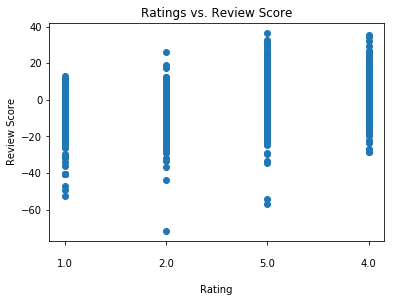

In [98]:
x = stripped_ratings
y = formatted_reviews

plt.scatter(x, y)
plt.title('Ratings vs. Review Score')
plt.xlabel('Rating')
plt.ylabel('Review Score')
plt.savefig('Resources/scatter.png', bbox_inches='tight')